In [15]:
import sklearn
import numpy as np
import os

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

import pandas as pd

%config IPCompleter.greedy=True

PLOT_PREFIX = "faces_"
GLOBAL_FIG_COUNTER = 0

FACES_DATA_PATH = "faces/HOG_face_data.csv"

In [16]:
def load_faces_data(faces_path=FACES_DATA_PATH):
    return pd.read_csv(faces_path)

In [17]:
faces = load_faces_data()
NORMALIZE = False
print(faces.head())
faces.info()

                       filename  age  sex  race  Feature_0  Feature_1  \
0  26_0_0_20170117152636524.jpg   26    0     0   0.464169   0.344516   
1  36_1_1_20170116014023777.jpg   36    1     1   0.491273   0.491273   
2  45_0_3_20170119184153479.jpg   45    0     3   0.562263   0.562263   
3   9_0_0_20170110215523228.jpg    9    0     0   0.410931   0.172130   
4  63_0_1_20170120223325931.jpg   63    0     1   0.369374   0.211991   

   Feature_2  Feature_3  Feature_4  Feature_5  ...  Feature_502  Feature_503  \
0   0.177940   0.309544   0.292331   0.148370  ...     0.107880     0.067362   
1   0.395314   0.150186   0.219912   0.179820  ...     0.058250     0.095871   
2   0.098885   0.042662   0.142214   0.054771  ...     0.070570     0.407470   
3   0.410931   0.193456   0.410931   0.307072  ...     0.327200     0.462338   
4   0.369374   0.369374   0.369374   0.369374  ...     0.080799     0.066893   

   Feature_504  Feature_505  Feature_506  Feature_507  Feature_508  \
0     0.39

In [18]:
faces.info()
faces.describe()
print(faces.shape)
faces = faces.sample(512*12)



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23708 entries, 0 to 23707
Columns: 516 entries, filename to Feature_511
dtypes: float64(512), int64(3), object(1)
memory usage: 93.3+ MB
(23708, 516)


In [19]:
# %matplotlib inline
# import matplotlib.pyplot as plt
# import seaborn as sns
# # plot code from https://stackoverflow.com/questions/45883598/pandas-histogram-df-hist-group-by
# male_female = {0: "male", 1: "female"}
# faces_copy = faces.copy()
# faces_copy["sex"].replace(male_female, inplace=True)

# df2 = pd.melt(faces_copy, id_vars='sex', value_vars=faces_copy.columns[3:], value_name='value')

# bins=np.linspace(df2.value.min(), df2.value.max(), 50)
# g = sns.FacetGrid(df2, col="variable", hue="sex", palette={"male": "blue", "female": "red"}, col_wrap=10, sharex=False, sharey=False)
# g.map(sns.histplot, 'value', bins=30, label=['male', 'female'])
# for a in g.axes:
#     a.legend()

# # Found at https://github.com/mwaskom/seaborn/issues/440
# plt.setp(g.fig.texts, text="")
# g.set_titles(row_template="{row_name}", col_template="{col_name}")
# plt.show()

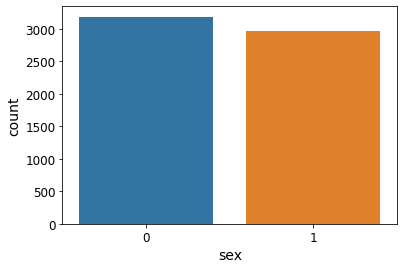

sex
0    0.518392
1    0.481608
Name: sex, dtype: float64


In [20]:
sns.countplot(x='sex', data=faces)
plt.show()
print(faces.groupby('sex')['sex'].apply(lambda x: x.count()/faces.shape[0]))

In [21]:
corr_matrix = faces.corr()
corr_matrix["sex"].sort_values(ascending=False)

sex            1.000000
Feature_342    0.246247
Feature_361    0.218390
Feature_96     0.216049
Feature_362    0.211203
                 ...   
Feature_185   -0.233367
Feature_366   -0.240246
Feature_338   -0.246232
Feature_14    -0.259225
Feature_337   -0.268421
Name: sex, Length: 515, dtype: float64

In [22]:
faces.describe()

,age,sex,race,Feature_0,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,...,Feature_502,Feature_503,Feature_504,Feature_505,Feature_506,Feature_507,Feature_508,Feature_509,Feature_510,Feature_511
count,6144.000000,6144.000000,6144.000000,6144.000000,6144.000000,6144.000000,6144.000000,6144.000000,6144.000000,6144.000000,...,6144.000000,6144.000000,6144.000000,6144.000000,6144.000000,6144.000000,6144.000000,6144.000000,6144.000000,6144.000000
mean,33.287760,0.481608,1.268555,0.491941,0.397986,0.292167,0.191186,0.258546,0.171381,0.260419,...,0.273700,0.319197,0.404670,0.333496,0.306545,0.245064,0.306328,0.270832,0.318455,0.330734
std,19.890467,0.499702,1.355612,0.127026,0.144111,0.149749,0.141296,0.138548,0.121654,0.139344,...,0.146138,0.163387,0.147653,0.155565,0.148480,0.153191,0.162557,0.154180,0.144925,0.164039
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,0.000000,0.000000,0.400723,0.353553,0.158492,0.067968,0.134962,0.068848,0.140069,...,0.142921,0.182773,0.353553,0.214729,0.183560,0.109831,0.167564,0.136769,0.205521,0.204517
50%,29.000000,0.000000,1.000000,0.474787,0.409077,0.337669,0.158683,0.262817,0.144546,0.265512,...,0.290320,0.355574,0.404843,0.362905,0.353553,0.235474,0.353553,0.281820,0.357004,0.361289
75%,45.000000,1.000000,2.000000,0.568371,0.491884,0.405168,0.318514,0.370960,0.261979,0.372767,...,0.385146,0.432478,0.486333,0.434325,0.406037,0.364369,0.405423,0.379210,0.415778,0.437986
max,116.000000,1.000000,4.000000,1.000000,0.864271,0.676119,0.808113,1.000000,0.642275,0.642275,...,0.689653,0.867144,1.000000,0.861506,0.941159,0.785576,1.000000,0.877545,0.828876,0.927565


In [23]:
# Model Testing
from sklearn.pipeline import Pipeline
from sklearn import svm, tree
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
import xgboost as xgb
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn import metrics
from sklearn.model_selection import KFold, cross_val_score
import time

In [24]:
# Test Train Split
labels = faces["sex"].copy()
features = faces.drop(["age", "sex", "race"], axis=1)

X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(features, labels, test_size=0.2, random_state=42)
print(len(X_train), len(X_test), len(y_train), len(y_test))

filenames_train = X_train['filename'].copy()
filenames_test = X_test['filename'].copy()
X_train.drop("filename", axis=1, inplace=True)
X_test.drop("filename", axis=1, inplace=True)

4915 1229 4915 1229


/home/richard/.virtualenvs/computervision/lib/python3.8/site-packages/pandas/core/frame.py:4160: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [25]:
from sklearn import preprocessing

NORMALIZE = True
MIN_MAX = False
if NORMALIZE:
    if MIN_MAX:
        scaler = preprocessing.MinMaxScaler()
    else:
        scaler = preprocessing.StandardScaler()

    X_train_scaled = scaler.fit_transform(X_train.values)
    X_train = pd.DataFrame(X_train_scaled, columns = X_train.columns)
    
    X_test_scaled = scaler.fit_transform(X_test.values)
    X_test = pd.DataFrame(X_test_scaled, columns = X_test.columns)

print(faces.columns[2:-1])

Index(['sex', 'race', 'Feature_0', 'Feature_1', 'Feature_2', 'Feature_3',
       'Feature_4', 'Feature_5', 'Feature_6', 'Feature_7',
       ...
       'Feature_501', 'Feature_502', 'Feature_503', 'Feature_504',
       'Feature_505', 'Feature_506', 'Feature_507', 'Feature_508',
       'Feature_509', 'Feature_510'],
      dtype='object', length=513)


In [26]:
KFold_Score = pd.DataFrame()
classifiers = ['Linear SVM', 'NeuralNetwork', 'DecisionTree', 'KNeighborsClassifier', 'RandomForest']
models = [svm.SVC(kernel='rbf'),
          MLPClassifier(random_state=0),
          tree.DecisionTreeClassifier(random_state=0),
          KNeighborsClassifier(n_neighbors=20),
          RandomForestClassifier(n_estimators=200, random_state=0)
          ]

start_time = time.time()
increment_time = start_time
j = 0
for i in models:
    print("Running: {}".format(classifiers[j]))
    model = i
    cv = KFold(n_splits=5, random_state=0, shuffle=True)
    KFold_Score[classifiers[j]] = (cross_val_score(model, X_train, np.ravel(y_train), scoring='accuracy', cv=cv))
    j = j+1
    print("Time Taken: {}".format(time.time() - increment_time))
    increment_time = time.time()
print("Final Time elapsed {}".format(time.time() - start_time))

Running: Linear SVM
Time Taken: 29.496915817260742
Running: NeuralNetwork
Time Taken: 42.07804298400879
Running: DecisionTree
Time Taken: 9.361491441726685
Running: KNeighborsClassifier
Time Taken: 15.80264687538147
Running: RandomForest
Time Taken: 44.22145628929138
Final Time elapsed 140.9614028930664


In [27]:
import IPython.display as disp

mean = pd.DataFrame(KFold_Score.mean(), index= classifiers)
KFold_Score_with_mean = pd.concat([KFold_Score,mean.T])
KFold_Score_with_mean.index=['Fold 1','Fold 2','Fold 3','Fold 4','Fold 5','Mean']
disp.display(KFold_Score_with_mean.T.sort_values(by=['Mean'], ascending = False))

print("NORMALIZE {} MIN_MAX {}".format(NORMALIZE, MIN_MAX))
unique, frequency = np.unique(y_train, return_counts = True) 
print(frequency / len(y_train))

,Fold 1,Fold 2,Fold 3,Fold 4,Fold 5,Mean
Linear SVM,0.831129,0.848423,0.837233,0.836216,0.857579,0.842116
NeuralNetwork,0.820956,0.832146,0.817904,0.829095,0.834181,0.826857
RandomForest,0.784334,0.802645,0.806714,0.787386,0.802645,0.796745
KNeighborsClassifier,0.768057,0.762970,0.777213,0.765005,0.766022,0.767854
DecisionTree,0.650051,0.639878,0.655137,0.669379,0.656155,0.654120


NORMALIZE True MIN_MAX False
[0.51658189 0.48341811]


In [28]:
mean = pd.DataFrame(KFold_Score.mean(), index= classifiers)
KFold_Score = pd.concat([KFold_Score,mean.T])
KFold_Score.index=['Fold 1','Fold 2','Fold 3','Fold 4','Fold 5','Mean']
KFold_Score.T.sort_values(by=['Mean'], ascending = False)

unique, frequency = np.unique(y_train, return_counts = True) 
print(frequency / len(y_train))

[0.51658189 0.48341811]


In [16]:
linear_svm = svm.SVC(kernel='linear')

linear_svm.fit(X_train, y_train)

 

SVC(kernel='linear')

In [17]:
linear_svm.score(X_test, y_test)

0.8270771826233657

In [18]:
from sklearn.metrics import confusion_matrix

confusion_matrix(y_train, linear_svm.predict(X_train))

array([[8507, 1418],
       [1594, 7447]])

75_0_0_20170111202232554.jpg
(512,)
(18966,)
male


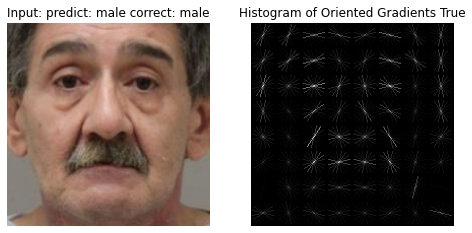

In [19]:
from skimage import exposure, color
from skimage.feature import hog
import random
import cv2
import os

sex_lookup = {0:"male", 1:"female"}

image_index = int(random.random() * len(filenames_train))
print(filenames_train[image_index])
bgr = cv2.imread(os.path.join("/media/richard/Data/CloudStation/Masters Degree/GATechOMSCS_CourseWork/CS7641-Machine_Learning/faces/UTKFace", filenames_train[image_index]))
rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
gray = color.rgb2gray(rgb)
        
fd, hog_image = hog(gray, orientations=8, pixels_per_cell=(25, 25),
                    cells_per_block=(1, 1), visualize=True, multichannel=False, feature_vector=True)

print(fd.shape)
print(y_train.shape)

predict = linear_svm.predict(fd.reshape(1, -1))[0]
correct = sex_lookup[y_train[image_index]]
print(correct)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(rgb, cmap=plt.cm.gray)
ax1.set_title('Input: predict: {} correct: {}'.format(sex_lookup[predict], correct))

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients {}'.format(sex_lookup[predict] == correct))
plt.show()

In [12]:
if False:
    os.environ["CUDA_VISIBLE_DEVICES"]="-1"
    import tensorflow as tf
else:
    os.environ["CUDA_VISIBLE_DEVICES"]="0"
    import tensorflow as tf
    physical_devices = tf.config.list_physical_devices('GPU') 
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV



In [13]:
def build_fn(optimizer, nodes_per_layer, number_layers):
    model = keras.Sequential()
    model.add(Dense(nodes_per_layer, input_dim=512, kernel_initializer="he_normal", activation="relu"))
    for i in range(number_layers):
        model.add(Dense(nodes_per_layer, kernel_initializer="he_normal", activation="relu"))
    model.add(Dense(1, kernel_initializer="he_normal", activation="sigmoid"))
    model.compile(
        loss="binary_crossentropy",
        optimizer=optimizer,
        metrics=[
            keras.metrics.Precision(name="precision"),
            keras.metrics.Recall(name="recall"),
            keras.metrics.AUC(name="auc"),
            keras.metrics.BinaryAccuracy(name="accuracy")
        ],
    )
    return model

In [41]:
def build_fn_2(optimizer, number_nodes, number_layers):
    nodes_per_layer = int(number_nodes/number_layers)
    model = keras.Sequential()
    model.add(Dense(nodes_per_layer, input_dim=512, kernel_initializer="he_normal", activation="relu"))
    for i in range(number_layers):
        model.add(Dense(nodes_per_layer, kernel_initializer="he_normal", activation="relu"))
    model.add(Dense(1, kernel_initializer="he_normal", activation="sigmoid"))
    model.compile(
        loss="binary_crossentropy",
        optimizer=optimizer,
        metrics=[
            keras.metrics.Precision(name="precision"),
            keras.metrics.Recall(name="recall"),
            keras.metrics.AUC(name="auc"),
            keras.metrics.BinaryAccuracy(name="accuracy")
        ],
    )
    return model

In [14]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV

In [105]:
clf = MLPClassifier(solver='lbfgs', alpha=1e-5,
                    hidden_layer_sizes=(256, 128, 64, 32, 16, 8), random_state=1)

In [106]:
clf.fit(X_train, y_train)
print(clf.score(X_train, y_train))
print(clf.score(X_test, y_test))

/home/richard/.virtualenvs/computervision/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


0.845407571443636
0.827498945592577


In [101]:
clf.score(X_train, y_train)

0.832911525888432

In [35]:
opt = keras.optimizers.Adam(learning_rate=0.01)
clf = KerasClassifier(build_fn, optimizer="adam", epochs=125, batch_size=256, number_nodes=4, number_layers=4)
clf.fit(X_train, y_train)
clf.score(X_train, y_train)


Epoch 1/125
75/75 [==============================] - 1s 3ms/step - loss: 0.6796 - precision: 0.5735 - recall: 0.5532 - auc: 0.6358 - accuracy: 0.5943
Epoch 2/125
75/75 [==============================] - 0s 3ms/step - loss: 0.5463 - precision: 0.7592 - recall: 0.7340 - auc: 0.8289 - accuracy: 0.7605
Epoch 3/125
75/75 [==============================] - 0s 3ms/step - loss: 0.4593 - precision: 0.8040 - recall: 0.7463 - auc: 0.8696 - accuracy: 0.7900
Epoch 4/125
75/75 [==============================] - 0s 3ms/step - loss: 0.4360 - precision: 0.8008 - recall: 0.7753 - auc: 0.8818 - accuracy: 0.8014
Epoch 5/125
75/75 [==============================] - 0s 3ms/step - loss: 0.4177 - precision: 0.8143 - recall: 0.7909 - auc: 0.8912 - accuracy: 0.8135
Epoch 6/125
75/75 [==============================] - 0s 3ms/step - loss: 0.4156 - precision: 0.8144 - recall: 0.7805 - auc: 0.8925 - accuracy: 0.8124
Epoch 7/125
75/75 [==============================] - 0s 3ms/step - loss: 0.4094 - precision: 0.8106 

75/75 [==============================] - 0s 3ms/step - loss: 0.3463 - precision: 0.8525 - recall: 0.7927 - auc: 0.9249 - accuracy: 0.8360
Epoch 110/125
75/75 [==============================] - 0s 3ms/step - loss: 0.3505 - precision: 0.8517 - recall: 0.7911 - auc: 0.9233 - accuracy: 0.8342
Epoch 111/125
75/75 [==============================] - 0s 3ms/step - loss: 0.3535 - precision: 0.8567 - recall: 0.7881 - auc: 0.9219 - accuracy: 0.8352
Epoch 112/125
75/75 [==============================] - 0s 3ms/step - loss: 0.3519 - precision: 0.8496 - recall: 0.8035 - auc: 0.9230 - accuracy: 0.8377
Epoch 113/125
75/75 [==============================] - 0s 3ms/step - loss: 0.3464 - precision: 0.8476 - recall: 0.7937 - auc: 0.9247 - accuracy: 0.8367
Epoch 114/125
75/75 [==============================] - 0s 3ms/step - loss: 0.3503 - precision: 0.8560 - recall: 0.7969 - auc: 0.9233 - accuracy: 0.8396
Epoch 115/125
75/75 [==============================] - 0s 3ms/step - loss: 0.3741 - precision: 0.8278 

0.8148792386054993

In [46]:
from sklearn.model_selection import GridSearchCV
number_nodes = [i for i in range(34, 60, 4)]
number_layers = [i for i in range(2, 35, 4)]
print(number_nodes)
print(number_layers)

parameters = {'number_nodes': number_nodes, 'number_layers': number_layers}


[34, 38, 42, 46, 50, 54, 58]
[2, 6, 10, 14, 18, 22, 26, 30, 34]


In [23]:
def fit_model_P(X_train, y_train, n_batch, n_epochs=1000):
    # define model
    clf = KerasClassifier(build_fn, optimizer="adam", epochs=n_epochs, batch_size=n_batch, number_nodes=4, number_layers=4)
    # fit model
    history = clf.fit(X_train, y_train)
    return {"batch_size": n_batch, "history": history}

In [24]:
from multiprocessing.pool import ThreadPool
pool = ThreadPool(5)

batch_sizes = [4, 8, 16, 32, 64, 128, 256, 450]

results = []
for batch in batch_sizes:
    results.append(pool.apply_async(fit_model_P, args=(X_train, y_train, batch)))

pool.close()
pool.join()

Epoch 1/1000Epoch 1/1000

Epoch 1/1000
Epoch 1/1000Epoch 1/1000

297/297 [==============================] - 10s 15ms/step - loss: 0.6929 - precision: 0.5039 - recall: 0.1764 - auc: 0.5009 - accuracy: 0.5241.5331==>...........................] - ETA: 31s - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4905 - accuracy: 0.53343342 - precision: 0.3636 - recall: 0.0349 - auc: 0.5000 - - ETA: 16s - loss: 0.6945 - precision: 0.5098 - recall: 0.7186 - auc: 0.4966 - accuracy: 0.  53/2371 [..............................] - ETA: 31s - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4960 - accura - ETA: 15s - loss:  97/1186 [=>............................] - ETA: 15s - loss: 0.6938 - precision: 0.5118 - recall: 0.5784 - a - ETA: 1:04 - loss: 0.6969 - precision: 0.3614 - recall: 0.0811 - auc: 0.5021 - accuracy: 0.483 - ETA: 2s - loss: 0.6934 - precision: 0.5058 - recall: 0.3364 - auc: 0.4993 - accuracy: 0 - ETA: 14s - loss: 0.6935 - precision: 0.5153 - recall

297/297 [==============================] - 4s 14ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4936 - accuracy: 0.51841186 [==============>...............] - ETA: 8s - loss: 0.4498 - precision: 0.8178 - recall: 0.7593 - auc: 0.8759 - accuracy: 0.80
Epoch 11/1000
593/593 [==============================] - 9s 15ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4941 - accuracy: 0.52120e+00 - auc: 0.4933 - accuracy: 0.5363000e+00 - recall: 0.0000e+00 - auc: 0.4943 - accuracy: 0 - ETA: 2s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4943 - accuracy: 0.5199 981/1186 [=======================>......] - ETA: 3s - loss: 0.4465 - precision: 0.8184 - recall: 0.7618 - auc: 0.8761 - accuracy: 03400/4742 [====================>.........] - ETA: 19s - loss: 0.6088 - precision: 0.6899 - recall: 0.4593 - auc: 0.7229 - accuracy:  - ETA: 3s - loss: 0.6931 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0

297/297 [==============================] - 4s 15ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4899 - accuracy: 0.5249e+00 - auc: 0.4940 - accuracy: 0.53830.0000e+00 - recall: 0.0000e+00 - auc: 0.4871 - accuracy: 0.5275+00 - auc: 0.4859 - accuracy:   5/297 [..............................] - ETA: 4s - loss: 0.6849 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accur 652/1186 [===============>..............] - ETA: 8s - loss: 0.4275 - precision: 0.8140 - recall: 0.768 677/1186 [================>.............] - ETA: 4s - loss: 0.6899 - precision: 0.0000e+00 - recall: 0.0 - ETA: 25s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc:  738/2371 [========>.....................] - ETA: 25s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4862 - accuracy: 0. 84/297 [=======>......................] - ETA: 3s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4853 - accuracy: 0.5298 - - ETA: 5s - lo

593/593 [==============================] - 8s 13ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4991 - accuracy: 0.5314====================>.........] - ETA: 8s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.5189000e+00 - recall: 0.0000e+00 - auc: 0.4984 - accurac 34/297 [==>...........................] - ETA: 3s - loss: 91/297 [========>.....................] - ETA: 2s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.4093/4742 [========================>.....] - ETA: 9s - loss: 0.4153 - precision: 0. - ETA: 9s - loss: 0.4064 - precision: 0.8232 - recall: 0.7793 - auc: 0. 526/1186 [============>.................] - ETA: 8s - loss: 0.4061 - precision: 0.8232 - reca
Epoch 16/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.5232A: 1s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.

297/297 [==============================] - 4s 13ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4976 - accuracy: 0.5222/593 [===================>..........] - ETA: 2s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - accuracy: 0.5291.............] - ETA: 36s - loss: 0.4091 - precision: 0.8153  - ETA: 4s - loss: 0.6914 - precision: 0.000297/593 [==============>...............] - ETA: 3s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4973 - accuracy: 0 - ETA: 3s - loss: 0.6919 - precision: 0.0000e+00 - recall - ETA: 3s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.492143/2371 [==========================>...] - ETA: 3s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4945 - accurac - ETA: 3s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0380/593 [==================>...........] - ETA: 2s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0
Epoch 40/100

4742/4742 [==============================] - 64s 13ms/step - loss: 0.4092 - precision: 0.8157 - recall: 0.7800 - auc: 0.8945 - accuracy: 0.812490- ETA: 3s - loss: 0.6963 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy:1020/1186 [========================>.....] - ETA: 2s - loss: 0.3923 - precision: 0.8273 - recall: 0.7975 - auc: 0.9040 - accuracy: 0 22/297 [=>............................] - ETA: 3s - loss: 0.6944 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 4712/4742 [============================>. - ETA: 0s - loss: 0.4092 - precision: 0.8157 - recall: 0.7800 - auc: 0.8945 - accuracy:  38/297 [==>...........................] - ETA: 3s - loss: 0.6933 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0. - ETA: 0s - loss: 0.4092 - precision: 0.8157 - recall: 0.7800 - auc: 0.8945 - a4738/4742 [============================>.] - ETA: 0s - loss: 0.4092 - precision: 0.8157 - recall: 0.7800 - auc: 0.8945 - accuracy: 0
Epoch 4/1

297/297 [==============================] - 4s 13ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5005 - accuracy: 0.5217- loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e273/297 [==========================>...] - ETA: 14s - loss: 0.3408 - precision: 0.8471 - recall: 0.8288 - 160/593 [=======>......................] - ETA: 5s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accura
Epoch 57/1000
297/297 [==============================] - 4s 14ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4964 - accuracy: 0.5205==========================>..] - ETA: 0s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 0.5204ecision: 0.8130 - recall: 0.7869 - auc: 0.8987 - accuracy: 0.81 - ETA: 3s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000294/297 [============================>.] - ETA: 0s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - a

297/297 [==============================] - 4s 14ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4911 - accuracy: 0.52130e+00 - auc: 0.4983 - accuracy: 0.5231.0000e+00 - recall: 0.0000e+00 - auc: 0.4984 - accuracy: 0.523100 - auc: 0.4989 - accuracy: 0.5249s - loss: 0.3901 - precision: 0.8269 - recall: 0.81071105/4742 [=====>........................] - ETA: 47s - loss: 0.3804 - precision: 0.8216 - recal - ETA: 1s - loss: 0 - ETA: 47s - loss: 0.3808 - precision: 0.8220 - recall: 0.7820 - auc: 0.9077 - accuracy: - ETA: 1s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - 
Epoch 68/1000
593/593 [==============================] - 8s 13ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4980 - accuracy: 0.52442371 [=============>................]0.8222 - recall: 0.7824 - auc: 0.9075 - accuracy: 0.8227: 0.801050/1186 [=========================>....] - ETA: 1s - loss: 0.3881 - precision: 0.8286 - recall: 0.8094 - auc:  - ETA: 46s

297/297 [==============================] - 4s 14ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4964 - accuracy: 0.5206e+00 - auc: 0.4963 - accuracy: 0.5194- ETA: 1s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 0.51833775 - precision: 0.8337 - recall: 0.8148 - auc: 0.9121 - accuracy: 0 783/2371 [========>.....................] - ETA: 21s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5034 - accuracy: 0.5237233/593 [==========>................... 800/1186 [===================>...... - ETA: 5s - loss: 0.3780 - precision: 0.8334 - recall: 0.8142 828/1186 [===================>..........] - ETA: 4s - loss: 0.3781 - precision: 0.8333 - recall: 0.8140 - auc: 0.9118 - accu 836/1186 [====================>.........] - ETA: 4s - loss: 0.3781 - preci166/297 [===============>..............] - ETA: 1s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4965 - accuracy:  - ETA: 1s - loss: 0.69

297/297 [==============================] - 4s 13ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4984 - accuracy: 0.5200A: 18s - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4973 - accuracy: 0.5129.......................] - ETA: 51s - loss: 0.3844 - precision: 0.8072 - recall: 0.8059 - auc: 0.9066 - accu - ETA: 51s - loss: 0.3844 - precision: 0.8073 - recall: 0.8059 - auc: 0 - ETA: 51s - loss: 0.3844 - precision: 0 - ETA: 20s - loss: 0.6930 - precision: 0.0000e+0375/593 [=================>............] - ETA: 3s - loss: 0.6917 - precision: 0.0000e+00 - recall:1026/2371 [===========>..................] - ETA: 18s - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4973 - accuracy: 0.5128 - ETA: 1s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4950 - accu1034/2371 [============>.................] - ETA: 18s - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4972 - accuracy: 0.51291

593/593 [==============================] - 8s 13ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.5241 ETA: 14s - loss: 0.3829 - precision: 0.8194 - recall: 0.7991 - auc: 0.9075 - ac
Epoch 47/1000
1186/1186 [==============================] - 15s 13ms/step - loss: 0.3745 - precision: 0.8344 - recall: 0.8141 - auc: 0.9133 - accuracy: 0.83437 [============>.................] - ETA: 2s - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.51246/2371 [==============>...............] - ETA: 14s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.52
Epoch 24/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4979 - accuracy: 0.5196 11s - loss: 
Epoch 93/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4999 - accuracy: 0.5

297/297 [==============================] - 4s 13ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.518800 - auc: 0.5000 - accuracy: 0.517179====>....................] 555/1186 [=============>................] - ETA: 8s - loss: 0.3631 - precision: 0.8286 - recall: 0.8167 - auc: 0.9182 - 113/297 [==========>...................] - ETA: 2s - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.145/297 [=============>................] - ETA: 1s - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0 - ETA: 6s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - accuracy: 0.5201 - ETA: 1s - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - - ETA: 7s - loss: 0.3648 - precision: 0.8284 - recall: 0.8 - ETA: 5s - loss: 0.6933 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4823 - accur209/297 [====================>.........] - ETA: 1s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.

297/297 [==============================] - 4s 13ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5307000e+00 - auc: 0.4996 - accuracy: 0.530657s - loss: 0.3980 - precision: 0.8164 - recall: 0.8010 - auc: 0.9017 - accuracy: 0.8281on: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5 115/2371 [>.............................] - ETA: 28s - loss: 0.6915 - precision  62/1186 [>.............................] - ETA: 14s - loss: 0.3554 - precision: 0.8631 - recall: 0.8151 - auc: 0.9231 - accuracy:  - ETA: 14s - loss: 0.3559 - precision: 0.8625 - recall: 0.8152 - auc: 0.9226 - accuracy: 0.844 - ETA: 4s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - a - ETA: 14s - loss: 0.3576 - precision: 0.8602 - recall: 0.8160 - auc: 0.9214 271/593 [============>.................] - ETA: 4s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 -  - ETA: 3s - loss: 0.6926 - precision: 0.0000e+00  241/2371 [==>...........................] - ETA: 27s - 

593/593 [==============================] - 8s 13ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4983 - accuracy: 0.5258 auc: 0.9098 - accuracy: 0.8305.....] - ETA: 2s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.00 - ETA: 18s - loss: 0.6918 - precision: 0.0000e+00 - r 962/2371 [===========>..................] - ETA: 17s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4886 - accuracy: 0.52693556/4742 [=====================>........] - ETA: 15s - loss: 0.3821 - precision: 0.8232 - recall: 0.8135 - auc: 0.9085 - acc472/593 [======================>.......] - ETA: 1s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4987 - accur3573/4742 [=====================>...3636/4742 [======================>.......] - ETA: 14s - loss: 0.3821 - precision: 0.8230 - recall: 0.8135 - auc: 0.9085 - accura - ETA: 1s - loss: 0.6917 - precision: 0.0000e+00 - rec205/297 [===================>..........] 979/1186 [=======================>

297/297 [==============================] - 4s 13ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4987 - accuracy: 0.52214742 [=====>........................ - ETA: 6s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4964 - accuracy:  24/297 [=>............................] - ETA: 3s - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: - ETA: 6s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - au - ETA: 3s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4950 - accuracy: 0.5299/593 [==============>...............] - ETA: 3s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4950 - a225/297 [=====================>........] - ETA: 0s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4991 - - ETA: 6s - loss: 0.3681 - precision: 0.8398 - recall: 0.8104 - auc: 0.9160 - accuracy - ETA: 46s - loss: 0.3864 - precision: 0.8045 - recall: 0.8120 - a

1186/1186 [==============================] - 15s 13ms/step - loss: 0.3735 - precision: 0.8281 - recall: 0.8175 - auc: 0.9133 - accuracy: 0.8316167 ETA: 11s - loss: 0.3788 - precision: 0.8134 - recall: 0.8077 - auc: 0.9097 160/593 [=======>......................] - ETA: 5s - loss - ETA: 10s - loss: 0.3787 - precision: 0.8135 - recall: 0.8077 - auc: 0.9097 - accuracy
Epoch 36/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4960 - accuracy: 0.524797 [=========================>....].0000e+00 - - ETA: 0s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4960 - accuracy: 0. - ETA: 0s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 
Epoch 142/100
297/297 [==============================] - 4s 12ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4960 - accuracy: 0.522793 [===============>..............] - ETA: 3s - loss: 0.6923 - precision: 0.0000e+00 - reca

593/593 [==============================] - 8s 13ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4995 - accuracy: 0.52412371 [==========================>...] - ETA: 1s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4959 - accuracy: 0.5229652 - precision: 0.8361 - recall: 0.8158 - auc: 0.9173 - a 799/1186 [===================>..........] - ETA: 4s - loss: 0.3654 - precision: 0.8360 - recall: 0.8157 - 821/1186 [===================>..........] - ETA: 4s - loss: 0.3657 - precision: - ETA: 0s - loss: 0.6920 - precision: 0.0000e+00 - recall: 
Epoch 77/1000
2371/2371 [==============================] - 30s 13ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4960 - accuracy: 0.5229 - loss: 0.3668  - ETA: 0s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4960 - accuracy: 0.52551/4742 [===============>..............] - ETA: 27s - loss: 0.3809 - precision: 0.8032 - recall: 0.8041 - auc: 0214/297 [===

4742/4742 [==============================] - 60s 13ms/step - loss: 0.3775 - precision: 0.8084 - recall: 0.8099 - auc: 0.9096 - accuracy: 0.820680- auc: 0.9095 - accuracy: 0.8206=====>.]3s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4971 - accuracy: 0.5182222/593 [==========>...................] - ETA: 4s - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e - ETA: 2s - loss: 0.3776 - precision: 0.8081 - recall: 0.8094 - auc: 0.9095 - accura1950/2371 [=======================>......] - ETA: 5s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4947 - accuracy: 0. - ETA: 5s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0 - ETA: 3s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4984 - accuracy: 0.313/593 [==============>...............] - ETA: 3s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4984 - a327/593 [===============>..............] - ETA: 3s - loss: 0.6917 - precision: 0.0000e+00 - recal

1186/1186 [==============================] - 15s 13ms/step - loss: 0.3762 - precision: 0.8363 - recall: 0.8213 - auc: 0.9126 - accuracy: 0.83604198/593 [===========>..................] - ETA: 4s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - au -  - ETA: 0s - loss: 0.3762 - precision: 0.8363 - recall: 0.8213 - auc: 0.9125 - accuracy: 0.
Epoch 43/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4992 - accuracy: 0.5214A: 13s - loss: 0.3827 - precision: 0.8349 - recall: 0.8033 - auc: 0.9082 - accuracy: 0.83============>.................] - ETA: 2s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5193ll: 0.000 - ETA: 2s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4938 - accuracy: 0.5235 - ETA: 23s - loss: 0.3684 - precision: 0.8174 - recall: 0.8018 - 303/2371 [==>...........................] - ETA: 26s - loss: 0.6927 - precision: 0.

297/297 [==============================] - 4s 13ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4988 - accuracy: 0.5235e+00 - auc: 0.5000 - accuracy: 0.52830000e+00 - recall: 0.0000e+00 - auc: 0.4972  - ETA: 15s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - au - ETA: 2s - loss: 0.6919 - prec1071/1186 [==========================>...] - ETA: 1s - loss: 0.3726 - precision: 0.8342 - recall: 0.8087 - auc: 0.9138 - accuracy: 0.8328 - ETA: 40s - loss: 0.3624 - precision: 0 - ETA: 0s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4988 - accura1117/1186 [===========================>..] - ETA: 0s - loss: 0.3726 - precision: 0.8341 - recall: 0.8089 - auc: 0.9138 - accuracy: 
Epoch 180/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 181/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6919 - precisio

4742/4742 [==============================] - 59s 13ms/step - loss: 0.3690 - precision: 0.8101 - recall: 0.8214 - auc: 0.9144 - accuracy: 0.824588 ETA: 1s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4984 - accuracy: 0.5220.0000e+00 - auc: 0.4984 - accuracy: 0.5220- recall: 0.0000e+00 - auc: 0.4971 - accuracy: 0.1994/2371 [========================>.....] - ETA: 4s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.497 - ETA: 1s - loss: 0.3689 - precision: 0.8101 - recall: 0.8213 - auc: 0.9144 - accuracy: 0.82411/593 [===================>..........] - ETA: 2s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.52192017/2371 [========================>..... - ETA: 4s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4971 - accuracy: 0.54673/4742 [============================>.] - ETA: 0s - loss: 0.368
Epoch 13/1000
593/593 [==============================] - 7s 12ms/step - loss: 0.6922 - precisi

1186/1186 [==============================] - 15s 13ms/step - loss: 0.3752 - precision: 0.8334 - recall: 0.8145 - auc: 0.9123 - accuracy: 0.8340118419/593 [====================>.........]0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accur - ETA: 0s - loss: 0.3753 - precision: 0.8336 - recall: 0.8145 - auc: 0.9123 - accura - ETA: 2s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4941 - accuracy: 0.52880/4742 [=================>............] - ETA: 23s - loss: 0.3688 - precision: 0.8166 - recall: 0.8368 - auc: 0.9150 - accu - ETA: 2s - loss: 0.6924 - precis
Epoch 51/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237A: 13s - loss: 0.3612 - precision: 0.8335 - recall: 0.8231 - auc: 0.9193 - a - ETA: 13s - loss: 0.3615 - precision: 0.8329 - recall: 0.8223 - auc: 0.9192 - accuracy - ETA: 13s - loss: 0.3616 - precision: 0.8327 - recall: 0.8219 - auc: 0.9191 - accuracy: 0

297/297 [==============================] - 4s 13ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4990 - accuracy: 0.522935/4742 [====>.........................]- recall: 0.0000e+00 - auc: 0.4991 - accuracy: 0.5161cision: 0.0000e+00 - recal 565/2371 [======>.......................] - ETA: 23s - loss: 0.6909 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.499 900/4742 [====>.........................] - ETA: 48s - loss: 0.3528 - precision: 0.8170 - recall: 0.8425 - auc: 0.9220 - acc - ETA: 2s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+0 342/1186 [=======>......................] - ETA: 10s - loss: 0.3727 - precision: 0.8296 - recall: 0.8321 - auc: 0.9134 - accuracy: 0 - ETA: 48s - loss: 0.3534 - precision: 0.8166 - recall: 0.8422 - auc: 0.9217 - accuracy: 140/297 [=============>................] - ETA: 2s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4999 - accuracy: 0. - ETA: 48s - loss: 0.3535 - precision: 0.8165 - re

593/593 [==============================] - 8s 13ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4980 - accuracy: 0.5239========================>....] - ETA: 0s - loss: 0.6920 - precision: 0.0000e+00 - re  41/1186 [>.............................] - ETA: 15s - loss: 0.4087 - precision: 0.8381 - recall: 0589/593 [============================>.] - ETA: 0s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - accuracy: 
Epoch 112/1000
4742/4742 [==============================] - 60s 13ms/step - loss: 0.3633 - precision: 0.8135 - recall: 0.8313 - auc: 0.9170 - accuracy: 0.827865- ETA: 3s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - acc
Epoch 15/1000
593/593 [==============================] - 7s 13ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - accuracy: 0.52132098/2371 [=========================>....] - ETA: 3s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc

297/297 [==============================] - 4s 13ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4908 - accuracy: 0.5205ETA: 8s - loss: 0.3706 - precision: 0.8376 - recall: 0.8304 - auc: 0.9149 - accuracy: 0.8408.................] - ETA: 2s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4979 - accu - ETA: 7s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4957 - accuracy: 0.5 324/1186 [=======>......................] - ETA: 10s - loss: 0.3691 - precision: 224/297 [=====================>........] - ETA: 0s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4914 - accuracy - ETA: 31s - loss: 0.3745 - precision: 0.8125 - recall: 0.8254 - auc: 0.9118 - accura1915/2371 [=======================>......] - ETA: 5s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4961 - accuracy - ETA: 0s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4910 - accuracy: 0.511924/2371 

4742/4742 [==============================] - 60s 13ms/step - loss: 0.3721 - precision: 0.8116 - recall: 0.8256 - auc: 0.9129 - accuracy: 0.824961- auc: 0.9127 - accuracy: 0.8248====>..].] - ETA: 12s - loss: 0.3811 - precision: 0.8419 - recall: 0.7900 - auc: 0.9105 - accuracy: - ETA: 3s - loss: 0.3726 - precision: 0.8114 - recall: 0.8256 - ETA: 3s - loss: 0.3726 - precision: 0.8114 - recall: 0.8256 - auc: 0.9127 - accuracy:  - ETA: 4s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+ 69/297 [=====>........................] - ETA: 2s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4939 - accur - ETA: 4s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5010 - accuracy: 0 - ETA: 3s - loss: 0.6926 - precision: 0.0 359/1186 [========>.....................] - ETA: 10s - loss: 0.3801 - precision: 0.8377 - recall: 0.7953 - auc - ETA: 1s - loss: 0.3724 - precision: 0.8115 - recall: 0.8256 - auc: 0.9128 - accuracy: 0.82358/593 [=================>..

297/297 [==============================] - 4s 13ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4905 - accuracy: 0.5226A: 28s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4992 - accuracy: 0.5266.0000e+00 - auc: 0.2867/4742 [=================>............] - ETA: 23s - loss: 0.3729 - precision1024/1186 [========================>.....] - ETA: 2s -232/297 [======================>.......] - ETA: 0s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - 135/2371 [>.............................] - ETA: 28s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0. 153/2371 [>.............................] - ETA: 28s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 3007/4742 [==================>........... - ETA: 21s - loss: 0.3726 - precision: 0.8127 - recall: 0.8071 - au
Epoch 248/1000
593/593 [==============================] - 8s 13ms/step - loss: 0.6915 - precision: 0.0000e+00 - rec

593/593 [==============================] - 8s 13ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4915 - accuracy: 0.5187 - loss: 0.3670 - precision: 0.8344 - recall: 0.8232 - auc: 0.9164 - accuracy: 0.8375l: 0.8235 - auc: 0.9165 - accuracy: 0.83770.83156 [=======================>......] - ETA: 2s - loss: 0.3665 - precision: 0.8349 - recall: 0.8241 - au399/593 [===================>..........] - ETA: 2s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0. 998/1186 [========================>.....]416/593 [====================>.........] - ETA: 2s - loss: 0.3666 - precision: 0.8348 - recall: 0.8239 - auc: 0.9166 - accuracy: 0.8379 - ETA: 2s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.491228/2371 [==============>...............] - ETA: 14s - loss: 0.6908 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.496149/297 [==============>...............] - ETA: 1s - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - 

593/593 [==============================] - 8s 13ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.520700 - auc: 0.4930 - accuracy: 0.5251...] - ETA: 8s - loss: 0.3575 - precision: 0.8160 - recall: 0.8213 - auc: 0.9191 - accuracy:  - ETA: 8s - loss: 0.3576 - precision: 0.8160 - recall: 0.8213 - auc: 0.9191 - accuracy: 0.84066/4742 [========================>.....] 49/297 [===>..........................] - ETA: 3s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4945 -4077/4742 [========================>.....] - ET - ETA: 1s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accurac - ETA: 2s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4931 - accuracy: 0.144/297 [=============>................] - ETA: 2s - loss: 0.6919 - precision: 0.0000e+00 -  - ETA: 1s - loss: 0.3699 - precision: 0.8313 - recall: 0.8238 -538/593 [==========================>...] - ETA: 0s - loss: 0.6924 - 

297/297 [==============================] - 4s 13ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4998 - accuracy: 0.5260A: 0s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4999 - accuracy: 0.5261.0000e+00 - auc: 0.4936 - accuracy: 0 - ETA: 0s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0
Epoch 278/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5002 - accuracy: 0.5240 auc: 0.9171 - accuracy: 0.8396.....] - ETA: 26s - loss: 0.3661 - precision: 0.8112 - recall: 0.8147 - auc: 0.9149 - accuracy: - ETA: 2s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4937 - accuracy: - ETA: 5s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4913 - accurac142/297 [=============>................] - ETA: 2s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy:  744/1186 [=================>........

297/297 [==============================] - 4s 13ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4996 - accuracy: 0.5266000e+00 - auc: 0.5000 - accuracy: 0.5111377/593 [==================>...........] - ETA: 11s - loss: 0.3679 - precision: 0.8310 - recall: 0.8212 - auc: 0.9160 - accuracy: 0.8358n: 0.8309 - recall: 0.8242 - auc: 0.9162 - accurac 477/2371 [=====>............. 205/1186 [====>......................... - ETA: 12s - loss: 0.3679 - precision: 0.8308 - recall: 0.8235 - auc: 0.9160 - accuracy: 0.8 208/1186 [====>.........................] - ETA: 12s - loss: 0.3680 - precision: 0.8307 - recall: 0.8233 - auc: 0.9160 - accuracy: 0 - ETA: 12s - loss: 0.3681 - precision: 0.8307 - recall: 0.8231 - auc: 0.9 503/2371 [=====>........................] - E 289/1186 [======>.......................] - ETA: 11s - loss: 0.3681 - precision: 0.8308 - recall: 0.8212 - auc: 0.9159 - - ETA: 0s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - a

297/297 [==============================]  25/1186 [..............................] - ETA: 13s - loss: 0.3205 - precision: 0.8706 - recall: 0.8339 - auc: 0.9393 - accuracy: 0.8583....] - ETA: 10s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5003 - accuracy: 04449/4742 [===========================>..] - ETA: 3s - loss: 0.3593 - precision: 0.8215 - recall: 0.8221 - auc - 4s 13ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5279
Epoch 300/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4925 - accuracy: 0.5223: 1:10 - loss: 0.4253 - precision: 0.8791 - recall: 0.7367 - auc: 0.8573 - accuracy: 0.816294/297 [============================>.] - ETA: 0s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4925 - accuracy: 0.
Epoch 301/1000
593/593 [==============================] - 8s 13ms/step - loss: 0.6923 - precision: 0.0000e

297/297 [==============================] - 4s 13ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4994 - accuracy: 0.5248297 [=========================>....] - ETA: 0s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4996 - acc273/297 [==========================>...] - ETA: 0s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.000  58/1186 [>.............................] - ETA: 14s - loss: 0.3555 - precision: 0.8468 - recall: 0.8374 - auc: 0.9234 - accuracy: 0.849
Epoch 312/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4943 - accuracy: 0.52274742 [=====================>........] - ETA: 14s - loss: 0.3664 - precision: 0.8099 - recall: 0.8251 - auc: 0.9147 - accuracy: 0.8236222.5135 precision: 0.8096 - recall: 0.8249 - auc: 0.9145 - accuracy:  - ETA: 12s - loss: 0.3750 - precision: 0.8266 - recall: 0.8 563/2371 [======>.......................] - ETA: 22s - l

297/297 [==============================] - 4s 12ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4951 - accuracy: 0.52361186 [==========>...................] - ETA: 9s - loss: 0.3508 - precision: 0.8398 - r 847/2371 [=========>....................] - ETA: 19s - loss: 0.6931 - precision: 0121/593 [=====>........................] - ETA: 6s - loss: 0.6933 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4963 - ac - ETA: 18s - loss: 0.6931 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4920 - accuracy: - ETA: 8s - loss: 0.3540 - precision: 0.8388 -209/297 [====================>.........] - ETA: 1s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - au - ETA: 17s - lo286/297 [===========================>..] - ETA: 0s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4950 
Epoch 322/1000
1186/1186 [==============================] - 15s 13ms/step - loss: 0.3612 - precision: 0.8366 - recall: 0.8206 - auc: 0.9188 - accuracy: 0

593/593 [==============================] - 7s 12ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.5206 - loss: 0.3711 - precision: 0.8367 - recall: 0.8186 - auc: 0.9143 - accuracy: 0.8367call: 0 - ETA: 1s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+0 8
Epoch 170/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4961 - accuracy: 0.5278 ETA: 2s - loss: 0.3710 - precision: 0.8365 - recall: 0.8188 - auc: 0.9143 - accuracy: 0
Epoch 335/1000
1186/1186 [==============================] - 15s 13ms/step - loss: 0.3703 - precision: 0.8363 - recall: 0.8190 - auc: 0.9147 - accuracy: 0.8367198215/297 [====================>.........]95206/297 [===================>..........] - ETA: 1s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4928 - accuracy: 0.5276ecall: 0.8189 - auc: 0.9146 - accur - ETA: 25s - loss: 0.6925 - precision: 0.0000e+00 - re

1186/1186 [==============================] - 15s 13ms/step - loss: 0.3715 - precision: 0.8322 - recall: 0.8196 - auc: 0.9144 - accuracy: 0.83622793/1186 [============================>.] - ETA: 0s - loss: 0.3716 - precision: 0.8322 - recall: 0.8196 - auc: 0.9144 - accuracy: 0.8362......] - ETA: 18s - loss: 0.3605 - precision: 0.8453 - recall: 0.7794 - a3267/4742 [===================>..........] - ETA: 18s - loss: 0.3605 - precision: 0.8453 - recall: 0.7794 - auc: 0.9183 - accura 292/2371 [==>...........................] - ETA: 26s - loss: 0.1126/1186 [===========================>..] - ETA: 0s - loss: 0.3717 - precision: 0.8320 - recal1152/1186 [============================>.] - ETA: 0s - loss: 0.3717 - precision: 0.8321 - recall: 0.8196 - auc: 0.9143 - accuracy: 0.8362 - ETA: 25s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.5277164/297 [===============>..............] - ETA: 1s - loss: 0.6921 - precision: 0.0000e+00 - reca 406/2371 [====>......

2371/2371 [==============================] - 30s 13ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4943 - accuracy: 0.5269================>..........] - ETA: 2s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accu - ETA: 53s - loss: 0.3770 - precision: 0.7838 - recall: 0.8018 - auc: 0.9077 - accuracy - ETA: 0s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.000
Epoch 45/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4939 - accuracy: 0.5173 1/1186 [............................
Epoch 352/1000
593/593 [==============================] - 8s 13ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4976 - accuracy: 0.5258e+00 - auc: 0.4986 - accuracy: 0.5225 ETA: 21s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4952 - ac - ETA: 21s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4952 - 

297/297 [==============================] - 4s 13ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5004 - accuracy: 0.5312ETA: 23s - loss: 0.6931 - precision: 0.0000e+00 - rec329/593 [===============>..............] - ETA: 3s - loss: 0.6 - ETA: 22s - loss: 0.6931 - precision: 0.0000e+00 - rec - ETA: 22s - loss: 0.6931 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4964 - accuracy: 0.511
Epoch 360/1000
593/593 [==============================] - 7s 12ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4998 - accuracy: 0.5279auc: 0.9142 - accuracy: 0.8280: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accu - ETA: 2s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: - ETA: 13s - loss: 0.3640 - precision: 0.8020 - recall: 0.8 - ETA: 1s - loss: 0.6922 - precision: 0.0000e+00 - recall: - ETA: 1s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 
Epoch 183/1000
593/593 [============

297/297 [==============================] - 4s 13ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270=>..........................] - ETA: 6s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4961 - accuracy: 0.52ac1352/2371 [================>.............] - ETA: 12s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4930 - accuracy: 0.522 23/593 [>.............................] - ETA: 7s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc:1991/4742 [===========>..................] - ETA: 34s - loss: 0.3631 - precision: 0.7938 - recall: 0.8291 - auc: 0.9150 - accur - ETA: 34s - loss: 0.3630 - precision: 0.7938 - - ETA: 1
Epoch 371/1000
1186/1186 [==============================] - 15s 13ms/step - loss: 0.3705 - precision: 0.8372 - recall: 0.8204 - auc: 0.9146 - accuracy: 0.835027 00e+00 - auc: 0.4866 - accuracy: 0.5260000e+00 - recall: 0.0000e+00 - auc: 0.4878 - accuracy:1049/1186 [========

297/297 [==============================] - 4s 13ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4974 - accuracy: 0.5264- auc: 0.9118 - accuracy: 0.8276164 - ETA: 1s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.49 - ETA: 6s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc:  - ETA: 5s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - accurac - ETA: 57s - loss: 0.3370 - precision: 0.8658 - recall: 0.8085 - auc:  390/1186 [========>.....................] - ETA: 9s - loss: 0.3750 - precision:  - ETA: 5s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4999 - accurac - ETA: 9s - loss: 0.3744 - precision: 0.8200 - recall: 0.8155 - auc: 0.9122 - acc 450/1186 [==========>...................] - ETA: 9s - loss: 0.3744 - precision: 0.8201 - recall: 0.8155 - auc: 0.9123 - accuracy: 0.828
Epoch 381/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6915 - precision:

593/593 [==============================] - 7s 12ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4964 - accuracy: 0.51764742 [==================>...........] - ETA: 20s - loss: 0.3569 - precision: 0.8261 - recall: 0.8170 - auc:  - ETA: 4s - loss: 0.3747 - precision: 0.8410 - recall: 0.8223 -  90/297 [========>.....................] - ETA: 2s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.525
Epoch 198/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4999 - accuracy: 0.5257ETA: 25s - loss: 0.6908 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5010 - accuracy: 0.5377000e+00 - auc: 0.5001 - accuracy: 0.5059ss: 0.3569 - precision: 0.8258 - recall: 0.8172 - auc: 0.9198 - accuracy: 0.83141/4742 [==================>...........] - ETA: 20s - loss: 0.3570 - precision: 0.8258 - recall: 0.8172 - auc: 0.9198 - accur3149/4742 [=================

297/297 [==============================] - 4s 12ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4920 - accuracy: 0.5226e+00 - auc: 0.4921 - accuracy: 0.5225: 40s - loss: 0.3539 - precision: 0.8727 - recall: 0.7763 - auc: 0.9219 - accuracy: 0.83660.5223..............] - ETA: 6s - loss: 0.6921 - precision: 0.0000e+00  - ETA: 2s - loss: 0.6922 - prec 363/1186 [========>.....................] - ETA: 10s - loss: 0.3707 - precision: 0.8246 - recall: 0.8161 - auc: 0 - ETA: 5s - loss: 0.6921 - pre250/297 [========================>.....] - ETA: 0s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: - ETA: 17s - loss: 0.6905 - precision: 0.0000e+00 - recall: 0.0
Epoch 401/1000
593/593 [==============================] - 7s 12ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 0.5239TA: 5s - loss: 0.3672 - precision: 0.8291 - recall: 0.8174 - auc: 0.9161 - accuracy: 0.8339000e+00 - auc: 0.5000 - acc - ETA: 3s - l

593/593 [==============================] - 8s 13ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4975 - accuracy: 0.5246 [====================>.........] - ETA: 8s - loss: 0.  97/4742 [..............................] - ETA: 59s - loss: 0.3633 - precision: 0.8819 - recall: 0.7986 - auc: 0.9137 110/4742 [..............................] - ETA: 59s - loss: 0.3630 - precision: 0.8788 - recall: 0.79 130/4742 [..............................] - ETA: 1:00 - loss: 0.3614 - precision: 0.8756 - recall: 0.8010 - auc: 0.91847/2371 [======================>.......] - ETA: 6s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4899 - a
Epoch 209/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4959 - accuracy: 0.5323
Epoch 412/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4949 - accuracy: 0.5228 

1186/1186 [==============================] - 15s 13ms/step - loss: 0.3672 - precision: 0.8288 - recall: 0.8118 - auc: 0.9163 - accuracy: 0.8317276TA: 0s - loss: 0.3671 - precision: 0.828376/593 [==================>...........] - ETA: 2s - loss: 0.6929 - precision: 0.0000e+0
Epoch 107/1000
593/593 [==============================] - 8s 13ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4984 - accuracy: 0.51846/593 [====================>.........] - ETA: 2s - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4964 - a3584/4742 [=====================>........] - ETA: 14s - loss: 0.3614 - precision: 0.8507 - recall: 0.7825 - auc: 0.9176 3684/4742 [=================265/297 [=========================>....] - ETA: 0s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0
Epoch 215/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4994 - ac

593/593 [==============================] - 8s 13ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 0.5244s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4875 - accuracy: 0.5250 recall: 0.0000e+00 - auc: 0.4965 - accuracy: 01904/4742 [===========>..................] - ETA: 35s - loss: 0.3499 - precision: 0.8642 - recall: 0.7621 - auc: 0.9221 - a 673/1186 [================>.............] - ETA: 6s - loss: 0.361241/2371 [==============>...............] - ETA: 14s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4877 - accurac
Epoch 220/1000
1186/1186 [==============================] - 15s 13ms/step - loss: 0.3640 - precision: 0.8396 - recall: 0.8157 - auc: 0.9174 - accuracy: 0.838549ETA: 29s - loss: 0.3499 - precision: 0.8643 - recall: 0.1155/1186 [============================>.] - ETA: 0s - loss: 0.3640 - precision: 0.8397 - recall: 0.8156 - auc: 0.9175 - ac1163/1186 [============================>.] - E

593/593 [==============================] - 8s 13ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.5271 7s - loss: 0.6910 - precisio - ETA: 1s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4992 - accuracy
Epoch 225/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 0.5281 loss: 0.6785 - precision: 0.0000e+00 - recall: 0. - ETA: 7s - loss: 0.6900 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accur - ETA: 6s - lo - ETA: 57s - loss: 0.3579 - precision: 0.7888 - recall: 0.8475 - auc: 0.9178 - acc - ETA: 0s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4970 - accu1937/2371 [=======================>......] - ETA: 5s - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4905 - accuracy
Epoch 444/1000
  41/2371 [..............................] - ETA: 30s - loss: 0.6921 - precision

297/297 [==============================] - 4s 12ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4963 - accuracy: 0.517597/4742 [========================>.....]7 - recall: 0.8306 - auc: 0.9186 - accuracy: 0.8394call: 0.8516 255/1186 [=====>........................] - ETA: 12s - loss: 0.3596 - precision: 0.8347 - recall: 0.831 - ETA: 12s - loss: 0.3603 - precision: 0.8347 - recall: 0.8309 - auc: 0.9 - ETA: 9s - loss: 0.3492 - precision: 0.8084 - recall: 0.8516 - auc: 04006/4742 [========================>.....] - ETA: 9s - loss: 0.3492 - precision: 0.8084 - recall: 0.851 338/1186 [=======>......................] - ETA: 14093/4742 [========================>.....] - ETA: 8s - loss: 0.3493 - precision: 0.8084 - recall: 0.8514 - auc: 0.9229 - accuracy: 0 - E250/297 [========================>.....] - ETA: 0s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00281/297 [===========================>..] - ETA: 0s - loss: 0.6927 - precision: 0.0000e+00 - recall: 

593/593 [==============================]. - ETA: 25s - loss: 0.3442 - precision: 0.8582 - recall: 0.7879 - auc: 0.9251 - accuracy: 0.84041.517549000e+00 - auc: 0.5001 - accuracy: 0.5187000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 0.524520/593 [=========================>....] - ETA: 0s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accura - ETA: 7 - 7s 12ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.5205
Epoch 237/1000
297/297 [==============================] - 3s 12ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4990 - accuracy: 0.5253 - loss: 0.3635 - precision: 0.8427 - recall: 0.8191 - auc: 0.9175 - accuracy: 0.8389=============>.....]2843/4742 [================>.............] - ETA: 4s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4970 - accuracy: 0.5250 - ETA: 23s - loss: 0.3445 - precision: 0.8584 - recall: 0.7875 - auc100/297 [=========>...

2371/2371 [==============================] - 29s 12ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4959 - accuracy: 0.5230c: 0.9177 - accuracy: 0.8406 - ETA: 47s - loss: 0.3622 - precision: 0.8336 - recall: 0.7881 -  - ETA: 3s - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - ac - ETA: 0s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5016  - ETA: 46s - loss: 0.3622 - precision: 0.8328
Epoch 61/100
593/593 [==============================] - 7s 12ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5013 - accuracy: 0.5251
Epoch 242/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4991 - accuracy: 0.52280e+00 - auc: 0.4822 - accuracy: 0.5729 - ETA: 6s - loss: 0.6932 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5022 - accuracy: 0.5111 ETA: 
Epoch 478/1000
297/297 [==============================] - 4s 

593/593 [==============================] - 7s 12ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4988 - accuracy: 0.5217- loss: 0.4292 - precision: 0.8148 - recall: 0.7408 - auc: 0.8883 - accuracy: 0.8106accu - ETA: 0s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4989 - acc - ETA: 11s - loss: 0.3571 - precision: 0.8261 - recall: 0.8056 - auc: 0.9198 - accura
Epoch 247/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4919 - accuracy: 0.52381186 [===========>..................] - ETA: 8s - loss: 0.3692 - precision: 0.8364 - recall: 0.8128 - auc: 0.9154 - accuracy: 0.8366call: 0.0000e+00 - auc: 0.4858 - accuracy: 239/593 [===========>..................] - ETA: 4s - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4935 - accuracy: 0243/593 [===========>..................] - ETA: 4s - loss: 0.6911 - precision: 0.0000e+00 -  - ETA: 18s - loss:

593/593 [==============================] - 7s 12ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4898 - accuracy: 0.5242 ETA: 2s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4873 - accuracy: 0.5209===>.................] - ETA: 15s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc:  51/297 [====>. - ETA: 2s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4884 - accuracy: 0
Epoch 252/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4929 - accuracy: 0.523300 - auc: 0.5000 - accuracy: 0.5353 - ETA: 0s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4924 - accuracy: 0.5231: 0.0000e+00 - recall: 0.0000e+2119/4742 [============>.................] - ETA: 31s - loss: 0.3495 - precision: 0.8456 - recall: 0.7835 - auc: 0.9219 - ac 90/593 [===>..........................] - ETA: 6s - loss: 0.6902 - precision: 0

297/297 [==============================] - 4s 13ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5216========>...................]========>.]- recall: 0. 66/593 [==>...........................] - ETA: 6s - loss: 0.6908 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - 651/1186 [===============>..............] - ETA: 6s - loss: 0.3613 - precision: 0.8376 - recall: 0.8280 - auc: 0.9189 - accuracy:  - ETA: 6s - loss: 0.3613 - precision: 0.8376 - recall: 0.8279 - auc: 0.9189 - accu124/297 [===========>..................] - ETA: 2s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accur4529/4742 [===========================>..] - ETA: 2s - loss: 0.3529 - precision: 0.8412 - recall: 0.7885 - au1256/2371 [==============>...............] - ETA: 13s - loss: 0.6923 - p - ETA: 1s - loss: 0.3529 - precision: 0.8410 - recall: 0.7889 - auc: 0.9210 - ac1332/2371 [===============>..............] - ETA: 12s - loss: 0.69

297/297 [==============================] - 4s 13ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4924 - accuracy: 0.5215
Epoch 517/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4989 - accuracy: 0.5240e+00 - auc: 0.5000 - accuracy: 0.5317- recall: 0.0000e+00 - auc: 0.4991 - accuracy: 0.5242l: 0.8202 - auc: 0.9190 - accuracy: 0.8374................] - ETA: 4s - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.533 - ETA: 1s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4998 - accuracy: 3462/4742 [====================>.........] - ETA: 15s - loss: 0.3524 - precision: 0.8517 - recall: 0.7800 - auc: 0. - ETA: 4s - loss: 0.3616 - precision: 0.8396 - recall: 0.8202 - auc: 0227/297 [=====================>........] - ETA: 0s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 -  203/2371 [=>............................

297/297 [==============================] - 4s 12ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4975 - accuracy: 0.523697 [=================>............] - ETA: 1s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4976 - accuracy: 0.5249==>.................] - ETA: 31s - loss: 0.3452 - precision: 0.8283 - recall: 0.8396 - auc: 0.9253  94/593 [===>..........................] - ETA: 5s - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.50 - ETA: 6s - loss: 0.3741 - pre109/297 [==========>...................] - ETA: 2s - loss: 0.6918 - precision: 0.0000e+00 - recall:139/297 [=============>................] - ETA: 1s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - acc - ETA: 2s - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4954 - accuracy: 0
Epoch 530/1000
1186/1186 [==============================] - 15s 12ms/step - loss: 0.3700 - precision: 0.8329 - recall: 0.8166 - auc: 0

297/297 [==============================] - 4s 12ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.52740e+00 - auc: 0.4952 - accuracy: 0.5236 - ETA: 0s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5275...........] - ETA: 12s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4951 - accuracy: 0.315/593 [==============>...............] - ETA: 3s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy:239/297 [=======================>......] - ETA: 0s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0 845/1186 [====================>.........] - ETA: 4s - loss: 0.3560 - precision: 0.8421 - recall: 0.8272 - auc: 0.9215 - accuracy: 0.8444 - ETA: 0s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - 1444/2371 [=================>............] - ETA: 11s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4952 - accuracy: 0.52
Epoch 5

593/593 [==============================] - 7s 12ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.5224====================>........] - ETA: 1s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4983 - ETA: 1s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc:  343/1186 [=======>......................] - ETA: 10s - loss: 0.3623 - precision: 0.8344 - recall: 0.8357 - auc: 2147/2371 [==========================>...] - ETA: 2s - loss: 0.6921 - precision: 0.0000e+00 - recall 90/297 [========>.....................] - ETA: 2s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accurac - ETA: 9s - loss: 0.3643 - precisi - ETA: 17s - loss: 0.3516 - precision: 0.8355 - recall: 0.8009 - auc: 0.9211 -  465/1186 [==========>...................] - ETA: 8s - loss: 0.3655 - precision: 0.8327 - recall: 0.8318 - auc: 0.9171 - accuracy: 0.
Epoch 278/1000
297/297 [==============================] - 4s 13m

297/297 [==============================] - 4s 12ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4935 - accuracy: 0.52172/1186 [==============>...............] - ETA: 7s - loss: 0.3662 - precision: 0.8344 - recall: 0.8181 - auc: 0.9169 - acc
Epoch 557/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4998 - accuracy: 0.52532 [=====>........................] - ETA: 44s - loss: 0.3361 - precision: 0.8566 - r - ETA: 44s - loss: 0.3361 - precision: 0.8567 - recall: 0.7771 241/593 [===========>..................] - ETA: 4s - loss: 0.6938 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4957 - accuracy: 0 103/2371 [>.............................] - ETA: 26s - loss: 0.6941 - precision: 0.0000e+00 - recall: 0 - ETA: 42s - loss: 0.3368 - precision: 0.8565 - recall: 0.7765 - auc: 0.9275 - accuracy: 0.83374/593 [=================>............] - ETA: 2s - loss: 0.6933 - precision: 0.00

297/297 [==============================] - 4s 12ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4971 - accuracy: 0.5149[=========================>....] - ETA: 5s - loss: 0.3466 - precision: 0.8479 - recall: 0.7793 - auc: 0.9234 - accuracy: 0.8281.8280- ETA: 3s - loss: 0.6947 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4965 - acc 38/297 [==>...........................] - ETA: 3s - loss: 0.6946 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - accuracy: 0.4 - ETA: 4s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.50283/593 [=============>................] - ETA: 3s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5021 - accuracy:  - ETA: 20s - loss: 0.6908 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4843 - accuracy: 0.5295/593 [=============>................] - ETA: 3s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5021 - accur4189/4742 [=========================>..

297/297 [==============================] - 4s 13ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4971 - accuracy: 0.5227s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4878 - accuracy: 0.518: 0.8672 - auc: 0.9292 - accuracy: 0 - ETA: 3s  - ETA: 20s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4877 - accur - ETA: 35s - loss: 0.33 - ETA: 13s - loss: 0.3725 - precision: 0.8399 - recall: 0.8258 - auc:136/297 [============>.................] - ETA: 2s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.1929/4742 [===========>..................] - ETA: 34s - loss: 0.3360 - precision: 0.8214 - recall: 0.8651 - auc: 0.9289 - accu - ETA: 12s - loss: 0.3716 - precision: 0.8393 - recall: 0.8247 - auc: 0.9145 - accurac - ETA: 2s - loss: 0.6924 - precision: 0.0000e+ 877/2371 [==========>...................] - ETA: 18s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e - ETA: 33s - loss: 0.3363 - precis

297/297 [==============================] - 4s 12ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4998 - accuracy: 0.524793 [===========>..................] - ETA: 4s - loss: 0.6920 - precision: 0.0000e+00 - reca
Epoch 585/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 0.5328uc: 0.9202 - accuracy: 0.84140.5362301 - ETA: 2s - loss: 0.6905 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5399: 0.0000e+00 - auc: 0.5000 - accuracy: 0.54 662/1186 [===============>..............]  55/4742 [..............................] - ETA: 59s - loss: 0 - ETA: 2s - loss: 0.6900 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc359/593 [=================>............] - ETA: 2s - loss: 0.6920 - precision: 0.000402/593 [===================>... - ETA: 1s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4912 - accuracy: 0.206/297 [========

593/593 [==============================] - 7s 12ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5006 - accuracy: 0.52792371 [====>.........................] - ETA: 23s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4771 - accuracy: 0.5271........................] - ETA: 25s - loss: 0.6917 - precision: 0.0000e - ETA: 5s - loss: 0.3699 - precision: 0.8349 - recall: 0.8234 - auc: 0.9150 - accuracy: 03732/4742 [======================>.......] - ETA: 12s - loss: 0.3474 - precision: 0.8617 - recall: 0.7801 - auc: - ETA: 25s - loss: 0.6916 - precision: 0 - ETA: 4s - loss: 0.3695 - precision: 0.8351 - r - ETA: 1s - loss: 0.6923 - precision: 0.00 - ETA: 0s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5005 902/1186 [=====================>........] - ETA: 0s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5005 - accuracy: 0.5286 - ETA: 3s - loss: 0.3688 - precision: 0.8352 - recall: 0.82555/593 [======

297/297 [==============================] - 4s 12ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5005 - accuracy: 0.5192 ETA: 6s - loss: 0.3581 - precision: 0.8399 - recall: 0.8194 - auc: 0.9201 - accuracy: 0.8413all: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5146 0.6918 - precision: 0.0000e+00 - recal161/297 [===============>.............. - ETA: 1s - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5 - ETA: 7s - loss: 0.1279/2371 [===============>..............] - ETA: 13s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0 694/1186 [================>.............] - ETA: 6s - loss: 0.3581 - precision: 0.8399 - 
Epoch 609/100
593/593 [==============================] - 7s 12ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.524200 - auc: 0.4966 - accuracy: 0.5220 - ETA: 3s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4999 - accu426/593 [====================>.........] - ETA: 

593/593 [==============================] - 7s 12ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4987 - accuracy: 0.5205e+00 - auc: 0.4988 - accuracy: 0.5204 - ETA: 25s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4916 - accuracy: 0.52- ETA: 26s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00  820/1186 [========== 834/1186 [====================>.........] - ETA: 4s - loss: 0.3501 - precision: 0.8473 - recall: 0.8386 - auc: 0.9243 - acc 843/1186 [====================>.........] - ETA: 4s - loss: 0.3502 - precision: 0.8472 - recall: 0.8384 - auc: 0.9242 - accuracy: 0.848 847/1186 [====================>........506/593 [========================>.....] - ETA: 1s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4989 - accuracy: 1550/4742 [========>..................... - ETA: 39s - loss: 0.3640 - precision: 0.8541 - recall: 0.7559 - auc: 0.9161 - accuracy: 0.8227 97/297 [========>.....................] - ETA:

4742/4742 [==============================] - 58s 12ms/step - loss: 0.3561 - precision: 0.8499 - recall: 0.7721 - auc: 0.9197 - accuracy: 0.8274336 - ETA: 0s - loss: 0.3561 - precision: 0.8499 - recall: 0.7719 - auc: 0.9197 - accuracy: 0.8274268/297 [==========================>...] - ETA: 0s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4988 - accuracy:
Epoch 41/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.5246 ETA: 9s - loss: 0.3743 - precision: 0.8384 - recall: 0.8232 - auc: 0.9125 - a150/593 [======>.......................] - ETA: 5s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4962 - acc
Epoch 632/1000
 - ETA: 5s - loss: 0.3693 - precision: 0.8372 - recall: 0.8220 - auc: 0.9150 - accuracy: 0.8380297/297 [==============================] - 4s 12ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy:

1069/1186 [==========================>...] - ETA: 1s - loss: 0.3629 - precision: 0.8373 - recall: 0.8250 - auc: 0.9185 - accuracy: 0.83907.5193363/297 [========================>.....] - ETA: 0s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.518931 - precision: 0.0 95/593 [===>..........................] - ETA: 5s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00  - ETA: 21s - loss: 0.3470 - precision: 0.8242 - recall: 0.8387 - auc: 0.9240 - accuracy: 0.121/593 [=====>........................] - ETA: 5s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.126/593 [=====>........................] - ETA: 5s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0 - ETA: 1s - loss: 0.6925 - precision: 0.0000e+00 - recall244/297 [=======================>......] - ETA: 0s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accu181/593 [========>........

1186/1186 [==============================] - 15s 12ms/step - loss: 0.3595 - precision: 0.8377 - recall: 0.8230 - auc: 0.9199 - accuracy: 0.840060.0000e+00 - auc: 0.4974 - accuracy: 0.5260 - ETA: 50s - loss: 0.3637 - precision: 0.8405 - recall: 0.7597 - auc: 0.9134 - accuracy - ETA: 4s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4983 - accuracy: 0.51 - ETA: 4s - loss: 0.6952 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.4 - ETA: 3s - loss: 0.6948 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4973 - 
Epoch 164/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4959 - accuracy: 0.51787 [==================>. - ETA: 1s - loss: 0.6924 - precision: 0.0000e+00 - re
Epoch 651/1000
593/593 [==============================] - 7s 12ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4965 - accuracy: 0.5207
Epoch 330/1000
297/297 [=======

297/297 [==============================] - 4s 13ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4980 - accuracy: 0.5211 - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4868 - accuracy: 0.53
Epoch 336/1000
Epoch 663/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4983 - accuracy: 0.5313- auc: 0.9195 - accuracy: 0.8198 - ETA: 9s - loss: 0.3
Epoch 664/1000
593/593 [==============================] - 7s 12ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.5163auc: 0.9205 - accuracy: 0.8207 - ETA: 3s - loss: 0.6913 - precision: 0.0000e+ - ETA: 3s - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.1275/2371 [===============>.. 316/4742 [>.............................] - ETA: 53s - loss: 0.3538 - pr - ETA: 432/4742 [=>............................] - ETA: 51s - loss: 0.3568 - precision: 0.7980 - recall:

593/593 [==============================] - 7s 12ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270 - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4975 - accuracy: 0.5189l: 0.0000e+00 - auc: 0.4929 - accuracy: 2597/4742 [===============>..............] - ETA: 26s - loss: 0.3606 - precision: 0.8228 - recall: 0.8047 - auc: 0.9171 - accuracy: 0.824 17/297 [>.............................] - ETA: 2s - loss: 0.6928 - precision: 0.0000e+02639/4742 [===============>..............] - ETA: 25s - loss: 0.3605 - precision: 0.8231 - recall: 0.8045 - au 612/1186 [==============>...............] - ETA: 6s - loss: 0.374 - ETA: 24s - loss: 0.3603 - precision: 0.8235 - recall: 0.8041 - auc: 0.9173 - accu2721/4742 [================>.............] - ETA: 24s - loss: 0.3603 - precision: 0.8236 - recall: 0.8 - ETA: 1s - loss: 0.6917 - pre1455/2371 [=================>............] - ETA: 11s - loss: 0.6920 - precision: 0.0000e+00 - recall

2371/2371 [==============================] - 29s 12ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4968 - accuracy: 0.5257oss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4989 - accuracy: 0.52845289 27/297 [=>............................] - ETA: 3s - loss: 0.6895 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accur - ETA: 10s - loss: 0.3654 - precision: 0.8397 - re2213/2371 [===========================>..] - ETA: 1s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - 2224/2371 [===========================>..] - ETA: 1s - loss: 0.6919 - precision: 0.0000e+00 - r - ETA: 1s - loss: 0.6919 - precision: 0.0000e+00 - r - ETA: 1s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 410/1186 [=========>....................] - ETA: 9s - loss: 0.3638 - precision: 0.8391 - recal201/297 [===================>..........] - ETA: 1s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.000

297/297 [==============================] - 4s 12ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4977 - accuracy: 0.5263e+00 - auc: 0.4976 - accuracy: 0.5228 - ETA: 26s - loss: 0.6950 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.487
Epoch 692/1000
593/593 [==============================] - 7s 12ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4970 - accuracy: 0.523300 - auc: 0.4954 - accuracy: 0.5148.8107 - recall: 0.8395 - auc: 0.9229 - accuracy: 0.8300..................] - ETA: 26s - loss: 0.6938 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - accuracy3974/4742 [========================>.....] - ETA: 9s - loss: 0.3471 - precision: 0.8107 - recall: 0.8395 - auc: 0.9229 - accurac - ETA: 6s - loss: 0.3546 - precision: 0 - ETA: 25s - loss: 0.6935 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4952 - accuracy - ETA: 0s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0

297/297 [==============================] - 4s 12ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5259auc: 0.9180 - accuracy: 0.8414cy: 0.514573 - recall: 0.8483 - auc: 0.9175 - accur - ETA: 30s - loss: 0.3528 - precision: 0.8126 156/297 [==============>...............] - ETA: 1s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accur2279/4742 [=============>................] - ETA: 30s - loss: 0.3527 - precision: 0.8126 - recall187/297 [=================>............] - ETA: 1s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accur 230/1186 [====>.........................] - ETA: 11s - loss: 0.3638 - precision: 0.8388 - recall: 0.8383 - auc: - ETA: 5s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4883 - accuracy: 0 - ETA: 5s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - au
Epoch 703/1000
297/297 [==============================] - 4s 12ms/step - loss

297/297 [==============================] - 4s 12ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - accuracy: 0.5259 - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4940 - accuracy: 0.531153/297 [==============>...............] - ETA: 1s - loss: 0.6917 - prec2124/2371 [=========================>....] - ETA: 3s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5009 - accuracy: 0.5230 - ETA: 44s - loss: 0.3475 - precision: 0.8743 - r238/297 [=======================>......] - ETA: 0s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0 - ETA: 43s - loss: 0.3476 - precision: 0.8741 - recall: 0.7601 - auc: 0.9237 - accuracy:  - ETA: 4s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - a
Epoch 715/1000
2371/2371 [==============================]1415/4742 [=======>......................] - ETA: 40s - loss: 0.3479 - precision: 0.8736 - recall: 0.7604 - auc: 0.9236 - accuracy: 0.8303 - ETA: 0s - loss: 0.6921 - prec

297/297 [==============================] - 4s 12ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4976 - accuracy: 0.52580e+00 - auc: 0.5000 - accuracy: 0.5410650 - recall: 0.7682 - auc: 0.9227 - accuracy: 0.8305: 0.0000e+00 - auc:  465/1186 [==========>...................] - ETA: 9s - loss: 0.3568 - precision: 0.8481 - recall: 0.8296 - auc: 0.9214 - accuracy: 0.8408 - ETA: 29s - loss: 0.6894 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - a190/297 [==================>...........] - ETA: 1s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4988 - acc3874/4742 [=======================>......] - ETA: 10s - loss: 0.3500 - precision: 0.8650 - recall: 0.7682 - auc: 0.9 - ETA: 1s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 -235/297 [======================>.......] - ETA: 0s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - accuracy: 239/297 [=======================>......] - ETA: 0s - loss: 0

593/593 [==============================] - 7s 12ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4947 - accuracy: 0.5199
Epoch 371/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 0.52704742 [===========>..................]8737 - recall: 0.7457 - auc: 0.9154 - accuracy: 0.8276l: 0.7452 - auc: 0.9152 - ETA: 5s - loss: 0.3620 - precision: 0.8391 - recall: 0.8236 - auc: 0.117/297 [==========>...................] - ETA: 2s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4976 - accuracy:  - ETA: 5s - loss: 0.3620 - precision: 0.8390 - recall: 0.8234 - auc: 0.9185 1775/4742 [==========>...................]132/593 [=====>........................] - ETA: 5s - loss: 0.6914 - precision: 0.0000e+00 - ETA: 5s - loss: 0.3621 - precision: 0.8389 - recall: 0.8231 - auc: 0 785/1186 [==================>...........] - ETA: 4s - loss: 0.3620 - precision: 0.838

Epoch 738/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - accuracy: 0.523200 - auc: 0.4964 - accuracy: 0.5059ETA: 14s - loss: 0.3587 - precision: 0.8701 - recall: 0.7542 - auc: 0.9182 - accuracy: 0.8305 - loss: 0.6942 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accur - ETA: 3s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4977 - accuracy - ETA: 6s - loss: 0.6939 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.3498/4742 [=====================>........] - ETA: 15s - loss: 0.3589 - precision: 0.8702 - recall: 0.7538 - auc: 0.9181 3511/4742 [=====================>........] - ETA: 14s - loss: 0.3589 - precision: 0.8702 - recall: 0.7539 - auc: 0.9181 - accuracy: 0.  63/1186 [>.............................] - ETA: 14s - loss: 0.3613 - precision: 0.8436 - recall: 0.8386 - auc: 0.9198 - accura - ETA: 6s - loss: 0.6938 - precision: 0.0000e+00 - recall: 0.0000e+00

297/297 [==============================] - 4s 12ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4987 - accuracy: 0.5231 [>.............................] - ETA: 6s - loss: 0.6937 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy 552/1186 [============>.................] - ETA: 7s - loss: 0.3434 - precision: 0.8422 - recall: 0.8
Epoch 752/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4955 - accuracy: 0.5148A: 4s - loss: 0.3493 - precision: 0.8392 - recall: 0.8313 - auc: 0.9244 - accuracy: 0.8430ecall: 0.0000e+00 - auc: 0.4968 - accuracy: 0.5213.....] - ETA: 22s - loss: 0.3441 146/593 [======>.......................] - ETA: 5s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 169/593 [=======>......................] - ETA: 5s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0144/297 [=============>................] - ETA: 4s - loss: 0.6927 - precis

4742/4742 [==============================] - 58s 12ms/step - loss: 0.3451 - precision: 0.8714 - recall: 0.7631 - auc: 0.9250 - accuracy: 0.83341438s - loss: 0.6931 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4896 - accuracy:   18/1186 [..............................] - ETA: 14s - loss: 0.3646 - precision: 0.7945 - recall: 0.8277 - auc: 0.9169 - accuracy: 0.81 841/2371 [=========>....................]  22/1186 [..............................] - ETA: 14s - loss: 0.3621 - precision: 0.7975 - recall: 0.8216 - auc: 0.9181 - accuracy: 0.8113 - ETA: 18s - loss: 0.6931 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4897 - accuracy: 0 845/2371 [=========>.................... - ETA: 18s - loss: 0.6931 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4897 - accuracy: 0.51129/593 [=====>....................... - ETA: 5s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.52 - ETA: 14s - loss: 0.3670 - precision: 0.8016 - recall: 0.8068 - au

593/593 [==============================] - 7s 12ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4972 - accuracy: 0.52515/297 [=====>........................] - ETA: 2s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.500 78/297 [======>.......................] - ETA: 2s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239 - ETA: 29s - loss: 0.7018 - precision: 0.0000e+00 - recall: 0.0000e+00  395/1186 [========>.....................] - ETA: 9s - loss: 0.3685 - precision: 0.8311 - recall: 0.8187 - auc:  414/1186 [=========>....................] - ETA: 9s - loss: 0.3682 - precision: 0.8312 - recall: 0.8189 - auc: 0. - ETA: 26s - loss: 0.6973 -
Epoch 387/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260/4742 [=========>....................] - ETA: 36s - loss: 0.3370 - precision: 0.8773 - recall: 0.7

297/297 [==============================] - 4s 12ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.5208=======================>.....] - ETA: 0s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4988 - accuracy: 0.5207 loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4949 - accuracy: 0.530211/297 [====================>.........] - ETA: 1s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4992  - ETA: 57s - loss: 0.4050 - precision: 0.8627 - recall: 0.7287 - auc: 0.9013 - a 238/4742 [>.............................] - ETA: 57s - loss: 0.4036 - precision: 0.8635 - recall: 0.7294 - auc: 0.9018 - accuracy350/593 [================>.............] - ETA: 2s - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4948 - accuracy: 0 246/4742 [>.............................] - ETA: 57s - loss: 0.4025 - precision: 0.8640 - recall: 0.7300 - auc - ETA: 57s - loss: 0.4001 - precision: 0.86

1186/1186 [==============================] - 15s 12ms/step - loss: 0.3581 - precision: 0.8375 - recall: 0.8249 - auc: 0.9204 - accuracy: 0.8412249 - auc: 0.9204 - accuracy: 0.8413. - ETA: 5s - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - a - ETA: 0s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4992 -2033/2371 [========================>.....] - ETA: 4s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4939 - accu1177/1186 [============================>.] - ETA: 0s - loss: 0.3580 - precision: 0.8376 - recall: 0.8249 - auc: 0.9205 - accuracy: - ETA: 13s - loss: 0.3609 - precision: 0.8585 - recall: 0.7668 - auc: 0.9183 - accuracy: 0.83
Epoch 198/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.5214
Epoch 786/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 

297/297 [==============================] - 4s 12ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4960 - accuracy: 0.5209A: 22s - loss: 0.6932 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4863 - accuracy: 0.51130 - auc: 0.4993 - accuracy: 0.5243: 0.5100TA: 25s - loss: 0.6936 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 672/1186 [===============>..............] - ETA: 6s - loss: 0.3551 - precision: 0.8391 - recall: 0.8321 - auc: 0.9220 - accuracy: 0. 67/297 [=====>........................] - ETA: 2s - loss: 0.6934 - precision: 0.0000e+00 - recall: 703/1186 [================>.............] - ETA: 5s - loss: 0.3553 - precision: 0.8390 - recall: 0.8317 - auc: 0.9218 - accuracy:  - ETA: 33s - loss: 0.3324 - p 446/2371 [====>.........................] - ETA: 23s - loss: 0.6933 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4869 - accuracy: 0. - ETA: 2s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4994 - accuracy: 0.524

297/297 [==============================] - 4s 13ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4946 - accuracy: 0.5243e+00 - auc: 0.4939 - accuracy: 0.5244 - ETA: 7s - loss: 0.3581 - precision: 0.8309 - recall: 0.8318 - auc: 0.9206 - accuracy: 0.83957ion: 0.8304 - recall: 0.8351 - auc: 0.9217 - a 556/4742 [==>...........................] - ETA: 50s - loss: 0.3416 - precision: 0.8167 - recall: 0.8297 - auc: 0.9258 - accuracy: 0.81306/2371 [===============>..............] 560/4742 [==>...........................] - ETA: 13s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.5220 - ETA: 50s - loss: 0.3416 - precision: 0.8168 - recall: 0.8296 - auc: 0.925 - ETA: 12s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: - ETA: 8s - loss: 0.3565 - precision: 0.83 - ETA: 12s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accura - ETA: 49s - loss: 0.3425 - precis - ET

593/593 [==============================] - 7s 12ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4964 - accuracy: 0.5259+00 - auc: 0.4996 - accuracy: 0.5198 - ETA: 5s - loss: 0.3679 - precision: 0.8389 - recall: 0.8209 - auc: 0.9160 - accuracy: 0.8384ss: 0.6933 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4933 - accuracy: 0.5 - ETA: 3s - loss: 0.3459 - precision: 0.8315 - recall: 0.8141 - auc: 0.9243 - ac 765/1186 [==================>...........] - ETA: 5s - loss: 0.3679 - precision220/297 [=====================>........] - ETA: 0s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4237/297 [======================>.......] - ETA: 0s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4976 560/593 [===========================>..] - ETA: 0s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e
Epoch 416/1000
4742/4742 [==============================] - 58s 12ms/step - loss: 0.3460 - precision: 0.8323 - recall: 0.8

297/297 [==============================] - 4s 12ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4958 - accuracy: 0.5197 - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4942 - accura - ETA: 9s - loss: 0.3423 - precision: 0.8471 - recall: 0.8308 - auc: 0.9273 - ac
Epoch 831/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4972 - accuracy: 0.5244297 [..............................] - ETA: 3s - loss: 0.6868 - precision: 0.0 - ETA: 13s - loss: 0.691 - ETA: 20s - loss: 0.3388 - precision: 0.8643 - recall: 0.7804 - auc: 0.9275 - accuracy: 0.8351339/2371 [===============>..............] - ETA: 12s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4943096/4742 [==================>...........] - ETA: 19s - loss: 0.3388 - precision: 0.8642 - rec - ETA: 19s - loss: 0.3388 - ETA: 0s - loss: 0.6919 - precision: 0 657/1186 [===============>.............

297/297 [==============================] - 4s 12ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.527039s - loss: 0.3332 - precision: 0.8662 - recall: 0.7737 - auc: 0.380/593 [==================>...........] - ETA: 2s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy:384/593 [==================>...........] - ETA: 2s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - ETA: 2s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4925 - accurac1512/4742 [========>.....................] - ETA: 39s - loss: 0.3334 - precision: 0.8662 - recall: 0.7735 - auc: 0.9295 - accuracy: 
Epoch 842/1000
1186/1186 [==============================] - 15s 12ms/step - loss: 0.3627 - precision: 0.8378 - recall: 0.8195 - auc: 0.9182 - accuracy: 0.8390229297 [=======>......................] - ETA: 2s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+01119/1186 [=======================

297/297 [==============================] - 4s 12ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4942 - accuracy: 0.5255- loss: 0.6916 - precision: 0.0000e+00 - reca 546/1186 [============>.................] - ETA: 7s - loss: 0.3550 - precision: 0.8480 - recall: 0.8317 - auc: 0.9217 - accu 559/1186 [=============>................] - ETA: 7s - loss: 0.3550 - precision: 0.8478 - recall: 0.8317 - auc: 0.9217 -  - ETA: 4s - loss: 0.3379 - precision: 0.8678 - recall: 0.7733 - auc: 0.9275 - acc 583/1186 [=============>................] - ETA: 7s - loss: 0.3551 - precision: 0.8476 - - ETA: 3s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 -  641/1186 [===============>..............] - ETA: 2s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.487
Epoch 852/1000
593/593 [==============================] - 7s 12ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4891 - accuracy: 0.523993 [=====================>..

297/297 [==============================] - 4s 12ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4965 - accuracy: 0.5238[===============>..............]....] - ETA: 25s - loss: 0.3525 - precision: 0.8309 - recall: 0.8034 - auc: 0.9214 - accuracy: 0.826350/593 [================>.............] - ETA: 2s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4874 - accuracy: 02660/4742 [===============>..............] - ETA: 25s - loss: 0.3525 - precision: 0.8309 - recall: 0.8034 - auc: 0.9214 -364/593 [=================>............] - ETA: 2s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4877 - accuracy: 0 - ETA: 24s - loss: 0.3525 - precision: 0.8310 - recall: 0.8033 - a2698/4742 [================>.............] - ETA: 12s - loss: 0.422 - ETA: 1s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4891 - accuracy: 0.525 - ETA: 12s - loss: 0.4149 -  152/1186 [==>...........................] - ETA: 12s - lo

1186/1186 [==============================] - 14s 12ms/step - loss: 0.3590 - precision: 0.8419 - recall: 0.8221 - auc: 0.9200 - accuracy: 0.841358 ETA: 3s - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4944 - accuracy: 0.511446/4742 [========>.....................] - ETA: 40s - loss: 0.3586 - precision: 0.8459 - recall: 0.7730 - auc: 
Epoch 220/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5273ETA: 38s - loss: 0.3579 - precision: 0.8468 - recall: 0.7727 - auc: 0.9176 - accuracy: 0.8272552/4742 [========>..................... - ETA: 1s - loss: 0.6916 - precision: 0.0000e+00 212/297 [====================>.........] - ETA: 1s - loss: 0.6916 - precision: 0.0000e+00 - recall: - ETA: 0s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accura246/297 [=======================>......] - ETA: 0s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.00

297/297 [==============================] - 4s 12ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4932 - accuracy: 0.5294ETA: 8s - loss: 0.3510 - precision: 0.8574 - recall: 0.7718 - auc: 0.9215 - accuracy: 0.83213532061/2371 [=========================>....] - ETA: 3s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4957 - 375/593 [=================>............]  33/1186 [..............................] - ETA: 14s - loss: 0.4051 - precision: 0.840418/593 [====================>.........] - ETA: 2s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - - ETA: 1s - loss: 0.6920 - precision: 0.0000e+00 - recal209/297 [====================>.........] - ETA: 1s - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+ 150/1186 [==>...........................] - ETA: 12s - loss: 0.3798 - precision: 0.8299 - recall: 0.8100 - auc: 0.9100 - accuracy:4030/4742 [========================>.....] - ETA: 8s - loss: 0.3510 - precision

297/297 [==============================] - 4s 13ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 0.5232.............................] - ETA: 7s - loss: 0.6767 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy:
Epoch 892/1000
297/297 [==============================] - 4s 13ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4973 - accuracy: 0.52221186 [====================>.........] - ETA: 4s - loss: 0.3698 - precision: 0.8318 - recall: 0.8129 - auc: 0.9149 - accuracy: 0.831518 - recall: 0.8128 - auc: 0.9149 - ac 512/2371 [=====>........................] - ETA: 22s - loss: 0.6918 -2439/4742 [==============>...............] - ETA: 27s - loss: 0.3450 - precision: 0.8497 - recall: 0.8006 - auc: 0.9256 - - ETA: 6s - loss: 0.6933 - precision: 0 944/1186 [====================== - ETA: 4s - loss: 0.6930 - precision: 0.0000e+00 - - ETA: 4s - loss: 0.6929 - precision: 0.0000e+00 - recal257/297 [===========

593/593 [==============================] - 7s 12ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 0.5210ETA: 9s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4917 - accuracy: 0.5252+00 - auc: 0.4915 - accuracy: 0.525300 - auc: 0.4914 - accurac - ETA: 44s - loss: 0.3463 - precision: 0.8668 - recall: 0.7766 - auc: 0.9240 - accu - ETA: 7s - loss: 0.3591 - precision: 0.8467 - recall: 0.8246 - auc: 1044/4742 [=====>........................] - ETA: 44s - loss: 0.3464 - precision: 0.8669 - recall: 0.77485/593 [=======================>......] - ETA: 1s - loss: 0.6923 - precision: 0.0000e+00  - ETA: 9s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4917 - ETA: 43s - loss: 0.3468 - precision: 0.8670 - recall: 0.7761 - auc: 0.9238 - accuracy: 0.8 - ETA: 1s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4983 - accuracy: 0.529 - ETA: 0s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.00

297/297 [==============================] - 4s 12ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229 [..............................] - ETA: 7s - loss: 0.6909 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - - ETA: 6s - loss: 0.3476 - precision:  231/1186 [====>.........................] - ETA: 11s - loss: 0.3596 - precision: 0
Epoch 914/1000
2371/2371 [==============================] - 29s 12ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4947 - accuracy: 0.52732 [==========================>...] - ETA: 5s - loss: 0.3476 - precision: 0.8681 - recall: 0.7756 - auc: 0.9237 - 
Epoch 116/1000
297/297 [============================== - 4s 12ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5020 - accuracy: 0.5201/593 [======>.......................] - ETA: 5s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc:4307/4742 [==========================>...] - ETA: 5s -

297/297 [==============================] - 4s 12ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4990 - accuracy: 0.5205[===================>..........] - ETA: 4s - loss: 0.3715 - precision: 0.8296 - recall: 0.8179 - auc: 0.9140 - accuracy: 0.8317n: 0.8534 - recall: 0 511/2371 [=====>........................] - ETA: 23s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.106/593 [====>.........................] - ETA: 6s - loss: 0.6933 - precision: 0.0000e+00 - ETA: 4s - loss: 0.3712 - precision: 0.8296 - recall: 0.8178 - auc: 0.9142 - acc156/593 [======>.......................] - ETA: 5s - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4870 - accura
Epoch 924/1000
1186/1186 [==============================] - 15s 12ms/step - loss: 0.3694 - precision: 0.8307 - recall: 0.8178 - auc: 0.9150 - accuracy: 0.8328
Epoch 233/1000
297/297 [==============================] - 4s 12ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - au

593/593 [==============================] - 7s 12ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4937 - accuracy: 0.5184 [==================>...........]515/593 [=========================>....] - ETA: 0s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4934 - accuracy: 0.519/593 [=========================>....] - ETA: 0s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4934 - accuracy:1533/2371 [==================>...........] - ETA: 10s - 
Epoch 474/1000
1757/4742 [==========>...................] - ETA: 36s - loss: 0.3598 - precision: 0.8568 - recall: 0.7831 - auc: 0.9191 - accuracy: 0.8306.522532 ETA: 2s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4961 - accur524/593 [=========================>....] - ETA: 0s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+1711/4742 [=========>....................] - ETA: 37s - loss: 0.3601 - precision: 0.8570 - recall: 0.7826 1734/4742 [=========>..

297/297 [==============================] - 4s 13ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4961 - accuracy: 0.5301 auc: 0.9169 - accuracy: 0.8393on: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4971 - accuracy: 0.5222===============>..........] - ETA: 18s - loss: 0.3531 - precision: 0.8528 - recall: 0.79081279/2371 [===============>..............] - ETA: 13s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4971 - accurac 55/297 [====>.........................] - ETA: 3s -  430/1186 [=========>....................] - ET 496/1186 [===========>..................] - ETA: 8s - loss: 0.3656 - precision: 0.8405 - recall: 0.8444/593 [=====================>........] - ETA: 1s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4958 - acc - ETA: 16s - loss: 0.3527 - precision: 0.8527 - recall: 0.7909 - auc:3417/4742 [====================>.........] - ETA: 16s - loss: 0.3527 - precision: 0.8527 - recall - ETA: 1s - loss: 0.6922 - 

1186/1186 [==============================] - 15s 13ms/step - loss: 0.3628 - precision: 0.8315 - recall: 0.8292 - auc: 0.9184 - accuracy: 0.838613000e+00 - auc: 0.5000 - accuracy: 0.5301e+00 - recall: 0.0000e+00 - auc: 0.4976 - a - ETA: 40s - loss: 0.3430 - precision: 0.8684 - recall: 0.7857 - auc: 0.92 - ETA: 40s - loss: 0.3430 - precision: 0.8684 - recall: 0.7854 - auc: 0.9252 - accuracy: 0.83791000/1186 [========================>.....] - ETA: 2s - loss: 0.3625 - precision: 0.8310 - recall: 0.8306 - auc: 0.9186 - accuracy: 0. - ETA: 2s - loss: 0.3625 - precision: 0.8311 - recall: 0.8306 - auc: 0.9186 - accuracy: 0. - ETA: 2s - loss: 0.3625 - precision: 0.8311 - recall: 0.8305 - auc - ETA: 2s - loss: 0.6929 - precision: 0.0000e+00 - recall:1062/1186 [=========================>....] - ETA: 1s - loss: 0.3626 - precision: 0.8312 - recall: 0.8301 - auc: 0.9185 - accuracy: 0.1066/1186 [=========================>....] - ETA: 1s - loss: 0.3626 - precision: 0.8312 - recall: 0.8301 - auc: 0.918

593/593 [==============================] - 7s 12ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4925 - accuracy: 0.5176000e+00 - auc: 0.5000 - accuracy: 0.5322 - ETA: 1s - loss: 0.3443 - precision: 0.8673 - recall: 0.7767 - auc: 0.9248 - accuracy: 0.83600.51 - ETA: 9s - loss: 0.3675 - precision: 0.8443 - recall: 0.8159 - auc: 0.9160 - accur - ETA: 9s - loss: 0.3677 - precision: 0.8440 - recall: 0.8158 - auc: 0.9159 - accuracy: 0.83384/593 [==================>...........] - ETA: 2s - loss: 0.6928 - precision: 0.0000e+00127/297 [===========>..................] - ETA: 2s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4973 - accu - ETA: 2s - loss: 0.3443 - precision: 0.8673 - recall: 0.7768 - auc: 0.9248 - accuracy: 0.8360136/297 [============>.................] - ETA: 2s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - ETA: 26s - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - 254/2371 [==>........................

297/297 [==============================] - 4s 12ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.528197 [===================>..........] - ETA: 1s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4992 - accuracy: 0.5297==================>.........] - ETA: 4s - loss: 0.3581 - precision: 0.8441 - recall: 0.8237 - auc: 0. 869/1186 [====================>.........] - ETA: 3s - loss: 0.3582 - precision: 0.84 - ETA: 3s - loss: 0.6921 -
Epoch 972/1000
593/593 [==============================] - 7s 12ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4949 - accuracy: 0.5232A: 0s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 -  - ETA: 13s - loss: 0.3023 - precision: 0.8616 - recall: 0.8647 - auc: 0.9464 - acc2971/4742 [=================>............] - ETA: 21s - loss: 0.3528 - precision: 0.8669 - recall: 0.7754 - auc: 0.9215 - accuracy: 0.
Epoch 493/1000
297/297 [===========================

593/593 [==============================] - 7s 12ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 0.51950/593 [========================>.....] - ETA: 10s - loss: 0.3533 - precision: 0.8482 - recall: 0.8266 - auc: 0.9227 - accuracy: 0.8469 966/4742 [=====>........................] - ETA: 45s - loss: 0.3341 - precision: 0.8599 - recall: 0.7643 - auc: 0.9285 - accuracy: 0.1248/2371 [==============>.............. - ETA: 13s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.5 355/1186 [=======>......................] - ETA: 10s - loss: 0.3535 - precision: 0.8479 - recall: 01006/4742 [=====>........................] - ETA: 44s - loss: 0.3345 - precision: 0.8596 - recall: 0.764395/593 [==================>...........] - ETA: 2s - loss: 0.6921084/4742 [=====>........................] - ETA: 43s - loss: 0.3351 - precision: 0.8592 - recall: 0.7650 - auc: 0.9282 - accuracy: 0.832 459/1186 [==========>................

593/593 [==============================] - 6s 11ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4980 - accuracy: 0.5162A: 3s - loss: 0.6909 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4869 - accuracy: 0.53650 - a194/297 [==================>...........] - ETA: 1s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4999 - ac4174/4742 [=========================>....] - ETA: 6s - loss: 0.3425 - precision: 0.8606 - recall: 0.7744 - auc: 0.9259 - accu571/593 [===========================>..] - ETA: 0s - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4979 - accuracy: 0. - ETA: 0s - loss: 0.3603 - precision: 0.8381 - recall: 0.8253 - auc: 0.9193 - a
Epoch 503/1000
1186/1186 [==============================] - 13s 11ms/step - loss: 0.3604 - precision: 0.8380 - recall: 0.8252 - auc: 0.9193 - accuracy: 0.839861 ETA: 6s - loss: 0.6938 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - acc
Epoch 250/1000
2371/2371 [

149/149 [==============================] - 2s 12ms/step - loss: 0.5045 - precision: 0.8213 - recall: 0.7426 - auc: 0.8509 - accuracy: 0.79890.52370 - auc: 0.9294 - accuracy: 0.8410 - ETA: 5s - loss: 0.3754 - precision: 0.8294 - recall: 0.8124 - auc: 0.9119 - accuracy: 0.8298146/593 [======>.......................] - ETA: 5s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5 - ETA: 23s - loss: 0.3351 - precision: 0.8707 - recall: 0.7820 - auc: 0.9295 - accuracy: 0.8410165/593 [=======>......................] - ETA: 4s - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5 - ETA: 0s - loss: 0.5100 - precision: 0.8275 - recall: 0.7276 - auc: 0.8438  - ETA: 23s - loss: 0.3352 - precision: 0.8706 - recall: 0.7820 - auc: 0 - ETA: 0s - loss: 0.5068 - precision: 0.8242 - recall: 0.7371 - auc: 0.8487 - accuracy - ETA: 4s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0. - ETA: 22s - loss: 0.3353 - precision: 0.8704 - recall: 0.78
Epoch 5/1

149/149 [==============================] - 2s 12ms/step - loss: 0.3903 - precision: 0.8402 - recall: 0.7949 - auc: 0.9068 - accuracy: 0.8290299205 [===========>..................] - ETA: 15s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - 151/593 [======>.......................] - ETA: 5s - loss: 0.6914 - precision: 0.0000e+0
Epoch 24/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3792 - precision: 0.8427 - recall: 0.8046 - auc: 0.9130 - accuracy: 0.83420.52001 [============>.................] - ETA: 15s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 920/4742 [====>.........................] - ETA: 42s - loss: 0.3427 - precision: 0.8694 - recall: 0.7525 - auc: 0.9221 - 
Epoch 25/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3898 - precision: 0.8389 - recall: 0.7992 - auc: 0.9082 - accuracy: 0.8296261198 265/1186 [=====>........................] - ETA: 10s - loss: 0.3663 - precision: 0. - ETA: 9s -

149/149 [==============================] - 2s 11ms/step - loss: 0.3760 - precision: 0.8312 - recall: 0.8139 - auc: 0.9133 - accuracy: 0.8318.52233s - loss: 0.3674 - precision: 0.8345 - recall: 0.8206 - auc: 0.9162 - accuracy: 0.8376 0.8211 - auc: 0.9161 - accuracy: 0. - ETA: 1s - loss: 0.4040 - precision: 0.8033 - recall: 0.8366 - auc: 0.9030 - accuracy: 0 - ETA: 1s - loss: 0.3995 - precision: 0.8100 - recall: 0.8315 - auc: 0.9037 - a 769/1186 [==================>...........] - ETA: 4s - loss: 0.3676 - precision: 0.8347 - recall: 0.8209 - auc:  54/149 [=========>....................] - ETA: 8s - loss: 0.3434 - precision: 0.8733 - recall: 0.7589 - auc: 0.9237 - accuracy: 0.83 - ETA: 2s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.000 97/149 [==================>........... - ETA: 0s - loss: 0.3819 - precision: 0.8261 - recall: 0.8141 - auc: 0.9104 - accuracy: 0.8283 - ETA: 2s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4887 - accuracy: 0.52 - ETA: 0s - loss

593/593 [==============================] - 7s 11ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5022 - accuracy: 0.5281TA: 2s - loss: 0.3615 - precision: 0.8354 - recall: 0.8338 - auc: 0.9190 - accuracy: 0. - ETA: 2s - loss: 0.3615 - precision: 0.8354 - recall: 0.8337 - auc: 0 - ETA: 32s - loss: 0.3558 - precision: 0.8
Epoch 523/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3577 - precision: 0.8368 - recall: 0.8261 - auc: 0.9208 - accuracy: 0.8397.5236 - loss: 0.3577 - precision: 0.8368 - recall: 0.8261 - auc: 0.9208 - accuracy: 0
Epoch 62/1000
1186/1186 [==============================] - 13s 11ms/step - loss: 0.3617 - precision: 0.8356 - recall: 0.8314 - auc: 0.9189 - accuracy: 0.8398
Epoch 260/1000161/593 [=======>......................] - ETA: 4s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4799 - accuracy: 0.5246
149/149 [==============================] - 2s 11ms/step - loss: 0.3584 - precision: 0.8456 - 

593/593 [==============================] - 7s 11ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4922 - accuracy: 0.5250
Epoch 528/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3503 - precision: 0.8415 - recall: 0.8298 - auc: 0.9241 - accuracy: 0.84240.5367000e+00 - auc: 0.4844 - accuracy: 0.5369 - ETA: 0s - loss: 0.3495 - precision: 0.8435 - recall: 0.8298 - auc: 0.9244 - accuracy: 0.8430: 0.8065 - auc: 0.9254 - a 31/149 [=====>........................] - ETA: 1s - loss: 0.3397 - precision: 0.8607 - recall: 0.8249 - auc: 0.9284 - accuracy: 0.850 603/2371 [======>.......................] - ETA: 19s - loss: 0.6908 - - ETA: 19s - loss: 0.6909 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4844 - accuracy: 0. 953/1186 [=======================>......] - ETA: 2s - loss: 0.3601 - precision: 0.8376 - recall: 0.8266 - au 684/2371 [=======>......................] - ETA: 18s - loss: 0.6909 - precision: 0.000
Epoch 85/1000
593/593 [=====

149/149 [==============================] - 2s 11ms/step - loss: 0.3550 - precision: 0.8284 - recall: 0.8309 - auc: 0.9223 - accuracy: 0.83810.51561 - auc: 0.9279 - accuracy: 0.8426 - ETA: 12s - loss: 0.3451 - precision: 0.8587 - recall: 0.8006 - auc: 0.9281 - accuracy: 0.8430call: 0.0000e+00 - auc - ETA: - ETA: 3s - loss: 0.6932 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0. - ETA: 15s - loss: 0.3466 - precision: 0.8567 - recall: 0.7866 - auc: 0.9245 - accuracy: 0.8360 - ETA: 15s - loss: 0.6927 - precisio
Epoch 103/10
593/593 [==============================] - 6s 11ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4996 - accuracy: 0.5186: 0.9268 - accuracy: 0.8445 - ETA: 0s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0.5184precision: 0.8455 - recall: 0.8143 - auc: 0.9254 - acc 369/1186 [========>.....................] - ETA: 9s - loss: 0.3483 - precision: 0.8453 - recall: 0.8144 - auc: 0.9253 - accuracy: 0.841

149/149 [==============================] - 2s 11ms/step - loss: 0.3438 - precision: 0.8348 - recall: 0.8400 - auc: 0.9274 - accuracy: 0.8443221183[=================>............]ision: 0.8351 - recall: 0.8404 - auc: 0.9278 - accuracy: 0.84 - ETA: 10s - loss: 0.3457 - precision: 0.8377 - recall: 0.8451 - auc: 0.9262 - accuracy: 183/1186 [===>..........................] - ETA: 10s - loss: 0.3461 - precision: 0.8378 - recall: 0.8446 - auc: 0.9260 - accuracy: 0.847 - ETA: 2s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.50141/149 [===========================>..] - ETA: 0s - loss: 0.3437 - precision: 0.8348 - recall: 0.8400 - auc: 0.9274 - accuracy: 202/1186 [====>.........................] - ETA: 10s - loss: 0.3478 - precision: 0.8381 - recall: 0.8428 - auc: 0.9252 - accuracy: 0.8466 - ETA: 14s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4963 - accuracy: 0.51
Epoch 119/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.692

149/149 [==============================] - 2s 11ms/step - loss: 0.3551 - precision: 0.8289 - recall: 0.8254 - auc: 0.9220 - accuracy: 0.8354.5254 - ETA: 3s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5008 - accuracy: 01579/2371 [==================>...........] - ETA: 8s - loss: 0.6919 - precision: 0.0000355/593 [================>.............] - ETA: 2s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - a385/593 [==================>...........] - ETA: 2s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e
Epoch 139/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3382 - precision: 0.8321 - recall: 0.8477 - auc: 0.9296 - accuracy: 0.846020854 ETA: 0s - loss: 0.3351 - precision: 0.8324 - recall: 0.8513 - auc: 0.9311 - accuracy: 0.8479ll: 0.7968 - auc:  38/149 [======>.......................] - ETA: 1s - loss: 0.3285 4181/4742 [=========================>....] - ETA: 6s - loss: 0.3430 - precision: 0.8530 - recall: 0.7966 - auc:

149/149 [==============================] - 2s 12ms/step - loss: 0.3503 - precision: 0.8318 - recall: 0.8379 - auc: 0.9242 - accuracy: 0.8394.5217s - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4847 - accuracy: 0.53144 - auc: 0.9207 - accuracy: 0.82039/2371 [========================>.....] - ETA: 3s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4972 - - ETA: 29s - loss: 0.3447 - precision: 0.8306 - recall: 0.8158 - auc: 0.9252 - accuracy: 0  27/1186 [..............................] - ETA: 11s - loss: 0.3138 - precision: 0.8418 - recall: 0.8718 - auc: 0.941245/593 [===========>..................] - ETA: 29s - loss: 0.3447 - precision: 0.8307 - recall: 0.8156 - auc: 0.9252 - accuracy: 0.8249/593 [===========>..................] - ETA: 3s - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4846 - accur 88/149 [================>.............] - ETA: 0s - loss: 0.3532 - precision: 0.8335 - recall: 0.8364 - auc: 0.9232 - accuracy:

1186/1186 [==============================] - 14s 11ms/step - loss: 0.3642 - precision: 0.8370 - recall: 0.8234 - auc: 0.9178 - accuracy: 0.840223/2371 [========================>.....] - ETA: 3s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4898 - accuracy: 0.524500/4742 [===========================>..] - ETA: 2s - loss: 0.3442 - precision: 0.8369 - recall: 0.8053 - auc: 0.9251 - accuracy: 0 - ETA: 1s - loss: 0.3383 - precision: 0.8256 - recall: 0.8295 - auc: 0.9298 - accuracy: 0.84
Epoch 274/1000
4742/4742 [==============================] - 53s 11ms/step - loss: 0.3442 - precision: 0.8376 - recall: 0.8044 - auc: 0.9251 - accuracy: 0.832224- ETA: 0s - loss: 0.3417 - precision: 0.8311 - recall: 0.8483 - auc: 0.9276 - accuracy: 0 212/1186 [====>.........................] - ETA: 11s - loss: 0.3474 - precision: 0.8525 - recall: 0.8267 - auc: 0.9252 - accuracy:  85/149 [================>.............] - ETA: 0s - loss: 0.3414 - precision: 0.8312 - recall: 0.8479 - auc:

149/149 [==============================] - 2s 11ms/step - loss: 0.3346 - precision: 0.8298 - recall: 0.8500 - auc: 0.9302 - accuracy: 0.845319715A: 26s - loss: 0.3496 - precision: 0.8670 - recall: 0.7581 - auc: 0.9221 - accuracy: 0.8322256/2371 [===========================>..] - ETA: 1s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4995 - accuracy:  - ETA: 11s - loss: 0.3715  - ETA: 25s - loss: 0.3495 - precision: 0.8671 - recall: 0.7583 - auc: 0.9222 - ac - ETA: 0s - loss: 0.3337 - precision: 0.8299 - recall: 0.8487 - auc: 0.9305 - accuracy: 0. - ETA: 25s - loss: 0.3494 - precision: 0.8672 - recall: 0.7583 - auc: 0.9222 - accura - ETA: 0s - loss: 0.3340 - precision: 0.8301 - recall: 0
Epoch 191/1000
2371/2371 [==============================] - 27s 11ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4995 - accuracy: 0.5215s - loss: 0.3375 - precision: 0.8419 - recall: 0.8260 - auc: 0.9297 - accuracy: 0.
Epoch 139/1000
593/593 [=========

593/593 [==============================].] - ETA: 4s - loss: 0.3474 - precision: 0.8674 - recall: 0.7623 - auc: 0.9233 - accuracy: 0.8331: 0.525127/2371 [====================>.........]000e+00 - recall: 0.0000e+00 - auc: 0.4988 - ac - ETA: 4s - loss: 0.3611 - precision: 0.8276 - recall: 0.8122 - auc: 0.9187 - accuracy: 0.834 - ETA: 6s - loss: 0.3475 - precision: 0.8675 - recall - ETA: 1s - loss: 0.3512 - precision: 0.8321 - recall: 0.8280 - auc: 0.9239 - - ETA: 7s - loss: 0.6920 - precision: 0.0000 - 7s 11ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.5291
Epoch 559/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3407 - precision: 0.8295 - recall: 0.8462 - auc: 0.9279 - accuracy: 0.843019352272/593 [============>.................] - ETA: 3s - loss: 0.6924 - precision: 0.0000e+00
Epoch 205/1000
4742/4742 [==============================] - 53s 11ms/step - loss: 0.3471 - precision: 0.8671 - recall: 0.7637 - auc: 0.923

287/593 [=============>................]1186/1186 [==============================] - ETA: 3s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4996 - accuracy: 0.5183 - 13s 11ms/step - loss: 0.3602 - precision: 0.8385 - recall: 0.8213 - auc: 0.9197 - accuracy: 0.8382
Epoch 280/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3449 - precision: 0.8278 - recall: 0.8374 - auc: 0.9260 - accuracy: 0.838521461 [======================>.......].] - ETA: 26s - loss: 0.3411 - precision: 0.8379 - recall: 0.8078 - auc: 0.9266 - accuracy: 0.8327call: 0.8258 - auc: 0.9241 - accuracy: 0.8460 - ETA: 1s - loss: 0.3495 - precision: 0.8286 - recall: 0.8275 - auc: 0.9244 - accu - ETA: 1s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4987 - accuracy: - ETA: 11s - loss: 0.3498 - precision: 0.8434 - recall: 0.8258 - auc: 0.9237 - accuracy 175/1186 [===>..........................]2370/4742 [=============>................] - ETA: 26s - loss: 0.3411

593/593 [==============================] - 7s 11ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.5271
Epoch 568/1000
2371/2371 [==============================] - 27s 11ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4964 - accuracy: 0.5237[============================>.] - ETA: 0s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4964 - accuracy: 0 44/149 [=======>......................] - ETA: 1s - loss: 0.3438 - precision: 0.8412 - recall: 0.8413 - auc: 0.9286 - accurac
Epoch 142/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3287 - precision: 0.8311 - recall: 0.8607 - auc: 0.9326 - accuracy: 0.85030.5302- loss: 0.3237 - precision: 0.8384 - recall: 0.8645 - auc: 0.9350 - accuracy: 0.85540e+00 - recall: 0.0000e+00 - auc: 0.4964 - accur 260/2371 [==>...........................] - ETA: 24s - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4 - ETA: 2s 

149/149 [==============================] - 2s 11ms/step - loss: 0.3456 - precision: 0.8304 - recall: 0.8360 - auc: 0.9257 - accuracy: 0.8403417308 [..............................] 535/2371 [=====>........................] - ETA: 20s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0. 556/2371 [======>.......................] - ETA: 20s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4830 - accuracy: 0.530
Epoch 258/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3324 - precision: 0.8262 - recall: 0.8592 - auc: 0.9311 - accuracy: 0.8467338301/149 [==>...........................] - ETA: 1s - loss: 0.3164 - precision: 0.8300 - recall: 0.8949 - auc: 0.9401 - accuracy:  - ETA: 1s - loss: 0.3191 - precision: 0.8312 -3249/4742 [===================>..........] - ETA: 16s - loss: 0.3459 - precision: 0.8676 - recall: 0.7721 - auc: 0.9238 - acc 624/2371 [======>.......................] - ETA: 19s - loss: 0.6913 - precision: 0.0000e+00 

149/149 [==============================] - 2s 11ms/step - loss: 0.3331 - precision: 0.8237 - recall: 0.8566 - auc: 0.9299 - accuracy: 0.841716
Epoch 277/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3376 - precision: 0.8242 - recall: 0.8516 - auc: 0.9286 - accuracy: 0.84230.512600e+00 - auc: 0.5000 - accuracy: 0.52 - ETA: 10s - loss: 0.3585 - precision: 0.8330 - recall: 0.8123 - auc: 0.9193 - acc 86/593 [===>..........................] - ETA: 6s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - au 319/1186 [=======>......................] - ETA: 10s - loss: 0.3577 - precision: 0.8341 - recall
Epoch 278/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3389 - precision: 0.8171 - recall: 0.8548 - auc: 0.9284 - accuracy: 0.84200.5133176/593 [=======>......................] - ETA: 4s - loss: 0. 452/1186 [==========>...................] - ETA: 8s - loss: 0.3564 - precision: 0.8358  - ETA: 11s - loss: 0.6930 - precision: 0.0000e+00 - 

149/149 [==============================] - 2s 11ms/step - loss: 0.3355 - precision: 0.8137 - recall: 0.8550 - auc: 0.9286 - accuracy: 0.8379.521656/4742 [..............................] - ETA: 52s - loss: 0.3785 - precision: 0.8336 - recall: 0.8226 - auc: 0.9223 - accuracy: 0.8463recision: 0.8522 - recall: 0.8204 - 
Epoch 300/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4998 - accuracy: 0.5239ETA: 11s - loss: 0.3689 - precision: 0.8487 - recall: 0.8220 - auc: 0.9143 - accuracy: 0.8419- auc: 0.9180 - accuracy:  22/149 [===>..........................] - ETA: 1s - loss: 02214/2371 [===========================>..] - ETA: 1s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc
Epoch 584/1000
2371/2371 [==============================] - 27s 11ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4939 - accuracy: 0.5218..........................] - ETA: 6s - loss: 0.6926 - 

149/149 [==============================] - 2s 11ms/step - loss: 0.3326 - precision: 0.8154 - recall: 0.8647 - auc: 0.9303 - accuracy: 0.84230.5232 
Epoch 318/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3325 - precision: 0.8256 - recall: 0.8565 - auc: 0.9305 - accuracy: 0.84370.5214 auc: 0.9248 - accuracy: 0.8313 - ETA: 0s - loss: 0.3326 - precision: 0.8294 - recall: 0.8546 - auc: 0.9304 - accuracy: 0.8442 - ETA: 1s - loss: 0.3333 - precision: 0.8341 - recall: 0.8568 - auc: 0.929302/593 [==============>...............] - ETA: 3s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5003 - accuracy: - ETA: 3s - loss: 0.6923 - precision: 0.0000e+00 - - ETA:
Epoch 319/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3380 - precision: 0.8157 - recall: 0.8646 - auc: 0.9279 - accuracy: 0.84240.52268/2371 [===>..........................] - ETA: 22s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4989 - accurac

149/149 [==============================] - 2s 11ms/step - loss: 0.3315 - precision: 0.8179 - recall: 0.8677 - auc: 0.9312 - accuracy: 0.84430.5
Epoch 340/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3324 - precision: 0.8250 - recall: 0.8592 - auc: 0.9302 - accuracy: 0.844323034210s - loss: 0.3493 - precision: 0.8498 - recall: 0.8291 - auc: 0.9241 - accuracy: 0.8511- loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4875 - accuracy: 0.5346ecall: 0 - ETA: 0s - loss: 0.3332 - precision: 0.8299 - recall: 0.8530 - auc: 0.9299 - accur1092/2371 [============>.................] - ETA: 14s - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4874 - acc 210/1186 [====>.........................] - ETA: 10s - loss: 0.3478 - precision: 0.8516 - recall: 0.8309 - auc: 0.9250 - accuracy:  - ETA: 10s -
Epoch 341/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4956

149/149 [==============================] - 2s 11ms/step - loss: 0.3383 - precision: 0.8163 - recall: 0.8580 - auc: 0.9275 - accuracy: 0.841518678- ETA: 4s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.50 - ETA: 3s - loss: 0.3617 - precision: 0.8384 - recall: 0.8225 - auc: 
Epoch 361/1000
4742/4742 [==============================] - 53s 11ms/step - loss: 0.3433 - precision: 0.8712 - recall: 0.7653 - auc: 0.9253 - accuracy: 0.834281/2371 [======================>.......] - ETA: 5s - loss: 0.6926 - precisi109/149 [====================>.........] - ETA: 0s - loss: 0.3330 - precision: 0.8161 - recall: 0.8622 - auc: 0.9305 - ac
Epoch 76/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3328 - precision: 0.8171 - recall: 0.8619 - auc: 0.9305 - accuracy: 0.8430.518
Epoch 362/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3305 - precision: 0.8161 - recall: 0.8743 - auc: 0.9311 - accuracy: 0.843521
Epoch 363/1000
593/593 [=======

149/149 [==============================] - 2s 11ms/step - loss: 0.3226 - precision: 0.8180 - recall: 0.8648 - auc: 0.9341 - accuracy: 0.84493
Epoch 383/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3268 - precision: 0.8224 - recall: 0.8640 - auc: 0.9323 - accuracy: 0.8459223742 [=====================>........] - ETA: 13s - loss: 0.3445 - precision: 0.8724 - recall: 0.7598 - auc: 0.9246 - accuracy: 0.8298/4742 [====================>.........] - ETA: 14s - loss: 0.3447 - precision: 0.8724 - recall: 0.7596 - auc: 0.9246 - accuracy: 0.82 854/1186 [====================>.........] - ETA: 3s - loss: 0.3525 - precision: 0.8489 - recall: 0.8284 - auc: 0.923 868/1186 [====================>.........] - ETA: 3s - loss: 0.3527 - precision: 0.8488 - recall: 0.8283 - auc: 0.9234 - accuracy:  873/1186 [=====================>........] - ETA: 3s - loss: 0.3527 - precision: 0.8487 - recall: 0.8282 - auc: 0. 65/149 [============>.................] - ETA: 0s - loss: 0.3235 - precis

149/149 [==============================] - 2s 11ms/step - loss: 0.3300 - precision: 0.8142 - recall: 0.8603 - auc: 0.9312 - accuracy: 0.8413.5180 ETA: 0s - loss: 0.3299 - precision: 0.8140 - recall: 0.8603 - auc: 0.9312 - accuracy: 0.8412 ETA: 2s - loss: 0.3436 - precision: 0.8728 - recall: 0.7612 - ETA: 2s - loss: 0.3436 - precision: 0.8728 - recall: 0.7613 - auc: 0.9251 - accuracy: 0.8 - ETA: 5s - loss: 0.6940 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.50 795/1186 [===================>..........] - ETA: 4s - loss: 0.3600 - precision: 0.8356 - recall: 0.8176 - auc: 0.9192 - accurac 805/1186 [===================>..........] - ETA: 4s - loss: 0.3601 - precision: 0.8356 - rec
Epoch 392/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3249 - precision: 0.8196 - recall: 0.8727 - auc: 0.9334 - accuracy: 0.8475
Epoch 393/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3326 - precision: 0.8191 - recall: 0.8571 - auc: 0

149/149 [==============================] - 2s 12ms/step - loss: 0.3327 - precision: 0.8206 - recall: 0.8544 - auc: 0.9299 - accuracy: 0.840618603- auc: 0.9171 - accuracy: 0.8372 - ETA: 1s - loss: 0.3305 -235/593 [==========>...................] - ETA: 4s - loss: 0.6925 - precision: 0.0000e+00  - ETA: 5s - loss: 0.6914 - precision: 0.0000e+00 -
Epoch 409/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3246 - precision: 0.8188 - recall: 0.8716 - auc: 0.9327 - accuracy: 0.8451.5300000e+00 - auc: 0.5000 - accuracy: 0.5193 - ETA: 24s - loss: 0.3471 - precision: 0.8657 - recall: 0.7746 - auc: 0.9244 - accura
Epoch 410/1000
1186/1186 [==============================] - 14s 11ms/step - loss: 0.3637 - precision: 0.8358 - recall: 0.8144 - auc: 0.9176 - accuracy: 0.83779
Epoch 304/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3301 - precision: 0.8186 - recall: 0.8651 - auc: 0.9308 - accuracy: 0.8440 - ETA: 1s - loss: 0.6914 - precision: 0.0000e+00 - 

2371/2371 [==============================] - 27s 11ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4905 - accuracy: 0.52730.9174 - accuracy: 0.8418==>..] - ETA: 0s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4903 - accuracy: 0.527 - ETA: 48s - loss: 0.3544 - precision: 0.8692 - recall: 0.7875 - auc: 0.9197 - accuracy: 02290/2371 [===========================>..] - ETA: 0s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e - ETA: 5s - loss: 0.6942 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0 212/1186 [====>.........................] - ETA: 11s - loss: 0.3616 - precision: 0.8430 - recall: 0.8115 - auc: 0.9175 - accuracy: 221/1186 [====>.........................] - ETA: 10s - loss: 0.3615 - precision: 0.8432 - recall: 0.8119 - auc: 0.9176 - accuracy: 0 503/4742 [==>...........................] - ETA: 47s - loss: 0.3534 - precision: 0.8695 - recall: 0.7890 - auc: 0.9204 - accuracy: 0. 230/1186 [====>....

593/593 [==============================] - 7s 11ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4996 - accuracy: 0.5296ETA: 16s - loss: 0.3453 - precision: 0.8688 - recall: 0.7746 - auc: 0.9244 - accuracy: 0.8 - ETA: 22s - loss: 0.6905 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5002 - accura
Epoch 621/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3248 - precision: 0.8231 - recall: 0.8655 - auc: 0.9333 - accuracy: 0.846716633700e+00 - auc: 0.4963 - accuracy: 0.5160] - ETA: 1s - loss: 0.3251 - precision: 0.8167 - recall: 0.8714 - auc: 0.9334 - accuracy: 0.8455+00 - recall: 0.0000e+00 - auc: 0.5002 - ac 405/2371 [====>.........................] - ETA: 22s - loss: 0.6906 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5002 - accu 653/1186 [===============>..............] - ETA: 6s - loss: 0.3665 - precision: 0.8343 - recall: 0.8245 - auc: 0.9164 - - ETA: 5s - loss: 0.3665 - precision: 0.8342 - reca - ETA: 15s - loss: 0.

1186/1186 [==============================] - 13s 11ms/step - loss: 0.3577 - precision: 0.8401 - recall: 0.8241 - auc: 0.9207 - accuracy: 0.8399373=========================>....] - ETA: 0s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5006 - accuracy: 0.5263............] - ETA: 1s - loss: 0.3233 - precision: 0.8325 - recall: 0.8404 - auc: 0.9338 - - ETA: 1s - loss: 0.3233 - precision: 0.8296 - recall: 0.8425 - auc: 0.9334 - accuracy: 0.8407 - ETA: 36s - loss: 0.33
Epoch 311/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5002 - accuracy: 0.5260
Epoch 626/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3253 - precision: 0.8186 - recall: 0.8630 - auc: 0.9327 - accuracy: 0.8436183356 - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.517100e+00 - auc: 0.5000 - accuracy: 0.5149438 - precision: 0.8715 - recall: 0.8349 - auc: 0.92

593/593 [==============================] - 7s 11ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4992 - accuracy: 0.51943 [===========================>..] - ETA: 0s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - 56/149 [==========>...................] - ETA: 1s - loss: 0.3338 - precision: 0.8152 - recall: 0.8618 - auc: 0.9281 - accuracy: 0.
Epoch 630/1000
1186/1186 [==============================] - 13s 11ms/step - loss: 0.3679 - precision: 0.8313 - recall: 0.8119 - auc: 0.9157 - accuracy: 0.8330190 10/593 [..............................] - ETA: 7s - loss: 0.6957 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.4
Epoch 313/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4975 - accuracy: 0.5245A: 2s - loss: 0.3390 - precision: 0.8514 - recall: 0.8013 - auc: 0.9272 - ac
Epoch 631/1000
149/149 [==============================] - 2s 11ms/step -

149/149 [==============================] - 2s 12ms/step - loss: 0.3285 - precision: 0.8180 - recall: 0.8700 - auc: 0.9314 - accuracy: 0.8444292107A: 40s - loss: 0.3140 - precision: 0.8772 - recall: 0.7889 - auc: 0.9374 503/2371 [=====>............232/593 [==========>...................] - ETA: 3s - loss: 0.6914 - precision: 0.0000e+00 - recal - ETA: 0s - loss: 0.3287 - precision: 0.8180 - recall: 0.8701 - auc: 0.9313 - accuracy:  627/2371 [======>.......................]146/149 [============================>.] - ETA: 0s - loss: 0.3286 - precision: 0.8180 - recall: 0.8700 - auc: 0.9313 - accuracy: 0
Epoch 495/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3223 - precision: 0.8262 - recall: 0.8624 - auc: 0.9339 - accuracy: 0.84802891216/149 [>.............................] - ETA: 1s - loss: 0.2812 - precision: 0.8643 - recall: 0.8487 - auc: 0.9517 - accuracy: 0. 643/2371 [=======>......................] - ETA: 19s - loss: 0.6931 - precision: 0.0000e+00 - recall: 0

149/149 [==============================] - 2s 11ms/step - loss: 0.3326 - precision: 0.8146 - recall: 0.8575 - auc: 0.9294 - accuracy: 0.8386234285 ETA: 1s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4950 - acc1402/2371 [================>.............] - ETA: 10s - loss: 0.6916 - precision: 0.0000e+0
Epoch 516/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3291 - precision: 0.8189 - recall: 0.8607 - auc: 0.9310 - accuracy: 0.84360
Epoch 517/100
4742/4742 [==============================] - 53s 11ms/step - loss: 0.3300 - precision: 0.8442 - recall: 0.8097 - auc: 0.9306 - accuracy: 0.8373
Epoch 81/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3356 - precision: 0.8177 - recall: 0.8532 - auc: 0.9279 - accuracy: 0.837419
Epoch 518/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3284 - precision: 0.8213 - recall: 0.8592 - auc: 0.9316 - accuracy: 0.8445.52765s - loss: 0.6917 - precision: 0.0000e+00 

593/593 [==============================] - 7s 11ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4979 - accuracy: 0.523742 [================>.............] - ETA: 22s - loss: 0.3521 - precision: 0.8692 - recall: 0.7462 - auc: 0.9208 - accurac - ETA: 0s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4980 - accuracy - ETA: 1s - loss: 0.3599 - precision: 0.8416 - recall: 0.829
Epoch 644/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3240 - precision: 0.8250 - recall: 0.8651 - auc: 0.9337 - accuracy: 0.8483
Epoch 537/1000
2371/2371 [==============================] - 27s 11ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4949 - accuracy: 0.5264 0.9306 - accuracy: 0.8377: 0.5265A: 1s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: - ETA: 1s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4 49/149 [========>.....................] - ETA: 1s - loss: 0.330

149/149 [==============================] - 2s 12ms/step - loss: 0.3294 - precision: 0.8182 - recall: 0.8629 - auc: 0.9302 - accuracy: 0.8411272312 304/1186 [======>.......................]000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5309 ETA: 25s - loss: 0.6913 - precision: 0.0000e+0 300/1186 [======>....................... - ETA: 10s - loss: 0.3585 - precision: 0.8333 - recall: 0.8122 - auc: 0.9193 - accuracy: 0 - ETA: 10s - loss: 0.3585 - precision: 0.8333 - r141/149 [===========================>..] - ETA: 0s - loss: 0.3295 - precision: 0.8183 - recall: 0.8630 - auc: 0.9302 - accu
Epoch 555/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5265[==>...........................].......] - ETA: 8s - loss: 0.3577 - precision: 0.8345 - recall: 0.8135 - auc: 0.9198 - accuracy: 0.8374ETA: 8s - lo - ETA: 23s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - 

149/149 [==============================] - 2s 12ms/step - loss: 0.3332 - precision: 0.8187 - recall: 0.8576 - auc: 0.9294 - accuracy: 0.8406315376  26/1186 [..............................] - ETA: 12s - loss: 0.4750 - precision: 0.8061084/2371 [============>.................] - ETA: 14s - loss: 0.6907 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4938 - accuracy: 0.5380 - ETA: 0s - loss: 0.3345 - precision: 0.8187 - re
Epoch 577/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3276 - precision: 0.8186 - recall: 0.8643 - auc: 0.9313 - accuracy: 0.843727435093 [====================>.........] - ETA: 1s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4995 - accurac - ETA: 10s - loss: 0.3885 - precision: 0.8255 - recall: 0.8033 - auc: 0.9062 - ETA: 10s - loss: 0.3869 - precision: 0.8258 - recall: 0.8040 - auc: 0.9069 - accurac1325/2371 [===============>..............] - ETA: 11s - loss: 0.6909 - precision: 0.0000e+00 - recall: 0.0000e+00 - 

149/149 [==============================] - 2s 11ms/step - loss: 0.3120 - precision: 0.8231 - recall: 0.8712 - auc: 0.9371 - accuracy: 0.84990.5270- auc: 0.9244 - accuracy: 0.8335000e+00 - recall: 0.0000e+00 - auc: 0.4953 2079/4742 [============>.................] - ETA: 30s - loss: 0.3419 - precision: 0.8793 - recal - ETA: 11s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc:  - ETA: 11s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4953 - accuracy: 0.2130/4742 [============>.................] - ETA: 29s - loss: 0.3419 - precision: 0.8793 - recall: 0.7581 - auc: 0.9244 - accuracy - ETA: 0s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4937 - accuracy: 0 - ETA: 0s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0
Epoch 595/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3286 - precision: 0.8183 - recall: 0.8641 - auc: 0.9310 - accuracy: 0.8431128: 9s - loss: 0.6918 - precision: 0.0000e+00 - recall:

149/149 [==============================] - 2s 11ms/step - loss: 0.3249 - precision: 0.8242 - recall: 0.8627 - auc: 0.9335 - accuracy: 0.846219595 ETA: 8s - loss: 0.3550 - precision: 0.8434 - recall 454/1186 [==========>...................] - ETA: 8s - loss: 0.3557 - precision: 0.8431 - recall: 0.8265 - auc: 0.924661/4742 [============================>.] - ETA: 0s - loss: 0.3429 - precision: 0.8792 - recall: 0109/149 [====================>.........] - ETA: 0s - loss: 0.3254 - precision: 0.8263 - recall: 0.8622 - auc: 0.9337 - - ETA: 0s - loss: 0.3429 - precision: 0.8792 - recall: 0.7533 - auc: 0.9241 - ETA: 0s - loss: 0.3429 - precision: 0.8792 - recall: 0.7533 - auc: 0.9241 - accuracy: 0
Epoch 612/1000
4742/4742 [==============================] - 54s 11ms/step - loss: 0.3429 - precision: 0.8792 - recall: 0.7533 - auc: 0.9241 - accuracy: 0.8325
Epoch 84/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3251 - precision: 0.8187 - recall: 0.8621 - auc: 0.9317 - accura

149/149 [==============================] - 2s 11ms/step - loss: 0.3362 - precision: 0.8153 - recall: 0.8604 - auc: 0.9279 - accuracy: 0.8400.528592/4742 [===============>.............. - ETA: 23s - loss: 0.3360 - precision: 0.8798 - rec2629/4742 [===============>..............] - ETA: 23s - loss: 0.3361 - precision: 0.8798 - recall: 0.7453 - auc: 0.9274 - accuracy: - ETA: 4s - loss: 0.3703 - precision: 0.8317 - recall: 0.8247 - auc: 0.9148 - acc2649/4742 [===============>..............] - ETA: 23s - loss: 0.3362 - precision: 0.8798 - recall: 0.7453 - auc: 0. 89/149 [================>.............] - ETA: 0s - loss: 0.341
Epoch 630/1000
593/593 [==============================] - 7s 12ms/step - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4994 - accuracy: 0.5320ETA: 21s - loss: 0.3366 - precision: 0.8798 - recall: 0.7452 - auc: 0.9272 - accuracy: 0.83160.3291 - precision: 0.8238 - rec - ETA: 2s - loss: 0.3690 - precision: 0.8322 - recall: 0.8241 - auc: 0.9154 - accu

593/593 [==============================] - 7s 11ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4959 - accuracy: 0.5265uc: 0.9217 - accuracy: 0.8474........236 - recall: 0.8624 - auc: 0.9372 - accuracy: 0.8508s - loss: 0.3562 - precision: 0.8406 - recall: 0.8417 - auc: 0.9217 - accuracy: 0.847586/593 [============================> - ETA: 0s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4959 - accuracy
Epoch 673/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3233 - precision: 0.8212 - recall: 0.8674 - auc: 0.9324 - accuracy: 0.8451202433- auc: 0.9326 - accuracy: 0.8404 - ETA: 0s - loss: 0.3235 - precision: 0.8213 - recall: 0.8675 - auc: 0.9323 - 
Epoch 652/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3272 - precision: 0.8124 - recall: 0.8712 - auc: 0.9304 - accuracy: 0.84180.5415000e+00 - auc: 0.4888 - accuracy: 0.5420371 [=====>........................] - ETA: 20s - loss: 0.6899 - prec

149/149 [==============================] - 2s 11ms/step - loss: 0.3251 - precision: 0.8171 - recall: 0.8617 - auc: 0.9315 - accuracy: 0.8427173141=========================>....]........] - ETA: 6s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0 - ETA: 16s - loss: 0.6929 - prec - ETA: 7s - loss: 0.3348 - precision: 0.8801 - recall: 0.7618 - auc: 0.9284 4132/4742 [=========================>....] - ETA: 6s - loss: 0.3348 - precision: 0.8801 - recall: 0.7617 - auc: 0.928
Epoch 671/1000
1186/1186 [==============================] - 13s 11ms/step - loss: 0.3583 - precision: 0.8412 - recall: 0.8262 - auc: 0.9202 - accuracy: 0.84221479/149 [==================>...........] - ETA: 0s - loss: 0.3226 - precision: 0.8221 - recall: 0.8678 - auc: 0.9334 - accuracy: 0101/149 [===================>..........] - ETA: 0s - loss: 0.3227 - precision: 0.8220 - recall: 0.8677 - auc: 0.9334 - accuracy - ETA: 14s - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4926 - acc

149/149 [==============================] - 2s 11ms/step - loss: 0.3233 - precision: 0.8207 - recall: 0.8621 - auc: 0.9319 - accuracy: 0.8435309272583/4742 [===============>..............]- recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5311000e 55/149 [==========>...................] - ETA: 1s - loss: 0.3227 - precision: 0.8257 - recall: 0.8619 - auc: 0.9321 - accuracy: 0.84 - ETA: 24s - loss: 0.3229 - precision: 0.8416 - recall: 0.8324 - auc: 0.9334 - accuracy: 0.2510/4742 [==============>...............] - ETA: 24s - loss: 0.3229 - precision: 0.8416 - recall: 0.8324 - auc: 0.9334 - accuracy: 02515/4742 [==============>...............] - ETA: 24s - loss: 0.3230 - precision: 0.8415 - recall: 0.8324 - auc: 0.9334 - accuracy: 0.8 69/149 [============>.................] - ETA: 0s - loss: 0.3223 - precision: 0.8241 - recall: 0.8626 - auc: 0.9324 2532/4742 [===============>..............] - ETA: 24s - loss: 0.3230 - precision: 0.8415 - recall: 0.8323 - auc: 0.9334 - accuracy: 0.842 - ETA: 7

149/149 [==============================] - 2s 11ms/step - loss: 0.3205 - precision: 0.8204 - recall: 0.8607 - auc: 0.9335 - accuracy: 0.8441.5225 ETA: 0s - loss: 0.3180 - precision: 0.8211 - recall: 0.8579 - auc: 0.9342 - a - ETA: 6s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 57/593 [=>............................] - ETA: 5s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - ac - ETA: 47s - loss: 0.3481 - precision: 0.8611 - recall: 0.7914 - auc: 0.9233 - accuracy 76/593 [==>...........................] - ETA: 5s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy 540/4742 [==>...........................2069/2371 [=========================>....] - ETA: 3s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4955 - accuracy: 0. 93/593 [===>..........................] - ETA: 5s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accura - ETA: 47s - loss: 0.3479

149/149 [==============================] - 2s 11ms/step - loss: 0.3307 - precision: 0.8126 - recall: 0.8623 - auc: 0.9298 - accuracy: 0.841110741 - auc: 0.9280 - accuracy: 0.8377 - ETA: 0s - loss: 0.3309 - precision: 0.8123 - recall: 0.8624 - auc: 0.9298 - accuracy: 0.8411oss: 0.3365 - precision: 0.8742 - recall: 0.3065/4742 [==================>...........] - ETA: 0s - loss: 0.3304 - precision: 0.8111 - recall: 0.8640 - auc: 0.9301 - accuracy: 0.8412 - ETA: 18s - loss: 0.3365 - precision: 0.8742 - recall: 0.7727 - auc: 0.9280 - accuracy: 0.8 70/149 [=============>................] - ETA: 0s - loss: 0.3308 - precision: 0.8109 - recall: 0.8638 - ETA: 3s - loss: 0.6933 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 2246/2371 [===========================>..] - ETA: 1s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: - ETA: 0s - loss: 0.3593 - precision: 0.8389 - recall: 0.8230 - auc: 0.9201 - 2287/2371 [===========================>..] - ETA: 0s - l

149/149 [==============================] - 2s 11ms/step - loss: 0.3181 - precision: 0.8305 - recall: 0.8674 - auc: 0.9352 - accuracy: 0.85140.5263243/593 [===========>..................] - 501/1186 [===========>..................] - ETA: 7s - loss: 0.3491 - precision: 0.8460 - recall: 0.8269 - auc: 0.9243 - accuracy: 0.846 519/2371 [=====>........................] - ETA: 20s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 -  - ETA: 37s - loss: 0.3445 - precision: 0.8739 - recall: 0.7417 - auc: 0.92 - ETA: 36s - loss: 0.3445 - precision: 0.8738 - recall: 0.7418 - auc: 0.9227 - accuracy: 0 - ETA: 36s - loss: 0.3445 - precision: 0.8738 - recall: 0.7418 - auc: 0. 549/1186 [============>.................] - ETA: 7s - loss: 0.3502 - precision: 0.8451 - recall: 0.8263 - auc: 0.9238 - accuracy: 0.
Epoch 747/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3253 - precision: 0.8208 - recall: 0.8650 - auc: 0.9323 - accuracy: 0.84510.522730/1186 [===

149/149 [==============================] - 2s 11ms/step - loss: 0.3220 - precision: 0.8173 - recall: 0.8633 - auc: 0.9325 - accuracy: 0.8440325298 auc: 0.9306 - accuracy: 0.8407 - ETA: 5s - loss: 0.3413 - precision: 0.8751 - recall: 0.7551 - auc: 0.9252 - accuracy: 0.8332acy: 889/1186 [=====================>........] - ETA: 3s - loss: 0.3677 - precision: 0.8305 - recall: 0.8157 - auc: 0.9153 - accuracy: 0.8 - ETA: 16s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4974 - accuracy: 0.53142/593 [======>.......................] - ETA: 5s - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4959 - accuracy: 0.5147/593 [======>.....4214/4742 [=========================>....] - ETA: 5s - loss: 0.3413 - precision: 0.8751 - recall: 0.7550 - auc: 0.9252 - accuracy: 0.8 - ETA: 4s - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4956  955/2371 [===========>..................] - ETA: 16s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0 967

1186/1186 [==============================] - 14s 11ms/step - loss: 0.3637 - precision: 0.8364 - recall: 0.8209 - auc: 0.9181 - accuracy: 0.8365345[>.............................] - ETA: 1s - loss: 0.3261 - precision: 0.8351 - recall: 0.8302 - auc: 0.9307 - accuracy: 0.84
Epoch 351/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4921 - accuracy: 0.5259s - loss: 0.3422 - precision: 0.8404 - recall: 0.8160 - auc: 0.9275 - accuracy: 0.8430l: 0.8114 - au  78/1186 [>.............................] - ETA: 12s - loss: 0.3430 - precision: 0.8404 - recall: 0.8150 - auc: 0577/593 [============================>.] - ETA: 0s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4921 - a - ETA: 0s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4921 - accur
Epoch 707/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3280 - precision: 0.8199 - recall: 0.8511 - auc: 

149/149 [==============================] - 2s 11ms/step - loss: 0.3216 - precision: 0.8209 - recall: 0.8641 - auc: 0.9332 - accuracy: 0.8450.5334- auc: 0.9320 - accuracy: 0.8450 - ETA: 49s - loss: 0.3437 - precision: 0.8726 - recall: 0.7243 - auc: 0.9188 - accuracy: 0.8283.............] - ETA: 7s - loss: 0.3634 - precision: 0.8355 - recall: 0.8246 -  - ETA: 1s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4924 - ac 89/149 [================>.............] - ETA: 0s - loss: 0.3225 - precision: 0.8223 - recall: 0.8644 - auc: 0.9328 - accuracy:  93/149 [=================>............] - ETA: 0s - loss: 0.3222 - precision: 0.8222  631/1186 [==============>...............] - ETA: 6s - loss: 0.3637 - precision: 0.8350 - recall: 0.8240 - auc: 0.9180 - accuracy:  636/1186 [===============>..............] - ETA: 6s - loss: 0.3637 - precision: 0.8350 - recall: 0.8240 - auc: 0.9180 - accurac
Epoch 803/1000
1915/2371 [=======================>......] - ETA: 5s - loss: 0.6911 -

2371/2371 [==============================] - 27s 11ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4930 - accuracy: 0.52960 - auc: 0.4930 - accuracy: 0.5296 - ETA: 1s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4928 - accuracy: 0.52 - ETA: 0s - loss: 0.3697 - precision: 0.8317 - recall: 0.8132 - auc: 0.9147 - accuracy:
Epoch 179/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3181 - precision: 0.8223 - recall: 0.8701 - auc: 0.9340 - accuracy: 0.8458
Epoch 823/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3320 - precision: 0.8197 - recall: 0.8454 - auc: 0.9282 - accuracy: 0.8368384079 auc: 0.9263 - accuracy: 0.8346 - ETA: 24s - loss: 0.6937 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy:  91/149 [=================>............] - ETA: 0s - loss: 0.3351 - precision: 0.8212 - recall: 0.8392 - auc: 0.9269  - ETA: 24s - loss: 0.6935 - precision: 0.0000e+00 - recall: 0

149/149 [==============================] - 2s 11ms/step - loss: 0.3211 - precision: 0.8177 - recall: 0.8656 - auc: 0.9326 - accuracy: 0.84350.5367  87/1186 [=>............................] - ETA: 12s - loss: 0.3957 - precision: 0.8349 - recall: 0.8050 - auc: 0.9031 - accur  96/1186 [=>............................] - ETA: 12s - loss: 0.3947 - precision: 0.8353 - recall: 0.8049 - auc: 0. - ETA: 6s - loss: 0.6934
Epoch 839/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3240 - precision: 0.8204 - recall: 0.8633 - auc: 0.9333 - accuracy: 0.8448193325 - ETA: 4s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5182000e+00 - auc: 132/5 - ETA: 38s - loss: 0.3449 - precision: 0.8526 - recall: 0.7898 - auc: 0.9236 - accu
Epoch 840/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4984 - accuracy: 0.5218auc: 0.9245 - accuracy: 0.8356000e+00 - recall: 0.0000

149/149 [==============================] - 2s 12ms/step - loss: 0.3231 - precision: 0.8166 - recall: 0.8576 - auc: 0.9320 - accuracy: 0.83960.5237=========================>....] - ETA: 1s - loss: 0.3663 - precision: 0.8383 - recall: 0.8251 - auc: 0.9168 - accuracy: 0.8393s: 0.3666 - precision: 0.8382 - recall: 0.8251 - auc: 0.9166 - accu 59/149 [==========>...................] - ETA: 1s - loss: 0.3208 - pr1051/1186 [=========================>....] - ETA: 1s - loss: 0.3663 - precision: 0.8383 - recall:  - ETA: 0s - loss: 0.3232 - precision: 0.8166 - recall: 0.8576 - auc: 0.9320 - accuracy: 0.
Epoch 861/1000
1186/1186 [==============================] - 13s 11ms/step - loss: 0.3658 - precision: 0.8383 - recall: 0.8250 - auc: 0.9170 - accuracy: 0.8395234s - loss: 0.3412 - precision: 0.8465 - recall: 0.7993 - auc: 0.9260 - accuracy: 0.8348 recall: 0.8422 - auc: 0.9179 - accuracy: 452/593 [=====================>........] - ETA: 1s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 -

149/149 [==============================] - 2s 12ms/step - loss: 0.3166 - precision: 0.8242 - recall: 0.8643 - auc: 0.9344 - accuracy: 0.84570.5140[========>.....................].0000e+00 - recall - ETA: 11s - loss: 0.1377/2371 [================>.............] - ETA: 11s - loss: 0.6931 - precision: 0.0000e+00 - ETA: 4s - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4992 - accuracy: 200/593 [=========>....................] - ETA: 4s - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4991 - acc
Epoch 879/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3106 - precision: 0.8157 - recall: 0.8696 - auc: 0.9363 - accuracy: 0.845818948 - ETA: 9s - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4886 
Epoch 880/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3184 - precision: 0.8201 - recall: 0.8643 - auc: 0.9341 - accuracy: 0.8449.5155[====================>.........] - ETA: 7s - loss: 0.692

149/149 [==============================] - 2s 11ms/step - loss: 0.3261 - precision: 0.8195 - recall: 0.8645 - auc: 0.9315 - accuracy: 0.8451254319ETA: 0s - loss: 0.3316 - precision: 0.8212 - recall: 0.8615 - auc: 0.9299 - accuracy1079/1186 [==========================>...] - ETA: 1s - loss: 0.3638 - precision: 0.8356 - recall: 0.8190 - a - ETA: 0s - loss: 0.3638 - precision: 0.8356 - recall: 0.8191 - auc: 0.9176 - accura1133/2371 [=============>................] - ETA: 14s - loss: 0.6913 - precision: 0.0000e+00 - recal
Epoch 893/1000
1186/1186 [==============================] - 14s 11ms/step - loss: 0.3638 - precision: 0.8356 - recall: 0.8193 - auc: 0.9176 - accuracy: 0.8368
Epoch 365/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3129 - precision: 0.8215 - recall: 0.8642 - auc: 0.9354 - accuracy: 0.8451355308000e+00 - auc: 0.4968 - accuracy: 0.5311 - ETA: 3s - loss: 0.6908 - precision: 0.0000e+00 - recall: 0.000 230/1186 [====>.........................] - ETA: 1

149/149 [==============================] - 2s 11ms/step - loss: 0.3182 - precision: 0.8150 - recall: 0.8783 - auc: 0.9337 - accuracy: 0.8451.5202 [====================>.........]: 0.5201.]loss: 0.3449 - precision: 0.8793 - recall: 0.7514 - auc: 0.9248 - accuracy: 1437/2371 [=================>............] - ETA: 10s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5016 - accur - ETA: 0s - loss: 0.3191 - precision: 0.8124 - recall: 0.8838 - auc: 0.9334 - accuracy:  85/149 [================>.............] - ETA: 0s - loss: 0.3188 - precision: 0.8128 - recall: 0.8834 - auc: 0.9335 - accuracy:  89/149 [================>............ - ETA: 0s - loss: 0.3187 - precision: 0.8132 - recall: 0.8831 - auc: 0.9335 - ac100/149 [===================>..........] - ETA: 0s - loss: 0.3184 - precision: 0.8138 - recall: 0.8821 - auc: 0.9336 - accuracy: 1472/2371 [=================>............] - ETA: 10s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5017 - accur

149/149 [==============================] - 2s 11ms/step - loss: 0.3184 - precision: 0.8166 - recall: 0.8629 - auc: 0.9334 - accuracy: 0.8427165353/1186 [============>.................] - ETA: 7s - loss: 0.3519 - precision: 0.8456 - recall: 0.8334 - auc: 0.9240 - accuracy: 01767/2371 [=====================>........] - ETA: 6s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 97/149 [==================>...........] - ETA: 0s - loss: 0.3194 - precision: 0.8163 - recall: 0.8619 - auc: 0.9332 - accuracy: 0. 41/593 [=>............................] - ETA: 6s - loss: 0.6927 - precision: 0.0000e
Epoch 929/1000
149/149 [==============================] - 2s 11ms/step - loss: 0.3223 - precision: 0.8220 - recall: 0.8725 - auc: 0.9324 - accuracy: 0.847822638 - ETA: 3s - loss: 0.3548 - precision: 0.8423 - recall: 0.8313 - auc: 0.9224 - accuracy: 0.84455 - auc: 0.9225 - accuracy: 0.8447 - ETA: 4s - loss: 0.3542 - precision: 0.8431 - recall: 0.8319 - auc: 0.9227  - ETA: 3s - loss: 0.69

149/149 [==============================] - 2s 12ms/step - loss: 0.3208 - precision: 0.8216 - recall: 0.8605 - auc: 0.9325 - accuracy: 0.8448.5270126/149 [========================>.....]0.8767 - recall: 0.7630 - auc: 0.9267 - accuracy: 0.8342 0.6922 - p - ETA: 0s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 -  - ETA: 1s - loss: 0.3586 - precision: 0.8342 - recall: 0.8202 - ETA: 0s - loss: 0.3217 - precision: 0.8218 - recall: 0.8589 - auc: 0.9321 - accuracy - ETA: 0s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4990 - 
Epoch 948/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4990 - accuracy: 0.5224
Epoch 749/1000
2371/2371 [==============================] - 27s 11ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4887 - accuracy: 0.5269c: 0.9203 - accuracy: 0.837 - ETA: 13s - loss: 0.3385 - precision: 0.8766 - recall: 0.7629 - auc: 0.92663541

149/149 [==============================] - 2s 11ms/step - loss: 0.3193 - precision: 0.8145 - recall: 0.8685 - auc: 0.9324 - accuracy: 0.8446421160 - ETA: 32s - loss: 0.3370 - precision: 0.8770 - recall: 0.7541 - auc: 0.9270 - accuracy: 0.8299 12/149 [=>............................] - ETA: 1s - loss: 0.3343 - precision: 0 574/1186 [=============>................] - ETA: 6s - loss: 0.3715 - precision: 0.8381 - recall: 0.8197 - auc: 0.9142 - acc 584/1186 [=============>............... 67/149 [============>.................] - ETA: 0s - loss: 0.3216 - precision: 0.81 - ETA: 0s - loss: 0.3199 - precision
Epoch 969/1000
149/149 [==============================] - 2s 12ms/step - loss: 0.3193 - precision: 0.8206 - recall: 0.8749 - auc: 0.9334 - accuracy: 0.848935217718s - loss: 0.6927 - precision: 0.0000e+00 - re - ETA: 30 - ETA: 0s - loss: 0.3196 - precision: 0.8211 - recall: 0.8789 - auc: 0.9335 - accura - ETA: 4s - loss: 0.3688 - precision: 0.8380 - recall:  - ETA: 2s - loss: 0.6908 - precis

4742/4742 [==============================] - 53s 11ms/step - loss: 0.3366 - precision: 0.8761 - recall: 0.7607 - auc: 0.9276 - accuracy: 0.83442275/2371 [=============>................] - ETA: 14s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4943 - accur1063/1186 [=========================>....] - ETA: 1s - loss: 0.3750 - precision: 0.8272 - recall: 0.8104 - auc: 0.9122 - accuracy: 01068/1186 [==========================>...] - ETA: 1s - loss: 0.3749 - precision: 0.8273 - recall: 0.8105 - auc: 0.9123 - accuracy: 0.83
Epoch 96/1000
1186/1186 [==============================] - 13s 11ms/step - loss: 0.3736 - precision: 0.8281 - recall: 0.8116 - auc: 0.9129 - accuracy: 0.831722800e+00 - auc: 0.5000 - accuracy: 0.5219] - ETA: 0s - loss: 0.3740 - precision: 0.8278 - recall: 0.811 - ETA: 1s - loss: 0.3085 - precision: 0.8400 - recall: 0.8718 - auc: 0.9380 - accuracy: - ETA: 1s - loss: 0.3096 - precision: 0.8385 - recall: 0.8720 - auc: 0.9376 - accuracy - ETA: 0s - loss:

75/75 [==============================] - 1s 12ms/step - loss: 0.4266 - precision: 0.8159 - recall: 0.7880 - auc: 0.8891 - accuracy: 0.8147.51742472651/4742 [===============>..............] - ETA: 23s - loss: 0.3422 - precision: 0.8003 - recall: 0.8615 - auc: 0.9248 - accuracy: 0.830700e+00 - recall: 0.0000e+00 -34/75 [============>.................] - ETA: 0s - loss: 0.4256 - precision: 0.8169 - recall:328/593 [===============>..............] - ETA: 3s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 01408/2371 [================>.............] - ETA: 11s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4937 - accuracy: - ETA: 0s - loss: 0.4266 - precision: 0.8159 - recall: 0.7882 - auc: 0.8891 - accuracy: 0.814
Epoch 7/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.4216 - precision: 0.8178 - recall: 0.7798 - auc: 0.8897 - accuracy: 0.8115.5188246.............................] - ETA: 0s - loss: 0.4385 - preci

75/75 [==============================] - 1s 11ms/step - loss: 0.3811 - precision: 0.8233 - recall: 0.8175 - auc: 0.9101 - accuracy: 0.8282.5071132- ETA: 0s - loss: 0.3829 - precision: 0.8206 - recall: 0.8196 
Epoch 35/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3734 - precision: 0.8389 - recall: 0.8096 - auc: 0.9133 - accuracy: 0.8332.512
Epoch 36/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3694 - precision: 0.8373 - recall: 0.8157 - auc: 0.9153 - accuracy: 0.8355.5196147 11
Epoch 38/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3787 - precision: 0.8288 - recall: 0.8108 - auc: 0.9108 - accuracy: 0.8291 0.5163TA: 8s - loss: 0.3532 - precision: 0.858/75 [======================>.......] - ETA: 0s - loss: 0.3807 - precision: 0.8284 - recall: 0.8104 - auc: 0.90
Epoch 42/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3775 - precision: 0.8305 - recall: 0.8066 - auc: 0.9114 - accuracy: 0.8291 0.5165 

75/75 [==============================] - 1s 12ms/step - loss: 0.3650 - precision: 0.8397 - recall: 0.8154 - auc: 0.9183 - accuracy: 0.8347: 0.5200 72/593 [==>...........................] - ETA: 5s - loss: 0.6937 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4934 - accuracy: 024/75 [========>.....................] - ETA: 0s - loss: 0.3753 - precision: 0.8509 - recall: 0.7925 - auc: 0.1082/1186 [==========================>...] - ETA: 1s - loss: 0.3651 - precision: 0.8358 -
Epoch 66/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3588 - precision: 0.8293 - recall: 0.8358 - auc: 0.9206 - accuracy: 0.8396: 0.520220/75 [=======>......................] - ETA: 0s - loss: 0.3576 - precision: 0.8252 - recall: 0.8432626/4742 [===============>..............] - ETA: 23s - loss: 0.3467 - precision: 0.8663 - recall: 0.7775 - auc: 0.9240 - acc - ETA: 3s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4960 - accuracy: 0.512637/4742 [===============>....

75/75 [==============================] - 1s 12ms/step - loss: 0.3546 - precision: 0.8368 - recall: 0.8195 - auc: 0.9218 - accuracy: 0.8367.5219314- ETA: 15s - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5019 - accuracy: 0.53140.9213 - accu - ETA: 0s - loss: 0.3530 - precision: 0.8380 - recall: 0.8188 - auc: 0.9226 - accuracy: 0 897/1186 [=====================>........] - ETA: 3s - loss: 0.3563 - precision: 0.8445 - recall: 0.8248 - auc: 0.9213
Epoch 94/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5011 - accuracy: 0.5219[=========================>....] - ETA: 0s - loss: 0.6922 - pr
Epoch 775/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3586 - precision: 0.8318 - recall: 0.8251 - auc: 0.9198 - accuracy: 0.8361.4
Epoch 95/1000
1067/1186 [=========================>....] - ETA: 1s - loss: 0.3575 - precision: 0.8433 - recall: 0.8243 - auc: 0.9208 - accuracy: 0.8

75/75 [==============================] - 1s 12ms/step - loss: 0.3435 - precision: 0.8353 - recall: 0.8343 - auc: 0.9266 - accuracy: 0.8420: 0.52
Epoch 126/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3531 - precision: 0.8461 - recall: 0.8073 - auc: 0.9225 - accuracy: 0.8383: 0.5235A: 5s - loss: 0.6908 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.49
Epoch 127/1000
1186/1186 [==============================] - 13s 11ms/step - loss: 0.3633 - precision: 0.8360 - recall: 0.8202 - auc: 0.9181 - accuracy: 0.8360235/2371 [==============>...............] - ETA: 13s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4965 - accuracy: 1214/2371 [==============>...............] - ETA: 13s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+0
Epoch 387/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3575 - precision: 0.8359 - recall: 0.8160 - auc: 0.9205 - accuracy: 0.8334.52912341186 [>.............................] - ETA: 

593/593 [==============================] - 7s 12ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4960 - accuracy: 0.5205
Epoch 783/1000
1186/1186 [==============================] - 14s 11ms/step - loss: 0.3648 - precision: 0.8351 - recall: 0.8210 - auc: 0.9173 - accuracy: 0.83702371 [==============>...............]sion: 0.8592 - recall: 0.7877 - auc: 0.9253 - accuracy: 0.8300l: 0.7880 - auc: 0.9257 - accurac - ETA: 4s - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4976 - accurac1161/1186 [============================>.] - ETA: 0s - loss: 0.3648 - precision: 0.8350 - recall: 0.821 - ETA: 12s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4945 - accuracy: 0.520
Epoch 389/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3445 - precision: 0.8369 - recall: 0.8273 - auc: 0.9256 - accuracy: 0.8418: 0.521050s - loss: 0.3474 - precision: 0.8628 - recall: 0.7882 - auc: 0.9256 - accuracy: 0.83345/593 [====

75/75 [==============================] - 1s 12ms/step - loss: 0.3493 - precision: 0.8320 - recall: 0.8362 - auc: 0.9246 - accuracy: 0.8421: 0.53612371 [======>.......................] - ETA: 19s - loss: 0.6908 - precision: 0.0000e+00 - recall: 0.0000e+00 -
Epoch 182/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3443 - precision: 0.8439 - recall: 0.8125 - auc: 0.9257 - accuracy: 0.8397.5263341A: 17s - loss: 0.6910 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4858 - acc
Epoch 184/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4917 - accuracy: 0.5254ss: 0.3600 - precision: 0.8375 - recall: 0.8249 - auc: 0.580/593 [============================>.] - ETA: 0s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4917 - accuracy: 0 - ETA: 0s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4917 - accu
Epoch 787/1000
75/75 [=======================

75/75 [==============================] - 1s 11ms/step - loss: 0.3439 - precision: 0.8443 - recall: 0.8237 - auc: 0.9260 - accuracy: 0.8419: 0.53250/4742 [=======================>......] - ETA: 9s 
Epoch 207/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3431 - precision: 0.8448 - recall: 0.8121 - auc: 0.9261 - accuracy: 0.8408.5273295 [====>.........................]..] - ETA: 0s - loss: 0.3605 - precision: 0.8417 - recall: 0.787 - ETA: 10s - loss: 0.3515 - precision: 0
Epoch 208/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3328 - precision: 0.8511 - recall: 0.8221 - auc: 0.9304 - accuracy: 0.8456: 0.5271/1186 [======>.......................] - ETA: 10s - loss: 0.3524 - precisio - ETA: 7s - loss: 0.3401 - precision: 0.8720 - recall: 0.7716 - auc: 0.9
Epoch 209/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4935 - accuracy: 0.52645 [=======>...................

75/75 [==============================] - 1s 12ms/step - loss: 0.3349 - precision: 0.8458 - recall: 0.8281 - auc: 0.9295 - accuracy: 0.8465.5374448ETA: 0s - loss: 0.3650 - precision: 0.8281 - recall: 0.8138 - auc: 0.9169 - accuracy: 0
Epoch 235/1000
359/593 [=================>............] - ETA: 2s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4964 - accuracy: 0.5312154/1186 [..............................] - ETA: 13s - loss: 0.3773 - precision: 0.8424 - recall: 0.8314/593 [==============>...............] - ETA: 3s - loss: 0.6911 - preci75/75 [==============================] - 1s 11ms/step - loss: 0.3287 - precision: 0.8527 - recall: 0.8305 - auc: 0.9322 - accuracy: 0.8519
Epoch 237/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3277 - precision: 0.8527 - recall: 0.8288 - auc: 0.9328 - accuracy: 0.8491.5341167ETA: 22s - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000 - ETA: 33s - loss: 0.3418 - precision: 0.8173 
Epoch 241/1000
75/75 [

2371/2371 [==============================] - 27s 12ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5019 - accuracy: 0.5242
Epoch 266/1000
Epoch 199/1000
  45/2371 [..............................] - ETA: 26s - loss: 0.6860 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4694 - accuracy: 0.59091186/1186 [==============================] - 14s 11ms/step - loss: 0.3633 - precision: 0.8369 - recall: 0.8171 - auc: 0.9181 - accuracy: 0.8367
Epoch 396/1000
 - ETA: 3s - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4999 - accuracy: 0.5322.3425 - precision: 0.8319 - recall: 0.8143 - auc: 0.9258 - accuracy: 0.83310e+00 - recall: 0.0000e+00 - auc: 0.4730 - accuracy: 0.5803y:  53/2371 [..............................]52/75 [===================>..........] - ETA: 0s - loss: 0.3322 - precision: 0.8566 - recall: 0.8206 75/75 [==============================] - 1s 12ms/step - loss: 0.3339 - precision: 0.8546 - recall: 0.8198 - auc: 0.9302 - accuracy:

75/75 [==============================] - 1s 11ms/step - loss: 0.3396 - precision: 0.8554 - recall: 0.8057 - auc: 0.9276 - accuracy: 0.8417 0.5300593 [=>............................] - ETA: 6s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc:  64/593 [==>...........................] - ETA: 6s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 2203/2371 [==========================>...] - ETA: 1s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 
Epoch 295/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3309 - precision: 0.8599 - recall: 0.8188 - auc: 0.9311 - accuracy: 0.8483 0.5297 ETA: 39s - loss: 0.3329 - precision: 0.8679 - recall: 0.7826 - auc: 0.9312 - accuracy: 0.831049/1186 [=========================>....] - ETA: 1s - loss: 0.3665 - precision: 0.8328 - recall: 0.8147 - auc:173/593 [=======>......................] - ETA: 4s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0. - ETA:

75/75 [==============================] - 1s 12ms/step - loss: 0.3372 - precision: 0.8578 - recall: 0.8029 - auc: 0.9286 - accuracy: 0.8419.523254auc: 0.9175 - accuracy: 0.8401 - ETA: 0s - loss: 0.3426 - precision: 0.8643 - recall:  - ETA: 0s - loss: 0.3380 - precision: 0.8592 - recall: 0.7995 - auc: 0.9283 - accu1901/2371 [=======================>......] - ETA: 5s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4916 -
Epoch 322/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3333 - precision: 0.8571 - recall: 0.8180 - auc: 0.9299 - accuracy: 0.8490.552852 - ETA: 3s - loss: 0.3629 - precision: 0.8405 - recal
Epoch 325/10
75/75 [==============================] - 1s 12ms/step - loss: 0.3323 - precision: 0.8572 - recall: 0.8151 - auc: 0.9303 - accuracy: 0.847851 - auc: 0.9303 - accuracy: 0.8478 - ETA: 5s - loss: 0.6904 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5413- ETA: 1s - loss: 0.6920 - precision: 0.0000e+00 - rec

75/75 [==============================] - 1s 12ms/step - loss: 0.3477 - precision: 0.8425 - recall: 0.8310 - auc: 0.9247 - accuracy: 0.8442.528646 - ETA: 6s - loss: 0.3641 - precision: 0.8356 - recall: 0.8166 - auc: 0.9172 - accuracy: 0.83513463 - precision: 0.8361 - recall: 0.7742 - auc: 0.9237 - accuracy: 0.8131338/593 [================>.............] - ETA: 2s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4879 - accuracy: 0.5274/75 [============================>.] - ETA: 0s - loss: 0.3480 - precision: 0.8423 - recall: 0.8312 - auc: 0.9246 - accuracy: 0.844
Epoch 352/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3284 - precision: 0.8656 - recall: 0.8075 - auc: 0.9315 - accuracy: 0.8495 0.52446/2371 [=======================>......] - ETA: 4s - loss: 0.6920
Epoch 354/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4913 - accuracy: 0.5262
Epoch 809/1000
2371/237

75/75 [==============================] - 1s 12ms/step - loss: 0.3408 - precision: 0.8449 - recall: 0.8241 - auc: 0.9275 - accuracy: 0.8429 0.8136 - auc: 0.9235 - accuracy: 0.8410......]A: 9s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4901 - accuracy: 0.51656s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0 - ETA: 10s - loss: 0.3502 - precision: 0.8455 - recall: 0.8135 - auc: 0.9235 - accuracy:  - ETA: 5s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.520
Epoch 379/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3248 - precision: 0.8642 - recall: 0.8096 - auc: 0.9328 - accuracy: 0.8499 0.5169c: 0.9369 - accuracy: 0.856610 - ETA: 0s - loss: 0.2915 - precision: 0.8716 - recall: 0.8611 - auc: 0.948 - ETA: 4s - loss: 0.6924 - precision: 0. - ETA: 3s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5011 - accuracy: 0.52
Epoch 381/1000
75/75 [==============================] - 1s 11ms

593/593 [==============================] - 7s 11ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - accuracy: 0.5269c: 0.9328 - accuracy: 0.8335 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - acc567/593 [===========================>..] - ETA: 0s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - accuracy: - ETA: 0s - loss: 0.3186 - precision: 0.8580 - recall: 0.8248 - auc:  - ETA: 10s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4937 - accuracy: 
Epoch 816/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3268 - precision: 0.8599 - recall: 0.8166 - auc: 0.9324 - accuracy: 0.8492 0.5203883/4742 [====>.........................] - ETA: 43s - loss: 0.3290 - precision: 0.8772 - re - ETA: 0s - loss: 0.3266 - precision: 0.8588 - recall: 0.8180 - auc: 0.9326 - accuracy:  - ETA: 0s - loss: 0.3261 - precision: 0.8592 - recall: 0.8182 - auc: 0.9328 - accuracy: 0.8 - ETA: 6s - loss: 0.6925 - precis

75/75 [==============================] - 1s 11ms/step - loss: 0.3358 - precision: 0.8596 - recall: 0.8119 - auc: 0.9287 - accuracy: 0.8462.5
Epoch 435/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3261 - precision: 0.8650 - recall: 0.8140 - auc: 0.9326 - accuracy: 0.8474.53022161s - loss: 0.3647 - precision: 0.8320 - recall: 0.69/75 [==========================>...] - ETA: 0s - loss: 0.3260 - precision: 0.8657 - recall: 0.8141 - auc: 0.9327 - accuracy
Epoch 436/1000
1186/1186 [==============================] - 14s 11ms/step - loss: 0.3645 - precision: 0.8324 - recall: 0.8170 - auc: 0.9172 - accuracy: 0.8355217 - ETA: 22s - loss: 0.3371 - precision: 0.8758 - recall: 0.7570 - auc: 0.9274 - accura
Epoch 407/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3295 - precision: 0.8591 - recall: 0.8166 - auc: 0.9312 - accuracy: 0.8470.529421771 [===============>..............] - ETA: 12s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc:

Epoch 463/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3308 - precision: 0.8534 - recall: 0.8160 - auc: 0.9304 - accuracy: 0.8463: 0.5373uc: 0.9285 - accuracy: 0.8440 - ETA: 52s - loss 138/4742 [..............................] - ETA: 51s - loss: 0.3047 - precision: 0.8607 - recall: 0.7774 - auc: 0.9381 - accuracy: 0.845 973/2371 [===========>..................] - ETA: 15s - loss: 0.6906 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4958 - a
Epoch 464/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3233 - precision: 0.8675 - recall: 0.8074 - auc: 0.9335 - accuracy: 0.8496.52.
Epoch 469/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4925 - accuracy: 0.5268 ETA: 0s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+0 128/1186 [==>...........................] - ETA: 11s - loss: 0.3552 - precision: 0.8139 - recall: 0.8603 - a 149/1186 [==>............

75/75 [==============================] - 1s 11ms/step - loss: 0.3275 - precision: 0.8622 - recall: 0.8088 - auc: 0.9310 - accuracy: 0.8467: 0.5285/75 [===========>..................] - ETA: 0s - loss: 0.3268 - precis
Epoch 496/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3375 - precision: 0.8585 - recall: 0.8027 - auc: 0.9273 - accuracy: 0.8430: 0.5279/1186 [=========================>....] - ETA: 1s - loss: 0.3690 - precision: 0.8323 - rec - ETA: 13s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4954 - ac2753/4742 [================>.............] - ETA: 22s - loss: 0.3452 - precision: 0.8702 - recall: 0.7 - ETA: 0s - loss: 0.3687 - precision: 0.8326 - recall: 0.8179 - auc: 0.9153 - acc
Epoch 498/1000
1186/1186 [==============================] - 14s 12ms/step - loss: 0.3683 - precision: 0.8329 - recall: 0.8182 - auc: 0.9155 - accuracy: 0.8364
Epoch 411/1000
75/75 [==============================]2864/4742 [=================>............] - E

4742/4742 [==============================] - 54s 11ms/step - loss: 0.3432 - precision: 0.8699 - recall: 0.7614 - auc: 0.9251 - accuracy: 0.8338210 - auc: 0.9170 - accuracy: 0.8400 - ETA: 18s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4905 - accuracy: 0.5212/75 [===>..........................] - ETA: 0s - loss: 0.3290 - precision: 0.8512 - recall: 0.8156 - auc: 0.9289 - accuracy: 0.845
Epoch 105/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4994 - accuracy: 0.5291====>........................] - ETA: 0s - loss: 0.3291 - precision: 0.8516
Epoch 831/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3295 - precision: 0.8555 - recall: 0.8169 - auc: 0.9303 - accuracy: 0.8476.5125214 - ETA: 0s - loss: 0.3295 - precision: 0.8550 - recall: 0.8176 - auc: 0.9303
Epoch 524/1000
75/75 [==============================].] - ETA: 5s - loss: 0.6921 - precision: 0.0000e+00 - re

75/75 [==============================] - 1s 11ms/step - loss: 0.3345 - precision: 0.8540 - recall: 0.8112 - auc: 0.9286 - accuracy: 0.8422: 0.517715/4742 [============>.................] - ETA: 29s - loss: 0.3374 - precision: 0.8718 - recall: 0.7643 - auc: 0.9276 - accuracy: 02120/4742 [============>.................] - ETA: 29s - loss: 0.3374 - precision: 0.8717 -  - ETA: 8s - loss: 0.3613 - precision: 0.8304 - reca
Epoch 551/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3227 - precision: 0.8720 - recall: 0.7993 - auc: 0.9341 - accuracy: 0.848030/593 [====================>.........]: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.52198/4742 [============>.................] - ETA: 28s - loss: 0.3375 - precision: 0.8708 -  - ETA: 0s - loss: 0.3201 - precision: 0.8779 - recall: 0.7941 - au - ETA: 28s - loss: 0.3376 - precision: 0.8702 - recall: 0.7658 - auc: 0.92 - ETA: 1s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - accu

75/75 [==============================] - 1s 11ms/step - loss: 0.3268 - precision: 0.8704 - recall: 0.8051 - auc: 0.9318 - accuracy: 0.8485.5114200 - loss: 0.6932 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accura 303/2371 [==>...........................] - ETA: 23s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4972 - accuracy: 0.52 9/75 [==>...........................] - ETA: 0s - loss: 0.3280 - precision: 0.8 - ETA: 5s - loss: 0.6932 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5004 - accuracy: 0.4393/4742 [==========================>...] - ETA: 3s - loss: 0.3391 - precision: 0.8641 - recall: 0.7741 - auc: 73/75 [============================>.] - ETA: 0s - loss: 0.3269 - precision: 0.8708 - recall: 0.8049 - auc: 0.9318 - accuracy: 0.8486 - ETA: 3s - loss: 0.3391 - precision: 0.8641 - recall: 0.7741 - auc: 0.9271 - accuracy: 0.83
Epoch 579/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3251 - precision: 0.8560 - rec

75/75 [==============================] - 1s 11ms/step - loss: 0.3265 - precision: 0.8504 - recall: 0.8242 - auc: 0.9326 - accuracy: 0.8466: 0.
Epoch 605/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3253 - precision: 0.8644 - recall: 0.8100 - auc: 0.9322 - accuracy: 0.8478: 0.5335- ETA: 34s - loss: 0.3329 - precision: 0.8853 - recall: 0.7776 - auc: 0.9306 - accuracy: 0.8449all: 0.0000e+00 - auc: 0.5000 - accuracy39/75 [==============>...............] - ETA: 0s - loss: 0.3259 - precision: 0.8640 - 
Epoch 606/1000
1186/1186 [==============================] - 14s 12ms/step - loss: 0.3607 - precision: 0.8372 - recall: 0.8200 - auc: 0.9191 - accuracy: 0.8405254/4742 [==========>...................] - ETA: 33s - loss: 0.3329 - precision: 0.8852 - recall: 0.7775 - auc: 0.9306 - ETA: 33s - loss: 0.3330 - precision: 0.8852 - recall: 0.7774 - auc: 0.9306 - accuracy: 0.1795/4742 [==========>................... - ETA: 33s - loss: 0.3330 - precision: 0.8852 - recall: 0.7774 -

75/75 [==============================] - 1s 12ms/step - loss: 0.3554 - precision: 0.8608 - recall: 0.7804 - auc: 0.9227 - accuracy: 0.8341 0.5219ETA: 12s - loss: 0.3350 - precision: 0.8823 - recall: 0.7706 - auc: 0.9294 - accuracy: 0.
Epoch 630/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5027 - accuracy: 0.523271 [=======================>......] - ETA: 4s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4952 - ac20/75 [=======>......................] - ETA: 0s - loss: 0.3189 - precision: 0.8670 - recall: 0.8114 - auc: 0.9330 - accuracy
Epoch 845/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3197 - precision: 0.8679 - recall: 0.8056 - auc: 0.9336 - accuracy: 0.8481 0.5219 ETA: 12s - loss: 0.3350 - precision: 0.8823 - recall: 0.7705 - auc: 0.9294 - accuracy: 0.3677/4742 [======================>.......] - ETA: 12s - loss: 0.3350 - precision: 0.8823 - recall: 0.7

75/75 [==============================] - 1s 12ms/step - loss: 0.3191 - precision: 0.8682 - recall: 0.7986 - auc: 0.9338 - accuracy: 0.8472.526353/1186 [========>.....................] - ETA: 9s - loss: 0.3588 - precision: 0.8301 - r - ETA: 7s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4974 - accuracy:  - ETA: 41s - loss: 0.3407 - precision: 0.8738 - recall: 0.7581 - auc: 0.92
Epoch 658/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3203 - precision: 0.8695 - recall: 0.8104 - auc: 0.9339 - accuracy: 0.8513.5259527s - loss: 0.6919 - precisio - ETA: 0s - loss: 0.3191 - precision: 0.8715 - recall: 0.8112 - auc: 0.9345 - accuracy: 0.85 - ETA: 6s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 01810/2371 [=====================>........] - ETA: 6s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4973 - accuracy: 0.525
Epoch 659/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3195 - prec

 - ETA: 4s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.529656 - auc: 0.9255 - accuracy: 0.8314 0.5233 =>..........................]sion: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4991 - a - ETA: 11s - loss: 0.3811 - precision: 0.8312 - recall: 0.8130 - auc: 0.9085 - accuracy: 0.84117/593 [====>.........................] - ETA: 5s - loss: 0.6914 - precision: 0.0000e+00 - reca75/75 [==============================] - 1s 12ms/step - loss: 0.3246 - precision: 0.8501 - recall: 0.8148 - auc: 0.9313 - accuracy: 0.8428
Epoch 686/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3200 - precision: 0.8678 - recall: 0.8051 - auc: 0.9332 - accuracy: 0.8478 0.5234 6/75 [=>............................] - ETA: 0s - loss: 0.2954 - precision: 0.8783 - recall: 0.8274 - auc: 0.9431 - accuracy: 0.85235/593 [==========>...................] - ETA: 4s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accurac3305/4742 [=====

75/75 [==============================] - 1s 12ms/step - loss: 0.3230 - precision: 0.8651 - recall: 0.8019 - auc: 0.9317 - accuracy: 0.8468.5260309371 [==============>...............] - ETA: 12s - loss: 0.6914 - precision: 0
Epoch 714/1000
1186/1186 [==============================] - 14s 12ms/step - loss: 0.3649 - precision: 0.8378 - recall: 0.8149 - auc: 0.9171 - accuracy: 0.8365
Epoch 425/1000
75/75 [==============================] - 1s 12ms/step - loss: 0.3169 - precision: 0.8606 - recall: 0.8153 - auc: 0.9342 - accuracy: 0.8486: 0.5306ETA: 46s - loss: 0.3335 - precision: 0.8922 - recall: 0.7665 - auc: 0.9308 - accur
Epoch 715/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3323 - precision: 0.8557 - recall: 0.8085 - auc: 0.9290 - accuracy: 0.8424: 0.5304 - auc: 0.9288 - accuracy: 0.8422 - recall: 0.7674 - auc: 0.9305 - accuracy: 0.8441recall: 0.7667 - auc: 0.9307 - 20/75 [=======>......................] - ETA: 0s - loss: 0.3475 - precision: 0.8468 - recall: 0.80

1186/1186 [==============================] - 14s 11ms/step - loss: 0.3635 - precision: 0.8317 - recall: 0.8232 - auc: 0.9179 - accuracy: 0.8367
Epoch 427/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3313 - precision: 0.8695 - recall: 0.7848 - auc: 0.9289 - accuracy: 0.8416.52844732/593 [==========>...................] - ETA: 4s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - a - ETA: 0s - loss: 0.3344 - precision: 0.8725 - recall: 0.7761 - auc: 0.9277 - acc 261/1186 [=====>........................] - ETA: 10s - loss: 0.3585 - precision: 0.8347 - recall: 0.8152 - auc: 0.9201 -
Epoch 749/1000
75/75 [==============================] - 1s 11ms/step - loss: 0.3258 - precision: 0.8631 - recall: 0.8006 - auc: 0.9311 - accuracy: 0.8439 0.5
Epoch 751/1000
593/593 [==============================] - 7s 11ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4951 - accuracy: 0.52625 [=>............................] - ETA: 6s - loss: 0.358

593/593 [==============================] - 5s 9ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5009 - accuracy: 0.5164A: 0s - loss: 0.3274 - precision: 0.8643 - recall: 0.8097 - auc: 0.9308 - accuracy: 0.847684760.0000e+00 - auc: 0.4995 - accuracy:  655/4742 [===>..........................]1309/2371 [===============>..............] - ETA: 10s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e1340/2371 [===============>............
Epoch 864/1000
1186/1186 [==============================] - 12s 10ms/step - loss: 0.3589 - precision: 0.8373 - recall: 0.8247 - auc: 0.9200 - accuracy: 0.840209[>.............................] - ETA: 5s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy
Epoch 429/1000
75/75 [==============================] - 1s 9ms/step - loss: 0.3187 - precision: 0.8727 - recall: 0.8014 - auc: 0.9333 - accuracy: 0.84828 0.5306/1186 [..............................] - ETA: 10s - loss: 0.4721 - precision: 0.71

75/75 [==============================] - 1s 10ms/step - loss: 0.3255 - precision: 0.8630 - recall: 0.7926 - auc: 0.9302 - accuracy: 0.8405.5192152: 0.9294 - accuracy: 0.8381 - ETA: 0s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4999 - accuracy: 0.5189/75 [======>.......................] - ETA: 0s - loss: 0.3321 - precision: 0.8642 - recall: 0.7735 - auc: 0.9270 - accura - ETA: 16s - loss: 0.3442 - precision: 0.8
 - ETA: 10s - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4931 - accuracy: 0.51521054/1186 [=========================>....] - ETA: 1s - loss: 0.3541 - precision: 0.8428 - recall: 0.8268 - auc: 0.9224 - accuracy: 0.8426Epoch 806/1000
593/593 [==============================] - 6s 9ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194059/1186 [=========================>....] - ETA: 1s - loss: 0.3541 - precision: 0.8428 - recall: 0.8268 - 
Epoch 868/1000
1186/1186 [=======================

1186/1186 [==============================] - 11s 10ms/step - loss: 0.3569 - precision: 0.8386 - recall: 0.8248 - auc: 0.9210 - accuracy: 0.841660000e+00 - auc: 0.5000 - accuracy: 0.5043 - ETA: 9s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 0
Epoch 433/1000
75/75 [==============================] - 1s 10ms/step - loss: 0.3171 - precision: 0.8608 - recall: 0.8047 - auc: 0.9332 - accuracy: 0.8448 0.5 858/4742 [====>.........................] - ETA: 36s - loss: 0.3455 - precision: 0.8728 - recall: 0.7277 - auc: 0.9238 - accuracy: 0.816
Epoch 839/1000
75/75 [==============================] - 1s 10ms/step - loss: 0.3216 - precision: 0.8741 - recall: 0.7937 - auc: 0.9324 - accuracy: 0.8482.507
Epoch 840/1000
75/75 [==============================] - 1s 9ms/step - loss: 0.3268 - precision: 0.8612 - recall: 0.8079 - auc: 0.9304 - accuracy: 0.84430.508851TA: 2s - loss: 0.6933 - precision: 0.0000e+00 - recall: 0.0000e+00 - 
Epoch 841/1000
75/75 [===========

75/75 [==============================] - 1s 10ms/step - loss: 0.3195 - precision: 0.8613 - recall: 0.8076 - auc: 0.9327 - accuracy: 0.8450.52293032371 [==============>...............] - ETA: 10s - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accur
Epoch 868/10
1186/1186 [==============================] - 11s 10ms/step - loss: 0.3592 - precision: 0.8398 - recall: 0.8225 - auc: 0.9198 - accuracy: 0.8395TA: 9s - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0.
Epoch 435/1000
75/75 [==============================] - 1s 9ms/step - loss: 0.3251 - precision: 0.8586 - recall: 0.8110 - auc: 0.9322 - accuracy: 0.8459: 0.5302 [========================>.....] - ETA: 0s - loss: 0.3247 - precision: 0.8580 - recall: 0.8127 - auc: 0.9326 - a
Epoch 870/1000
75/75 [==============================] - 1s 10ms/step - loss: 0.3194 - precision: 0.8669 - recall: 0.7982 - auc: 0.9320 - accuracy: 0.8448 0.5301TA: 2s - loss: 0.6921 - precision: 0.

75/75 [==============================] - 1s 10ms/step - loss: 0.3270 - precision: 0.8686 - recall: 0.7895 - auc: 0.9304 - accuracy: 0.8429: 0.5221 [=================>............] - ETA: 0s - loss: 0.3301 - precision: 0.8706 - recall: 0.7833 - auc: 0.9293 - accuracy: 0.52/75 [===================>..........] - ETA: 0s - loss: 0.3294 - precision: 0.8699 - recall: 0.7849 - auc: 0.9296 - accuracy: 0.8417 797/1186 [===================>..........] - ETA: 3s - loss: 0.3633 - precision: 0.8315 - recall: 0.8170 - auc: 0.9180 - accuracy: 057/75 [=====================>........] - ETA: 0s - loss: 0.3287 - precision: 0.8695 - recall: 0.7861 - auc: 0.9
Epoch 896/1000
75/75 [==============================] - 1s 10ms/step - loss: 0.3162 - precision: 0.8658 - recall: 0.8117 - auc: 0.9344 - accuracy: 0.8492: 0.5222573/4742 [==>...........................]13/75 [====>.........................] - ETA: 0s - loss: 0.3051 - precision: 0.8739 - recall: 0.8284 - auc: 0.9393 - accuracy: 0.8519/75 [======>......

75/75 [==============================] - 1s 10ms/step - loss: 0.3197 - precision: 0.8708 - recall: 0.7989 - auc: 0.9336 - accuracy: 0.8478: 0.5158/1186 [============>.................] - ETA: 6s - loss: 0.3575 - precision: 0.8279 - recall:58/75 [======================>.......] - ETA: 0s - loss: 0.3190 - precision: 0.8720 - recall: 0.7997 - auc: 0.934
Epoch 924/1000
75/75 [==============================] - 1s 10ms/step - loss: 0.3580 - precision: 0.8617 - recall: 0.7812 - auc: 0.9210 - accuracy: 0.8350: 0.5157===============>............] - ETA: 4s - loss: 0.3600 - precision: 0.8287 - recall: 0.8206 - auc: 0.9191 - accuracy:74/75 [============================>.] - ETA: 0s - loss: 0.3585 - precision: 0.8619 - recall: 0.7805 - auc: 0.9209 - accuracy: 0.834
Epoch 926/1000
593/593 [==============================] - 6s 9ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4931 - accuracy: 0.52130e+00 - auc: 0.4931 - accuracy: 0.521
 - ETA: 15s - loss: 0.3302 - precisi

75/75 [==============================] - 1s 10ms/step - loss: 0.3488 - precision: 0.8627 - recall: 0.7766 - auc: 0.9230 - accuracy: 0.8364.518412500e+00 - auc: 0.4970 - accuracy: 0.51723s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 561/1186 [=============>................] - ETA: 5s - loss: 0.3520 - precision: 0.8442 - recall: 0.8363 - auc: 0.9232 - accuracy: - ETA: 5s - loss: 0.3521 - precision: 0.8441 - recall: 0.8363 - auc: 0.92 585/1186 [=============>................] - ETA: 5s - loss: 0.3524 - precision: 0.8439 - recall: 0.8360 - auc: 0.9230 - accuracy: 0.8 - ETA: 0s - loss: 0.3556 - precision: 0.8668 - recall: 0.7646 - auc
Epoch 955/1000
75/75 [==============================] - 1s 10ms/step - loss: 0.3294 - precision: 0.8798 - recall: 0.7863 - auc: 0.9302 - accuracy: 0.8453.519513035/75 [=============>................] - ETA: 0s - loss: 0.3351 - precision: 0.8924 - recall: 0.7718 - auc: 0.9290 - accura 655/1186 [===============>.........

75/75 [==============================] - 1s 10ms/step - loss: 0.3185 - precision: 0.8753 - recall: 0.7993 - auc: 0.9330 - accuracy: 0.8479: 0.5264TA: 7s - loss: 0.3750 - precision: 0.8257 - recall: 0.8208 - auc: 0.9124 -18/75 [======>.......................] - ETA: 0s - loss: 0.3214 - p
Epoch 984/1000
75/75 [==============================] - 1s 9ms/step - loss: 0.3272 - precision: 0.8628 - recall: 0.7937 - auc: 0.9299 - accuracy: 0.8424y: 0.5263 [========>.....................]n: 0.8734 - recall: 0.7737 - auc: 0.9 - ETA: 15s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4963 - accu2699/4742 [================>.............] - ETA: 19s - loss: 0.3340 - precision: 0.8734 - recall: 0.7736 - auc: 0.9281 749/2371 [========>.....................] - ETA: 15s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4963 - ac
Epoch 985/1000
75/75 [==============================] - 1s 10ms/step - loss: 0.3245 - precision: 0.8728 - recall: 0.7858 - auc: 0.9302 - 

593/593 [==============================] - 6s 10ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4950 - accuracy: 0.52661186 [====>.........................] - ETA: 9s - loss: 0.3608 - precision: 0.8458 - recall: 0.8114 - auc: 0.9203 - accuracy: 0.8 207/1186 [====>.........................] - ETA: 9s - loss: 0.3608 - precision: 0.8456 - recall: 0.8116 - auc: 0.9203 -
Epoch 895/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.4877 - precision: 0.8182 - recall: 0.7797 - auc: 0.8727 - accuracy: 0.8133: 0
Epoch 15/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.4747 - precision: 0.8284 - recall: 0.7881 - auc: 0.8773 - accuracy: 0.8195.51911292371 [====>.........................] - ETA: 18s - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4989 - accuracy: 0.5126 13/593 [..............................] - ETA: 5s - loss: 0.6933 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.50023/43 [==============

43/43 [==============================] - 0s 10ms/step - loss: 0.3922 - precision: 0.8403 - recall: 0.8008 - auc: 0.9041 - accuracy: 0.8332.52245734/43 [======================>.......]] - ETA: 0s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc - ETA: 0s - loss: 0.3925 - precision: 0.8403 - recall: 0.8006 - auc: 0.9042 - accura
Epoch 54/1000
593/593 [==============================] - 6s 10ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4933 - accuracy: 0.5224s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - accuracy: 0.515
Epoch 898/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3877 - precision: 0.8439 - recall: 0.8027 - auc: 0.9051 - accuracy: 0.8338 0.515827/43 [=================>............] - ETA: 0s - loss: 0.3865 - precision: 0.8461 - recall: 0.8021 - auc: 0.9053
Epoch 55/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3827 - precision: 0.8466 - recall: 0.8026 - a

 - ETA: 5s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.52360 - auc: 0.9140 - accuracy: 0.83330.521836/43 [..............................] - ETA: 0s - loss: 0.3697 - precision: 0.8256 - recall: 43/43 [==============================] - 0s 10ms/step - loss: 0.3753 - precision: 0.8397 - recall: 0.8015 - auc: 0.9125 - accuracy: 0.8334
Epoch 97/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3741 - precision: 0.8390 - recall: 0.8090 - auc: 0.9129 - accuracy: 0.8353.5209377s - loss: 0.3396 - precision: 0.8440 - recall: 0.7851 - auc: 0.9259 - acc
Epoch 99/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3705 - precision: 0.8392 - recall: 0.8227 - auc: 0.9155 - accuracy: 0.8398 0.5237- ETA: 2s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - accuracy:3970/4742 [========================>.....] - ETA: 7s - loss: 0.3395 - precision: 0.8439 - recall: 0.7853 - auc: 0.9259 - accuracy: 0.8
E

 877/4742 [====>.........................] - ETA: 37s - loss: 0.3454 - precision: 0.8660 - recall: 0.7572 - auc: 0.9246 - accuracy: 0.8331.52Epoch 136/1000
 - 0s 10ms/step - loss: 0.3681 - precision: 0.8463 - recall: 0.8122 - auc: 0.9166 - accuracy: 0.83980.0000e+00 - auc: 0.5000 - accuracy: 0.5197175 962/1186 [=======================>......] - ETA: 2s - loss: 0.3649 - precision: 0.8329 - recall: 0.8255 - auc: 0.9174 - acc 972/1186 [=======================>......]1225/2371 [==============>...............] - ETA: 11s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4950 - accuracy: 0.5
Epoch 137/1000===========>...............] - ETA: 11s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4950 - accuracy: 0.517
43/43 [==============================] - 0s 11ms/step - loss: 0.3664 - precision: 0.8460 - recall: 0.8157 - auc: 0.9162 - accuracy: 0.8407: 0.517671 [==============>...............] 983/1186 [=======================>......] - ETA: 1s - loss: 

43/43 [==============================].] - ETA: 2s - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0.5320902 - loss: 0.3420 - precision: 0.8680 - recall: 0.7674 - auc: 0.9261 - accurac - ETA: 1s - loss: 0.3597 - precision: 0.8443 - recall: 0 - 0s 10ms/step - loss: 0.3606 - precision: 0.8417 - recall: 0.8217 - auc: 0.9190 - accuracy: 0.8403
Epoch 166/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3618 - precision: 0.8332 - recall: 0.8317 - auc: 0.9186 - accuracy: 0.8410: 0.4929uc: 0.9244 - accuracy: 0.8467 - ETA: 23s - loss: 0.3420 - precision: 0.8681 - recall: 0.7676 - auc: 0. - ETA: 23s - loss: 0.3420 - precision: 0.8681 - recall: 0.7677 - auc: 0.9262 - accuracy: - ETA: 1s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4995 - accuracy: 0.5416/593 [====================>.........] - ETA: 1s - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4995 - accuracy: 0.531 - ETA: 0s - loss: 0.3618 

43/43 [==============================] - 0s 10ms/step - loss: 0.3684 - precision: 0.8255 - recall: 0.8280 - auc: 0.9157 - accuracy: 0.8347 0.5189230/593 [==========>................... - ETA: 3s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5011 - accur
Epoch 202/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3663 - precision: 0.8388 - recall: 0.8187 - auc: 0.9165 - accuracy: 0.8388 0.5190 - ETA: 7s - loss: 0.3414 - precision: 0.8700 - recall: 0.7700 - auc: 0.9263 - accuracy: 0.8358auc: 0.9220 - accuracy: 0 - ETA: 0s - loss: 0.3693 - precision: 0.8462 - recall: 0.8161 - auc: 0.9154 - accuracy: 0 - ETA: 0s - loss: 0.3692 - precision: 0.8404 - recall: 0.8146 - auc: 0.9151  375/1186 [========>.....................] - ETA: 7s - loss: 0.3572 - precision: 0.8520 - recall: 0.8125 - auc: 0.9221 - accuracy:3936/4742 [=======================>......
Epoch 203/1000
43/43 [==============================] - 0s 11ms/step - loss: 0.3763 - precision: 0.8264 

43/43 [==============================] - 0s 11ms/step - loss: 0.3577 - precision: 0.8389 - recall: 0.8301 - auc: 0.9205 - accuracy: 0.8432.516521000e+00 - auc: 0.4997 - accuracy: 0.5163 - ETA: 36s - loss: 0.3437 - precision: 0.8838 - recall: 0.7176 - auc: 0.9228 - accuracy:
Epoch 241/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3599 - precision: 0.8378 - recall: 0.8175 - auc: 0.9195 - accuracy: 0.8383.517821571 [==============>...............] - ETA: 11s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.495
Epoch 242/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3631 - precision: 0.8387 - recall: 0.8170 - auc: 0.9175 - accuracy: 0.8395: 0.5214- ETA: 2s - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.000
Epoch 243/1000
43/43 [==============================] - 0s 11ms/step - loss: 0.3610 - precision: 0.8329 - recall: 0.8255 - auc: 0.9187 - accuracy: 0.8380: 0.5213371/593 [=================>............] - ETA: 2s - loss

43/43 [==============================] - 0s 11ms/step - loss: 0.3662 - precision: 0.8377 - recall: 0.8101 - auc: 0.9173 - accuracy: 0.8344.5
Epoch 281/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3570 - precision: 0.8405 - recall: 0.8284 - auc: 0.9207 - accuracy: 0.8426: 0.5199/593 [================>.............] - ETA: 2s - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0. 668/2371 [=======>......................] - ETA: 16s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.49 - ETA: 0s - loss: 0.3559 - precision: 0.8414 - recall: 0.8294 - auc: 0.9212 - accuracy
Epoch 282/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3648 - precision: 0.8321 - recall: 0.8355 - auc: 0.9177 - accuracy: 0.8407.5169198uc: 0.9242 - accuracy: 0.8472 - ETA: 0s - loss: 0.3654 - precision: 0.8316 - recall: 0.8364 - auc: 0.9174 - accuracy: 
Epoch 284/1000
43/43 [==============================] - 0s 10ms/step 

43/43 [==============================] - 0s 11ms/step - loss: 0.3546 - precision: 0.8382 - recall: 0.8199 - auc: 0.9216 - accuracy: 0.8418.527904TA: 0s - loss: 0.3526 - precision: 0.8381 - recall: 0.8191 - auc: 0.9224 - accuracy: 0.8424 0.8189 - auc: 0.9
Epoch 319/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3606 - precision: 0.8363 - recall: 0.8263 - auc: 0.9189 - accuracy: 0.8400: 0.
Epoch 320/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3625 - precision: 0.8355 - recall: 0.8229 - auc: 0.9183 - accuracy: 0.8390: 0.
Epoch 322/100
43/43 [==============================] - 0s 10ms/step - loss: 0.3619 - precision: 0.8369 - recall: 0.8266 - auc: 0.9183 - accuracy: 0.8411.525014118/43 [===========>..................] - ETA: 0s - loss: 0.3598 - precision: 0.8399 - recall: 0.8310 - auc: 0.9192 - accuracy: 0.8454430/593 [====================>.........] - ETA: 1s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4937 - accuracy:

43/43 [==============================] - 0s 10ms/step - loss: 0.3646 - precision: 0.8345 - recall: 0.8228 - auc: 0.9174 - accuracy: 0.8382.521886 6/43 [===>..........................] - ETA: 0s - loss: 0.3653 - precision: 0.8467 - recall: 0.8152 - auc: 0.9179 - acc 311/1186 [======>.......................] - ETA: 8s - loss: 0.3640 - precision: 0.8339 - recall: 0.8276 - auc: 0.
Epoch 360/1000
43/43 [==============================] - 0s 11ms/step - loss: 0.3627 - precision: 0.8255 - recall: 0.8271 - auc: 0.9183 - accuracy: 0.8367.521888auc: 0.9219 - accuracy: 0.8346 - ETA: 5s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - 417/593 [====================>.........]33/43 [======================>.......]1866/2371 [======================>.......] - ETA: 4s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4998 - accuracy: 0.5187 373/1186 [========>.....................] - ETA: 8s - loss: 0.3640 - precision: 0.8340 - recall: 0.8267 - auc: 0.9181 - accuracy: 0.8

43/43 [==============================] - 0s 10ms/step - loss: 0.3659 - precision: 0.8330 - recall: 0.8223 - auc: 0.9164 - accuracy: 0.8372: 0.5217.0000e+00 - auc: 0.4997 - accuracy: 0.521719/43 [============>.................] - ETA: 0s - loss: 0.3695 - precision: 0.8330 - recall: 0.8198 - auc: 0.9146 - accuracy: 0.8368 - ETA: 13s - loss: 0.3384 - precision: 0.8741 - recall: 0.7722 - auc: 0.9273 - accuracy: 025/43 [================>.............] - ETA: 0s - loss: 0.3686 - precision: 0.8328 - recall: 0.8203 - auc: 0.9
Epoch 397/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3561 - precision: 0.8395 - recall: 0.8198 - auc: 0.9212 - accuracy: 0.8400: 0.52
Epoch 398/1000
43/43 [==============================]426/593 [====================>.........] - ETA: 1s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4999 - accuracy: 0.5286 recall: 0.7720 - auc:22/43 [==============>...............]1231/2371 [==============>...............] - ETA: 11s - loss

43/43 [==============================] - 0s 10ms/step - loss: 0.3565 - precision: 0.8379 - recall: 0.8260 - auc: 0.9210 - accuracy: 0.8413: 0.5325====>.....................] - ETA: 3s - loss: 0.6907 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4853 - accuracy: 0.5362ion: 0.0000e+00 - recall: 
Epoch 434/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3644 - precision: 0.8313 - recall: 0.8236 - auc: 0.9172 - accuracy: 0.8368.53423280e+00 - auc: 0.4983 - accuracy: 0.532865 - recall: 0.8180 - auc: 0.9134 - accuracy: 0.8340call: 0.7682 -  - ETA: 18s - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4984 - accuracy:  - ETA: 0s - loss: 0.3660 - precision: 0.8301 - recall: 0.8225 - auc: 0.9164 - accura
Epoch 435/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3602 - precision: 0.8380 - recall: 0.8186 - auc: 0.9195 - accuracy: 0.8382: 0.5330/1186 [=====>........................] - ETA: 8s - loss: 0.3478 - precision: 0.8499 - 

43/43 [==============================] - 0s 9ms/step - loss: 0.3625 - precision: 0.8332 - recall: 0.8275 - auc: 0.9179 - accuracy: 0.83987.526500211/593 [=========>....................] - ETA: 3s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.000
Epoch 474/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3606 - precision: 0.8358 - recall: 0.8191 - auc: 0.9191 - accuracy: 0.8378.526398/43 [========>.....................] - ETA: 0s - loss: 0.3635 - precision: 0.8394 - recall: 0.8087 - auc: 0.9179 - accuracy: 018/43 [===========>..................] - ETA: 0s - loss: 0.3634 - precision: 0.8379 - recall: 0.8116 - auc: 0
Epoch 475/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3610 - precision: 0.8412 - recall: 0.8216 - auc: 0.9190 - accuracy: 0.8397.52619733/43 [======================>.......] - ETA: 0s - loss: 0.3614 - precision: 0.8424 - recall: 0.8206 - auc: 0.9189 - accuracy: 0.8397311/593 [==============>...............] - ETA: 2s - loss: 0

43/43 [==============================] - 0s 10ms/step - loss: 0.3630 - precision: 0.8349 - recall: 0.8215 - auc: 0.9177 - accuracy: 0.8387 0.5151/43 [===>..........................] - ETA: 0s - loss: 0.3592 - precision: 0.8388 - recall: 0.82
Epoch 514/1000
43/43 [==============================] - 0s 11ms/step - loss: 0.3629 - precision: 0.8284 - recall: 0.8278 - auc: 0.9180 - accuracy: 0.8363.52495442 [========================>.....] - ETA: 7s - loss: 0.3483 - precision: 0.8555 - recall: 0.7834 - auc: 0.9
Epoch 516/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3634 - precision: 0.8351 - recall: 0.8154 - auc: 0.9179 - accuracy: 0.8345.52455638/43 [=========================>....] - ETA: 0s - loss: 0.3639 - precision: 0.8351 - recall: 0.8142 - auc: 0.9177 - accuracy: 0.
Epoch 517/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3605 - precision: 0.8294 - recall: 0.8299 - auc: 0.9191 - accuracy: 0.8381.524258480/593 [=======================>......

43/43 [==============================] - 0s 10ms/step - loss: 0.3645 - precision: 0.8269 - recall: 0.8300 - auc: 0.9173 - accuracy: 0.8374: 0.5236- ETA: 34s - loss: 0.3225 - precision: 0.8792 - recall:
Epoch 556/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3579 - precision: 0.8391 - recall: 0.8270 - auc: 0.9203 - accuracy: 0.8410: 0.5236.0000e+00 - auc: 0.4918 - accuracy: 0.5236 - ETA: 3s - loss: 0.3448 - precision: 0.8471 - recall: 0.8315 - auc: 0.9263 - 
Epoch 557/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3565 - precision: 0.8313 - recall: 0.8346 - auc: 0.9211 - accuracy: 0.8398: 0.5236- ETA: 33s - loss: 0.3235 - precision: 0.8787 - recall39/43 [==========================>...] - ETA: 0s - loss: 0.3561 - precision: 0.8313 - recall: 0.8355 - auc: 0.9213 - accuracy: 
Epoch 558/1000
593/593 [==============================] - 6s 10ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.5230
Epoch 55

 194/1186 [===>..........................] - ETA: 9s - loss: 0.3723 - precision: 0.8364 - recall: 0.8106 - auc: 0.9135 - accuracy: 0.8333Epoch 595/1000
43/43 [============================== - 0s 10ms/step - loss: 0.3622 - precision: 0.8309 - recall: 0.8290 - auc: 0.9183 - accuracy: 0.8378y: 0.52400 - auc: 0.9305 - accuracy: 0.8382 - ETA: 17s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+0
43/43 [==============================] - 0s 10ms/step - loss: 0.3558 - precision: 0.8416 - recall: 0.8224 - auc: 0.9214 - accuracy: 0.8414: 0.5238.0000e+00 - auc: 0.4951 - accuracy: 0.523817s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4952 - accura - ETA: 16s - loss: 0.3315 - precision: 0.8686 - recall: 0.7790 - auc: 0.9305 - accur3010/4742 [==================>...........] - ETA: 16s - loss: 0.3315 - precision: 0.8686 - recall: 0.7790 - auc: 0.9305 - accura
Epoch 597/1000
593/593 [==============================] - 6s 10ms/step - loss: 0.6922 - precision: 0.0000e+00

43/43 [==============================] - 0s 10ms/step - loss: 0.3659 - precision: 0.8375 - recall: 0.8134 - auc: 0.9166 - accuracy: 0.8348: 0.523
Epoch 611/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3629 - precision: 0.8308 - recall: 0.8274 - auc: 0.9182 - accuracy: 0.8373: 0.5238 - ETA: 2s - loss: 0.3578 - precision: 0.8419 - recall: 0.8240 - auc: 0.9206 - accuracy: 0.8418: 0.0000e+00 - auc: 0.5006 - accuracy: 0.5197 947/1186 [======================>.....
Epoch 612/1000
 - 0s 10ms/step - loss: 0.3611 - precision: 0.8378 - recall: 0.8170 - auc: 0.9186 - accuracy: 0.83758241 - auc: 0.9206 - accuracy: 0.8419: 0.5238 ETA: 9s - loss: 0.3328 - precision: 0.8677 - recall: 0
43/43 [==============================] - 0s 10ms/step - loss: 0.3583 - precision: 0.8359 - recall: 0.8304 - auc: 0.9202 - accuracy: 0.8405.515836TA: 7s - loss: 0.3331 - precision: 0.8676 - recall: 0.7778 - auc: 0.9298 - accur
 - ETA: 7s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 

43/43 [==============================] - 0s 11ms/step - loss: 0.3667 - precision: 0.8459 - recall: 0.8127 - auc: 0.9162 - accuracy: 0.8396.5275865>...........................] - ETA: 10s - loss: 0.3833 - precision: 0.8254 - recall: 0.7986 - auc: 
Epoch 647/1000
43/43 [==============================] - 0s 11ms/step - loss: 0.3536 - precision: 0.8400 - recall: 0.8258 - auc: 0.9222 - accuracy: 0.8417.5269
Epoch 648/1000
593/593 [==============================] - 6s 10ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4987 - accuracy: 0.5264 auc: 0.9108 - accuracy: 0.8271 - ETA: 39s - loss: 0.3340 - precision: 0.8250 - recall: 0.8520 - auc: 0.9291 - accu
Epoch 944/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3594 - precision: 0.8363 - recall: 0.8339 - auc: 0.9197 - accuracy: 0.8423: 0.4930 - ETA: 9s - loss: 0.3779 - precision: 0.8286 - recall: 0.8095 - auc: 0.9111 - accuracy: 0.8  7/593 [..............................] - ETA: 5s - loss: 0.7

43/43 [==============================] - 0s 10ms/step - loss: 0.3568 - precision: 0.8347 - recall: 0.8283 - auc: 0.9206 - accuracy: 0.8399.523208 - auc: 0.9269 - accuracy: 0.8364sion: 0.8344 - recall: 0.8303 - auc: 0.9216 - accuracy: 0.840 - ETA: 3s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228/43 [==================>...........] - ETA: 0s - loss: 0.3550 - precision: 0.8348 - recall: 0.8298 - auc: 0.9214 - accuracy: 01989/2371 [========================>.....] - ETA: 3s - loss: 0.6933 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4872 - accura
Epoch 680/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3572 - precision: 0.8345 - recall: 0.8232 - auc: 0.9207 - accuracy: 0.8381.522510 ETA: 7s - loss: 0.3562 - precision: 0.8368 - recall: 0.8288 - auc: 0.2039/2371 [========================>.....] - ETA: 3s - loss: 0.6932 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4874 - accuracy: 0.
Epoch 681/1000
43/43 [==

43/43 [==============================] - 0s 10ms/step - loss: 0.3568 - precision: 0.8305 - recall: 0.8313 - auc: 0.9210 - accuracy: 0.8401: 0.5233=================>............] - ETA: 2s - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4939 - accuracy: 0.5138 363/2371 [===>..........................] - ETA: 19s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4939 - accur371/593 [=================>............] - ETA: 2s - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4940 - accuracy: 024/43 [===============>..............]376/593 [==================>...........] - ETA: 2s - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4940 - accuracy: 0.5141 379/2371 [===>..........................] - ETA: 19s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4940 - accuracy: 0.5231 - ETA: 0s - loss: 0.3566 - precision: 0.8278 - recall: 0.8343 - auc: 0.92
Epoch 697/1000
43/43 [=======================

43/43 [==============================] - 0s 11ms/step - loss: 0.3583 - precision: 0.8253 - recall: 0.8383 - auc: 0.9207 - accuracy: 0.8397.512250- ETA: 3s - loss: 0.3379 - precision: 0.8387 - recall: 0.8111
Epoch 730/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3564 - precision: 0.8373 - recall: 0.8293 - auc: 0.9211 - accuracy: 0.8413.5146494s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4944 - ac - ETA: 4s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4944 - accuracy: 0.23/43 [===============>..............] - ETA: 0s - loss: 0.3552 - precision: 0.8378 - recall: 0.8287 - auc: 0.9216 - ac4416/4742 [==========================>...] - ETA: 3s - loss: 0.3379 - precision: 0.8390 - recall: 0.8108 - auc: 0.9275 - accuracy: 0.8
Epoch 731/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3604 - precision: 0.8409 - recall: 0.8214 - auc: 0.9194 - accuracy: 0.8386.516249/2371 [=======================>......] 

43/43 [==============================] - 0s 10ms/step - loss: 0.3602 - precision: 0.8332 - recall: 0.8217 - auc: 0.9191 - accuracy: 0.8365: 0.5
Epoch 769/100
43/43 [==============================] - 0s 10ms/step - loss: 0.3489 - precision: 0.8377 - recall: 0.8313 - auc: 0.9246 - accuracy: 0.8426: 0.52251432/4742 [========>.....................] - ETA: 31s - loss: 0.3319 - precision: 0.8922 - recall: 0.75
Epoch 770/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3526 - precision: 0.8445 - recall: 0.8252 - auc: 0.9227 - accuracy: 0.8435.520
Epoch 771/1000
43/43 [==============================] - 0s 11ms/step - loss: 0.3550 - precision: 0.8392 - recall: 0.8339 - auc: 0.9220 - accuracy: 0.8442 0.5222A: 9s - loss: 0.6922 - precision: 0.0000e+00 - recall
Epoch 773/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3577 - precision: 0.8344 - recall: 0.8353 - auc: 0.9205 - accuracy: 0.8418 0
Epoch 774/1000
43/43 [==============================] - 0s 10ms/

43/43 [==============================] - 0s 10ms/step - loss: 0.3628 - precision: 0.8301 - recall: 0.8228 - auc: 0.9179 - accuracy: 0.8365.5308284==>.........................] - ETA: 9s - loss: 0.3791 - precision: 0.8142 - recall: 0.8202 - auc: 0.91103/593 [====>.........................]3141/4742 [==================>...........] - ETA: 15s - loss: 0.3323 - precision: 0.8879 - recall: 0.7589 - au
Epoch 807/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3584 - precision: 0.8327 - recall: 0.8404 - auc: 0.9210 - accuracy: 0.8411.5298280uc: 0.9216 - accuracy: 0.8419 - ETA: 16s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4940 - accuracy: 0.5281TA: 4s - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - ETA: 14s - loss: 0.3324 - precision: 0.8878 - recall: 0.7589 - auc: 0.9301 - accuracy: 0.8389 292/1186 [======>.......................] - ETA: 8s - loss: 0.3759 - precision: 0.8174 - recall: 0.8212 - auc: 0.9117 - accuracy: 0.830
Epoch 8

43/43 [==============================] - 0s 10ms/step - loss: 0.3575 - precision: 0.8341 - recall: 0.8272 - auc: 0.9204 - accuracy: 0.8394.52853521186 [============================>.] - ETA: 0s - loss: 0.3616 - precision: 0.8368 - recall: 0.8232 - auc: 0.9190 - accur
Epoch 853/1000
1186/1186 [==============================] - 12s 10ms/step - loss: 0.3616 - precision: 0.8367 - recall: 0.8231 - auc: 0.9190 - accuracy: 0.8391
Epoch 476/1000
  87/1186 [=>............................] - ETA: 10s - loss: 0.3552 - precision: 0.8275 - recall: 0.8258 - auc: 0.9200 - accuracy: 0.8244: 0.53Epoch 960/10
 - ETA: 10s - loss: 0.3573 - precision: 0.8263 - recall: 0.8253 - auc: 0.9192 - accuracy: 0.8244 687/4742 [===>..........................] - ETA: 38s - loss: 0.3220 - precision: 0.8107 - recall: 0.8681 - auc: 0.9335 - accuracy: 0.84143/43 [==============================] - 0s 10ms/step - loss: 0.3509 - precision: 0.8389 - recall: 0.8306 - auc: 0.9235 - accuracy: 0.8432
43/43 [======================

43/43 [==============================] - 0s 10ms/step - loss: 0.3677 - precision: 0.8401 - recall: 0.8163 - auc: 0.9164 - accuracy: 0.8386 0.5248=========>...................] - ETA: 0s - loss: 0.3762 - precision: 0.8492 - recall: 0.8058 - auc: 0.9135 - accuracy: 0.8390ccuracy: 0.51 216/1186 [====>........................ - ETA: 9s - loss: 0.3814 - precision: 0.8352 - recall: 0.8129
Epoch 885/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3577 - precision: 0.8326 - recall: 0.8297 - auc: 0.9204 - accuracy: 0.8386 0.5248222/593 [==========>...................] - ETA: 3s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5008 - accuracy: 0
Epoch 886/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3631 - precision: 0.8302 - recall: 0.8302 - auc: 0.9181 - accuracy: 0.8401.52134786 [========>.....................] - ETA: 8s - loss: 0.3773 - precision: 0.8342 - recall: 0.8134 - auc: 0.9112 - accuracy: 0.29/43 [===================>..

43/43 [==============================] - 0s 11ms/step - loss: 0.3640 - precision: 0.8312 - recall: 0.8308 - auc: 0.9176 - accuracy: 0.8385: 0.5302 ETA: 0s - loss: 0.3657 - precision: 0.8303 - recall: 0.8338 - auc: 0.9168 817/1186 [===================>..........] - ETA: 3s - loss: 0.3685 - precision: 0.8264 - recall: 0.8207 - auc: 0.9152 - accuracy:
Epoch 924/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3556 - precision: 0.8337 - recall: 0.8225 - auc: 0.9213 - accuracy: 0.8391.524
Epoch 925/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3585 - precision: 0.8318 - recall: 0.8249 - auc: 0.9200 - accuracy: 0.8386.52333023965/4742 [========================>.....] - ETA: 7s - loss: 0.3382 - precision: 0.8397 - recall: 0.8017 - auc: 0.9266 - accuracy: 0.
Epoch 927/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3576 - precision: 0.8363 - recall: 0.8247 - auc: 0.9205 - accuracy: 0.8385 0.5301 - loss: 0.6921 - precision: 0.0000e

129/593 [=====>........................] - ETA: 4s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5295Epoch 961/1000
 - ETA: 4s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5290 - ETA: 10s - loss: 0.3527 - precision: 0.8558 - recall: 0.8135 - auc: 0.9219 - accuracy: 0.848643/43 [==============================] - 0s 10ms/step - loss: 0.3622 - precision: 0.8323 - recall: 0.8214 - auc: 0.9182 - accuracy: 0.8366uc: 0.9249 -
Epoch 962/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3517 - precision: 0.8422 - recall: 0.8201 - auc: 0.9231 - accuracy: 0.8418: 0.52
Epoch 963/1000
43/43 [==============================] - 0s 10ms/step - loss: 0.3551 - precision: 0.8381 - recall: 0.8277 - auc: 0.9216 - accuracy: 0.8408.5294229TA: 36s - loss: 0.3478 - precision: 0.8688 - recall: 0.7844 - auc: 0.9252 - a 628/2371 [======>.......................] - ETA: 17s - loss: 0.6922 - precision: 0.0000e+00 -

2371/2371 [==============================] - 23s 10ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5006 - accuracy: 0.5232: 4s - loss: 0.3533 - precision: 0.8399 2366/2371 [============================>.] - ETA: 0s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5006 - accuracy: 0.5232267/593 [============>.................] - ETA: 2s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0.523
Epoch 242/1000
593/593 [==============================] - 5s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4980 - accuracy: 0.52355s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.522800e+00 - recall: 0.0000e+00 - auc: 0.5000 - ac2918/4742 [=================>............] - ETA: 17s - loss - ETA: 0s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - acc
Epoch 972/1000
593/593 [==============================] - 4s 7ms/st

593/593 [==============================] - 4s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4927 - accuracy: 0.5254 4s - loss: 0.6918 - precision: 0. - ETA: 16s - loss: 0.3381 - precision: 0.8819 - recall: 0.7422 - auc: 0.9267 - accuracy
Epoch 995/1000
593/593 [==============================] - 4s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4949 - accuracy: 0.5251
Epoch 248/1000
Epoch 996/1000
1186/1186 [==============================] - 9s 7ms/step - loss: 0.3641 - precision: 0.8365 - recall: 0.8222 - auc: 0.9179 - accuracy: 0.8376.5130 - auc: 0.9263 - accuracy: 0.8313on: 0.0000e+00 - r 230/2371 [=>............................] - ETA: 15s - loss: 0.6937 - precision: 0.000 310/2371 [==>...........................] - ETA: 15s - loss: 0.6933 - precision: 0.0000e+00 - recall: 0.0000e+00 - au - ETA: 1s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy:  - ETA: 1s - loss: 0.6924 - precision:

4742/4742 [==============================] - 24s 5ms/step - loss: 0.3399 - precision: 0.8711 - recall: 0.7670 - auc: 0.9266 - accuracy: 0.8360
Epoch 133/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3573 - precision: 0.8367 - recall: 0.8264 - auc: 0.9207 - accuracy: 0.84065290 ETA: 20s - loss: 0.3331 - precision: 0.8273 - recall: 0.8374 -
Epoch 523/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4898 - accuracy: 0.5279
Epoch 263/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3629 - precision: 0.8328 - recall: 0.8277 - auc: 0.9183 - accuracy: 0.8380521
Epoch 525/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 0.5222: 3s - loss: 0.3595 - precision: 0.8355 - recall: 0.8252 - auc: 0.92
Epoch 264/1000
1186/1186 [==============================] - 6s 5ms/step -

2371/2371 [==============================] - 12s 5ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4900 - accuracy: 0.5184s - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 02212/4742 [============>.................] - ETA: 12s - loss: 0.3247 - precision: 0.8638 - recal
Epoch 283/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3664 - precision: 0.8365 - recall: 0.8181 - auc: 0.9169 - accuracy: 0.8365528
Epoch 564/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3557 - precision: 0.8396 - recall: 0.8261 - auc: 0.9214 - accuracy: 0.842552363906/4742 [=======================>......] - ETA: 4s - loss: 0.3265 - precision: 0.8643 - recall: 0.7845 - auc: 0.9321 - accuracy: 0.831566/2371 [==================>...........] - ETA: 4s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4948  - ETA: 3s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4949 - accuracy: 0. -

2371/2371 [==============================] - 12s 5ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4976 - accuracy: 0.5247
Epoch 305/1000
4742/4742 [==============================] - 24s 5ms/step - loss: 0.3381 - precision: 0.8727 - recall: 0.7576 - auc: 0.9266 - accuracy: 0.8309120 - ETA: 0s - loss: 0.3382 - precision: 0.8726 - recall: 0.7576 - a
Epoch 155/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4999 - accuracy: 0.5163
Epoch 306/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3665 - precision: 0.8363 - recall: 0.8245 - auc: 0.9165 - accuracy: 0.8389528
Epoch 610/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3538 - precision: 0.8451 - recall: 0.8346 - auc: 0.9225 - accuracy: 0.8478527
Epoch 611/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - a

2371/2371 [==============================] - 12s 5ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5003 - accuracy: 0.5176
Epoch 326/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3508 - precision: 0.8444 - recall: 0.8232 - auc: 0.9235 - accuracy: 0.844953
Epoch 650/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3568 - precision: 0.8360 - recall: 0.8257 - auc: 0.9213 - accuracy: 0.83815
Epoch 651/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4937 - accuracy: 0.5267
Epoch 327/1000
4742/4742 [==============================] - 24s 5ms/step - loss: 0.3443 - precision: 0.8797 - recall: 0.7450 - auc: 0.9241 - accuracy: 0.830852
Epoch 166/1000
1186/1186 [==============================] - ETA: 0s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4939 - accuracy: 0.525 - 6s 5ms/step - loss: 0.3617 - precision: 0.83

1186/1186 [==============================] - 6s 5ms/step - loss: 0.3624 - precision: 0.8351 - recall: 0.8263 - auc: 0.9182 - accuracy: 0.8398.49
Epoch 693/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3661 - precision: 0.8325 - recall: 0.8238 - auc: 0.9167 - accuracy: 0.836551586s - loss: 0.3314 - precision: 0.8701 - recall: 0.7
Epoch 694/1000
4742/4742 [==============================] - 24s 5ms/step - loss: 0.3321 - precision: 0.8709 - recall: 0.7714 - auc: 0.9293 - accuracy: 0.83711
Epoch 177/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.5198======================>.....] - ETA: 1s - loss: 0.6925 - precision - ETA: 22s - l
Epoch 349/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3630 - precision: 0.8353 - recall: 0.8178 - auc: 0.9182 - accuracy: 0.8375.545
Epoch 695/1000
1186/1186 [==============================] - 6s 5ms/step - lo

1186/1186 [==============================] - 6s 5ms/step - loss: 0.3610 - precision: 0.8365 - recall: 0.8218 - auc: 0.9189 - accuracy: 0.83845
Epoch 738/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4961 - accuracy: 0.5281
Epoch 371/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3611 - precision: 0.8386 - recall: 0.8277 - auc: 0.9191 - accuracy: 0.8421.5212A: 10s - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 
Epoch 739/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3599 - precision: 0.8414 - recall: 0.8213 - auc: 0.9196 - accuracy: 0.840252512 [===============>..............]......] - ETA: 10s - loss: 0.
Epoch 740/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4917 - accuracy: 0.52436 [===========>........
Epoch 372/1000
1186/1186 [=======================

4742/4742 [==============================] - 24s 5ms/step - loss: 0.3305 - precision: 0.8384 - recall: 0.8003 - auc: 0.9297 - accuracy: 0.83022
Epoch 199/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4989 - accuracy: 0.5263[============================>.] - ETA: 0s - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - 
Epoch 392/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3626 - precision: 0.8374 - recall: 0.8189 - auc: 0.9181 - accuracy: 0.8390522
Epoch 781/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5014 - accuracy: 0.51862 [=====
Epoch 393/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3642 - precision: 0.8315 - recall: 0.8187 - auc: 0.9173 - accuracy: 0.8360525268/4742 [====================>.........] 
Epoch 784/1000
4742/4742 [=======================

1186/1186 [==============================] - 6s 5ms/step - loss: 0.3568 - precision: 0.8373 - recall: 0.8231 - auc: 0.9206 - accuracy: 0.84085
Epoch 826/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4954 - accuracy: 0.5214
Epoch 415/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3672 - precision: 0.8314 - recall: 0.8119 - auc: 0.9161 - accuracy: 0.8320522953/4742 [==========================>...] - ETA: 1s - loss: 0.3264 - precision: 0.8800 - recall: 0.7689 - auc: 0.9318 - 
Epoch 827/1000
4742/4742 [==============================] - 24s 5ms/step - loss: 0.3269 - precision: 0.8800 - recall: 0.7684 - auc: 0.9315 - accuracy: 0.83982346/2371 [=========>....................] - ETA: 8s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4915 - 876/2371 [==========>...................] - ETA: 7s - loss: 0.6921 - precision: 0.0000e+00 - r
Epoch 211/1000
1186/1186 [====

1186/1186 [==============================] - 6s 5ms/step - loss: 0.3599 - precision: 0.8412 - recall: 0.8299 - auc: 0.9195 - accuracy: 0.84345285- ETA: 1s - loss: 0.3608 - preci 863/2371 [=========>....................] - ETA: 7s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0 942/2371 [==========>...................] - ETA: 7s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4994 - acc - ETA: 0s - loss: 0.3599 - precision: 0.8413 - recall: 0.8299 - auc: 0.9195 - accuracy: 0.8
Epoch 869/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3604 - precision: 0.8352 - recall: 0.8153 - auc: 0.9191 - accuracy: 0.83575279ETA: 1s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4963 - accu
Epoch 870/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - accuracy: 0.5275
Epoch 437/1000
1186/1186 [==============================] - 6s

2371/2371 [==============================] - 12s 5ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4979 - accuracy: 0.5256=======================>....] - ETA: 1s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - - ETA: 1s - loss: 0.3635 - precision: 0.8316 - recall: 0.8184 - auc: 0 - ETA: 0s - loss: 0.3633 - precision: 0.8319 - recall: 0.8185 - auc
Epoch 456/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3629 - precision: 0.8326 - recall: 0.8188 - auc: 0.9179 - accuracy: 0.8363.5296TA: 12s - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy:
Epoch 908/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3592 - precision: 0.8407 - recall: 0.8192 - auc: 0.9197 - accuracy: 0.8394524
Epoch 909/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3593 - precision: 0.8333 - recall: 0.8240 - auc: 0.9199 - accuracy: 0.8367.531
Epoch 910/1000
1186/1186 [=======

4742/4742 [==============================] - 24s 5ms/step - loss: 0.3296 - precision: 0.8571 - recall: 0.7819 - auc: 0.9298 - accuracy: 0.8338
Epoch 242/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3576 - precision: 0.8352 - recall: 0.8208 - auc: 0.9203 - accuracy: 0.8382
Epoch 949/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4956 - accuracy: 0.5199
Epoch 477/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3633 - precision: 0.8348 - recall: 0.8228 - auc: 0.9182 - accuracy: 0.8387.515
Epoch 950/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3635 - precision: 0.8298 - recall: 0.8189 - auc: 0.9177 - accuracy: 0.83475182- ETA: 9s - loss: 0.33
Epoch 951/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4947 - accuracy: 0.5204
Epoch 478/1000
4742/4742

2371/2371 [==============================] - 12s 5ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4920 - accuracy: 0.5231: 0s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc - ETA: 2s - loss: 0.3659 - precision: 0.8367 - rec
Epoch 500/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3627 - precision: 0.8372 - recall: 0.8210 - auc: 0.9184 - accuracy: 0.8393.53
Epoch 996/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3617 - precision: 0.8373 - recall: 0.8263 - auc: 0.9189 - accuracy: 0.84045301TA: 5s - loss: 0.6913 - preci - ETA: 13s - loss: 0.3214 - precision: 0.8801 - recall: 
Epoch 997/1000
2371/2371 [==============================] - 12s 5ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - accuracy: 0.5278
Epoch 501/1000
1186/1186 [==============================] - 6s 5ms/step - loss: 0.3567 - precision: 0.8389 - recall: 0.8288 - auc: 0.9208 - accuracy: 0.842

2371/2371 [==============================] - 9s 4ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4920 - accuracy: 0.5313
Epoch 555/1000
4742/4742 [==============================] - 17s 4ms/step - loss: 0.3325 - precision: 0.8656 - recall: 0.7847 - auc: 0.9291 - accuracy: 0.839426
Epoch 282/1000
2371/2371 [==============================] - 9s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4959 - accuracy: 0.5219
Epoch 556/1000
2371/2371 [==============================] - 9s 4ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - accuracy: 0.5186
Epoch 557/1000
4742/4742 [==============================] - 17s 4ms/step - loss: 0.3290 - precision: 0.8596 - recall: 0.7895 - auc: 0.9303 - accuracy: 0.83792
Epoch 283/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4935 - accuracy: 0.5212
Epoch 558/1000
2371/2371 [==========

4742/4742 [==============================] - 17s 4ms/step - loss: 0.3316 - precision: 0.8657 - recall: 0.7783 - auc: 0.9296 - accuracy: 0.835624
Epoch 298/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4903 - accuracy: 0.5248 0s - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4902 
Epoch 587/1000
2371/2371 [==============================] - 9s 4ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4931 - accuracy: 0.5177
Epoch 588/1000
4742/4742 [==============================] - 17s 4ms/step - loss: 0.3188 - precision: 0.8787 - recall: 0.7821 - auc: 0.9342 - accuracy: 0.84452
Epoch 299/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4965 - accuracy: 0.5242
Epoch 589/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.

2371/2371 [==============================] - 8s 4ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4995 - accuracy: 0.5172
Epoch 647/1000
2371/2371 [==============================] - 9s 4ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4955 - accuracy: 0.5305
Epoch 648/1000
4742/4742 [==============================] - 17s 4ms/step - loss: 0.3289 - precision: 0.8691 - recall: 0.7722 - auc: 0.9286 - accuracy: 0.83632
Epoch 329/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4971 - accuracy: 0.5225
Epoch 649/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4958 - accuracy: 0.5262
Epoch 650/1000
4742/4742 [==============================] - 17s 4ms/step - loss: 0.3263 - precision: 0.8725 - recall: 0.7889 - auc: 0.9315 - accuracy: 0.84402
Epoch 330/1000
2371/2371 [===========

2371/2371 [==============================] - 8s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4925 - accuracy: 0.5217: 15s - loss: 0.2369 - prec
Epoch 706/1000
2371/2371 [==============================] - 9s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4957 - accuracy: 0.5286
Epoch 707/1000
4742/4742 [==============================] - 17s 4ms/step - loss: 0.3216 - precision: 0.8738 - recall: 0.7857 - auc: 0.9330 - accuracy: 0.844826
Epoch 359/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4907 - accuracy: 0.5263
Epoch 708/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4975 - accuracy: 0.5235
Epoch 709/1000
2371/2371 [==============================] - 9s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.5187
Epo

2371/2371 [==============================] - 8s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4941 - accuracy: 0.5219
Epoch 766/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4945 - accuracy: 0.5291
Epoch 767/1000
4742/4742 [==============================] - 17s 4ms/step - loss: 0.3237 - precision: 0.8788 - recall: 0.7832 - auc: 0.9326 - accuracy: 0.844850
Epoch 389/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4836 - accuracy: 0.5315
Epoch 768/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5013 - accuracy: 0.5227: 2s - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5013 - accura - ETA: 2s - loss: 0.6922 - precision - ETA: 0s - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 -

2371/2371 [==============================] - 8s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4933 - accuracy: 0.5230
Epoch 824/1000
4742/4742 [==============================] - 17s 4ms/step - loss: 0.3238 - precision: 0.8902 - recall: 0.7739 - auc: 0.9322 - accuracy: 0.84522
Epoch 418/1000
2371/2371 [==============================] - 9s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4946 - accuracy: 0.5210
Epoch 825/1000
2371/2371 [==============================] - 9s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4962 - accuracy: 0.5275
Epoch 826/1000
4742/4742 [==============================] - 17s 4ms/step - loss: 0.3177 - precision: 0.8902 - recall: 0.7803 - auc: 0.9343 - accuracy: 0.84873
Epoch 419/1000
2371/2371 [==============================] - 9s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4878 - accuracy: 0.5288
Epoch 827/1000
4742/4742 [===========

2371/2371 [==============================] - 9s 4ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4931 - accuracy: 0.5297 0s - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4929 - ac
Epoch 883/1000
4742/4742 [==============================] - 17s 4ms/step - loss: 0.3171 - precision: 0.8973 - recall: 0.7896 - auc: 0.9354 - accuracy: 0.854933
Epoch 448/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - accuracy: 0.5233
Epoch 885/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4996 - accuracy: 0.5207
Epoch 886/1000
4742/4742 [==============================] - 17s 4ms/step - loss: 0.3237 - precision: 0.8823 - recall: 0.7802 - auc: 0.9318 - accuracy: 0.84714
Epoch 449/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall

2371/2371 [==============================] - 9s 4ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4959 - accuracy: 0.5165
Epoch 943/1000
4742/4742 [==============================] - 17s 4ms/step - loss: 0.3193 - precision: 0.8908 - recall: 0.7757 - auc: 0.9338 - accuracy: 0.84682
Epoch 478/1000
2371/2371 [==============================] - 9s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4961 - accuracy: 0.5236
Epoch 944/1000
2371/2371 [==============================] - 8s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4952 - accuracy: 0.5186
Epoch 945/1000
4742/4742 [==============================] - 17s 4ms/step - loss: 0.3211 - precision: 0.8850 - recall: 0.7819 - auc: 0.9330 - accuracy: 0.84821
Epoch 479/1000
2371/2371 [==============================] - 9s 4ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4947 - accuracy: 0.5181
Epoch 946/1000
4742/4742 [===========

4742/4742 [==============================] - 13s 3ms/step - loss: 0.3212 - precision: 0.8901 - recall: 0.7734 - auc: 0.9336 - accuracy: 0.8463
Epoch 511/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3145 - precision: 0.8967 - recall: 0.7827 - auc: 0.9363 - accuracy: 0.8538
Epoch 512/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3177 - precision: 0.8818 - recall: 0.7865 - auc: 0.9352 - accuracy: 0.8483
Epoch 513/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3279 - precision: 0.8855 - recall: 0.7744 - auc: 0.9307 - accuracy: 0.8470
Epoch 514/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3186 - precision: 0.8858 - recall: 0.7807 - auc: 0.9344 - accuracy: 0.8504
Epoch 515/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3174 - precision: 0.8949 - recall: 0.7776 - auc: 0.9350 - accuracy: 0.8506
Epoch 516/1000
4742/4742 [==============================] - 13s 3ms

4742/4742 [==============================] - 13s 3ms/step - loss: 0.3049 - precision: 0.9059 - recall: 0.7875 - auc: 0.9402 - accuracy: 0.8602
Epoch 613/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3204 - precision: 0.8976 - recall: 0.7758 - auc: 0.9334 - accuracy: 0.8513
Epoch 614/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3101 - precision: 0.9064 - recall: 0.7838 - auc: 0.9385 - accuracy: 0.8595
Epoch 615/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3116 - precision: 0.8997 - recall: 0.7846 - auc: 0.9378 - accuracy: 0.8572
Epoch 616/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3181 - precision: 0.8934 - recall: 0.7811 - auc: 0.9351 - accuracy: 0.8532
Epoch 617/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3133 - precision: 0.9004 - recall: 0.7899 - auc: 0.9371 - accuracy: 0.8576
Epoch 618/1000
4742/4742 [==============================] - 13s 3ms

4742/4742 [==============================] - 13s 3ms/step - loss: 0.3064 - precision: 0.9130 - recall: 0.7931 - auc: 0.9394 - accuracy: 0.8646
Epoch 715/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3064 - precision: 0.9083 - recall: 0.7890 - auc: 0.9396 - accuracy: 0.8613
Epoch 716/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3124 - precision: 0.9116 - recall: 0.7830 - auc: 0.9369 - accuracy: 0.8600
Epoch 717/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3123 - precision: 0.9100 - recall: 0.7814 - auc: 0.9369 - accuracy: 0.8597
Epoch 718/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3171 - precision: 0.9077 - recall: 0.7819 - auc: 0.9352 - accuracy: 0.8578
Epoch 719/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3097 - precision: 0.9038 - recall: 0.7906 - auc: 0.9384 - accuracy: 0.8606
Epoch 720/1000
4742/4742 [==============================] - 13s 3ms

4742/4742 [==============================] - 13s 3ms/step - loss: 0.3110 - precision: 0.9124 - recall: 0.7818 - auc: 0.9369 - accuracy: 0.8609
Epoch 817/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3031 - precision: 0.9150 - recall: 0.7836 - auc: 0.9403 - accuracy: 0.8648
Epoch 818/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3094 - precision: 0.9186 - recall: 0.7837 - auc: 0.9379 - accuracy: 0.8646
Epoch 819/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3063 - precision: 0.9134 - recall: 0.7829 - auc: 0.9395 - accuracy: 0.8636
Epoch 820/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3015 - precision: 0.9164 - recall: 0.7897 - auc: 0.9412 - accuracy: 0.8658
Epoch 821/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3143 - precision: 0.9141 - recall: 0.7785 - auc: 0.9358 - accuracy: 0.8604
Epoch 822/1000
4742/4742 [==============================] - 13s 3ms

4742/4742 [==============================] - 13s 3ms/step - loss: 0.3072 - precision: 0.9165 - recall: 0.7786 - auc: 0.9380 - accuracy: 0.8602
Epoch 919/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.2971 - precision: 0.9217 - recall: 0.7913 - auc: 0.9427 - accuracy: 0.8688
Epoch 920/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3175 - precision: 0.9195 - recall: 0.7562 - auc: 0.9351 - accuracy: 0.8522
Epoch 921/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.2972 - precision: 0.9288 - recall: 0.7852 - auc: 0.9418 - accuracy: 0.8710
Epoch 922/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.3017 - precision: 0.9222 - recall: 0.7810 - auc: 0.9408 - accuracy: 0.8650
Epoch 923/1000
4742/4742 [==============================] - 13s 3ms/step - loss: 0.2987 - precision: 0.9194 - recall: 0.7885 - auc: 0.9418 - accuracy: 0.8675
Epoch 924/1000
4742/4742 [==============================] - 13s 3ms

In [27]:
unpacked_results = []
for history in results:
    temp = {}
    temp["history"] = history.get()["history"].history['accuracy']
    temp["batch_size"] = history.get()["batch_size"]
    unpacked_results.append(temp)

for i in unpacked_results:
    print(i["batch_size"])
import pickle
save_file_name = "faces/NN_batch_epoch_dict.pickle"

with open(save_file_name, 'wb') as f:
    pickle.dump(unpacked_results, f, protocol=pickle.HIGHEST_PROTOCOL)

4
8
16
32
64
128
256
450


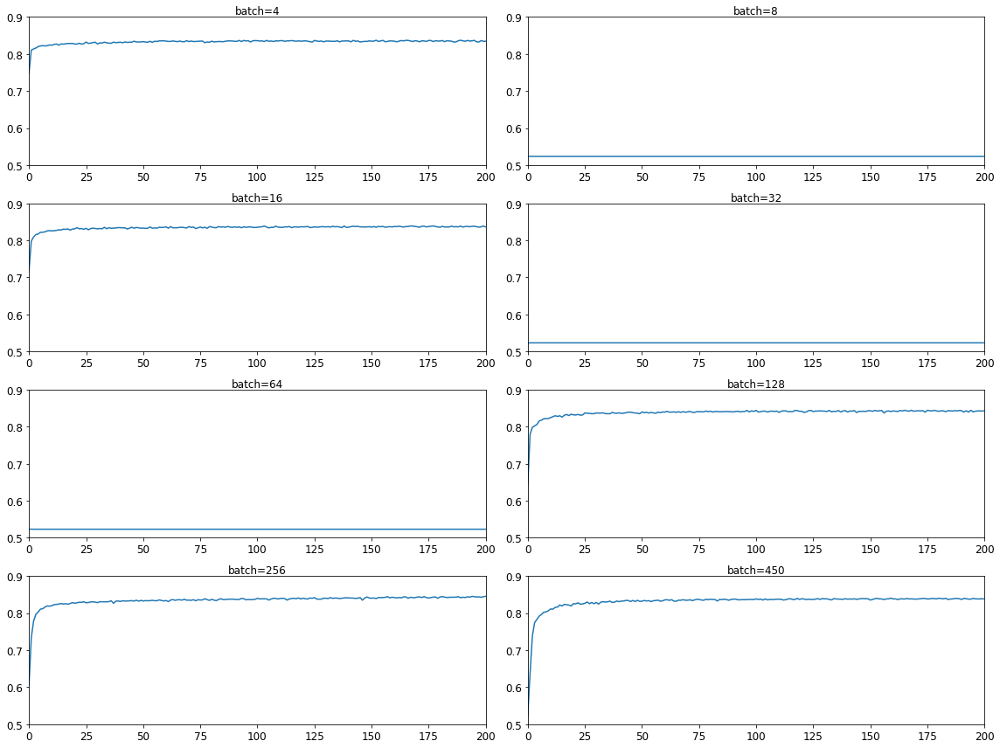

In [34]:
for count, history in enumerate(results):
    # determine the plot number
    plt.rcParams['figure.figsize'] = [16, 12]
    plot_no = 420 + (count+1)
    plt.subplot(plot_no)
    plt.ylim(0.5, 0.9)
    plt.xlim(0, 200)
    plt.plot(history.get()["history"].history['accuracy'], label='train')
    plt.title('batch='+str(history.get()["batch_size"]), pad=-40)
    
plt.tight_layout()
    

In [47]:
parameters = {'number_nodes': number_nodes, 'number_layers': number_layers}
opt = keras.optimizers.Adam(learning_rate=0.01)
clf = KerasClassifier(build_fn_2, optimizer="adam", epochs=125, batch_size=256, number_nodes=4, number_layers=4)

start_time = time.time()
print("Time Taken {} s".format(time.time() - start_time))
gs = GridSearchCV(clf, parameters, verbose=10, n_jobs=1)
gs.fit(X_train, y_train)
print("Time Taken {} s".format(time.time() - start_time))

Time Taken 4.76837158203125e-05 s
Fitting 5 folds for each of 63 candidates, totalling 315 fits
[CV] number_layers=2, number_nodes=34 ................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Epoch 1/125
60/60 [==============================] - 3s 16ms/step - loss: 0.6678 - precision: 0.5603 - recall: 0.5166 - auc: 0.6105 - accuracy: 0.5736
Epoch 2/125
60/60 [==============================] - 1s 16ms/step - loss: 0.5076 - precision: 0.7622 - recall: 0.7095 - auc: 0.8327 - accuracy: 0.7573
Epoch 3/125
60/60 [==============================] - 1s 14ms/step - loss: 0.4465 - precision: 0.8003 - recall: 0.7526 - auc: 0.8740 - accuracy: 0.7928
Epoch 4/125
60/60 [==============================] - 1s 17ms/step - loss: 0.4204 - precision: 0.8087 - recall: 0.7781 - auc: 0.8887 - accuracy: 0.8064
Epoch 5/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4061 - precision: 0.8157 - recall: 0.7849 - auc: 0.8971 - accuracy: 0.8131
Epoch 6/125
60/60 [==============================] - 1s 13ms/step - loss: 0.4103 - precision: 0.8135 - recall: 0.7850 - auc: 0.8940 - accuracy: 0.8119
Epoch 7/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3951 - precision: 

60/60 [==============================] - 1s 14ms/step - loss: 0.2621 - precision: 0.8714 - recall: 0.8785 - auc: 0.9578 - accuracy: 0.8816
Epoch 105/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2600 - precision: 0.8851 - recall: 0.8755 - auc: 0.9589 - accuracy: 0.8871
Epoch 106/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2582 - precision: 0.8816 - recall: 0.8842 - auc: 0.9595 - accuracy: 0.8874: 0s - loss: 0.2560 - precision: 0.8825 - recall: 0.8885 - auc: 0.9603 - accuracy
Epoch 107/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2617 - precision: 0.8817 - recall: 0.8730 - auc: 0.9580 - accuracy: 0.8827
Epoch 108/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2554 - precision: 0.8832 - recall: 0.8823 - auc: 0.9602 - accuracy: 0.8891
Epoch 109/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2639 - precision: 0.8783 - recall: 0.8817 - auc: 0.9574 - accuracy: 0.8852
Epoch 110/125
6

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  2.0min remaining:    0.0s


Epoch 1/125
60/60 [==============================] - 3s 14ms/step - loss: 0.6827 - precision: 0.5891 - recall: 0.1600 - auc: 0.5862 - accuracy: 0.5755
Epoch 2/125
60/60 [==============================] - 1s 15ms/step - loss: 0.5591 - precision: 0.7820 - recall: 0.6497 - auc: 0.8172 - accuracy: 0.7515
Epoch 3/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4696 - precision: 0.8015 - recall: 0.7360 - auc: 0.8663 - accuracy: 0.7908
Epoch 4/125
60/60 [==============================] - 1s 16ms/step - loss: 0.4371 - precision: 0.8003 - recall: 0.7678 - auc: 0.8807 - accuracy: 0.8010
Epoch 5/125
60/60 [==============================] - 1s 13ms/step - loss: 0.4154 - precision: 0.8221 - recall: 0.7841 - auc: 0.8924 - accuracy: 0.8150
Epoch 6/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4063 - precision: 0.8188 - recall: 0.7918 - auc: 0.8968 - accuracy: 0.8172
Epoch 7/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3967 - precision: 

60/60 [==============================] - 1s 17ms/step - loss: 0.3012 - precision: 0.8630 - recall: 0.8512 - auc: 0.9442 - accuracy: 0.8673
Epoch 104/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3008 - precision: 0.8643 - recall: 0.8497 - auc: 0.9443 - accuracy: 0.8669
Epoch 105/125
60/60 [==============================] - 1s 18ms/step - loss: 0.2928 - precision: 0.8741 - recall: 0.8485 - auc: 0.9473 - accuracy: 0.8708
Epoch 106/125
60/60 [==============================] - 1s 17ms/step - loss: 0.2997 - precision: 0.8721 - recall: 0.8452 - auc: 0.9447 - accuracy: 0.8657
Epoch 107/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3078 - precision: 0.8704 - recall: 0.8360 - auc: 0.9416 - accuracy: 0.8631
Epoch 108/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2901 - precision: 0.8731 - recall: 0.8530 - auc: 0.9484 - accuracy: 0.8699: 0s - loss: 0.2817 - precision: 0.8765 - recall: 0.8537 - auc: 0.9517 - acc
Epoch 109/125
60/60 

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  4.1min remaining:    0.0s


Epoch 1/125
60/60 [==============================] - 4s 13ms/step - loss: 0.6667 - precision: 0.5856 - recall: 0.5472 - auc: 0.6245 - accuracy: 0.5875
Epoch 2/125
60/60 [==============================] - 1s 14ms/step - loss: 0.5203 - precision: 0.7791 - recall: 0.6850 - auc: 0.8251 - accuracy: 0.7551
Epoch 3/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4677 - precision: 0.7923 - recall: 0.7215 - auc: 0.8596 - accuracy: 0.7793
Epoch 4/125
60/60 [==============================] - 1s 14ms/step - loss: 0.4561 - precision: 0.7964 - recall: 0.7315 - auc: 0.8685 - accuracy: 0.7827
Epoch 5/125
60/60 [==============================] - 1s 16ms/step - loss: 0.4252 - precision: 0.8023 - recall: 0.7848 - auc: 0.8858 - accuracy: 0.8062
Epoch 6/125
60/60 [==============================] - 1s 18ms/step - loss: 0.4062 - precision: 0.8110 - recall: 0.7871 - auc: 0.8968 - accuracy: 0.8104
Epoch 7/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4095 - precision: 

60/60 [==============================] - 1s 15ms/step - loss: 0.2649 - precision: 0.8857 - recall: 0.8790 - auc: 0.9574 - accuracy: 0.8877
Epoch 105/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2624 - precision: 0.8817 - recall: 0.8807 - auc: 0.9578 - accuracy: 0.8886
Epoch 106/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2556 - precision: 0.8945 - recall: 0.8832 - auc: 0.9603 - accuracy: 0.8941
Epoch 107/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2679 - precision: 0.8828 - recall: 0.8834 - auc: 0.9565 - accuracy: 0.8882
Epoch 108/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2510 - precision: 0.8884 - recall: 0.8889 - auc: 0.9618 - accuracy: 0.8945
Epoch 109/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2542 - precision: 0.8897 - recall: 0.8863 - auc: 0.9606 - accuracy: 0.8941
Epoch 110/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2659 - precision: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:  6.2min remaining:    0.0s


Epoch 1/125
60/60 [==============================] - 4s 16ms/step - loss: 0.6861 - precision: 0.6008 - recall: 0.0302 - auc: 0.6245 - accuracy: 0.5369
Epoch 2/125
60/60 [==============================] - 1s 16ms/step - loss: 0.6072 - precision: 0.8207 - recall: 0.5528 - auc: 0.8085 - accuracy: 0.7234
Epoch 3/125
60/60 [==============================] - 1s 18ms/step - loss: 0.4923 - precision: 0.8100 - recall: 0.7347 - auc: 0.8660 - accuracy: 0.7893
Epoch 4/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4387 - precision: 0.7897 - recall: 0.7748 - auc: 0.8785 - accuracy: 0.7941
Epoch 5/125
60/60 [==============================] - 1s 17ms/step - loss: 0.4139 - precision: 0.8100 - recall: 0.7826 - auc: 0.8928 - accuracy: 0.8094: 0s - loss: 0.4150 - precision: 0.8081 - recall: 0.7783 - auc: 0.8922 - accuracy:
Epoch 6/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4002 - precision: 0.8207 - recall: 0.7901 - auc: 0.9005 - accuracy: 0.8155
Epoch 7/125


60/60 [==============================] - 1s 14ms/step - loss: 0.3020 - precision: 0.8567 - recall: 0.8529 - auc: 0.9434 - accuracy: 0.8624
Epoch 104/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2986 - precision: 0.8640 - recall: 0.8461 - auc: 0.9448 - accuracy: 0.8623
Epoch 105/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3053 - precision: 0.8606 - recall: 0.8444 - auc: 0.9421 - accuracy: 0.8597
Epoch 106/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3029 - precision: 0.8632 - recall: 0.8605 - auc: 0.9437 - accuracy: 0.8688
Epoch 107/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3025 - precision: 0.8658 - recall: 0.8416 - auc: 0.9430 - accuracy: 0.8627
Epoch 108/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3048 - precision: 0.8550 - recall: 0.8535 - auc: 0.9422 - accuracy: 0.8587
Epoch 109/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3016 - precision: 

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:  8.3min remaining:    0.0s


Epoch 1/125
60/60 [==============================] - 3s 14ms/step - loss: 0.6581 - precision: 0.6324 - recall: 0.4808 - auc: 0.6616 - accuracy: 0.6176
Epoch 2/125
60/60 [==============================] - 1s 14ms/step - loss: 0.5015 - precision: 0.7821 - recall: 0.7177 - auc: 0.8463 - accuracy: 0.7714
Epoch 3/125
60/60 [==============================] - 1s 14ms/step - loss: 0.4518 - precision: 0.7855 - recall: 0.7732 - auc: 0.8727 - accuracy: 0.7899
Epoch 4/125
60/60 [==============================] - 1s 17ms/step - loss: 0.4414 - precision: 0.7895 - recall: 0.7789 - auc: 0.8771 - accuracy: 0.7962
Epoch 5/125
60/60 [==============================] - 1s 12ms/step - loss: 0.4240 - precision: 0.8045 - recall: 0.7860 - auc: 0.8873 - accuracy: 0.8051: 0s - loss: 0.4249 - precision: 0.8035 - recall: 0.7879 - auc: 0.8869 - accuracy: 0.8
Epoch 6/125
60/60 [==============================] - 1s 13ms/step - loss: 0.4168 - precision: 0.8108 - recall: 0.7800 - auc: 0.8907 - accuracy: 0.8080
Epoch 7/

60/60 [==============================] - 1s 19ms/step - loss: 0.2831 - precision: 0.8708 - recall: 0.8563 - auc: 0.9505 - accuracy: 0.8718
Epoch 105/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2795 - precision: 0.8733 - recall: 0.8633 - auc: 0.9521 - accuracy: 0.8746
Epoch 106/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2790 - precision: 0.8683 - recall: 0.8610 - auc: 0.9519 - accuracy: 0.8720: 0s - loss: 0.2632 - precision: 0.8579 - recall: 0.8806 - auc: 0.9576 - a
Epoch 107/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2808 - precision: 0.8728 - recall: 0.8601 - auc: 0.9513 - accuracy: 0.8757
Epoch 108/125
60/60 [==============================] - 1s 18ms/step - loss: 0.2810 - precision: 0.8817 - recall: 0.8472 - auc: 0.9517 - accuracy: 0.8735
Epoch 109/125
60/60 [==============================] - 1s 17ms/step - loss: 0.2753 - precision: 0.8768 - recall: 0.8643 - auc: 0.9535 - accuracy: 0.8769
Epoch 110/125
60/60 [=

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed: 10.3min remaining:    0.0s


Epoch 1/125
60/60 [==============================] - 4s 16ms/step - loss: 0.6575 - precision: 0.6246 - recall: 0.4382 - auc: 0.6612 - accuracy: 0.6177
Epoch 2/125
60/60 [==============================] - 1s 15ms/step - loss: 0.5188 - precision: 0.7786 - recall: 0.7052 - auc: 0.8360 - accuracy: 0.7616
Epoch 3/125
60/60 [==============================] - 1s 19ms/step - loss: 0.4609 - precision: 0.7939 - recall: 0.7542 - auc: 0.8668 - accuracy: 0.7892
Epoch 4/125
60/60 [==============================] - 1s 17ms/step - loss: 0.4340 - precision: 0.8066 - recall: 0.7629 - auc: 0.8815 - accuracy: 0.7973
Epoch 5/125
60/60 [==============================] - 1s 19ms/step - loss: 0.4315 - precision: 0.7984 - recall: 0.7588 - auc: 0.8815 - accuracy: 0.7998
Epoch 6/125
60/60 [==============================] - 1s 17ms/step - loss: 0.4144 - precision: 0.8103 - recall: 0.7921 - auc: 0.8924 - accuracy: 0.8105
Epoch 7/125
60/60 [==============================] - 1s 14ms/step - loss: 0.4093 - precision: 

60/60 [==============================] - 1s 16ms/step - loss: 0.2934 - precision: 0.8790 - recall: 0.8529 - auc: 0.9473 - accuracy: 0.8731: 0s - loss: 0.2833 - precision: 0.8868 - recall: 0.8678 - auc: 0.9518 - acc
Epoch 106/125
60/60 [==============================] - 1s 11ms/step - loss: 0.2927 - precision: 0.8761 - recall: 0.8586 - auc: 0.9474 - accuracy: 0.8743
Epoch 107/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2904 - precision: 0.8729 - recall: 0.8569 - auc: 0.9485 - accuracy: 0.8735
Epoch 108/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2878 - precision: 0.8825 - recall: 0.8534 - auc: 0.9491 - accuracy: 0.8752
Epoch 109/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2867 - precision: 0.8791 - recall: 0.8536 - auc: 0.9494 - accuracy: 0.8753
Epoch 110/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2976 - precision: 0.8766 - recall: 0.8456 - auc: 0.9454 - accuracy: 0.8693: 0s - loss: 0.2982 -

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed: 12.4min remaining:    0.0s


Epoch 1/125
60/60 [==============================] - 4s 13ms/step - loss: 0.6794 - precision: 0.5816 - recall: 0.3556 - auc: 0.6072 - accuracy: 0.5858
Epoch 2/125
60/60 [==============================] - 1s 14ms/step - loss: 0.5421 - precision: 0.7627 - recall: 0.6692 - auc: 0.8124 - accuracy: 0.7398
Epoch 3/125
60/60 [==============================] - 1s 18ms/step - loss: 0.4618 - precision: 0.7948 - recall: 0.7516 - auc: 0.8667 - accuracy: 0.7877
Epoch 4/125
60/60 [==============================] - 1s 13ms/step - loss: 0.4231 - precision: 0.8147 - recall: 0.7699 - auc: 0.8890 - accuracy: 0.8091
Epoch 5/125
60/60 [==============================] - 1s 16ms/step - loss: 0.4229 - precision: 0.8156 - recall: 0.7669 - auc: 0.8883 - accuracy: 0.8088
Epoch 6/125
60/60 [==============================] - 1s 14ms/step - loss: 0.4150 - precision: 0.8200 - recall: 0.7793 - auc: 0.8918 - accuracy: 0.8124: 0s - loss: 0.4206 - precision: 0.8288 - recall: 0.7554 - auc: 0.8885 - accu
Epoch 7/125
60/60

60/60 [==============================] - 1s 13ms/step - loss: 0.3054 - precision: 0.8638 - recall: 0.8508 - auc: 0.9428 - accuracy: 0.8657
Epoch 105/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3127 - precision: 0.8661 - recall: 0.8386 - auc: 0.9408 - accuracy: 0.8586
Epoch 106/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2981 - precision: 0.8632 - recall: 0.8598 - auc: 0.9453 - accuracy: 0.8677
Epoch 107/125
60/60 [==============================] - 1s 17ms/step - loss: 0.2890 - precision: 0.8752 - recall: 0.8592 - auc: 0.9491 - accuracy: 0.8741
Epoch 108/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3017 - precision: 0.8715 - recall: 0.8466 - auc: 0.9442 - accuracy: 0.8693
Epoch 109/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2952 - precision: 0.8681 - recall: 0.8501 - auc: 0.9464 - accuracy: 0.8694
Epoch 110/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2944 - precision: 

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed: 14.4min remaining:    0.0s


Epoch 1/125
60/60 [==============================] - 4s 15ms/step - loss: 0.6449 - precision: 0.6443 - recall: 0.4817 - auc: 0.6759 - accuracy: 0.6206
Epoch 2/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4852 - precision: 0.7800 - recall: 0.7391 - auc: 0.8502 - accuracy: 0.7764
Epoch 3/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4462 - precision: 0.8042 - recall: 0.7546 - auc: 0.8740 - accuracy: 0.7929
Epoch 4/125
60/60 [==============================] - 1s 17ms/step - loss: 0.4213 - precision: 0.8165 - recall: 0.7729 - auc: 0.8882 - accuracy: 0.8109
Epoch 5/125
60/60 [==============================] - 1s 16ms/step - loss: 0.4114 - precision: 0.8190 - recall: 0.7916 - auc: 0.8933 - accuracy: 0.8173
Epoch 6/125
60/60 [==============================] - 1s 14ms/step - loss: 0.4023 - precision: 0.8153 - recall: 0.8018 - auc: 0.8988 - accuracy: 0.8181
Epoch 7/125
60/60 [==============================] - 1s 16ms/step - loss: 0.4031 - precision: 

60/60 [==============================] - 1s 15ms/step - loss: 0.2938 - precision: 0.8623 - recall: 0.8583 - auc: 0.9471 - accuracy: 0.8680: 0s - loss: 0.2828 - precision: 0.8529 - recall: 0.8755 - auc: 0.9516 - ac
Epoch 103/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2885 - precision: 0.8702 - recall: 0.8671 - auc: 0.9493 - accuracy: 0.8739
Epoch 104/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3172 - precision: 0.8629 - recall: 0.8356 - auc: 0.9382 - accuracy: 0.8590
Epoch 105/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2932 - precision: 0.8739 - recall: 0.8514 - auc: 0.9475 - accuracy: 0.8712
Epoch 106/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2940 - precision: 0.8765 - recall: 0.8609 - auc: 0.9472 - accuracy: 0.8751: 0s - loss: 0.2957 - precision: 0.8836 - recall: 0.8573 - auc: 0.9467 - accura
Epoch 107/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3062 - precision:

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed: 16.4min remaining:    0.0s


Epoch 1/125
60/60 [==============================] - 4s 16ms/step - loss: 0.6512 - precision: 0.6465 - recall: 0.5609 - auc: 0.6927 - accuracy: 0.6396
Epoch 2/125
60/60 [==============================] - 1s 14ms/step - loss: 0.4991 - precision: 0.7871 - recall: 0.7076 - auc: 0.8426 - accuracy: 0.7689
Epoch 3/125
60/60 [==============================] - 1s 19ms/step - loss: 0.4387 - precision: 0.8061 - recall: 0.7697 - auc: 0.8791 - accuracy: 0.8007
Epoch 4/125
60/60 [==============================] - 1s 17ms/step - loss: 0.4199 - precision: 0.8107 - recall: 0.7848 - auc: 0.8898 - accuracy: 0.8093
Epoch 5/125
60/60 [==============================] - 1s 16ms/step - loss: 0.4085 - precision: 0.8186 - recall: 0.7865 - auc: 0.8957 - accuracy: 0.8142
Epoch 6/125
60/60 [==============================] - 1s 18ms/step - loss: 0.4071 - precision: 0.8202 - recall: 0.8015 - auc: 0.8966 - accuracy: 0.8197
Epoch 7/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3989 - precision: 

60/60 [==============================] - 1s 16ms/step - loss: 0.2665 - precision: 0.8832 - recall: 0.8789 - auc: 0.9567 - accuracy: 0.8860
Epoch 106/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2738 - precision: 0.8925 - recall: 0.8534 - auc: 0.9540 - accuracy: 0.8809
Epoch 107/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2705 - precision: 0.8849 - recall: 0.8668 - auc: 0.9549 - accuracy: 0.8808
Epoch 108/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2717 - precision: 0.8893 - recall: 0.8610 - auc: 0.9546 - accuracy: 0.8835: 0s - loss: 0.2729 - precision: 0.8900 - recall: 0.8584 - auc: 0.9542 - accuracy: 0
Epoch 109/125
60/60 [==============================] - 0s 8ms/step - loss: 0.2710 - precision: 0.8846 - recall: 0.8703 - auc: 0.9549 - accuracy: 0.8842
Epoch 110/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2767 - precision: 0.8841 - recall: 0.8595 - auc: 0.9532 - accuracy: 0.8784
Epoch 111/125

[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed: 18.4min remaining:    0.0s


Epoch 1/125
60/60 [==============================] - 4s 14ms/step - loss: 0.6535 - precision: 0.6118 - recall: 0.4270 - auc: 0.6480 - accuracy: 0.6070
Epoch 2/125
60/60 [==============================] - 1s 16ms/step - loss: 0.4893 - precision: 0.7864 - recall: 0.7133 - auc: 0.8488 - accuracy: 0.7725
Epoch 3/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4489 - precision: 0.7955 - recall: 0.7548 - auc: 0.8715 - accuracy: 0.7911
Epoch 4/125
60/60 [==============================] - 1s 14ms/step - loss: 0.4187 - precision: 0.8095 - recall: 0.7799 - auc: 0.8909 - accuracy: 0.8085
Epoch 5/125
60/60 [==============================] - 1s 14ms/step - loss: 0.4143 - precision: 0.8136 - recall: 0.7928 - auc: 0.8927 - accuracy: 0.8126
Epoch 6/125
60/60 [==============================] - 1s 14ms/step - loss: 0.4024 - precision: 0.8258 - recall: 0.7967 - auc: 0.8985 - accuracy: 0.8221
Epoch 7/125
60/60 [==============================] - 1s 13ms/step - loss: 0.4016 - precision: 

60/60 [==============================] - 1s 15ms/step - loss: 0.2463 - precision: 0.8942 - recall: 0.8815 - auc: 0.9633 - accuracy: 0.8937
Epoch 104/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2568 - precision: 0.8904 - recall: 0.8722 - auc: 0.9596 - accuracy: 0.8876
Epoch 105/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2522 - precision: 0.8930 - recall: 0.8688 - auc: 0.9613 - accuracy: 0.8883
Epoch 106/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2554 - precision: 0.8865 - recall: 0.8802 - auc: 0.9600 - accuracy: 0.8879: 0s - loss: 0.2545 - precision: 0.8860 - recall: 0.8818 - auc: 0.9603 - accuracy: 0.
Epoch 107/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2431 - precision: 0.8915 - recall: 0.8873 - auc: 0.9640 - accuracy: 0.8938
Epoch 108/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2521 - precision: 0.8966 - recall: 0.8716 - auc: 0.9614 - accuracy: 0.8913
Epoch 109/1

60/60 [==============================] - 1s 17ms/step - loss: 0.2921 - precision: 0.8674 - recall: 0.8585 - auc: 0.9476 - accuracy: 0.8686
Epoch 79/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2904 - precision: 0.8765 - recall: 0.8593 - auc: 0.9484 - accuracy: 0.8746
Epoch 80/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2862 - precision: 0.8746 - recall: 0.8647 - auc: 0.9500 - accuracy: 0.8768
Epoch 81/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2854 - precision: 0.8765 - recall: 0.8672 - auc: 0.9503 - accuracy: 0.8788
Epoch 82/125
60/60 [==============================] - 1s 11ms/step - loss: 0.3078 - precision: 0.8569 - recall: 0.8498 - auc: 0.9417 - accuracy: 0.8594
Epoch 83/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2984 - precision: 0.8596 - recall: 0.8657 - auc: 0.9460 - accuracy: 0.8681
Epoch 84/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2859 - precision: 0.8713

Epoch 54/125
60/60 [==============================] - 1s 12ms/step - loss: 0.3346 - precision: 0.8414 - recall: 0.8387 - auc: 0.9305 - accuracy: 0.8467
Epoch 55/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3156 - precision: 0.8560 - recall: 0.8427 - auc: 0.9383 - accuracy: 0.8579
Epoch 56/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3275 - precision: 0.8443 - recall: 0.8423 - auc: 0.9336 - accuracy: 0.8515
Epoch 57/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3290 - precision: 0.8361 - recall: 0.8525 - auc: 0.9333 - accuracy: 0.8502
Epoch 58/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3269 - precision: 0.8484 - recall: 0.8342 - auc: 0.9341 - accuracy: 0.8504: 0s - loss: 0.3270 - precision: 0.8487 - recall: 0.8335 - auc: 0.9341 - accuracy: 0.85
Epoch 59/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3195 - precision: 0.8462 - recall: 0.8423 - auc: 0.9366 - accuracy: 0.8531
E

60/60 [==============================] - 1s 19ms/step - loss: 0.3399 - precision: 0.8402 - recall: 0.8279 - auc: 0.9282 - accuracy: 0.8433
Epoch 32/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3520 - precision: 0.8372 - recall: 0.8141 - auc: 0.9230 - accuracy: 0.8358
Epoch 33/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3577 - precision: 0.8376 - recall: 0.8142 - auc: 0.9207 - accuracy: 0.8366
Epoch 34/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3515 - precision: 0.8325 - recall: 0.8338 - auc: 0.9233 - accuracy: 0.8393
Epoch 35/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3504 - precision: 0.8441 - recall: 0.8131 - auc: 0.9241 - accuracy: 0.8382
Epoch 36/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3455 - precision: 0.8342 - recall: 0.8318 - auc: 0.9259 - accuracy: 0.8406
Epoch 37/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3379 - precision: 0.8483

60/60 [==============================] - 1s 18ms/step - loss: 0.3961 - precision: 0.8144 - recall: 0.8002 - auc: 0.9022 - accuracy: 0.8151
Epoch 9/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3839 - precision: 0.8254 - recall: 0.8020 - auc: 0.9083 - accuracy: 0.8215
Epoch 10/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3826 - precision: 0.8422 - recall: 0.7928 - auc: 0.9092 - accuracy: 0.8277
Epoch 11/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3841 - precision: 0.8339 - recall: 0.7932 - auc: 0.9080 - accuracy: 0.8235
Epoch 12/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3623 - precision: 0.8374 - recall: 0.8122 - auc: 0.9185 - accuracy: 0.8359
Epoch 13/125
60/60 [==============================] - 1s 21ms/step - loss: 0.3641 - precision: 0.8338 - recall: 0.8202 - auc: 0.9176 - accuracy: 0.8340
Epoch 14/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3739 - precision: 0.8217 

60/60 [==============================] - 1s 16ms/step - loss: 0.2441 - precision: 0.8976 - recall: 0.8783 - auc: 0.9636 - accuracy: 0.8944
Epoch 111/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2363 - precision: 0.8959 - recall: 0.8907 - auc: 0.9659 - accuracy: 0.8971
Epoch 112/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2496 - precision: 0.8927 - recall: 0.8876 - auc: 0.9621 - accuracy: 0.8942
Epoch 113/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2496 - precision: 0.8883 - recall: 0.8880 - auc: 0.9622 - accuracy: 0.8917
Epoch 114/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2402 - precision: 0.9024 - recall: 0.8809 - auc: 0.9649 - accuracy: 0.8982
Epoch 115/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2452 - precision: 0.9016 - recall: 0.8833 - auc: 0.9637 - accuracy: 0.8968
Epoch 116/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2356 - precision: 

60/60 [==============================] - 1s 16ms/step - loss: 0.2952 - precision: 0.8646 - recall: 0.8643 - auc: 0.9470 - accuracy: 0.8712
Epoch 85/125
60/60 [==============================] - 1s 10ms/step - loss: 0.2942 - precision: 0.8734 - recall: 0.8655 - auc: 0.9473 - accuracy: 0.8746
Epoch 86/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3068 - precision: 0.8583 - recall: 0.8605 - auc: 0.9424 - accuracy: 0.8652
Epoch 87/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2945 - precision: 0.8650 - recall: 0.8587 - auc: 0.9471 - accuracy: 0.8678
Epoch 88/125
60/60 [==============================] - 1s 19ms/step - loss: 0.2901 - precision: 0.8766 - recall: 0.8643 - auc: 0.9487 - accuracy: 0.8772
Epoch 89/125
60/60 [==============================] - 1s 18ms/step - loss: 0.2819 - precision: 0.8766 - recall: 0.8681 - auc: 0.9517 - accuracy: 0.8795: 0s - loss: 0.2794 - precision: 0.8805 - recall: 0.8680 - auc: 0.9526 - accu
Epoch 90/125
60/60 [====

60/60 [==============================] - 1s 20ms/step - loss: 0.3312 - precision: 0.8506 - recall: 0.8313 - auc: 0.9321 - accuracy: 0.8491
Epoch 59/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3214 - precision: 0.8499 - recall: 0.8412 - auc: 0.9360 - accuracy: 0.8534
Epoch 60/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3262 - precision: 0.8477 - recall: 0.8505 - auc: 0.9349 - accuracy: 0.8567
Epoch 61/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3043 - precision: 0.8598 - recall: 0.8551 - auc: 0.9430 - accuracy: 0.8643
Epoch 62/125
60/60 [==============================] - 1s 22ms/step - loss: 0.3182 - precision: 0.8573 - recall: 0.8399 - auc: 0.9382 - accuracy: 0.8577
Epoch 63/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3016 - precision: 0.8609 - recall: 0.8506 - auc: 0.9442 - accuracy: 0.8632
Epoch 64/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3015 - precision: 0.8664

60/60 [==============================] - 1s 18ms/step - loss: 0.3457 - precision: 0.8414 - recall: 0.8171 - auc: 0.9256 - accuracy: 0.8382
Epoch 33/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3327 - precision: 0.8414 - recall: 0.8471 - auc: 0.9319 - accuracy: 0.8520
Epoch 34/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3406 - precision: 0.8420 - recall: 0.8231 - auc: 0.9275 - accuracy: 0.8415
Epoch 35/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3256 - precision: 0.8465 - recall: 0.8367 - auc: 0.9343 - accuracy: 0.8518
Epoch 36/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3446 - precision: 0.8308 - recall: 0.8352 - auc: 0.9266 - accuracy: 0.8412
Epoch 37/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3334 - precision: 0.8334 - recall: 0.8312 - auc: 0.9305 - accuracy: 0.8406
Epoch 38/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3328 - precision: 0.8445

60/60 [==============================] - 1s 15ms/step - loss: 0.4038 - precision: 0.8156 - recall: 0.7971 - auc: 0.8983 - accuracy: 0.8188
Epoch 9/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3890 - precision: 0.8264 - recall: 0.7927 - auc: 0.9058 - accuracy: 0.8240
Epoch 10/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3918 - precision: 0.8263 - recall: 0.7969 - auc: 0.9041 - accuracy: 0.8241
Epoch 11/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3886 - precision: 0.8204 - recall: 0.8012 - auc: 0.9059 - accuracy: 0.8216
Epoch 12/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3864 - precision: 0.8224 - recall: 0.7953 - auc: 0.9071 - accuracy: 0.8219: 1s - loss: 0.3854 - precision: 0.8150 - recall: 0.7892 - auc: 0.9079 - acc
Epoch 13/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3777 - precision: 0.8301 - recall: 0.8088 - auc: 0.9114 - accuracy: 0.8294: 1s - loss: 0.3725 - preci

60/60 [==============================] - 1s 19ms/step - loss: 0.2653 - precision: 0.8809 - recall: 0.8767 - auc: 0.9570 - accuracy: 0.8849
Epoch 109/125
60/60 [==============================] - 1s 20ms/step - loss: 0.2647 - precision: 0.8809 - recall: 0.8842 - auc: 0.9573 - accuracy: 0.8873
Epoch 110/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2624 - precision: 0.8893 - recall: 0.8760 - auc: 0.9581 - accuracy: 0.8899
Epoch 111/125
60/60 [==============================] - 1s 17ms/step - loss: 0.2825 - precision: 0.8723 - recall: 0.8747 - auc: 0.9516 - accuracy: 0.8779
Epoch 112/125
60/60 [==============================] - 1s 18ms/step - loss: 0.2551 - precision: 0.8848 - recall: 0.8796 - auc: 0.9604 - accuracy: 0.8885
Epoch 113/125
60/60 [==============================] - 1s 18ms/step - loss: 0.2686 - precision: 0.8805 - recall: 0.8725 - auc: 0.9561 - accuracy: 0.8823
Epoch 114/125
60/60 [==============================] - 1s 17ms/step - loss: 0.2525 - precision: 

60/60 [==============================] - 1s 17ms/step - loss: 0.2672 - precision: 0.8830 - recall: 0.8760 - auc: 0.9565 - accuracy: 0.8838
Epoch 85/125
60/60 [==============================] - 1s 18ms/step - loss: 0.2721 - precision: 0.8758 - recall: 0.8833 - auc: 0.9552 - accuracy: 0.8833: 0s - loss: 0.2747 - precision: 0.8711 - recall: 0.8854 - auc: 0.9546 - accuracy:
Epoch 86/125
60/60 [==============================] - 1s 20ms/step - loss: 0.2717 - precision: 0.8847 - recall: 0.8700 - auc: 0.9551 - accuracy: 0.8837
Epoch 87/125
60/60 [==============================] - 1s 18ms/step - loss: 0.2675 - precision: 0.8840 - recall: 0.8841 - auc: 0.9566 - accuracy: 0.8890
Epoch 88/125
60/60 [==============================] - 1s 19ms/step - loss: 0.2638 - precision: 0.8923 - recall: 0.8704 - auc: 0.9575 - accuracy: 0.8891
Epoch 89/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2719 - precision: 0.8805 - recall: 0.8706 - auc: 0.9549 - accuracy: 0.8820
Epoch 90/125
60/60 

60/60 [==============================] - 1s 18ms/step - loss: 0.3075 - precision: 0.8605 - recall: 0.8506 - auc: 0.9417 - accuracy: 0.8643: 0s - loss: 0.2994 - precision: 0.8579 - recall: 0.8701 - auc: 0.9458 - 
Epoch 58/125
60/60 [==============================] - ETA: 0s - loss: 0.3042 - precision: 0.8629 - recall: 0.8463 - auc: 0.9432 - accuracy: 0.863 - 1s 19ms/step - loss: 0.3042 - precision: 0.8629 - recall: 0.8465 - auc: 0.9432 - accuracy: 0.8632
Epoch 59/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3051 - precision: 0.8654 - recall: 0.8465 - auc: 0.9429 - accuracy: 0.8630: 0s - loss: 0.3087 - precision: 0.8665 - recall: 0.8359 - auc: 0.9417 - ac
Epoch 60/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3111 - precision: 0.8589 - recall: 0.8525 - auc: 0.9402 - accuracy: 0.8626
Epoch 61/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3052 - precision: 0.8640 - recall: 0.8500 - auc: 0.9426 - accuracy: 0.8642
Epoch 62/12

60/60 [==============================] - 1s 20ms/step - loss: 0.3364 - precision: 0.8528 - recall: 0.8312 - auc: 0.9303 - accuracy: 0.8520: 0s - loss: 0.3216 - precision: 0.8659 - recall: 0.8524 - auc: 0.9378 - a
Epoch 29/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3407 - precision: 0.8524 - recall: 0.8159 - auc: 0.9282 - accuracy: 0.8460
Epoch 30/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3439 - precision: 0.8474 - recall: 0.8238 - auc: 0.9266 - accuracy: 0.8449
Epoch 31/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3575 - precision: 0.8410 - recall: 0.8043 - auc: 0.9205 - accuracy: 0.8356
Epoch 32/125
60/60 [==============================] - 1s 22ms/step - loss: 0.3471 - precision: 0.8525 - recall: 0.8112 - auc: 0.9256 - accuracy: 0.8433
Epoch 33/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3378 - precision: 0.8470 - recall: 0.8234 - auc: 0.9295 - accuracy: 0.8475
Epoch 34/125
60/60 [=======

60/60 [==============================] - 5s 18ms/step - loss: 0.6366 - precision: 0.6364 - recall: 0.5871 - auc: 0.6923 - accuracy: 0.6383
Epoch 2/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4730 - precision: 0.7899 - recall: 0.7315 - auc: 0.8573 - accuracy: 0.7799
Epoch 3/125
60/60 [==============================] - 1s 23ms/step - loss: 0.4436 - precision: 0.7864 - recall: 0.7699 - auc: 0.8765 - accuracy: 0.7925
Epoch 4/125
60/60 [==============================] - 1s 17ms/step - loss: 0.4238 - precision: 0.8140 - recall: 0.7617 - auc: 0.8869 - accuracy: 0.8039
Epoch 5/125
60/60 [==============================] - 1s 23ms/step - loss: 0.4051 - precision: 0.8204 - recall: 0.7849 - auc: 0.8976 - accuracy: 0.8155
Epoch 6/125
60/60 [==============================] - 1s 17ms/step - loss: 0.4134 - precision: 0.8245 - recall: 0.7690 - auc: 0.8937 - accuracy: 0.8131: 0s - loss: 0.4343 - precision: 0.8385 - recall: 0.7303 - auc: 0.8854 - a
Epoch 7/125
60/60 [=============

Epoch 54/125
60/60 [==============================] - 1s 24ms/step - loss: 0.3207 - precision: 0.8486 - recall: 0.8382 - auc: 0.9363 - accuracy: 0.8537
Epoch 55/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3167 - precision: 0.8533 - recall: 0.8348 - auc: 0.9383 - accuracy: 0.8539
Epoch 56/125
60/60 [==============================] - 1s 22ms/step - loss: 0.3157 - precision: 0.8444 - recall: 0.8565 - auc: 0.9388 - accuracy: 0.8554
Epoch 57/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3340 - precision: 0.8585 - recall: 0.8223 - auc: 0.9326 - accuracy: 0.8486
Epoch 58/125
60/60 [==============================] - 1s 21ms/step - loss: 0.3107 - precision: 0.8474 - recall: 0.8555 - auc: 0.9408 - accuracy: 0.8590
Epoch 59/125
60/60 [==============================] - 1s 22ms/step - loss: 0.3075 - precision: 0.8589 - recall: 0.8515 - auc: 0.9421 - accuracy: 0.8631
Epoch 60/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3010 - prec

Epoch 30/125
60/60 [==============================] - 1s 21ms/step - loss: 0.3286 - precision: 0.8502 - recall: 0.8281 - auc: 0.9335 - accuracy: 0.8491
Epoch 31/125
60/60 [==============================] - 1s 22ms/step - loss: 0.3330 - precision: 0.8482 - recall: 0.8373 - auc: 0.9315 - accuracy: 0.8499
Epoch 32/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3432 - precision: 0.8565 - recall: 0.8104 - auc: 0.9279 - accuracy: 0.8409
Epoch 33/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3416 - precision: 0.8419 - recall: 0.8240 - auc: 0.9279 - accuracy: 0.8422
Epoch 34/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3398 - precision: 0.8382 - recall: 0.8250 - auc: 0.9284 - accuracy: 0.8426
Epoch 35/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3267 - precision: 0.8470 - recall: 0.8379 - auc: 0.9341 - accuracy: 0.8509: 1s - loss: 0.3106 - precision: 0.8565 - recall: 0.8551 - auc: 0.9418 - 
Epoch 36/125
60

60/60 [==============================] - 1s 20ms/step - loss: 0.4782 - precision: 0.7951 - recall: 0.7334 - auc: 0.8610 - accuracy: 0.7817
Epoch 3/125
60/60 [==============================] - 1s 22ms/step - loss: 0.4315 - precision: 0.8018 - recall: 0.7727 - auc: 0.8835 - accuracy: 0.8012
Epoch 4/125
60/60 [==============================] - 1s 21ms/step - loss: 0.4120 - precision: 0.8144 - recall: 0.7906 - auc: 0.8942 - accuracy: 0.8139: 0s - loss: 0.4109 - precision: 0.8138 - recall: 0.7916 - auc: 0.8949 - accuracy: 0
Epoch 5/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4035 - precision: 0.8191 - recall: 0.8024 - auc: 0.8984 - accuracy: 0.8213
Epoch 6/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4074 - precision: 0.8129 - recall: 0.7966 - auc: 0.8962 - accuracy: 0.8136
Epoch 7/125
60/60 [==============================] - 1s 19ms/step - loss: 0.4089 - precision: 0.8219 - recall: 0.7824 - auc: 0.8956 - accuracy: 0.8135
Epoch 8/125
60/60 [===

60/60 [==============================] - 1s 15ms/step - loss: 0.2283 - precision: 0.8983 - recall: 0.9012 - auc: 0.9683 - accuracy: 0.9042
Epoch 103/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2375 - precision: 0.8959 - recall: 0.8887 - auc: 0.9654 - accuracy: 0.8963
Epoch 104/125
60/60 [==============================] - 1s 20ms/step - loss: 0.2270 - precision: 0.9034 - recall: 0.8907 - auc: 0.9686 - accuracy: 0.9034
Epoch 105/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2337 - precision: 0.9100 - recall: 0.8896 - auc: 0.9669 - accuracy: 0.9042
Epoch 106/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2556 - precision: 0.8995 - recall: 0.8693 - auc: 0.9604 - accuracy: 0.8897
Epoch 107/125
60/60 [==============================] - 1s 17ms/step - loss: 0.2311 - precision: 0.9062 - recall: 0.8879 - auc: 0.9675 - accuracy: 0.9016
Epoch 108/125
60/60 [==============================] - 1s 17ms/step - loss: 0.2325 - precision: 

Epoch 78/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3107 - precision: 0.8598 - recall: 0.8481 - auc: 0.9404 - accuracy: 0.8608
Epoch 79/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3047 - precision: 0.8659 - recall: 0.8424 - auc: 0.9427 - accuracy: 0.8637
Epoch 80/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3175 - precision: 0.8532 - recall: 0.8493 - auc: 0.9382 - accuracy: 0.8582
Epoch 81/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3167 - precision: 0.8592 - recall: 0.8460 - auc: 0.9384 - accuracy: 0.8611
Epoch 82/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3128 - precision: 0.8608 - recall: 0.8346 - auc: 0.9396 - accuracy: 0.8583: 0s - loss: 0.3128 - precision: 0.8608 - recall: 0.8308 - auc: 0.9397 - accurac
Epoch 83/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3062 - precision: 0.8666 - recall: 0.8458 - auc: 0.9425 - accuracy: 0.8638: 0s - lo

60/60 [==============================] - 1s 18ms/step - loss: 0.3172 - precision: 0.8559 - recall: 0.8368 - auc: 0.9376 - accuracy: 0.8566: 0s - loss: 0.3162 - precision: 0.8570 - recall: 0.8350 - auc: 0.9380 - accuracy
Epoch 56/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3170 - precision: 0.8538 - recall: 0.8450 - auc: 0.9380 - accuracy: 0.8571
Epoch 57/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3084 - precision: 0.8558 - recall: 0.8495 - auc: 0.9412 - accuracy: 0.8595
Epoch 58/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3147 - precision: 0.8548 - recall: 0.8408 - auc: 0.9384 - accuracy: 0.8573
Epoch 59/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3297 - precision: 0.8484 - recall: 0.8380 - auc: 0.9325 - accuracy: 0.8491
Epoch 60/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3165 - precision: 0.8614 - recall: 0.8358 - auc: 0.9385 - accuracy: 0.8569
Epoch 61/125
60/60 [

60/60 [==============================] - 1s 12ms/step - loss: 0.3517 - precision: 0.8288 - recall: 0.8291 - auc: 0.9232 - accuracy: 0.8380
Epoch 35/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3458 - precision: 0.8440 - recall: 0.8251 - auc: 0.9258 - accuracy: 0.8432
Epoch 36/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3435 - precision: 0.8411 - recall: 0.8277 - auc: 0.9265 - accuracy: 0.8422
Epoch 37/125
60/60 [==============================] - 1s 9ms/step - loss: 0.3500 - precision: 0.8434 - recall: 0.8158 - auc: 0.9243 - accuracy: 0.8380
Epoch 38/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3479 - precision: 0.8354 - recall: 0.8359 - auc: 0.9249 - accuracy: 0.8419
Epoch 39/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3358 - precision: 0.8488 - recall: 0.8278 - auc: 0.9300 - accuracy: 0.8477
Epoch 40/125
60/60 [==============================] - 1s 10ms/step - loss: 0.3306 - precision: 0.8495 

60/60 [==============================] - 1s 11ms/step - loss: 0.3784 - precision: 0.8220 - recall: 0.8082 - auc: 0.9107 - accuracy: 0.8260
Epoch 14/125
60/60 [==============================] - 1s 11ms/step - loss: 0.3751 - precision: 0.8222 - recall: 0.8194 - auc: 0.9124 - accuracy: 0.8301
Epoch 15/125
60/60 [==============================] - 1s 10ms/step - loss: 0.3651 - precision: 0.8435 - recall: 0.8072 - auc: 0.9170 - accuracy: 0.8365
Epoch 16/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3656 - precision: 0.8340 - recall: 0.7958 - auc: 0.9168 - accuracy: 0.8291
Epoch 17/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3534 - precision: 0.8334 - recall: 0.8193 - auc: 0.9225 - accuracy: 0.8351
Epoch 18/125
60/60 [==============================] - 1s 10ms/step - loss: 0.3553 - precision: 0.8396 - recall: 0.8196 - auc: 0.9217 - accuracy: 0.8391
Epoch 19/125
60/60 [==============================] - 1s 10ms/step - loss: 0.3620 - precision: 0.8361

Epoch 67/125
60/60 [==============================] - 1s 11ms/step - loss: 0.2874 - precision: 0.8715 - recall: 0.8557 - auc: 0.9493 - accuracy: 0.8726
Epoch 68/125
60/60 [==============================] - 1s 12ms/step - loss: 0.2870 - precision: 0.8732 - recall: 0.8657 - auc: 0.9499 - accuracy: 0.8772
Epoch 69/125
60/60 [==============================] - 1s 12ms/step - loss: 0.2889 - precision: 0.8730 - recall: 0.8534 - auc: 0.9490 - accuracy: 0.8718
Epoch 70/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2936 - precision: 0.8796 - recall: 0.8464 - auc: 0.9473 - accuracy: 0.8721
Epoch 71/125
60/60 [==============================] - 1s 12ms/step - loss: 0.2830 - precision: 0.8805 - recall: 0.8701 - auc: 0.9515 - accuracy: 0.8812
Epoch 72/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2780 - precision: 0.8767 - recall: 0.8703 - auc: 0.9532 - accuracy: 0.8792
Epoch 73/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2794 - prec

60/60 [==============================] - 1s 14ms/step - loss: 0.3239 - precision: 0.8485 - recall: 0.8533 - auc: 0.9358 - accuracy: 0.8560
Epoch 47/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3110 - precision: 0.8551 - recall: 0.8536 - auc: 0.9405 - accuracy: 0.8602
Epoch 48/125
60/60 [==============================] - 1s 12ms/step - loss: 0.3137 - precision: 0.8615 - recall: 0.8415 - auc: 0.9394 - accuracy: 0.8599
Epoch 49/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3242 - precision: 0.8574 - recall: 0.8462 - auc: 0.9350 - accuracy: 0.8578
Epoch 50/125
60/60 [==============================] - 1s 12ms/step - loss: 0.3029 - precision: 0.8603 - recall: 0.8504 - auc: 0.9434 - accuracy: 0.8629
Epoch 51/125
60/60 [==============================] - 1s 12ms/step - loss: 0.3117 - precision: 0.8595 - recall: 0.8511 - auc: 0.9399 - accuracy: 0.8610
Epoch 52/125
60/60 [==============================] - 1s 11ms/step - loss: 0.3038 - precision: 0.8595

60/60 [==============================] - 1s 12ms/step - loss: 0.4054 - precision: 0.8028 - recall: 0.8062 - auc: 0.8991 - accuracy: 0.8116
Epoch 25/125
60/60 [==============================] - 1s 11ms/step - loss: 0.3635 - precision: 0.8384 - recall: 0.8107 - auc: 0.9176 - accuracy: 0.8346
Epoch 26/125
60/60 [==============================] - 1s 12ms/step - loss: 0.3545 - precision: 0.8435 - recall: 0.8168 - auc: 0.9217 - accuracy: 0.8422
Epoch 27/125
60/60 [==============================] - 1s 12ms/step - loss: 0.3594 - precision: 0.8352 - recall: 0.8194 - auc: 0.9194 - accuracy: 0.8367
Epoch 28/125
60/60 [==============================] - 1s 12ms/step - loss: 0.3548 - precision: 0.8338 - recall: 0.8315 - auc: 0.9219 - accuracy: 0.8401
Epoch 29/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3591 - precision: 0.8294 - recall: 0.8243 - auc: 0.9196 - accuracy: 0.8364
Epoch 30/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3636 - precision: 0.8341

Epoch 78/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3090 - precision: 0.8651 - recall: 0.8475 - auc: 0.9412 - accuracy: 0.8641
Epoch 79/125
60/60 [==============================] - 1s 11ms/step - loss: 0.3098 - precision: 0.8634 - recall: 0.8407 - auc: 0.9407 - accuracy: 0.8609
Epoch 80/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3085 - precision: 0.8608 - recall: 0.8532 - auc: 0.9414 - accuracy: 0.8629
Epoch 81/125
60/60 [==============================] - 1s 12ms/step - loss: 0.3126 - precision: 0.8551 - recall: 0.8522 - auc: 0.9401 - accuracy: 0.8594
Epoch 82/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3130 - precision: 0.8603 - recall: 0.8461 - auc: 0.9395 - accuracy: 0.8598
Epoch 83/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3052 - precision: 0.8622 - recall: 0.8459 - auc: 0.9426 - accuracy: 0.8619
Epoch 84/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3120 - prec

60/60 [==============================] - 1s 15ms/step - loss: 0.2831 - precision: 0.8698 - recall: 0.8743 - auc: 0.9515 - accuracy: 0.8775
Epoch 59/125
60/60 [==============================] - 1s 17ms/step - loss: 0.2824 - precision: 0.8725 - recall: 0.8669 - auc: 0.9513 - accuracy: 0.8768
Epoch 60/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2815 - precision: 0.8656 - recall: 0.8694 - auc: 0.9514 - accuracy: 0.8753
Epoch 61/125
60/60 [==============================] - 1s 19ms/step - loss: 0.2835 - precision: 0.8684 - recall: 0.8698 - auc: 0.9508 - accuracy: 0.8746
Epoch 62/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2770 - precision: 0.8753 - recall: 0.8589 - auc: 0.9530 - accuracy: 0.8762
Epoch 63/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2881 - precision: 0.8624 - recall: 0.8686 - auc: 0.9495 - accuracy: 0.8714
Epoch 64/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2747 - precision: 0.8707

60/60 [==============================] - 1s 13ms/step - loss: 0.3220 - precision: 0.8605 - recall: 0.8275 - auc: 0.9359 - accuracy: 0.8546
Epoch 37/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3253 - precision: 0.8499 - recall: 0.8366 - auc: 0.9344 - accuracy: 0.8512
Epoch 38/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3287 - precision: 0.8465 - recall: 0.8322 - auc: 0.9328 - accuracy: 0.8468
Epoch 39/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3319 - precision: 0.8404 - recall: 0.8403 - auc: 0.9316 - accuracy: 0.8471
Epoch 40/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3144 - precision: 0.8645 - recall: 0.8316 - auc: 0.9388 - accuracy: 0.8577
Epoch 41/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3159 - precision: 0.8571 - recall: 0.8262 - auc: 0.9379 - accuracy: 0.8536
Epoch 42/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3188 - precision: 0.8551

60/60 [==============================] - 1s 15ms/step - loss: 0.3588 - precision: 0.8366 - recall: 0.8163 - auc: 0.9198 - accuracy: 0.8355
Epoch 15/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3557 - precision: 0.8394 - recall: 0.8188 - auc: 0.9212 - accuracy: 0.8399
Epoch 16/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3694 - precision: 0.8378 - recall: 0.7974 - auc: 0.9156 - accuracy: 0.8293
Epoch 17/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3569 - precision: 0.8369 - recall: 0.8274 - auc: 0.9214 - accuracy: 0.8400
Epoch 18/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3521 - precision: 0.8464 - recall: 0.8160 - auc: 0.9227 - accuracy: 0.8409
Epoch 19/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3481 - precision: 0.8424 - recall: 0.8247 - auc: 0.9249 - accuracy: 0.8426
Epoch 20/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3534 - precision: 0.8514

60/60 [==============================] - 1s 15ms/step - loss: 0.2150 - precision: 0.9143 - recall: 0.8952 - auc: 0.9721 - accuracy: 0.9096
Epoch 119/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2175 - precision: 0.9050 - recall: 0.9080 - auc: 0.9713 - accuracy: 0.9117
Epoch 120/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2055 - precision: 0.9147 - recall: 0.9024 - auc: 0.9743 - accuracy: 0.9143
Epoch 121/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2107 - precision: 0.9146 - recall: 0.9003 - auc: 0.9730 - accuracy: 0.9128
Epoch 122/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2221 - precision: 0.9061 - recall: 0.8952 - auc: 0.9700 - accuracy: 0.9057
Epoch 123/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2241 - precision: 0.8956 - recall: 0.9045 - auc: 0.9698 - accuracy: 0.9046
Epoch 124/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2115 - precision: 

60/60 [==============================] - 1s 14ms/step - loss: 0.2374 - precision: 0.8931 - recall: 0.8918 - auc: 0.9656 - accuracy: 0.8967
Epoch 97/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2374 - precision: 0.8998 - recall: 0.8945 - auc: 0.9657 - accuracy: 0.9007
Epoch 98/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2235 - precision: 0.9093 - recall: 0.8982 - auc: 0.9698 - accuracy: 0.9081
Epoch 99/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2268 - precision: 0.9043 - recall: 0.9002 - auc: 0.9689 - accuracy: 0.9047
Epoch 100/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2182 - precision: 0.9073 - recall: 0.8989 - auc: 0.9714 - accuracy: 0.9083
Epoch 101/125
60/60 [==============================] - 1s 13ms/step - loss: 0.2287 - precision: 0.8929 - recall: 0.9031 - auc: 0.9684 - accuracy: 0.9009
Epoch 102/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2136 - precision: 0.9

Epoch 75/125
60/60 [==============================] - 1s 17ms/step - loss: 0.2881 - precision: 0.8775 - recall: 0.8585 - auc: 0.9492 - accuracy: 0.8753
Epoch 76/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2965 - precision: 0.8647 - recall: 0.8550 - auc: 0.9456 - accuracy: 0.8691
Epoch 77/125
60/60 [==============================] - 1s 15ms/step - loss: 0.2990 - precision: 0.8689 - recall: 0.8530 - auc: 0.9449 - accuracy: 0.8687
Epoch 78/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3016 - precision: 0.8695 - recall: 0.8438 - auc: 0.9440 - accuracy: 0.8651
Epoch 79/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2924 - precision: 0.8673 - recall: 0.8483 - auc: 0.9471 - accuracy: 0.8671
Epoch 80/125
60/60 [==============================] - 1s 14ms/step - loss: 0.2853 - precision: 0.8713 - recall: 0.8566 - auc: 0.9500 - accuracy: 0.8734
Epoch 81/125
60/60 [==============================] - 1s 16ms/step - loss: 0.2733 - prec

Epoch 1/125
60/60 [==============================] - 4s 14ms/step - loss: 0.6906 - precision: 0.5306 - recall: 0.3664 - auc: 0.5497 - accuracy: 0.5415
Epoch 2/125
60/60 [==============================] - 1s 15ms/step - loss: 0.6519 - precision: 0.6138 - recall: 0.7586 - auc: 0.7469 - accuracy: 0.6621
Epoch 3/125
60/60 [==============================] - 1s 20ms/step - loss: 0.5765 - precision: 0.7251 - recall: 0.7757 - auc: 0.8196 - accuracy: 0.7524
Epoch 4/125
60/60 [==============================] - 1s 18ms/step - loss: 0.5126 - precision: 0.7882 - recall: 0.7721 - auc: 0.8472 - accuracy: 0.7941
Epoch 5/125
60/60 [==============================] - 1s 16ms/step - loss: 0.4588 - precision: 0.8158 - recall: 0.7740 - auc: 0.8713 - accuracy: 0.8071
Epoch 6/125
60/60 [==============================] - 1s 14ms/step - loss: 0.4317 - precision: 0.8184 - recall: 0.7743 - auc: 0.8838 - accuracy: 0.8125
Epoch 7/125
60/60 [==============================] - 1s 17ms/step - loss: 0.4081 - precision: 

60/60 [==============================] - 1s 14ms/step - loss: 0.3400 - precision: 0.8477 - recall: 0.8264 - auc: 0.9283 - accuracy: 0.8476
Epoch 104/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3270 - precision: 0.8521 - recall: 0.8415 - auc: 0.9338 - accuracy: 0.8545
Epoch 105/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3459 - precision: 0.8433 - recall: 0.8210 - auc: 0.9256 - accuracy: 0.8443
Epoch 106/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3419 - precision: 0.8540 - recall: 0.8290 - auc: 0.9277 - accuracy: 0.8483
Epoch 107/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3328 - precision: 0.8521 - recall: 0.8285 - auc: 0.9315 - accuracy: 0.8496
Epoch 108/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3375 - precision: 0.8447 - recall: 0.8359 - auc: 0.9294 - accuracy: 0.8477
Epoch 109/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3362 - precision: 

Epoch 28/125
60/60 [==============================] - 1s 21ms/step - loss: 0.3823 - precision: 0.8288 - recall: 0.8103 - auc: 0.9091 - accuracy: 0.8290
Epoch 29/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3922 - precision: 0.8245 - recall: 0.8066 - auc: 0.9046 - accuracy: 0.8253
Epoch 30/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3820 - precision: 0.8293 - recall: 0.8110 - auc: 0.9094 - accuracy: 0.8309
Epoch 31/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3812 - precision: 0.8248 - recall: 0.8142 - auc: 0.9099 - accuracy: 0.8273
Epoch 32/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3726 - precision: 0.8352 - recall: 0.8187 - auc: 0.9140 - accuracy: 0.8375
Epoch 33/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3805 - precision: 0.8355 - recall: 0.8052 - auc: 0.9099 - accuracy: 0.8316
Epoch 34/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3862 - prec

60/60 [==============================] - 1s 18ms/step - loss: 0.4446 - precision: 0.7965 - recall: 0.7873 - auc: 0.8824 - accuracy: 0.8050
Epoch 6/125
60/60 [==============================] - 1s 13ms/step - loss: 0.4244 - precision: 0.7934 - recall: 0.8020 - auc: 0.8878 - accuracy: 0.8061
Epoch 7/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4196 - precision: 0.7995 - recall: 0.8029 - auc: 0.8903 - accuracy: 0.8103
Epoch 8/125
60/60 [==============================] - 1s 17ms/step - loss: 0.4029 - precision: 0.8161 - recall: 0.8117 - auc: 0.8988 - accuracy: 0.8220
Epoch 9/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3966 - precision: 0.8159 - recall: 0.8109 - auc: 0.9023 - accuracy: 0.8225
Epoch 10/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4002 - precision: 0.8124 - recall: 0.8128 - auc: 0.9001 - accuracy: 0.8206
Epoch 11/125
60/60 [==============================] - 1s 14ms/step - loss: 0.4018 - precision: 0.8111 - r

60/60 [==============================] - 1s 14ms/step - loss: 0.3338 - precision: 0.8584 - recall: 0.8124 - auc: 0.9303 - accuracy: 0.8452
Epoch 108/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3358 - precision: 0.8558 - recall: 0.8125 - auc: 0.9293 - accuracy: 0.8450
Epoch 109/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3441 - precision: 0.8539 - recall: 0.8073 - auc: 0.9255 - accuracy: 0.8422
Epoch 110/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3496 - precision: 0.8446 - recall: 0.8068 - auc: 0.9239 - accuracy: 0.8386
Epoch 111/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3464 - precision: 0.8473 - recall: 0.8148 - auc: 0.9250 - accuracy: 0.8413
Epoch 112/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3385 - precision: 0.8473 - recall: 0.8155 - auc: 0.9285 - accuracy: 0.8426
Epoch 113/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3368 - precision: 

60/60 [==============================] - 1s 16ms/step - loss: 0.3966 - precision: 0.8315 - recall: 0.8366 - auc: 0.9063 - accuracy: 0.8387
Epoch 34/125
60/60 [==============================] - 1s 18ms/step - loss: 0.4014 - precision: 0.8314 - recall: 0.8133 - auc: 0.9043 - accuracy: 0.8298
Epoch 35/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3908 - precision: 0.8298 - recall: 0.8273 - auc: 0.9097 - accuracy: 0.8347
Epoch 36/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3962 - precision: 0.8263 - recall: 0.8224 - auc: 0.9056 - accuracy: 0.8324
Epoch 37/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3946 - precision: 0.8272 - recall: 0.8195 - auc: 0.9067 - accuracy: 0.8333
Epoch 38/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3942 - precision: 0.8218 - recall: 0.8297 - auc: 0.9051 - accuracy: 0.8327
Epoch 39/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3976 - precision: 0.8162

60/60 [==============================] - 1s 18ms/step - loss: 0.4751 - precision: 0.8046 - recall: 0.7898 - auc: 0.8772 - accuracy: 0.8096: 0s - loss: 0.4774 - precision: 0.8032 - recall: 0.7835 - auc: 0.8759 - accuracy: 0
Epoch 11/125
60/60 [==============================] - 1s 13ms/step - loss: 0.4624 - precision: 0.8171 - recall: 0.8043 - auc: 0.8847 - accuracy: 0.8190
Epoch 12/125
60/60 [==============================] - 1s 15ms/step - loss: 0.4596 - precision: 0.8068 - recall: 0.8140 - auc: 0.8837 - accuracy: 0.8189
Epoch 13/125
60/60 [==============================] - 1s 16ms/step - loss: 0.4498 - precision: 0.8092 - recall: 0.8210 - auc: 0.8873 - accuracy: 0.8220
Epoch 14/125
60/60 [==============================] - 1s 14ms/step - loss: 0.4453 - precision: 0.8203 - recall: 0.8080 - auc: 0.8895 - accuracy: 0.8255
Epoch 15/125
60/60 [==============================] - 1s 16ms/step - loss: 0.4418 - precision: 0.8094 - recall: 0.8221 - auc: 0.8888 - accuracy: 0.8231
Epoch 16/125
60/6

60/60 [==============================] - 1s 14ms/step - loss: 0.3322 - precision: 0.8385 - recall: 0.8516 - auc: 0.9329 - accuracy: 0.8513
Epoch 114/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3242 - precision: 0.8462 - recall: 0.8447 - auc: 0.9360 - accuracy: 0.8526
Epoch 115/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3209 - precision: 0.8526 - recall: 0.8477 - auc: 0.9379 - accuracy: 0.8591
Epoch 116/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3211 - precision: 0.8506 - recall: 0.8547 - auc: 0.9375 - accuracy: 0.8584
Epoch 117/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3257 - precision: 0.8446 - recall: 0.8569 - auc: 0.9352 - accuracy: 0.8572
Epoch 118/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3242 - precision: 0.8499 - recall: 0.8490 - auc: 0.9361 - accuracy: 0.8565
Epoch 119/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3217 - precision: 

60/60 [==============================] - 1s 16ms/step - loss: 0.3373 - precision: 0.8458 - recall: 0.8385 - auc: 0.9299 - accuracy: 0.8489
Epoch 90/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3504 - precision: 0.8373 - recall: 0.8330 - auc: 0.9245 - accuracy: 0.8420
Epoch 91/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3469 - precision: 0.8443 - recall: 0.8269 - auc: 0.9257 - accuracy: 0.8455
Epoch 92/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3524 - precision: 0.8437 - recall: 0.8221 - auc: 0.9233 - accuracy: 0.8416
Epoch 93/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3412 - precision: 0.8478 - recall: 0.8279 - auc: 0.9282 - accuracy: 0.8486
Epoch 94/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3378 - precision: 0.8495 - recall: 0.8354 - auc: 0.9304 - accuracy: 0.8519
Epoch 95/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3395 - precision: 0.8429

Epoch 69/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3544 - precision: 0.8378 - recall: 0.8070 - auc: 0.9214 - accuracy: 0.8358
Epoch 70/125
60/60 [==============================] - 1s 12ms/step - loss: 0.3529 - precision: 0.8351 - recall: 0.7987 - auc: 0.9211 - accuracy: 0.8302
Epoch 71/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3588 - precision: 0.8367 - recall: 0.8080 - auc: 0.9200 - accuracy: 0.8326
Epoch 72/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3374 - precision: 0.8391 - recall: 0.8279 - auc: 0.9291 - accuracy: 0.8431
Epoch 73/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3588 - precision: 0.8392 - recall: 0.7954 - auc: 0.9196 - accuracy: 0.8310
Epoch 74/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3639 - precision: 0.8285 - recall: 0.8079 - auc: 0.9167 - accuracy: 0.8295
Epoch 75/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3445 - prec

60/60 [==============================] - 1s 15ms/step - loss: 0.3527 - precision: 0.8461 - recall: 0.8236 - auc: 0.9232 - accuracy: 0.8440
Epoch 42/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3619 - precision: 0.8506 - recall: 0.8052 - auc: 0.9200 - accuracy: 0.8387
Epoch 43/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3602 - precision: 0.8454 - recall: 0.8146 - auc: 0.9191 - accuracy: 0.8392
Epoch 44/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3674 - precision: 0.8506 - recall: 0.8011 - auc: 0.9173 - accuracy: 0.8389
Epoch 45/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3565 - precision: 0.8470 - recall: 0.8174 - auc: 0.9215 - accuracy: 0.8427
Epoch 46/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3718 - precision: 0.8266 - recall: 0.8149 - auc: 0.9145 - accuracy: 0.8309
Epoch 47/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3555 - precision: 0.8455

Epoch 18/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3763 - precision: 0.8275 - recall: 0.8182 - auc: 0.9120 - accuracy: 0.8304
Epoch 19/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3729 - precision: 0.8345 - recall: 0.8070 - auc: 0.9133 - accuracy: 0.8303
Epoch 20/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3695 - precision: 0.8315 - recall: 0.8141 - auc: 0.9149 - accuracy: 0.8319
Epoch 21/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3704 - precision: 0.8262 - recall: 0.8144 - auc: 0.9142 - accuracy: 0.8288
Epoch 22/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3695 - precision: 0.8311 - recall: 0.8157 - auc: 0.9148 - accuracy: 0.8312
Epoch 23/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3741 - precision: 0.8325 - recall: 0.8041 - auc: 0.9126 - accuracy: 0.8286
Epoch 24/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3703 - prec

60/60 [==============================] - 1s 15ms/step - loss: 0.3170 - precision: 0.8429 - recall: 0.8467 - auc: 0.9377 - accuracy: 0.8523
Epoch 124/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3032 - precision: 0.8560 - recall: 0.8520 - auc: 0.9431 - accuracy: 0.8602
Epoch 125/125
15/15 [==============================] - 2s 16ms/step - loss: 0.4350 - precision: 0.8700 - recall: 0.6956 - auc: 0.9032 - accuracy: 0.8104
[CV] .... number_layers=6, number_nodes=38, score=0.810, total= 2.2min
[CV] number_layers=6, number_nodes=38 ................................
Epoch 1/125
60/60 [==============================] - 4s 19ms/step - loss: 0.6783 - precision: 0.7500 - recall: 0.1417 - auc: 0.6431 - accuracy: 0.5718: 0s - loss: 0.6854 - precision: 0.7259 - recall: 0.0869 - auc: 0.6144 - accuracy: 
Epoch 2/125
60/60 [==============================] - 1s 17ms/step - loss: 0.5181 - precision: 0.7645 - recall: 0.7376 - auc: 0.8320 - accuracy: 0.7676
Epoch 3/125
60/60 [=========

Epoch 48/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3629 - precision: 0.8416 - recall: 0.8037 - auc: 0.9178 - accuracy: 0.8347
Epoch 49/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3581 - precision: 0.8375 - recall: 0.8140 - auc: 0.9204 - accuracy: 0.8372
Epoch 50/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3650 - precision: 0.8395 - recall: 0.7992 - auc: 0.9165 - accuracy: 0.8295
Epoch 51/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3456 - precision: 0.8453 - recall: 0.8198 - auc: 0.9255 - accuracy: 0.8419
Epoch 52/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3470 - precision: 0.8433 - recall: 0.8193 - auc: 0.9251 - accuracy: 0.8401
Epoch 53/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3574 - precision: 0.8444 - recall: 0.8127 - auc: 0.9205 - accuracy: 0.8398
Epoch 54/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3580 - prec

60/60 [==============================] - 1s 12ms/step - loss: 0.3812 - precision: 0.8230 - recall: 0.8183 - auc: 0.9095 - accuracy: 0.8307
Epoch 21/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3842 - precision: 0.8169 - recall: 0.8083 - auc: 0.9079 - accuracy: 0.8241
Epoch 22/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3847 - precision: 0.8309 - recall: 0.7910 - auc: 0.9084 - accuracy: 0.8257
Epoch 23/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3692 - precision: 0.8298 - recall: 0.8214 - auc: 0.9154 - accuracy: 0.8342
Epoch 24/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3766 - precision: 0.8223 - recall: 0.8228 - auc: 0.9118 - accuracy: 0.8294
Epoch 25/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3672 - precision: 0.8271 - recall: 0.8210 - auc: 0.9162 - accuracy: 0.8350
Epoch 26/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3709 - precision: 0.8266

60/60 [==============================] - 1s 19ms/step - loss: 0.3349 - precision: 0.8582 - recall: 0.8333 - auc: 0.9312 - accuracy: 0.8547
Epoch 122/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3347 - precision: 0.8459 - recall: 0.8411 - auc: 0.9308 - accuracy: 0.8521
Epoch 123/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3361 - precision: 0.8461 - recall: 0.8346 - auc: 0.9303 - accuracy: 0.8492
Epoch 124/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3413 - precision: 0.8475 - recall: 0.8284 - auc: 0.9284 - accuracy: 0.8487
Epoch 125/125
15/15 [==============================] - 2s 22ms/step - loss: 0.3920 - precision: 0.7920 - recall: 0.8481 - auc: 0.9065 - accuracy: 0.8200
[CV] .... number_layers=6, number_nodes=42, score=0.820, total= 2.4min
[CV] number_layers=6, number_nodes=42 ................................
Epoch 1/125
60/60 [==============================] - 4s 16ms/step - loss: 0.6828 - precision: 0.5861 - reca

60/60 [==============================] - 1s 17ms/step - loss: 0.3533 - precision: 0.8398 - recall: 0.8249 - auc: 0.9228 - accuracy: 0.8413: 0s - loss: 0.3498 - precision: 0.8416 - recall: 0.8260 - auc: 0.9244 - accuracy:
Epoch 97/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3629 - precision: 0.8357 - recall: 0.8220 - auc: 0.9184 - accuracy: 0.8392: 0s - loss: 0.3641 - precision: 0.8393 - recall: 0.8266 - auc: 0.9180 - acc
Epoch 98/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3677 - precision: 0.8355 - recall: 0.8150 - auc: 0.9161 - accuracy: 0.8366
Epoch 99/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3539 - precision: 0.8415 - recall: 0.8252 - auc: 0.9226 - accuracy: 0.8440: 0s - loss: 0.3492 - precision: 0.8451 - recall: 0.8269 - auc: 0.9249 - accuracy:
Epoch 100/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3563 - precision: 0.8400 - recall: 0.8337 - auc: 0.9215 - accuracy: 0.8441
Epoch 101/12

60/60 [==============================] - 1s 20ms/step - loss: 0.3542 - precision: 0.8459 - recall: 0.8023 - auc: 0.9221 - accuracy: 0.8356
Epoch 70/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3385 - precision: 0.8487 - recall: 0.8081 - auc: 0.9283 - accuracy: 0.8424
Epoch 71/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3452 - precision: 0.8425 - recall: 0.8072 - auc: 0.9250 - accuracy: 0.8352
Epoch 72/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3372 - precision: 0.8458 - recall: 0.8193 - auc: 0.9290 - accuracy: 0.8429
Epoch 73/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3335 - precision: 0.8395 - recall: 0.8225 - auc: 0.9300 - accuracy: 0.8421
Epoch 74/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3438 - precision: 0.8472 - recall: 0.8015 - auc: 0.9268 - accuracy: 0.8370
Epoch 75/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3476 - precision: 0.8425

Epoch 45/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3747 - precision: 0.8376 - recall: 0.8192 - auc: 0.9126 - accuracy: 0.8362
Epoch 46/125
60/60 [==============================] - 1s 21ms/step - loss: 0.3661 - precision: 0.8387 - recall: 0.8150 - auc: 0.9170 - accuracy: 0.8367: 1s - loss: 0.3581 - precision: 0.8444 - recall: 0.8113 - auc: 0.921
Epoch 47/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3875 - precision: 0.8105 - recall: 0.8271 - auc: 0.9081 - accuracy: 0.8239
Epoch 48/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3697 - precision: 0.8388 - recall: 0.8189 - auc: 0.9151 - accuracy: 0.8358
Epoch 49/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3722 - precision: 0.8311 - recall: 0.8112 - auc: 0.9135 - accuracy: 0.8313
Epoch 50/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3682 - precision: 0.8394 - recall: 0.8105 - auc: 0.9156 - accuracy: 0.8342
Epoch 51/125
60/60 

60/60 [==============================] - 1s 16ms/step - loss: 0.3849 - precision: 0.8360 - recall: 0.7997 - auc: 0.9078 - accuracy: 0.8285: 0s - loss: 0.3785 - precision: 0.8443 - recall: 0.7902 - auc: 0.9114 - acc
Epoch 20/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3867 - precision: 0.8310 - recall: 0.8071 - auc: 0.9073 - accuracy: 0.8279
Epoch 21/125
60/60 [==============================] - 1s 23ms/step - loss: 0.3993 - precision: 0.8303 - recall: 0.7854 - auc: 0.9005 - accuracy: 0.8192
Epoch 22/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3898 - precision: 0.8256 - recall: 0.8099 - auc: 0.9052 - accuracy: 0.8272
Epoch 23/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3924 - precision: 0.8219 - recall: 0.8205 - auc: 0.9045 - accuracy: 0.8292: 0s - loss: 0.3953 - precision: 0.8182 - recall: 0.8267 - auc: 0.9035 - accuracy
Epoch 24/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3927 - precision: 0

60/60 [==============================] - 1s 19ms/step - loss: 0.3469 - precision: 0.8374 - recall: 0.8198 - auc: 0.9250 - accuracy: 0.8392
Epoch 120/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3559 - precision: 0.8293 - recall: 0.8182 - auc: 0.9211 - accuracy: 0.8343
Epoch 121/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3552 - precision: 0.8337 - recall: 0.8160 - auc: 0.9209 - accuracy: 0.8347
Epoch 122/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3504 - precision: 0.8365 - recall: 0.8201 - auc: 0.9233 - accuracy: 0.8388
Epoch 123/125
60/60 [==============================] - ETA: 0s - loss: 0.3548 - precision: 0.8318 - recall: 0.8232 - auc: 0.9213 - accuracy: 0.837 - 1s 14ms/step - loss: 0.3548 - precision: 0.8319 - recall: 0.8231 - auc: 0.9212 - accuracy: 0.8372
Epoch 124/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3473 - precision: 0.8387 - recall: 0.8238 - auc: 0.9248 - accuracy: 0.8398
Ep

60/60 [==============================] - 1s 22ms/step - loss: 0.3313 - precision: 0.8368 - recall: 0.8359 - auc: 0.9315 - accuracy: 0.8452
Epoch 92/125
60/60 [==============================] - 1s 21ms/step - loss: 0.3283 - precision: 0.8356 - recall: 0.8447 - auc: 0.9329 - accuracy: 0.8472
Epoch 93/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3376 - precision: 0.8428 - recall: 0.8295 - auc: 0.9294 - accuracy: 0.8451
Epoch 94/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3364 - precision: 0.8444 - recall: 0.8311 - auc: 0.9297 - accuracy: 0.8446: 0s - loss: 0.3517 - precision: 0.8562 - recall: 0.8167 - auc: 0.9235 - ac
Epoch 95/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3259 - precision: 0.8299 - recall: 0.8590 - auc: 0.9339 - accuracy: 0.8479
Epoch 96/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3316 - precision: 0.8346 - recall: 0.8504 - auc: 0.9317 - accuracy: 0.8471
Epoch 97/125
60/60 [======

60/60 [==============================] - 1s 13ms/step - loss: 0.3476 - precision: 0.8285 - recall: 0.8463 - auc: 0.9246 - accuracy: 0.8407
Epoch 66/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3637 - precision: 0.8159 - recall: 0.8327 - auc: 0.9174 - accuracy: 0.8320: 1s - loss: 0.3833 - precision: 0.8176 - recall: 0.8234 - auc: 0.9117 - 
Epoch 67/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3411 - precision: 0.8218 - recall: 0.8435 - auc: 0.9268 - accuracy: 0.8388
Epoch 68/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3449 - precision: 0.8182 - recall: 0.8462 - auc: 0.9254 - accuracy: 0.8385
Epoch 69/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3425 - precision: 0.8200 - recall: 0.8443 - auc: 0.9265 - accuracy: 0.8384
Epoch 70/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3517 - precision: 0.8135 - recall: 0.8420 - auc: 0.9223 - accuracy: 0.8336: 0s - loss: 0.3438 - precisi

60/60 [==============================] - 1s 20ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4992 - accuracy: 0.5210
Epoch 38/125
60/60 [==============================] - 1s 17ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4946 - accuracy: 0.5275: 0s - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4933 - accura
Epoch 39/125
60/60 [==============================] - 1s 20ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5001 - accuracy: 0.5236
Epoch 40/125
60/60 [==============================] - 1s 17ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5246
Epoch 41/125
60/60 [==============================] - 1s 17ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4952 - accuracy: 0.5245
Epoch 42/125
60/60 [==============================] - 1s 20ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00

60/60 [==============================] - 1s 16ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4914 - accuracy: 0.5214
Epoch 86/125
60/60 [==============================] - 1s 18ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4943 - accuracy: 0.5235
Epoch 87/125
60/60 [==============================] - 1s 19ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4980 - accuracy: 0.5244
Epoch 88/125
60/60 [==============================] - 1s 19ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4968 - accuracy: 0.5189
Epoch 89/125
60/60 [==============================] - 1s 18ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4960 - accuracy: 0.5206
Epoch 90/125
60/60 [==============================] - 1s 23ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4983 - accuracy: 0.5238
Epoch 91/125
60/60 [==============================] -

Epoch 55/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3530 - precision: 0.8381 - recall: 0.8331 - auc: 0.9235 - accuracy: 0.8435
Epoch 56/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3437 - precision: 0.8493 - recall: 0.8280 - auc: 0.9271 - accuracy: 0.8464
Epoch 57/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3389 - precision: 0.8478 - recall: 0.8384 - auc: 0.9291 - accuracy: 0.8483
Epoch 58/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3399 - precision: 0.8457 - recall: 0.8373 - auc: 0.9285 - accuracy: 0.8469
Epoch 59/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3435 - precision: 0.8451 - recall: 0.8326 - auc: 0.9268 - accuracy: 0.8460
Epoch 60/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3543 - precision: 0.8328 - recall: 0.8260 - auc: 0.9217 - accuracy: 0.8377
Epoch 61/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3503 - prec

60/60 [==============================] - 1s 21ms/step - loss: 0.3734 - precision: 0.8307 - recall: 0.8089 - auc: 0.9129 - accuracy: 0.8305
Epoch 20/125
60/60 [==============================] - 1s 23ms/step - loss: 0.3778 - precision: 0.8280 - recall: 0.8054 - auc: 0.9106 - accuracy: 0.8242
Epoch 21/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3759 - precision: 0.8349 - recall: 0.8074 - auc: 0.9115 - accuracy: 0.8312
Epoch 22/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3736 - precision: 0.8254 - recall: 0.8108 - auc: 0.9125 - accuracy: 0.8283
Epoch 23/125
60/60 [==============================] - 2s 25ms/step - loss: 0.3743 - precision: 0.8258 - recall: 0.8121 - auc: 0.9124 - accuracy: 0.8285
Epoch 24/125
60/60 [==============================] - 1s 21ms/step - loss: 0.3631 - precision: 0.8409 - recall: 0.8070 - auc: 0.9181 - accuracy: 0.8354: 0s - loss: 0.3601 - precision: 0.8582 - recall: 0.7957 - auc: 0.9210 - accuracy: 0.838 - ETA: 0s - l

60/60 [==============================] - 1s 20ms/step - loss: 0.3284 - precision: 0.8513 - recall: 0.8323 - auc: 0.9325 - accuracy: 0.8509
Epoch 68/125
60/60 [==============================] - 1s 20ms/step - loss: 0.3253 - precision: 0.8550 - recall: 0.8367 - auc: 0.9340 - accuracy: 0.8535
Epoch 69/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3323 - precision: 0.8547 - recall: 0.8171 - auc: 0.9312 - accuracy: 0.8464
Epoch 70/125
60/60 [==============================] - 1s 19ms/step - loss: 0.3266 - precision: 0.8502 - recall: 0.8346 - auc: 0.9337 - accuracy: 0.8522
Epoch 71/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3352 - precision: 0.8533 - recall: 0.8214 - auc: 0.9298 - accuracy: 0.8471
Epoch 72/125
60/60 [==============================] - 1s 17ms/step - loss: 0.3199 - precision: 0.8507 - recall: 0.8348 - auc: 0.9358 - accuracy: 0.8534
Epoch 73/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3150 - precision: 0.8601

60/60 [==============================] - 1s 19ms/step - loss: 0.3421 - precision: 0.8346 - recall: 0.8275 - auc: 0.9276 - accuracy: 0.8390
Epoch 43/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3652 - precision: 0.8128 - recall: 0.8295 - auc: 0.9167 - accuracy: 0.8290
Epoch 44/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3522 - precision: 0.8231 - recall: 0.8338 - auc: 0.9227 - accuracy: 0.8354
Epoch 45/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3508 - precision: 0.8265 - recall: 0.8301 - auc: 0.9231 - accuracy: 0.8370
Epoch 46/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3488 - precision: 0.8240 - recall: 0.8299 - auc: 0.9241 - accuracy: 0.8345
Epoch 47/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3432 - precision: 0.8268 - recall: 0.8411 - auc: 0.9267 - accuracy: 0.8408
Epoch 48/125
60/60 [==============================] - 1s 22ms/step - loss: 0.3663 - precision: 0.8237

60/60 [==============================] - 1s 15ms/step - loss: 0.3805 - precision: 0.8240 - recall: 0.8176 - auc: 0.9098 - accuracy: 0.8282
Epoch 16/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3832 - precision: 0.8281 - recall: 0.8079 - auc: 0.9087 - accuracy: 0.8283
Epoch 17/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3777 - precision: 0.8287 - recall: 0.8018 - auc: 0.9113 - accuracy: 0.8255
Epoch 18/125
60/60 [==============================] - 1s 18ms/step - loss: 0.3814 - precision: 0.8293 - recall: 0.8013 - auc: 0.9091 - accuracy: 0.8276
Epoch 19/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3762 - precision: 0.8322 - recall: 0.8125 - auc: 0.9120 - accuracy: 0.8305
Epoch 20/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3687 - precision: 0.8329 - recall: 0.8085 - auc: 0.9155 - accuracy: 0.8338
Epoch 21/125
60/60 [==============================] - 1s 16ms/step - loss: 0.3756 - precision: 0.8205

60/60 [==============================] - 1s 13ms/step - loss: 0.3323 - precision: 0.8476 - recall: 0.8451 - auc: 0.9320 - accuracy: 0.8536
Epoch 119/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3252 - precision: 0.8616 - recall: 0.8372 - auc: 0.9350 - accuracy: 0.8579
Epoch 120/125
60/60 [==============================] - 1s 12ms/step - loss: 0.3340 - precision: 0.8450 - recall: 0.8347 - auc: 0.9310 - accuracy: 0.8486
Epoch 121/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3410 - precision: 0.8418 - recall: 0.8328 - auc: 0.9278 - accuracy: 0.8485
Epoch 122/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3380 - precision: 0.8482 - recall: 0.8272 - auc: 0.9293 - accuracy: 0.8487
Epoch 123/125
60/60 [==============================] - 1s 11ms/step - loss: 0.3377 - precision: 0.8499 - recall: 0.8343 - auc: 0.9296 - accuracy: 0.8508
Epoch 124/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3355 - precision: 

60/60 [==============================] - 1s 12ms/step - loss: 0.3596 - precision: 0.8400 - recall: 0.8169 - auc: 0.9195 - accuracy: 0.8366
Epoch 97/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3625 - precision: 0.8313 - recall: 0.8116 - auc: 0.9177 - accuracy: 0.8317
Epoch 98/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3543 - precision: 0.8303 - recall: 0.8313 - auc: 0.9222 - accuracy: 0.8362
Epoch 99/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3568 - precision: 0.8277 - recall: 0.8277 - auc: 0.9208 - accuracy: 0.8374
Epoch 100/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3481 - precision: 0.8382 - recall: 0.8321 - auc: 0.9248 - accuracy: 0.8421
Epoch 101/125
60/60 [==============================] - 1s 15ms/step - loss: 0.3530 - precision: 0.8338 - recall: 0.8264 - auc: 0.9226 - accuracy: 0.8387
Epoch 102/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3479 - precision: 0.8

60/60 [==============================] - 1s 14ms/step - loss: 0.3754 - precision: 0.8217 - recall: 0.8161 - auc: 0.9120 - accuracy: 0.8275
Epoch 23/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3669 - precision: 0.8309 - recall: 0.8167 - auc: 0.9160 - accuracy: 0.8319
Epoch 24/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3667 - precision: 0.8293 - recall: 0.8253 - auc: 0.9163 - accuracy: 0.8351
Epoch 25/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3611 - precision: 0.8303 - recall: 0.8397 - auc: 0.9191 - accuracy: 0.8391
Epoch 26/125
60/60 [==============================] - 1s 13ms/step - loss: 0.3637 - precision: 0.8278 - recall: 0.8290 - auc: 0.9178 - accuracy: 0.8343
Epoch 27/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3584 - precision: 0.8341 - recall: 0.8232 - auc: 0.9201 - accuracy: 0.8361
Epoch 28/125
60/60 [==============================] - 1s 14ms/step - loss: 0.3591 - precision: 0.8297

60/60 [==============================] - 2s 10ms/step - loss: 0.6941 - precision: 0.4727 - recall: 0.3955 - auc: 0.5096 - accuracy: 0.5042
Epoch 2/125
60/60 [==============================] - 1s 12ms/step - loss: 0.6653 - precision: 0.7871 - recall: 0.5999 - auc: 0.7865 - accuracy: 0.7248
Epoch 3/125
60/60 [==============================] - 1s 11ms/step - loss: 0.5163 - precision: 0.7907 - recall: 0.7199 - auc: 0.8415 - accuracy: 0.7742
Epoch 4/125
60/60 [==============================] - 1s 11ms/step - loss: 0.4567 - precision: 0.8124 - recall: 0.7445 - auc: 0.8695 - accuracy: 0.7937
Epoch 5/125
60/60 [==============================] - 1s 9ms/step - loss: 0.4255 - precision: 0.8236 - recall: 0.7631 - auc: 0.8865 - accuracy: 0.8105
Epoch 6/125
60/60 [==============================] - 1s 10ms/step - loss: 0.4248 - precision: 0.8218 - recall: 0.7602 - auc: 0.8868 - accuracy: 0.8069
Epoch 7/125
60/60 [==============================] - 1s 11ms/step - loss: 0.4095 - precision: 0.8255 - reca

60/60 [==============================] - 1s 9ms/step - loss: 0.3434 - precision: 0.8359 - recall: 0.8115 - auc: 0.9253 - accuracy: 0.8348
Epoch 109/125
60/60 [==============================] - 1s 9ms/step - loss: 0.3613 - precision: 0.8301 - recall: 0.8196 - auc: 0.9189 - accuracy: 0.8316
Epoch 110/125
60/60 [==============================] - 0s 8ms/step - loss: 0.3461 - precision: 0.8388 - recall: 0.8072 - auc: 0.9241 - accuracy: 0.8346
Epoch 111/125
60/60 [==============================] - 1s 9ms/step - loss: 0.3619 - precision: 0.8297 - recall: 0.8064 - auc: 0.9178 - accuracy: 0.8271
Epoch 112/125
60/60 [==============================] - 1s 9ms/step - loss: 0.3429 - precision: 0.8456 - recall: 0.8036 - auc: 0.9263 - accuracy: 0.8380
Epoch 113/125
60/60 [==============================] - 0s 8ms/step - loss: 0.3467 - precision: 0.8455 - recall: 0.8033 - auc: 0.9241 - accuracy: 0.8375
Epoch 114/125
60/60 [==============================] - 1s 9ms/step - loss: 0.3432 - precision: 0.8483 

60/60 [==============================] - 1s 8ms/step - loss: 0.3184 - precision: 0.8571 - recall: 0.8471 - auc: 0.9371 - accuracy: 0.8594
Epoch 89/125
60/60 [==============================] - 0s 8ms/step - loss: 0.3298 - precision: 0.8419 - recall: 0.8294 - auc: 0.9320 - accuracy: 0.8448
Epoch 90/125
60/60 [==============================] - 1s 9ms/step - loss: 0.3417 - precision: 0.8466 - recall: 0.8240 - auc: 0.9275 - accuracy: 0.8440
Epoch 91/125
60/60 [==============================] - 1s 9ms/step - loss: 0.3447 - precision: 0.8486 - recall: 0.8246 - auc: 0.9275 - accuracy: 0.8429
Epoch 92/125
60/60 [==============================] - 1s 10ms/step - loss: 0.3251 - precision: 0.8497 - recall: 0.8408 - auc: 0.9344 - accuracy: 0.8516
Epoch 93/125
60/60 [==============================] - 1s 9ms/step - loss: 0.3126 - precision: 0.8508 - recall: 0.8512 - auc: 0.9399 - accuracy: 0.8573
Epoch 94/125
60/60 [==============================] - 1s 9ms/step - loss: 0.3269 - precision: 0.8537 - rec

60/60 [==============================] - 0s 4ms/step - loss: 0.3569 - precision: 0.8291 - recall: 0.8386 - auc: 0.9214 - accuracy: 0.8422
Epoch 69/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3587 - precision: 0.8333 - recall: 0.8193 - auc: 0.9199 - accuracy: 0.8357
Epoch 70/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3461 - precision: 0.8428 - recall: 0.8152 - auc: 0.9260 - accuracy: 0.8418
Epoch 71/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3487 - precision: 0.8359 - recall: 0.8235 - auc: 0.9245 - accuracy: 0.8418
Epoch 72/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3523 - precision: 0.8388 - recall: 0.8223 - auc: 0.9228 - accuracy: 0.8388
Epoch 73/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3591 - precision: 0.8333 - recall: 0.8187 - auc: 0.9199 - accuracy: 0.8356
Epoch 74/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3504 - precision: 0.8385 - reca

60/60 [==============================] - 0s 3ms/step - loss: 0.3534 - precision: 0.8308 - recall: 0.8267 - auc: 0.9224 - accuracy: 0.8373
Epoch 50/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3455 - precision: 0.8413 - recall: 0.8303 - auc: 0.9260 - accuracy: 0.8441
Epoch 51/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3533 - precision: 0.8355 - recall: 0.8317 - auc: 0.9227 - accuracy: 0.8410
Epoch 52/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3580 - precision: 0.8314 - recall: 0.8249 - auc: 0.9204 - accuracy: 0.8368
Epoch 53/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3576 - precision: 0.8346 - recall: 0.8260 - auc: 0.9206 - accuracy: 0.8415
Epoch 54/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3470 - precision: 0.8389 - recall: 0.8296 - auc: 0.9255 - accuracy: 0.8434
Epoch 55/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3537 - precision: 0.8368 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.3725 - precision: 0.8351 - recall: 0.8180 - auc: 0.9136 - accuracy: 0.8361
Epoch 31/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3828 - precision: 0.8234 - recall: 0.8098 - auc: 0.9087 - accuracy: 0.8251
Epoch 32/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3758 - precision: 0.8358 - recall: 0.8142 - auc: 0.9121 - accuracy: 0.8338
Epoch 33/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3773 - precision: 0.8287 - recall: 0.8123 - auc: 0.9116 - accuracy: 0.8297
Epoch 34/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3821 - precision: 0.8386 - recall: 0.7954 - auc: 0.9098 - accuracy: 0.8276
Epoch 35/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3839 - precision: 0.8227 - recall: 0.8221 - auc: 0.9087 - accuracy: 0.8302
Epoch 36/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3654 - precision: 0.8409 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.4052 - precision: 0.8243 - recall: 0.7804 - auc: 0.8970 - accuracy: 0.8146
Epoch 12/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4020 - precision: 0.8199 - recall: 0.8054 - auc: 0.8991 - accuracy: 0.8213
Epoch 13/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3963 - precision: 0.8301 - recall: 0.7972 - auc: 0.9015 - accuracy: 0.8253
Epoch 14/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4073 - precision: 0.8266 - recall: 0.7837 - auc: 0.8957 - accuracy: 0.8178
Epoch 15/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3996 - precision: 0.8241 - recall: 0.8015 - auc: 0.9001 - accuracy: 0.8223
Epoch 16/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3939 - precision: 0.8319 - recall: 0.8012 - auc: 0.9027 - accuracy: 0.8294
Epoch 17/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3941 - precision: 0.8290 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.3668 - precision: 0.8433 - recall: 0.7889 - auc: 0.9164 - accuracy: 0.8307
Epoch 120/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3500 - precision: 0.8411 - recall: 0.8113 - auc: 0.9234 - accuracy: 0.8371
Epoch 121/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3446 - precision: 0.8442 - recall: 0.8126 - auc: 0.9256 - accuracy: 0.8416
Epoch 122/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3429 - precision: 0.8454 - recall: 0.8156 - auc: 0.9265 - accuracy: 0.8425
Epoch 123/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3522 - precision: 0.8363 - recall: 0.8169 - auc: 0.9228 - accuracy: 0.8349
Epoch 124/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3470 - precision: 0.8437 - recall: 0.8151 - auc: 0.9247 - accuracy: 0.8393
Epoch 125/125
15/15 [==============================] - 1s 3ms/step - loss: 0.3799 - precision: 0.7806 

60/60 [==============================] - 0s 4ms/step - loss: 0.3570 - precision: 0.8405 - recall: 0.8184 - auc: 0.9206 - accuracy: 0.8414
Epoch 101/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3680 - precision: 0.8393 - recall: 0.8068 - auc: 0.9160 - accuracy: 0.8336
Epoch 102/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3686 - precision: 0.8326 - recall: 0.8136 - auc: 0.9155 - accuracy: 0.8331
Epoch 103/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3663 - precision: 0.8297 - recall: 0.8149 - auc: 0.9168 - accuracy: 0.8339
Epoch 104/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3609 - precision: 0.8393 - recall: 0.8167 - auc: 0.9188 - accuracy: 0.8380
Epoch 105/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3554 - precision: 0.8439 - recall: 0.8268 - auc: 0.9218 - accuracy: 0.8444
Epoch 106/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3581 - precision: 0.8379 

60/60 [==============================] - 0s 4ms/step - loss: 0.3368 - precision: 0.8459 - recall: 0.8171 - auc: 0.9290 - accuracy: 0.8408
Epoch 82/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3326 - precision: 0.8445 - recall: 0.8237 - auc: 0.9305 - accuracy: 0.8432
Epoch 83/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3391 - precision: 0.8470 - recall: 0.8059 - auc: 0.9280 - accuracy: 0.8396
Epoch 84/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3349 - precision: 0.8449 - recall: 0.8159 - auc: 0.9296 - accuracy: 0.8418
Epoch 85/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3379 - precision: 0.8419 - recall: 0.8301 - auc: 0.9286 - accuracy: 0.8445
Epoch 86/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3382 - precision: 0.8529 - recall: 0.8033 - auc: 0.9288 - accuracy: 0.8421
Epoch 87/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3256 - precision: 0.8478 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.3443 - precision: 0.8433 - recall: 0.8300 - auc: 0.9269 - accuracy: 0.8429A: 0s - loss: 0.3378 - precision: 0.8473 - recall: 0.8409 - auc: 0.9298 - accuracy: 0.84
Epoch 62/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3421 - precision: 0.8495 - recall: 0.8364 - auc: 0.9279 - accuracy: 0.8494
Epoch 63/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3470 - precision: 0.8420 - recall: 0.8204 - auc: 0.9254 - accuracy: 0.8424
Epoch 64/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3410 - precision: 0.8484 - recall: 0.8341 - auc: 0.9283 - accuracy: 0.8490
Epoch 65/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3414 - precision: 0.8443 - recall: 0.8382 - auc: 0.9284 - accuracy: 0.8492
Epoch 66/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3440 - precision: 0.8450 - recall: 0.8325 - auc: 0.9273 - accuracy: 0.8452
Epoch 67/125
60/60 

60/60 [==============================] - 0s 3ms/step - loss: 0.3503 - precision: 0.8479 - recall: 0.7992 - auc: 0.9228 - accuracy: 0.8362
Epoch 42/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3464 - precision: 0.8432 - recall: 0.8074 - auc: 0.9243 - accuracy: 0.8346
Epoch 43/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3440 - precision: 0.8466 - recall: 0.8109 - auc: 0.9255 - accuracy: 0.8379
Epoch 44/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3344 - precision: 0.8538 - recall: 0.8107 - auc: 0.9300 - accuracy: 0.8435
Epoch 45/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3395 - precision: 0.8574 - recall: 0.8198 - auc: 0.9284 - accuracy: 0.8446
Epoch 46/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3396 - precision: 0.8451 - recall: 0.8130 - auc: 0.9274 - accuracy: 0.8389
Epoch 47/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3402 - precision: 0.8465 - reca

60/60 [==============================] - 0s 3ms/step - loss: 0.3745 - precision: 0.8318 - recall: 0.8032 - auc: 0.9125 - accuracy: 0.8299
Epoch 23/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3697 - precision: 0.8327 - recall: 0.8070 - auc: 0.9152 - accuracy: 0.8310
Epoch 24/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3668 - precision: 0.8339 - recall: 0.8193 - auc: 0.9162 - accuracy: 0.8329
Epoch 25/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3688 - precision: 0.8264 - recall: 0.8051 - auc: 0.9146 - accuracy: 0.8269
Epoch 26/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3650 - precision: 0.8293 - recall: 0.8132 - auc: 0.9169 - accuracy: 0.8314
Epoch 27/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3743 - precision: 0.8227 - recall: 0.8192 - auc: 0.9128 - accuracy: 0.8294
Epoch 28/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3755 - precision: 0.8260 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.5694 - precision: 0.8293 - recall: 0.6342 - auc: 0.8420 - accuracy: 0.7644
Epoch 4/125
60/60 [==============================] - 0s 4ms/step - loss: 0.5354 - precision: 0.7922 - recall: 0.7425 - auc: 0.8516 - accuracy: 0.7861
Epoch 5/125
60/60 [==============================] - 0s 4ms/step - loss: 0.5199 - precision: 0.7871 - recall: 0.7932 - auc: 0.8516 - accuracy: 0.7986
Epoch 6/125
60/60 [==============================] - 0s 4ms/step - loss: 0.5092 - precision: 0.7868 - recall: 0.8060 - auc: 0.8567 - accuracy: 0.8031
Epoch 7/125
60/60 [==============================] - 0s 4ms/step - loss: 0.5007 - precision: 0.7744 - recall: 0.8259 - auc: 0.8574 - accuracy: 0.8029
Epoch 8/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4910 - precision: 0.7989 - recall: 0.8119 - auc: 0.8663 - accuracy: 0.8116
Epoch 9/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4797 - precision: 0.7971 - recall: 0.

60/60 [==============================] - 0s 4ms/step - loss: 0.3635 - precision: 0.8383 - recall: 0.8315 - auc: 0.9184 - accuracy: 0.8431
Epoch 112/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3599 - precision: 0.8388 - recall: 0.8263 - auc: 0.9199 - accuracy: 0.8438
Epoch 113/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3661 - precision: 0.8337 - recall: 0.8262 - auc: 0.9167 - accuracy: 0.8378
Epoch 114/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3654 - precision: 0.8398 - recall: 0.8208 - auc: 0.9174 - accuracy: 0.8395
Epoch 115/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3543 - precision: 0.8387 - recall: 0.8312 - auc: 0.9225 - accuracy: 0.8442
Epoch 116/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3671 - precision: 0.8396 - recall: 0.8295 - auc: 0.9168 - accuracy: 0.8432
Epoch 117/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3517 - precision: 0.8407 

60/60 [==============================] - 0s 4ms/step - loss: 0.3793 - precision: 0.8181 - recall: 0.8307 - auc: 0.9117 - accuracy: 0.8309
Epoch 93/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3633 - precision: 0.8449 - recall: 0.8200 - auc: 0.9183 - accuracy: 0.8421
Epoch 94/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3592 - precision: 0.8416 - recall: 0.8276 - auc: 0.9199 - accuracy: 0.8439
Epoch 95/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3616 - precision: 0.8373 - recall: 0.8257 - auc: 0.9188 - accuracy: 0.8401
Epoch 96/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3630 - precision: 0.8332 - recall: 0.8264 - auc: 0.9181 - accuracy: 0.8380
Epoch 97/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3691 - precision: 0.8246 - recall: 0.8231 - auc: 0.9154 - accuracy: 0.8315
Epoch 98/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3687 - precision: 0.8339 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5273
Epoch 70/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 0.5158
Epoch 71/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5302
Epoch 72/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4957 - accuracy: 0.5214
Epoch 73/125
60/60 [==============================] - 0s 3ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5250
Epoch 74/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 75/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5206
Epoch 45/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5182
Epoch 46/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5206
Epoch 47/125
60/60 [==============================] - 0s 3ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5226
Epoch 48/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 49/125
60/60 [==============================] - 0s 3ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5172
Epoch 50/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 20/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4929 - accuracy: 0.5195
Epoch 21/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4953 - accuracy: 0.5323
Epoch 22/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5009 - accuracy: 0.5258
Epoch 23/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 0.5270
Epoch 24/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6931 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4913 - accuracy: 0.5118
Epoch 25/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.5226
Epoch 122/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4954 - accuracy: 0.5225
Epoch 123/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4939 - accuracy: 0.5187
Epoch 124/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5186
Epoch 125/125
15/15 [==============================] - 0s 2ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
[CV] ... number_layers=10, number_nodes=34, score=0.524, total=  30.5s
[CV] number_layers=10, number_nodes=38 ...............................
Epoch 1/125
60/60 [==============================] - 1s 4ms/step - loss:

60/60 [==============================] - 0s 4ms/step - loss: 0.3577 - precision: 0.8464 - recall: 0.8207 - auc: 0.9211 - accuracy: 0.8428
Epoch 103/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3475 - precision: 0.8551 - recall: 0.8256 - auc: 0.9265 - accuracy: 0.8478
Epoch 104/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3420 - precision: 0.8492 - recall: 0.8390 - auc: 0.9283 - accuracy: 0.8521
Epoch 105/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3527 - precision: 0.8375 - recall: 0.8256 - auc: 0.9240 - accuracy: 0.8407
Epoch 106/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3450 - precision: 0.8453 - recall: 0.8334 - auc: 0.9264 - accuracy: 0.8478
Epoch 107/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3542 - precision: 0.8419 - recall: 0.8245 - auc: 0.9226 - accuracy: 0.8432
Epoch 108/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3479 - precision: 0.8467 

60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 79/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 80/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 81/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 82/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260
Epoch 83/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 84/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.5284
Epoch 54/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5269
Epoch 55/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4971 - accuracy: 0.5248
Epoch 56/125
60/60 [==============================] - 0s 3ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5205
Epoch 57/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5250
Epoch 58/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5309
Epoch 59/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5183
Epoch 29/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 30/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5198
Epoch 31/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5149
Epoch 32/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
Epoch 33/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 34/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 4/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0.5250
Epoch 5/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5175
Epoch 6/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5276
Epoch 7/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5214
Epoch 8/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 9/125
60/60 [==============================] - 0s 4ms/step

60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5204
Epoch 106/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 107/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5278
Epoch 108/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5273
Epoch 109/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4995 - accuracy: 0.5272
Epoch 110/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4932 - accuracy: 0.5217
Epoch 111/125
60/60 [==============================] -

60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5201
Epoch 81/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5264
Epoch 82/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5190
Epoch 83/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5190
Epoch 84/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 85/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260
Epoch 86/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 56/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 57/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 58/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5219
Epoch 59/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5328
Epoch 60/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5226
Epoch 61/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.3813 - precision: 0.8254 - recall: 0.8167 - auc: 0.9095 - accuracy: 0.8308
Epoch 33/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3732 - precision: 0.8354 - recall: 0.8104 - auc: 0.9130 - accuracy: 0.8322
Epoch 34/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3717 - precision: 0.8430 - recall: 0.8102 - auc: 0.9158 - accuracy: 0.8400
Epoch 35/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3710 - precision: 0.8236 - recall: 0.8347 - auc: 0.9151 - accuracy: 0.8349
Epoch 36/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3722 - precision: 0.8271 - recall: 0.8231 - auc: 0.9144 - accuracy: 0.8330
Epoch 37/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3635 - precision: 0.8347 - recall: 0.8351 - auc: 0.9174 - accuracy: 0.8412
Epoch 38/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3661 - precision: 0.8313 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.4572 - precision: 0.8151 - recall: 0.8154 - auc: 0.8827 - accuracy: 0.8226
Epoch 14/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4457 - precision: 0.8190 - recall: 0.8287 - auc: 0.8872 - accuracy: 0.8301
Epoch 15/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4459 - precision: 0.7929 - recall: 0.8314 - auc: 0.8817 - accuracy: 0.8168
Epoch 16/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4538 - precision: 0.8014 - recall: 0.8077 - auc: 0.8786 - accuracy: 0.8107
Epoch 17/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4378 - precision: 0.8183 - recall: 0.8273 - auc: 0.8880 - accuracy: 0.8269
Epoch 18/125
60/60 [==============================] - 0s 3ms/step - loss: 0.4376 - precision: 0.8183 - recall: 0.8283 - auc: 0.8883 - accuracy: 0.8276
Epoch 19/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4297 - precision: 0.8129 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.3442 - precision: 0.8313 - recall: 0.8532 - auc: 0.9281 - accuracy: 0.8460
Epoch 122/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3383 - precision: 0.8414 - recall: 0.8510 - auc: 0.9306 - accuracy: 0.8504
Epoch 123/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3317 - precision: 0.8465 - recall: 0.8526 - auc: 0.9338 - accuracy: 0.8542
Epoch 124/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3395 - precision: 0.8341 - recall: 0.8519 - auc: 0.9304 - accuracy: 0.8479
Epoch 125/125
15/15 [==============================] - 1s 3ms/step - loss: 0.3914 - precision: 0.8118 - recall: 0.8058 - auc: 0.9059 - accuracy: 0.8231
[CV] ... number_layers=10, number_nodes=42, score=0.823, total=  31.0s
[CV] number_layers=10, number_nodes=42 ...............................
Epoch 1/125
60/60 [==============================] - 1s 4ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall

60/60 [==============================] - 0s 4ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5295
Epoch 98/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5281
Epoch 99/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5014 - accuracy: 0.5268
Epoch 100/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4989 - accuracy: 0.5226
Epoch 101/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5196
Epoch 102/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5005 - accuracy: 0.5186
Epoch 103/125
60/60 [==============================] - 0

60/60 [==============================] - 0s 3ms/step - loss: 0.3642 - precision: 0.8405 - recall: 0.8103 - auc: 0.9175 - accuracy: 0.8385
Epoch 77/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3674 - precision: 0.8390 - recall: 0.8191 - auc: 0.9161 - accuracy: 0.8388
Epoch 78/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3741 - precision: 0.8376 - recall: 0.8146 - auc: 0.9127 - accuracy: 0.8348
Epoch 79/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3713 - precision: 0.8340 - recall: 0.8201 - auc: 0.9143 - accuracy: 0.8364
Epoch 80/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3645 - precision: 0.8408 - recall: 0.8311 - auc: 0.9175 - accuracy: 0.8409
Epoch 81/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3778 - precision: 0.8307 - recall: 0.8182 - auc: 0.9113 - accuracy: 0.8330
Epoch 82/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3689 - precision: 0.8428 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.3698 - precision: 0.8355 - recall: 0.8270 - auc: 0.9176 - accuracy: 0.8393
Epoch 58/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3659 - precision: 0.8250 - recall: 0.8398 - auc: 0.9190 - accuracy: 0.8397
Epoch 59/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3622 - precision: 0.8327 - recall: 0.8374 - auc: 0.9202 - accuracy: 0.8434
Epoch 60/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3740 - precision: 0.8263 - recall: 0.8351 - auc: 0.9152 - accuracy: 0.8353
Epoch 61/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3610 - precision: 0.8325 - recall: 0.8467 - auc: 0.9213 - accuracy: 0.8448
Epoch 62/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3712 - precision: 0.8308 - recall: 0.8322 - auc: 0.9171 - accuracy: 0.8363
Epoch 63/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3536 - precision: 0.8336 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - accuracy: 0.5191
Epoch 37/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.5228
Epoch 38/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 39/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5265
Epoch 40/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5184
Epoch 41/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 42/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.4161 - precision: 0.8440 - recall: 0.7818 - auc: 0.8929 - accuracy: 0.8264
Epoch 13/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4212 - precision: 0.8281 - recall: 0.7842 - auc: 0.8887 - accuracy: 0.8180
Epoch 14/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4131 - precision: 0.8396 - recall: 0.7808 - auc: 0.8920 - accuracy: 0.8246
Epoch 15/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4066 - precision: 0.8350 - recall: 0.7959 - auc: 0.8981 - accuracy: 0.8277
Epoch 16/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4044 - precision: 0.8331 - recall: 0.7930 - auc: 0.8995 - accuracy: 0.8266
Epoch 17/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3985 - precision: 0.8412 - recall: 0.7906 - auc: 0.9019 - accuracy: 0.8288
Epoch 18/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3981 - precision: 0.8338 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.3241 - precision: 0.8526 - recall: 0.8286 - auc: 0.9343 - accuracy: 0.8512
Epoch 121/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3328 - precision: 0.8550 - recall: 0.8266 - auc: 0.9307 - accuracy: 0.8504
Epoch 122/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3446 - precision: 0.8451 - recall: 0.8112 - auc: 0.9259 - accuracy: 0.8403
Epoch 123/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3306 - precision: 0.8567 - recall: 0.8255 - auc: 0.9312 - accuracy: 0.8506
Epoch 124/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3355 - precision: 0.8524 - recall: 0.8277 - auc: 0.9295 - accuracy: 0.8468
Epoch 125/125
15/15 [==============================] - 0s 2ms/step - loss: 0.4006 - precision: 0.8484 - recall: 0.7501 - auc: 0.9027 - accuracy: 0.8218
[CV] ... number_layers=10, number_nodes=46, score=0.822, total=  30.4s
[CV] number_layers=10, number_n

60/60 [==============================] - 0s 4ms/step - loss: 0.3575 - precision: 0.8296 - recall: 0.8344 - auc: 0.9211 - accuracy: 0.8414
Epoch 102/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3722 - precision: 0.8249 - recall: 0.8342 - auc: 0.9140 - accuracy: 0.8356
Epoch 103/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3634 - precision: 0.8356 - recall: 0.8257 - auc: 0.9185 - accuracy: 0.8408
Epoch 104/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3686 - precision: 0.8206 - recall: 0.8330 - auc: 0.9154 - accuracy: 0.8338
Epoch 105/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3581 - precision: 0.8339 - recall: 0.8360 - auc: 0.9207 - accuracy: 0.8435
Epoch 106/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3571 - precision: 0.8405 - recall: 0.8337 - auc: 0.9216 - accuracy: 0.8449
Epoch 107/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3732 - precision: 0.8321 

60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 28/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 29/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 30/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5279
Epoch 31/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 32/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 0.5156
Epoch 33/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6519 - precision: 0.9018 - recall: 0.2698 - auc: 0.7619 - accuracy: 0.6383
Epoch 3/125
60/60 [==============================] - 0s 4ms/step - loss: 0.5769 - precision: 0.8056 - recall: 0.6396 - auc: 0.8211 - accuracy: 0.7575
Epoch 4/125
60/60 [==============================] - 0s 4ms/step - loss: 0.5386 - precision: 0.7820 - recall: 0.7670 - auc: 0.8411 - accuracy: 0.7870
Epoch 5/125
60/60 [==============================] - 0s 4ms/step - loss: 0.5198 - precision: 0.7810 - recall: 0.7889 - auc: 0.8502 - accuracy: 0.7938
Epoch 6/125
60/60 [==============================] - 0s 4ms/step - loss: 0.5123 - precision: 0.7776 - recall: 0.7781 - auc: 0.8513 - accuracy: 0.7900
Epoch 7/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4996 - precision: 0.7744 - recall: 0.7976 - auc: 0.8554 - accuracy: 0.7949
Epoch 8/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4873 - precision: 0.7855 - recall: 0.

60/60 [==============================] - 0s 4ms/step - loss: 0.3646 - precision: 0.8318 - recall: 0.8270 - auc: 0.9179 - accuracy: 0.8391
Epoch 111/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3670 - precision: 0.8324 - recall: 0.8287 - auc: 0.9166 - accuracy: 0.8387
Epoch 112/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3729 - precision: 0.8234 - recall: 0.8264 - auc: 0.9139 - accuracy: 0.8347
Epoch 113/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3585 - precision: 0.8326 - recall: 0.8295 - auc: 0.9203 - accuracy: 0.8392
Epoch 114/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3622 - precision: 0.8348 - recall: 0.8219 - auc: 0.9185 - accuracy: 0.8392
Epoch 115/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3616 - precision: 0.8297 - recall: 0.8295 - auc: 0.9191 - accuracy: 0.8384
Epoch 116/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3759 - precision: 0.8361 

60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5276
Epoch 87/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4983 - accuracy: 0.5191
Epoch 88/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5256
Epoch 89/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5216
Epoch 90/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5271
Epoch 91/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5280
Epoch 92/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.4957 - precision: 0.8169 - recall: 0.8062 - auc: 0.8728 - accuracy: 0.8192
Epoch 12/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4820 - precision: 0.8090 - recall: 0.8145 - auc: 0.8742 - accuracy: 0.8188
Epoch 13/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4656 - precision: 0.8204 - recall: 0.8263 - auc: 0.8838 - accuracy: 0.8296
Epoch 14/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4627 - precision: 0.8124 - recall: 0.8251 - auc: 0.8823 - accuracy: 0.8248
Epoch 15/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4556 - precision: 0.8152 - recall: 0.8259 - auc: 0.8822 - accuracy: 0.8275
Epoch 16/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4444 - precision: 0.8208 - recall: 0.8305 - auc: 0.8875 - accuracy: 0.8302
Epoch 17/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4462 - precision: 0.8171 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.3563 - precision: 0.8438 - recall: 0.8246 - auc: 0.9217 - accuracy: 0.8425
Epoch 120/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3401 - precision: 0.8410 - recall: 0.8325 - auc: 0.9287 - accuracy: 0.8439
Epoch 121/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3417 - precision: 0.8505 - recall: 0.8133 - auc: 0.9279 - accuracy: 0.8436
Epoch 122/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3379 - precision: 0.8480 - recall: 0.8191 - auc: 0.9291 - accuracy: 0.8446
Epoch 123/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3428 - precision: 0.8450 - recall: 0.8310 - auc: 0.9272 - accuracy: 0.8457
Epoch 124/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3318 - precision: 0.8500 - recall: 0.8305 - auc: 0.9312 - accuracy: 0.8473
Epoch 125/125
15/15 [==============================] - 0s 3ms/step - loss: 0.4034 - precision: 0.8176 

60/60 [==============================] - 0s 4ms/step - loss: 0.3541 - precision: 0.8338 - recall: 0.8101 - auc: 0.9207 - accuracy: 0.8325
Epoch 101/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3561 - precision: 0.8288 - recall: 0.8143 - auc: 0.9200 - accuracy: 0.8310
Epoch 102/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3420 - precision: 0.8383 - recall: 0.8094 - auc: 0.9253 - accuracy: 0.8347
Epoch 103/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3420 - precision: 0.8422 - recall: 0.8164 - auc: 0.9256 - accuracy: 0.8352
Epoch 104/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3432 - precision: 0.8314 - recall: 0.8247 - auc: 0.9259 - accuracy: 0.8382
Epoch 105/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3566 - precision: 0.8190 - recall: 0.8186 - auc: 0.9198 - accuracy: 0.8271
Epoch 106/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3499 - precision: 0.8359 

60/60 [==============================] - 0s 4ms/step - loss: 0.3431 - precision: 0.8535 - recall: 0.8106 - auc: 0.9261 - accuracy: 0.8420
Epoch 82/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3492 - precision: 0.8500 - recall: 0.7954 - auc: 0.9232 - accuracy: 0.8348
Epoch 83/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3372 - precision: 0.8648 - recall: 0.7995 - auc: 0.9285 - accuracy: 0.8468
Epoch 84/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3316 - precision: 0.8593 - recall: 0.8139 - auc: 0.9312 - accuracy: 0.8469
Epoch 85/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3391 - precision: 0.8560 - recall: 0.8048 - auc: 0.9274 - accuracy: 0.8424
Epoch 86/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3456 - precision: 0.8585 - recall: 0.7967 - auc: 0.9258 - accuracy: 0.8416
Epoch 87/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3369 - precision: 0.8537 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.3529 - precision: 0.8460 - recall: 0.8328 - auc: 0.9242 - accuracy: 0.8473
Epoch 63/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3602 - precision: 0.8510 - recall: 0.8115 - auc: 0.9197 - accuracy: 0.8414
Epoch 64/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3637 - precision: 0.8334 - recall: 0.8268 - auc: 0.9186 - accuracy: 0.8397
Epoch 65/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3592 - precision: 0.8415 - recall: 0.8235 - auc: 0.9209 - accuracy: 0.8435
Epoch 66/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3698 - precision: 0.8300 - recall: 0.8113 - auc: 0.9154 - accuracy: 0.8335
Epoch 67/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3564 - precision: 0.8527 - recall: 0.8115 - auc: 0.9230 - accuracy: 0.8436
Epoch 68/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3520 - precision: 0.8498 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5291
Epoch 42/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4995 - accuracy: 0.5204
Epoch 43/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 44/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 45/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 46/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 0.5176
Epoch 47/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.4468 - precision: 0.8133 - recall: 0.8179 - auc: 0.8856 - accuracy: 0.8189
Epoch 18/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4448 - precision: 0.8054 - recall: 0.8132 - auc: 0.8806 - accuracy: 0.8143
Epoch 19/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4448 - precision: 0.8008 - recall: 0.8218 - auc: 0.8818 - accuracy: 0.8147
Epoch 20/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4340 - precision: 0.8131 - recall: 0.8235 - auc: 0.8864 - accuracy: 0.8217
Epoch 21/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4308 - precision: 0.8177 - recall: 0.8170 - auc: 0.8921 - accuracy: 0.8244
Epoch 22/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4252 - precision: 0.8124 - recall: 0.8220 - auc: 0.8909 - accuracy: 0.8251
Epoch 23/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4240 - precision: 0.8057 - reca

15/15 [==============================] - 0s 2ms/step - loss: 0.4000 - precision: 0.8076 - recall: 0.8035 - auc: 0.9000 - accuracy: 0.8199
[CV] ... number_layers=10, number_nodes=54, score=0.820, total=  30.6s
[CV] number_layers=10, number_nodes=54 ...............................
Epoch 1/125
60/60 [==============================] - 1s 4ms/step - loss: 0.6926 - precision: 0.5550 - recall: 0.2585 - auc: 0.5478 - accuracy: 0.5354
Epoch 2/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6769 - precision: 0.6484 - recall: 0.7646 - auc: 0.7602 - accuracy: 0.6866
Epoch 3/125
60/60 [==============================] - 0s 4ms/step - loss: 0.5957 - precision: 0.6815 - recall: 0.8127 - auc: 0.8163 - accuracy: 0.7263
Epoch 4/125
60/60 [==============================] - 0s 4ms/step - loss: 0.5453 - precision: 0.7899 - recall: 0.7503 - auc: 0.8297 - accuracy: 0.7862
Epoch 5/125
60/60 [==============================] - 0s 4ms/step - loss: 0.5267 - precision: 0.8111 - recall: 0.7418 - a

60/60 [==============================] - 0s 4ms/step - loss: 0.3657 - precision: 0.8408 - recall: 0.8161 - auc: 0.9174 - accuracy: 0.8393
Epoch 107/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3651 - precision: 0.8376 - recall: 0.8347 - auc: 0.9187 - accuracy: 0.8426
Epoch 108/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3687 - precision: 0.8330 - recall: 0.8220 - auc: 0.9159 - accuracy: 0.8373
Epoch 109/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3699 - precision: 0.8432 - recall: 0.8174 - auc: 0.9153 - accuracy: 0.8395
Epoch 110/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3644 - precision: 0.8446 - recall: 0.8212 - auc: 0.9174 - accuracy: 0.8437
Epoch 111/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3695 - precision: 0.8365 - recall: 0.8255 - auc: 0.9152 - accuracy: 0.8374
Epoch 112/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3580 - precision: 0.8471 

60/60 [==============================] - 0s 4ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5171
Epoch 83/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 84/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
Epoch 85/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5203
Epoch 86/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5235
Epoch 87/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5273
Epoch 88/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4975 - accuracy: 0.5316
Epoch 58/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4979 - accuracy: 0.5189
Epoch 59/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5014 - accuracy: 0.5254
Epoch 60/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0.5201
Epoch 61/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5214
Epoch 62/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 63/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.3854 - precision: 0.8329 - recall: 0.8113 - auc: 0.9076 - accuracy: 0.8317
Epoch 35/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3795 - precision: 0.8310 - recall: 0.8104 - auc: 0.9105 - accuracy: 0.8309
Epoch 36/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3761 - precision: 0.8346 - recall: 0.8137 - auc: 0.9124 - accuracy: 0.8324
Epoch 37/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3774 - precision: 0.8248 - recall: 0.8219 - auc: 0.9123 - accuracy: 0.8309
Epoch 38/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3813 - precision: 0.8314 - recall: 0.8117 - auc: 0.9092 - accuracy: 0.8320
Epoch 39/125
60/60 [==============================] - 0s 3ms/step - loss: 0.3739 - precision: 0.8415 - recall: 0.8098 - auc: 0.9134 - accuracy: 0.8351
Epoch 40/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3782 - precision: 0.8308 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.4488 - precision: 0.8439 - recall: 0.7532 - auc: 0.8738 - accuracy: 0.8151
Epoch 16/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4498 - precision: 0.8323 - recall: 0.7741 - auc: 0.8822 - accuracy: 0.8186
Epoch 17/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4327 - precision: 0.8493 - recall: 0.7825 - auc: 0.8820 - accuracy: 0.8300
Epoch 18/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4324 - precision: 0.8475 - recall: 0.7801 - auc: 0.8839 - accuracy: 0.8290
Epoch 19/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4276 - precision: 0.8495 - recall: 0.7793 - auc: 0.8864 - accuracy: 0.8272
Epoch 20/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4218 - precision: 0.8517 - recall: 0.7929 - auc: 0.8912 - accuracy: 0.8336
Epoch 21/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4291 - precision: 0.8483 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.3638 - precision: 0.8392 - recall: 0.8055 - auc: 0.9177 - accuracy: 0.8345
Epoch 124/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3639 - precision: 0.8419 - recall: 0.8204 - auc: 0.9176 - accuracy: 0.8390
Epoch 125/125
15/15 [==============================] - 0s 3ms/step - loss: 0.4045 - precision: 0.8282 - recall: 0.7666 - auc: 0.8991 - accuracy: 0.8178
[CV] ... number_layers=10, number_nodes=58, score=0.818, total=  29.5s
[CV] number_layers=10, number_nodes=58 ...............................
Epoch 1/125
60/60 [==============================] - 1s 4ms/step - loss: 0.6914 - precision: 0.5345 - recall: 0.6517 - auc: 0.5758 - accuracy: 0.5591
Epoch 2/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6472 - precision: 0.6021 - recall: 0.8073 - auc: 0.7539 - accuracy: 0.6519
Epoch 3/125
60/60 [==============================] - 0s 4ms/step - loss: 0.5837 - precision: 0.7487 - recall: 0.6889

60/60 [==============================] - 0s 4ms/step - loss: 0.3457 - precision: 0.8384 - recall: 0.8377 - auc: 0.9263 - accuracy: 0.8439
Epoch 105/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3456 - precision: 0.8329 - recall: 0.8428 - auc: 0.9261 - accuracy: 0.8458
Epoch 106/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3341 - precision: 0.8383 - recall: 0.8442 - auc: 0.9309 - accuracy: 0.8484
Epoch 107/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3358 - precision: 0.8429 - recall: 0.8357 - auc: 0.9303 - accuracy: 0.8467
Epoch 108/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3381 - precision: 0.8425 - recall: 0.8495 - auc: 0.9292 - accuracy: 0.8512
Epoch 109/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3460 - precision: 0.8351 - recall: 0.8329 - auc: 0.9258 - accuracy: 0.8419
Epoch 110/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3454 - precision: 0.8378 

60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 81/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 82/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5263
Epoch 83/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 84/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5275
Epoch 85/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260
Epoch 86/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260
Epoch 56/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5274
Epoch 57/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5227
Epoch 58/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5276
Epoch 59/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 60/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5262
Epoch 61/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5224
Epoch 31/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4926 - accuracy: 0.5221
Epoch 32/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5226
Epoch 33/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 34/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 35/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 36/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5007 - accuracy: 0.5145
Epoch 6/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5220
Epoch 7/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5184
Epoch 8/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5191
Epoch 9/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 10/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5192
Epoch 11/125
60/60 [==============================] - 0s 4ms/st

60/60 [==============================] - 0s 4ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5154
Epoch 108/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5224
Epoch 109/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5190
Epoch 110/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5227
Epoch 111/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 112/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 113/125
60/60 [==============================] -

60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5284
Epoch 83/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 0.5200
Epoch 84/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
Epoch 85/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4972 - accuracy: 0.5194
Epoch 86/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5149
Epoch 87/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5254
Epoch 88/125
60/60 [==============================] - 0s 3m

60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5282
Epoch 58/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 59/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5198
Epoch 60/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5271
Epoch 61/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5224
Epoch 62/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5253
Epoch 63/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 33/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5268
Epoch 34/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5161
Epoch 35/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 36/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 37/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6910 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5338
Epoch 38/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5182
Epoch 8/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5267
Epoch 9/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.5241
Epoch 10/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5278
Epoch 11/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6910 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5343
Epoch 12/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - accuracy: 0.5278
Epoch 13/125
60/60 [==============================] - 0s 4ms/

60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5278
Epoch 110/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5226
Epoch 111/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5203
Epoch 112/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 113/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 114/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5203
Epoch 115/125
60/60 [==============================] -

60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5204
Epoch 85/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5198
Epoch 86/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 87/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5193
Epoch 88/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5253
Epoch 89/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5227
Epoch 90/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4989 - accuracy: 0.5213
Epoch 60/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4990 - accuracy: 0.5205
Epoch 61/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 62/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4950 - accuracy: 0.5201
Epoch 63/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5278
Epoch 64/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0.5261
Epoch 65/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260
Epoch 35/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 36/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5226
Epoch 37/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5221
Epoch 38/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5174
Epoch 39/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5178
Epoch 40/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5307
Epoch 10/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5188
Epoch 11/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5236
Epoch 12/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5276
Epoch 13/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5195
Epoch 14/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 15/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5281
Epoch 61/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 62/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5278
Epoch 63/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6909 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5351
Epoch 64/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5281
Epoch 65/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5326
Epoch 66/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5235
Epoch 36/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4988 - accuracy: 0.5271
Epoch 37/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 38/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5185
Epoch 39/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 40/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5181
Epoch 41/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5142
Epoch 11/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5264
Epoch 12/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5147
Epoch 13/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5259
Epoch 14/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5269
Epoch 15/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 16/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5147
Epoch 113/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5216
Epoch 114/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194
Epoch 115/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5128
Epoch 116/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 117/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5190
Epoch 118/125
60/60 [==============================] -

60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 88/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 89/125
60/60 [==============================] - 0s 3ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4973 - accuracy: 0.5226
Epoch 90/125
60/60 [==============================] - 0s 3ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 0.5160
Epoch 91/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4941 - accuracy: 0.5177
Epoch 92/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5036 - accuracy: 0.5209
Epoch 93/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5329
Epoch 63/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5284
Epoch 64/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5281
Epoch 65/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5253
Epoch 66/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5193
Epoch 67/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 68/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.4026 - precision: 0.8151 - recall: 0.8166 - auc: 0.9005 - accuracy: 0.8248
Epoch 40/125
60/60 [==============================] - 0s 4ms/step - loss: 0.4003 - precision: 0.8170 - recall: 0.8154 - auc: 0.9013 - accuracy: 0.8261
Epoch 41/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3956 - precision: 0.8167 - recall: 0.8318 - auc: 0.9027 - accuracy: 0.8301
Epoch 42/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3978 - precision: 0.8212 - recall: 0.8264 - auc: 0.9027 - accuracy: 0.8320
Epoch 43/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3920 - precision: 0.8228 - recall: 0.8261 - auc: 0.9055 - accuracy: 0.8325
Epoch 44/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3901 - precision: 0.8232 - recall: 0.8227 - auc: 0.9061 - accuracy: 0.8317
Epoch 45/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3940 - precision: 0.8215 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.4000 - precision: 0.8216 - recall: 0.8160 - auc: 0.9036 - accuracy: 0.8281
Epoch 21/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3899 - precision: 0.8302 - recall: 0.8187 - auc: 0.9094 - accuracy: 0.8325
Epoch 22/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3970 - precision: 0.8148 - recall: 0.8163 - auc: 0.9047 - accuracy: 0.8262
Epoch 23/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3919 - precision: 0.8222 - recall: 0.8239 - auc: 0.9071 - accuracy: 0.8326
Epoch 24/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3893 - precision: 0.8232 - recall: 0.8130 - auc: 0.9072 - accuracy: 0.8325
Epoch 25/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3961 - precision: 0.8183 - recall: 0.8234 - auc: 0.9042 - accuracy: 0.8277
Epoch 26/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3888 - precision: 0.8231 - reca

Epoch 1/125
60/60 [==============================] - 1s 4ms/step - loss: 0.6930 - precision: 0.4658 - recall: 0.2161 - auc: 0.5034 - accuracy: 0.5061  
Epoch 2/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194
Epoch 3/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - accuracy: 0.5194
Epoch 4/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.5196
Epoch 5/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5001 - accuracy: 0.5135
Epoch 6/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5178
Epoch 7/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5226
Epoch 104/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 105/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 106/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 107/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5203
Epoch 108/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194
Epoch 109/125
60/60 [==============================] -

60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5259
Epoch 79/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5199
Epoch 80/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5259
Epoch 81/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4917 - accuracy: 0.5133
Epoch 82/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 83/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.5192
Epoch 84/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5192
Epoch 54/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 55/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5284
Epoch 56/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5315
Epoch 57/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5305
Epoch 58/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 59/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5301
Epoch 29/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
Epoch 30/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5288
Epoch 31/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5197
Epoch 32/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 33/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 34/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5219
Epoch 4/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5008 - accuracy: 0.5272
Epoch 5/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5161
Epoch 6/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4998 - accuracy: 0.5212
Epoch 7/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5029 - accuracy: 0.5202
Epoch 8/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4938 - accuracy: 0.5259
Epoch 9/125
60/60 [==============================] - 0s 4ms/step

60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4949 - accuracy: 0.5245
Epoch 106/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - accuracy: 0.5207
Epoch 107/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5271
Epoch 108/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 109/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 110/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 111/125
60/60 [==============================] -

60/60 [==============================] - 0s 4ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5161
Epoch 81/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5195
Epoch 82/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 83/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 84/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5166
Epoch 85/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5206
Epoch 86/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
Epoch 56/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270
Epoch 57/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4971 - accuracy: 0.5166
Epoch 58/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5269
Epoch 59/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4983 - accuracy: 0.5231
Epoch 60/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5039 - accuracy: 0.5258
Epoch 61/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 31/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 32/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5256
Epoch 33/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5274
Epoch 34/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4987 - accuracy: 0.5230
Epoch 35/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5201
Epoch 36/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5214
Epoch 6/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4945 - accuracy: 0.5319
Epoch 7/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4924 - accuracy: 0.5203
Epoch 8/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5246
Epoch 9/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 10/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5268
Epoch 11/125
60/60 [==============================] - 0s 4ms/st

60/60 [==============================] - 0s 4ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5307
Epoch 108/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5224
Epoch 109/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5330
Epoch 110/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5269
Epoch 111/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5252
Epoch 112/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5182
Epoch 113/125
60/60 [==============================] -

60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 83/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5200
Epoch 84/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 85/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5221
Epoch 86/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5200
Epoch 87/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5224
Epoch 88/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5147
Epoch 58/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5143
Epoch 59/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5235
Epoch 60/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5216
Epoch 61/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
Epoch 62/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5129
Epoch 63/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5177
Epoch 33/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5146
Epoch 34/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 35/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5206
Epoch 36/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 37/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5206
Epoch 38/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4953 - accuracy: 0.5265
Epoch 8/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.5208
Epoch 9/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4908 - accuracy: 0.5312
Epoch 10/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4972 - accuracy: 0.5284
Epoch 11/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4934 - accuracy: 0.5216
Epoch 12/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5011 - accuracy: 0.5263
Epoch 13/125
60/60 [==============================] - 0s 4ms/

60/60 [==============================] - 0s 4ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4988 - accuracy: 0.5142
Epoch 110/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5189
Epoch 111/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5234
Epoch 112/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5198
Epoch 113/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5251
Epoch 114/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4989 - accuracy: 0.5212
Epoch 115/125
60/60 [==============================] -

60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5211
Epoch 85/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 86/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5282
Epoch 87/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
Epoch 88/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5187
Epoch 89/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5289
Epoch 90/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.3682 - precision: 0.8344 - recall: 0.8135 - auc: 0.9152 - accuracy: 0.8360
Epoch 63/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3609 - precision: 0.8419 - recall: 0.8187 - auc: 0.9190 - accuracy: 0.8398
Epoch 64/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3648 - precision: 0.8425 - recall: 0.8224 - auc: 0.9174 - accuracy: 0.8402
Epoch 65/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3588 - precision: 0.8378 - recall: 0.8202 - auc: 0.9201 - accuracy: 0.8400
Epoch 66/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3602 - precision: 0.8355 - recall: 0.8257 - auc: 0.9194 - accuracy: 0.8387
Epoch 67/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3671 - precision: 0.8359 - recall: 0.8117 - auc: 0.9163 - accuracy: 0.8344
Epoch 68/125
60/60 [==============================] - 0s 4ms/step - loss: 0.3591 - precision: 0.8425 - reca

60/60 [==============================] - 0s 4ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5163
Epoch 42/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 43/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5176
Epoch 44/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5142
Epoch 45/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5151
Epoch 46/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5153
Epoch 47/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4946 - accuracy: 0.5197
Epoch 17/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5272
Epoch 18/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5256
Epoch 19/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 20/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 21/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 22/125
60/60 [==============================] - 0s 4m

60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4918 - accuracy: 0.5223
Epoch 119/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5252
Epoch 120/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 121/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5274
Epoch 122/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 123/125
60/60 [==============================] - 0s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4975 - accuracy: 0.5193
Epoch 124/125
60/60 [==============================] -

60/60 [==============================] - 0s 5ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5282
Epoch 94/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5250
Epoch 95/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 96/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5285
Epoch 97/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5251
Epoch 98/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4949 - accuracy: 0.5176
Epoch 99/125
60/60 [==============================] - 0s 5m

60/60 [==============================] - 0s 4ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 69/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5179
Epoch 70/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5289
Epoch 71/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5262
Epoch 72/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 73/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5283
Epoch 74/125
60/60 [==============================] - 0s 5m

60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5268
Epoch 44/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 45/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 46/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4948 - accuracy: 0.5179
Epoch 47/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5273
Epoch 48/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4961 - accuracy: 0.5181
Epoch 49/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 19/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5134
Epoch 20/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5205
Epoch 21/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5218
Epoch 22/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5181
Epoch 23/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5220
Epoch 24/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 6ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5144
Epoch 121/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5171
Epoch 122/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5161
Epoch 123/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5178
Epoch 124/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 125/125
15/15 [==============================] - 1s 3ms/step - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5357
[CV] ... number_layers=18, number_nodes=34, score=0.53

60/60 [==============================] - 0s 6ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5234
Epoch 96/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5268
Epoch 97/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 98/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 99/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4949 - accuracy: 0.5187
Epoch 100/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5221
Epoch 101/125
60/60 [==============================] - 0s 

60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5282
Epoch 71/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5220
Epoch 72/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 73/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5258
Epoch 74/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
Epoch 75/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5214
Epoch 76/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 46/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5290
Epoch 47/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 48/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5259
Epoch 49/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 50/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 51/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 21/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 22/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5299
Epoch 23/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5217
Epoch 24/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5273
Epoch 25/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5246
Epoch 26/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 123/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 124/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 125/125
15/15 [==============================] - 1s 3ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
[CV] ... number_layers=18, number_nodes=38, score=0.521, total=  52.3s
[CV] number_layers=18, number_nodes=38 ...............................
Epoch 1/125
60/60 [==============================] - 2s 7ms/step - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5010 - accuracy: 0.5213
Epoch 2/125
60/60 [==============================] - 0s 7ms/step - loss: 0

60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 97/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5254
Epoch 98/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5236
Epoch 99/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
Epoch 100/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5177
Epoch 101/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5170
Epoch 102/125
60/60 [==============================] - 0s

60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4959 - accuracy: 0.5173
Epoch 72/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4952 - accuracy: 0.5190
Epoch 73/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5274
Epoch 74/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5012 - accuracy: 0.5217
Epoch 75/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5056 - accuracy: 0.5221
Epoch 76/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5214
Epoch 77/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 6ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5300
Epoch 47/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 48/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 49/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5295
Epoch 50/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5297
Epoch 51/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 52/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5286
Epoch 22/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5314
Epoch 23/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 24/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5265
Epoch 25/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5277
Epoch 26/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5258
Epoch 27/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5206
Epoch 123/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5262
Epoch 124/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5235
Epoch 125/125
15/15 [==============================] - 1s 3ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5160
[CV] ... number_layers=18, number_nodes=42, score=0.516, total=  53.0s
[CV] number_layers=18, number_nodes=42 ...............................
Epoch 1/125
60/60 [==============================] - 2s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4952 - accuracy: 0.5283
Epoch 2/125
60/60 [==============================] - 0s 7ms/step - loss: 0

60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 98/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5172
Epoch 99/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5268
Epoch 100/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5279
Epoch 101/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 102/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5263
Epoch 103/125
60/60 [==============================] - 0

60/60 [==============================] - 0s 6ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5162
Epoch 73/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 74/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5226
Epoch 75/125
60/60 [==============================] - 1s 8ms/step - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5117
Epoch 76/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260
Epoch 77/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5191
Epoch 78/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4959 - accuracy: 0.5179
Epoch 48/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 49/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4984 - accuracy: 0.5234
Epoch 50/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 51/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5284
Epoch 52/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5290
Epoch 53/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 23/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5262
Epoch 24/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.5249
Epoch 25/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 26/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5253
Epoch 27/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
Epoch 28/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5323
Epoch 125/125
15/15 [==============================] - 1s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5195
[CV] ... number_layers=18, number_nodes=46, score=0.520, total=  52.9s
[CV] number_layers=18, number_nodes=46 ...............................
Epoch 1/125
60/60 [==============================] - 2s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4992 - accuracy: 0.5310
Epoch 2/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4935 - accuracy: 0.5291
Epoch 3/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4998 - accuracy: 0.5174
Epoch 4/125
60/60 [==============================] - 0s 7ms/step - loss: 0.691

60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 100/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5250
Epoch 101/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 102/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 103/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5273
Epoch 104/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 105/125
60/60 [==============================] -

60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5205
Epoch 75/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 76/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4940 - accuracy: 0.5188
Epoch 77/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 78/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5183
Epoch 79/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5211
Epoch 80/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 6ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5258
Epoch 49/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5211
Epoch 50/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5276
Epoch 51/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5215
Epoch 52/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5155
Epoch 53/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5175
Epoch 54/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4937 - accuracy: 0.5285
Epoch 24/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4910 - accuracy: 0.5251
Epoch 25/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4962 - accuracy: 0.5186
Epoch 26/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4972 - accuracy: 0.5232
Epoch 27/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 28/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - accuracy: 0.5197
Epoch 29/125
60/60 [==============================] - 0s 7m

15/15 [==============================] - 1s 4ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
[CV] ... number_layers=18, number_nodes=46, score=0.524, total=  53.4s
[CV] number_layers=18, number_nodes=50 ...............................
Epoch 1/125
60/60 [==============================] - 2s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4946 - accuracy: 0.5339
Epoch 2/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4994 - accuracy: 0.5304
Epoch 3/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5219
Epoch 4/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5008 - accuracy: 0.5292
Epoch 5/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 

60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5220
Epoch 101/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5263
Epoch 102/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4965 - accuracy: 0.5208
Epoch 103/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5284
Epoch 104/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 105/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 106/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270
Epoch 75/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5215
Epoch 76/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5278A: 0s - loss: 0.6904 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy:
Epoch 77/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 78/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5243
Epoch 79/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6910 - precision: 0.0000e+00 - recall: 0.0000e+00 -

60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 0.5229
Epoch 49/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4941 - accuracy: 0.5209
Epoch 50/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 51/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4952 - accuracy: 0.5149
Epoch 52/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5272
Epoch 53/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5219
Epoch 54/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5226
Epoch 24/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5230
Epoch 25/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5183
Epoch 26/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5265
Epoch 27/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5192
Epoch 28/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5219
Epoch 29/125
60/60 [==============================] - 0s 6m

15/15 [==============================] - 1s 4ms/step - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5357
[CV] ... number_layers=18, number_nodes=50, score=0.536, total=  52.2s
[CV] number_layers=18, number_nodes=50 ...............................
Epoch 1/125
60/60 [==============================] - 2s 7ms/step - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4954 - accuracy: 0.5206
Epoch 2/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5004 - accuracy: 0.5237
Epoch 3/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 4/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4952 - accuracy: 0.5253
Epoch 5/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.5216
Epoch 101/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 102/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5205
Epoch 103/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5178
Epoch 104/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5272
Epoch 105/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5266
Epoch 106/125
60/60 [==============================] -

60/60 [==============================] - 0s 6ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5285
Epoch 76/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 77/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5298
Epoch 78/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5280
Epoch 79/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5332
Epoch 80/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5268
Epoch 81/125
60/60 [==============================] - 0s 6m

60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5250
Epoch 51/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5254
Epoch 52/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5269
Epoch 53/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 54/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5304
Epoch 55/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 56/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5284
Epoch 102/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5280
Epoch 103/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5263
Epoch 104/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5253
Epoch 105/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5252
Epoch 106/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 107/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
Epoch 77/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 78/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4976 - accuracy: 0.5242
Epoch 79/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 80/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 81/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5253
Epoch 82/125
60/60 [==============================] - 0s 6m

Epoch 1/125
60/60 [==============================] - 2s 8ms/step - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4980 - accuracy: 0.5218
Epoch 2/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.5272
Epoch 3/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4911 - accuracy: 0.5205
Epoch 4/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5186
Epoch 5/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5167
Epoch 6/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5031 - accuracy: 0.5190
Epoch 7/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5205
Epoch 104/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 105/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5277
Epoch 106/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 107/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5163
Epoch 108/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 109/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5259
Epoch 79/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.5203
Epoch 80/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5004 - accuracy: 0.5243
Epoch 81/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4998 - accuracy: 0.5257
Epoch 82/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5166
Epoch 83/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4994 - accuracy: 0.5259
Epoch 84/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5289
Epoch 54/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5177
Epoch 55/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 56/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5262
Epoch 57/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5189
Epoch 58/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5316
Epoch 59/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6909 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5354
Epoch 29/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5178
Epoch 30/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5246
Epoch 31/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5221
Epoch 32/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5226
Epoch 33/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5230
Epoch 34/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5003 - accuracy: 0.5265
Epoch 4/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5264
Epoch 5/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 6/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - accuracy: 0.5248
Epoch 7/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 8/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5005 - accuracy: 0.5255
Epoch 9/125
60/60 [==============================] - 0s 7ms/step

Epoch 105/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5256
Epoch 106/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 107/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5253
Epoch 108/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5196
Epoch 109/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 110/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5200
Epoch 111/125
60/60 [===================

60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270
Epoch 30/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5175
Epoch 31/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 32/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 33/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5178
Epoch 34/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 35/125
60/60 [==============================] - 0s 6m

60/60 [==============================] - 0s 6ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4998 - accuracy: 0.5189
Epoch 5/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 6/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5197
Epoch 7/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5216
Epoch 8/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4900 - accuracy: 0.5260
Epoch 9/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 10/125
60/60 [==============================] - 0s 7ms/ste

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5214
Epoch 107/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 108/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5281
Epoch 109/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 110/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 111/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4976 - accuracy: 0.5260
Epoch 112/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5275
Epoch 81/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 82/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 83/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 84/125
60/60 [==============================] - 0s 5ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5177
Epoch 85/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5274
Epoch 86/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5227
Epoch 56/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5284
Epoch 57/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5235
Epoch 58/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5187
Epoch 59/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5176
Epoch 60/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
Epoch 61/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194
Epoch 31/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5289
Epoch 32/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 33/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 34/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5221
Epoch 35/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6932 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4908 - accuracy: 0.5116
Epoch 36/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5001 - accuracy: 0.5165
Epoch 6/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5198
Epoch 7/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 8/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.5197
Epoch 9/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5204
Epoch 10/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 11/125
60/60 [==============================] - 0s 7ms/st

60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 108/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5154
Epoch 109/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 110/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5271
Epoch 111/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5184
Epoch 112/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5202A: 0s - loss: 0.6922 - precision: 0.0000e+00 - recall: 

60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5300
Epoch 82/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5258
Epoch 83/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4998 - accuracy: 0.5225
Epoch 84/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 0.5232
Epoch 85/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4941 - accuracy: 0.5245
Epoch 86/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4937 - accuracy: 0.5258
Epoch 87/125
60/60 [==============================] - 0s 6m

60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5224
Epoch 6/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4940 - accuracy: 0.5271
Epoch 7/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4979 - accuracy: 0.5313
Epoch 8/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5286
Epoch 9/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 10/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - accuracy: 0.5184
Epoch 11/125
60/60 [==============================] - 0s 7ms/st

Epoch 107/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5190
Epoch 108/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 109/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5258
Epoch 110/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 111/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 112/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5215
Epoch 113/125
60/60 [===================

60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 83/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5243
Epoch 84/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5266
Epoch 85/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5265
Epoch 86/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 87/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5235
Epoch 88/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5329
Epoch 58/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5215
Epoch 59/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 60/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5203
Epoch 61/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5269
Epoch 62/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 63/125
60/60 [==============================] - 0s 6m

Epoch 108/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5211
Epoch 109/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5252
Epoch 110/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5267
Epoch 111/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 112/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5216
Epoch 113/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4987 - accuracy: 0.5209
Epoch 114/125
60/60 [===================

60/60 [==============================] - 0s 6ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5167
Epoch 84/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5192
Epoch 85/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194
Epoch 86/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5161
Epoch 87/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5173
Epoch 88/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5221
Epoch 89/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.5185
Epoch 59/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 60/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5184
Epoch 61/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5302
Epoch 62/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5002 - accuracy: 0.5240
Epoch 63/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5143
Epoch 64/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 34/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5272
Epoch 35/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5306
Epoch 36/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5273
Epoch 37/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4973 - accuracy: 0.5216
Epoch 38/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5291
Epoch 39/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 9/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 10/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5207
Epoch 11/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 12/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5273
Epoch 13/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5243
Epoch 14/125
60/60 [==============================] - 0s 7ms

60/60 [==============================] - 0s 7ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5311
Epoch 111/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5274
Epoch 112/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5235
Epoch 113/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 114/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 115/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5295
Epoch 116/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 86/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5243
Epoch 87/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194
Epoch 88/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 89/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 90/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5295
Epoch 91/125
60/60 [==============================] - 0s 6m

60/60 [==============================] - 0s 6ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5282
Epoch 60/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 61/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5186
Epoch 62/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5192
Epoch 63/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5276
Epoch 64/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5165
Epoch 65/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4939 - accuracy: 0.5261
Epoch 35/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - accuracy: 0.5176
Epoch 36/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 37/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5184
Epoch 38/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5198
Epoch 39/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5175
Epoch 40/125
60/60 [==============================] - 0s 6m

60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5235
Epoch 10/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 11/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - accuracy: 0.5199
Epoch 12/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5218
Epoch 13/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5264
Epoch 14/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5285
Epoch 15/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5254
Epoch 112/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5273
Epoch 113/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5218
Epoch 114/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5254
Epoch 115/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5265
Epoch 116/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5274
Epoch 117/125
60/60 [==============================] -

60/60 [==============================] - 0s 8ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5256
Epoch 87/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5177
Epoch 88/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5268
Epoch 89/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5267
Epoch 90/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 91/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5215
Epoch 92/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5302
Epoch 62/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5227
Epoch 63/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4931 - accuracy: 0.5157
Epoch 64/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5327
Epoch 65/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5199
Epoch 66/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5216
Epoch 67/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 8ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5124
Epoch 37/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 38/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 39/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5211
Epoch 40/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5202
Epoch 41/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
Epoch 42/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 6ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4956 - accuracy: 0.5136
Epoch 12/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5022 - accuracy: 0.5252
Epoch 13/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5269
Epoch 14/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5292
Epoch 15/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - accuracy: 0.5235
Epoch 16/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4963 - accuracy: 0.5280
Epoch 17/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5246
Epoch 114/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5003 - accuracy: 0.5216
Epoch 115/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4990 - accuracy: 0.5227
Epoch 116/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 117/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 118/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5251
Epoch 119/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5280
Epoch 89/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5206
Epoch 90/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5214
Epoch 91/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5262
Epoch 92/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5284
Epoch 93/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 94/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5224
Epoch 64/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5250
Epoch 65/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5287
Epoch 66/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260
Epoch 67/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 68/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5264
Epoch 69/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5219
Epoch 38/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 39/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 40/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 41/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5211
Epoch 42/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5293
Epoch 43/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5189
Epoch 13/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5259
Epoch 14/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5189
Epoch 15/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5250
Epoch 16/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 17/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 18/125
60/60 [==============================] - 0s 6m

60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5253
Epoch 115/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5204
Epoch 116/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5235
Epoch 117/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5272
Epoch 118/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5215
Epoch 119/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5198
Epoch 120/125
60/60 [==============================] -

60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5022 - accuracy: 0.5219
Epoch 90/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5292
Epoch 91/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5243
Epoch 92/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4959 - accuracy: 0.5199
Epoch 93/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 94/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 95/125
60/60 [==============================] - 1s 8m

60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5251
Epoch 65/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5278
Epoch 66/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 67/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5264
Epoch 68/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 69/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 70/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5325
Epoch 40/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5284
Epoch 41/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270
Epoch 42/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5278
Epoch 43/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 44/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5262
Epoch 45/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 15/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5188
Epoch 16/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 17/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5236
Epoch 18/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
Epoch 19/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 20/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 116/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 117/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5250
Epoch 118/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5236
Epoch 119/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5198
Epoch 120/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 121/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5125
Epoch 91/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 92/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5203
Epoch 93/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5173
Epoch 94/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5179
Epoch 95/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270
Epoch 96/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5173
Epoch 66/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 67/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5224
Epoch 68/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4992 - accuracy: 0.5243
Epoch 69/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4957 - accuracy: 0.5209
Epoch 70/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5246
Epoch 71/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 41/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5264
Epoch 42/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 43/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 44/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5273
Epoch 45/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5220
Epoch 46/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5211
Epoch 16/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5280
Epoch 17/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 18/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5266
Epoch 19/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5236
Epoch 20/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5300
Epoch 21/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5281
Epoch 118/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5276
Epoch 119/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 120/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5221
Epoch 121/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5258
Epoch 122/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 123/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6909 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5353
Epoch 93/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5262
Epoch 94/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 95/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5276
Epoch 96/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4971 - accuracy: 0.5238
Epoch 97/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4942 - accuracy: 0.5145
Epoch 98/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5268
Epoch 68/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5199
Epoch 69/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5201
Epoch 70/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5206
Epoch 71/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5179
Epoch 72/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5181
Epoch 73/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 42/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5224
Epoch 43/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0.5234
Epoch 44/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5056 - accuracy: 0.5251
Epoch 45/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4977 - accuracy: 0.5232
Epoch 46/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 47/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5243
Epoch 17/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 18/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5287
Epoch 19/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5236
Epoch 20/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5226
Epoch 21/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5312
Epoch 22/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5276
Epoch 119/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5263
Epoch 120/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5262
Epoch 121/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 122/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5218
Epoch 123/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 124/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5281
Epoch 94/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 95/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5259
Epoch 96/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5220
Epoch 97/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5292
Epoch 98/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5320
Epoch 99/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5224
Epoch 69/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4989 - accuracy: 0.5217
Epoch 70/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5280
Epoch 71/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5276
Epoch 72/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 73/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 74/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5175
Epoch 44/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5205
Epoch 45/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5207
Epoch 46/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5252
Epoch 47/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5171
Epoch 48/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 49/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4988 - accuracy: 0.5249
Epoch 19/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6931 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5122
Epoch 20/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - accuracy: 0.5278
Epoch 21/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4971 - accuracy: 0.5180
Epoch 22/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4939 - accuracy: 0.5299
Epoch 23/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4957 - accuracy: 0.5233
Epoch 24/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4891 - accuracy: 0.5197
Epoch 121/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0.5228
Epoch 122/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 123/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4945 - accuracy: 0.5221
Epoch 124/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4950 - accuracy: 0.5181
Epoch 125/125
15/15 [==============================] - 1s 3ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
[CV] ... number_layers=26, number_nodes=34, score=0.52

60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5285
Epoch 96/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5215
Epoch 97/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5298
Epoch 98/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 99/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 100/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 101/125
60/60 [==============================] - 0s 

60/60 [==============================] - 0s 7ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5165
Epoch 20/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5218
Epoch 21/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 22/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5252
Epoch 23/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 24/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5272
Epoch 25/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5181
Epoch 122/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5256
Epoch 123/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
Epoch 124/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 125/125
15/15 [==============================] - 1s 4ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5160
[CV] ... number_layers=26, number_nodes=38, score=0.516, total=  57.0s
[CV] number_layers=26, number_nodes=38 ...............................
Epoch 1/125
60/60 [==============================] - 2s 7ms/step - loss:

60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5258
Epoch 97/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 98/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5188
Epoch 99/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5266
Epoch 100/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 101/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5211
Epoch 102/125
60/60 [==============================] - 0s

60/60 [==============================] - 0s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5135
Epoch 72/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5163
Epoch 73/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5179
Epoch 74/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5186
Epoch 75/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194
Epoch 76/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 77/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4936 - accuracy: 0.5159
Epoch 47/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4975 - accuracy: 0.5154
Epoch 48/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5266
Epoch 49/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5221
Epoch 50/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5202
Epoch 51/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.5174
Epoch 52/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5205
Epoch 22/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 23/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5317
Epoch 24/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5269
Epoch 25/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5280
Epoch 26/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5252
Epoch 27/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 124/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5268
Epoch 125/125
15/15 [==============================] - 1s 4ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5195
[CV] ... number_layers=26, number_nodes=42, score=0.520, total=  56.5s
[CV] number_layers=26, number_nodes=42 ...............................
Epoch 1/125
60/60 [==============================] - 2s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5001 - accuracy: 0.5275
Epoch 2/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5002 - accuracy: 0.5213
Epoch 3/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6

60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 99/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5207
Epoch 100/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 101/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 102/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5318
Epoch 103/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5262
Epoch 104/125
60/60 [==============================] - 

60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.5280
Epoch 23/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4926 - accuracy: 0.5235
Epoch 24/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4946 - accuracy: 0.5228
Epoch 25/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5299
Epoch 26/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5272
Epoch 27/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5006 - accuracy: 0.5228
Epoch 28/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5243
Epoch 125/125
15/15 [==============================] - 1s 3ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
[CV] ... number_layers=26, number_nodes=42, score=0.521, total=  55.4s
[CV] number_layers=26, number_nodes=42 ...............................
Epoch 1/125
60/60 [==============================] - 2s 7ms/step - loss: 0.6931 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5011 - accuracy: 0.5147
Epoch 2/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.5179
Epoch 3/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5056 - accuracy: 0.5260
Epoch 4/125
60/60 [==============================] - 0s 7ms/step - loss: 0.692

60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5200
Epoch 100/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5191
Epoch 101/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5214
Epoch 102/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5193
Epoch 103/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5195
Epoch 104/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 105/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4927 - accuracy: 0.5281
Epoch 75/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4965 - accuracy: 0.5229
Epoch 76/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4990 - accuracy: 0.5256
Epoch 77/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 78/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4987 - accuracy: 0.5209
Epoch 79/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.5218
Epoch 80/125
60/60 [==============================] - 0s 6m

60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5221
Epoch 50/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5283
Epoch 51/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5265
Epoch 52/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 53/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 54/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5286
Epoch 55/125
60/60 [==============================] - 0s 6m

60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5296
Epoch 25/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5191
Epoch 26/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5318
Epoch 27/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5246
Epoch 28/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5234
Epoch 29/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5266
Epoch 30/125
60/60 [==============================] - 0s 7m

15/15 [==============================] - 1s 3ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5160
[CV] ... number_layers=26, number_nodes=46, score=0.516, total=  56.6s
[CV] number_layers=26, number_nodes=46 ...............................
Epoch 1/125
60/60 [==============================] - 2s 6ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5002 - accuracy: 0.5278
Epoch 2/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5001 - accuracy: 0.5215
Epoch 3/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 4/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5271
Epoch 5/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 102/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5305
Epoch 103/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4979 - accuracy: 0.5241
Epoch 104/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 105/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4995 - accuracy: 0.5209
Epoch 106/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4962 - accuracy: 0.5191
Epoch 107/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 77/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5246
Epoch 78/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5140
Epoch 79/125
60/60 [==============================] - ETA: 0s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.521 - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
Epoch 80/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5204
Epoch 81/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0

60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - accuracy: 0.5195
Epoch 51/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4928 - accuracy: 0.5129
Epoch 52/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5012 - accuracy: 0.5229
Epoch 53/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5276
Epoch 54/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.5226
Epoch 55/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 56/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5216
Epoch 26/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5243
Epoch 27/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5303
Epoch 28/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5204
Epoch 29/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5220
Epoch 30/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5268
Epoch 31/125
60/60 [==============================] - 0s 7m

Epoch 1/125
60/60 [==============================] - 2s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5014 - accuracy: 0.5246
Epoch 2/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.5242
Epoch 3/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4963 - accuracy: 0.5254
Epoch 4/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5217
Epoch 5/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4996 - accuracy: 0.5266
Epoch 6/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 7/125
60/60 [==============================] -

60/60 [==============================] - ETA: 0s - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.521 - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5217
Epoch 104/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5331
Epoch 105/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 106/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 107/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5277
Epoch 108/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - reca

60/60 [==============================] - 0s 6ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 78/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5271
Epoch 79/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5182
Epoch 80/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5278
Epoch 81/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5219
Epoch 82/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 83/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5236
Epoch 53/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5205
Epoch 54/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5181
Epoch 55/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5178
Epoch 56/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5207
Epoch 57/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 58/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5015 - accuracy: 0.5185
Epoch 28/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5191
Epoch 29/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4979 - accuracy: 0.5228
Epoch 30/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260
Epoch 31/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - accuracy: 0.5241
Epoch 32/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4945 - accuracy: 0.5182
Epoch 33/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5005 - accuracy: 0.5254
Epoch 3/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270
Epoch 4/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4944 - accuracy: 0.5213
Epoch 5/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5280
Epoch 6/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 7/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4969 - accuracy: 0.5340
Epoch 8/125
60/60 [==============================] - 0s 7ms/step

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5219
Epoch 105/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5288
Epoch 106/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5251
Epoch 107/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5285
Epoch 108/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5243A: 0s - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0
Epoch 109/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.000

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 80/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 81/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5251
Epoch 82/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 83/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5262
Epoch 84/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5243
Epoch 85/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5253
Epoch 55/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5193
Epoch 56/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 57/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 58/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5190
Epoch 59/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5259
Epoch 60/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5190
Epoch 30/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5279
Epoch 31/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 32/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5131
Epoch 33/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5118
Epoch 34/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5215
Epoch 35/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4957 - accuracy: 0.5283
Epoch 5/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5295
Epoch 6/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5211
Epoch 7/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5221
Epoch 8/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4900 - accuracy: 0.5281
Epoch 9/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5186
Epoch 10/125
60/60 [==============================] - 0s 7ms/ste

60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4987 - accuracy: 0.5211
Epoch 107/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5288
Epoch 108/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 109/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5278
Epoch 110/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4932 - accuracy: 0.5250
Epoch 111/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4951 - accuracy: 0.5197
Epoch 112/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5298
Epoch 82/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5179
Epoch 83/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5183
Epoch 84/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 85/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5195
Epoch 86/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5269
Epoch 87/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 57/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5312
Epoch 58/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5256
Epoch 59/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5178
Epoch 60/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 61/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 62/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4984 - accuracy: 0.5231
Epoch 32/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 33/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 34/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5216
Epoch 35/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 36/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 37/125
60/60 [==============================] - 0s 6m

60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4977 - accuracy: 0.5236
Epoch 7/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5251
Epoch 8/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 9/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 10/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5138
Epoch 11/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 12/125
60/60 [==============================] - 0s 7ms/s

60/60 [==============================] - 0s 7ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5151
Epoch 109/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 110/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 111/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5196
Epoch 112/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 113/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5205
Epoch 114/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4918 - accuracy: 0.5235
Epoch 84/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4899 - accuracy: 0.5228
Epoch 85/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4928 - accuracy: 0.5240
Epoch 86/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4953 - accuracy: 0.5182
Epoch 87/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4972 - accuracy: 0.5212
Epoch 88/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4949 - accuracy: 0.5185
Epoch 89/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5304
Epoch 59/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5218
Epoch 60/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5269
Epoch 61/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 62/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 63/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 64/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5313
Epoch 34/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5219
Epoch 35/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5296
Epoch 36/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5258
Epoch 37/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5235
Epoch 38/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 39/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4946 - accuracy: 0.5191
Epoch 9/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5307
Epoch 10/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5251
Epoch 11/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.5223
Epoch 12/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5290
Epoch 13/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5230
Epoch 14/125
60/60 [==============================] - 0s 7ms

60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5268
Epoch 111/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5230
Epoch 112/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5246
Epoch 113/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 114/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 115/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5279
Epoch 116/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 86/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5144
Epoch 87/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 88/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 89/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 90/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5252
Epoch 91/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4958 - accuracy: 0.5154
Epoch 61/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5274
Epoch 62/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 63/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4988 - accuracy: 0.5280
Epoch 64/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4961 - accuracy: 0.5158
Epoch 65/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0.5238
Epoch 66/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5289
Epoch 36/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5312
Epoch 37/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 38/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 39/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5250
Epoch 40/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 41/125
60/60 [==============================] - 0s 6m

60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270
Epoch 11/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5304
Epoch 12/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5192
Epoch 13/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
Epoch 14/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5274
Epoch 15/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 16/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 113/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5216
Epoch 114/125
60/60 [==============================] - 1s 10ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 115/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5275
Epoch 116/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6909 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5344
Epoch 117/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5286
Epoch 118/125
60/60 [==============================] 

60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 88/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5220
Epoch 89/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5291
Epoch 90/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5291
Epoch 91/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5221
Epoch 92/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5157
Epoch 93/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 1s 9ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5256
Epoch 63/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5185
Epoch 64/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5275
Epoch 65/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5190
Epoch 66/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5192
Epoch 67/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5296
Epoch 68/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - accuracy: 0.5223
Epoch 38/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4968 - accuracy: 0.5204
Epoch 39/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5299
Epoch 40/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5277
Epoch 41/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5187
Epoch 42/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4957 - accuracy: 0.5247
Epoch 43/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5296
Epoch 13/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5230
Epoch 14/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
Epoch 15/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 16/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5191
Epoch 17/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270
Epoch 18/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260
Epoch 115/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5318
Epoch 116/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194
Epoch 117/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5296
Epoch 118/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5259
Epoch 119/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5283
Epoch 120/125
60/60 [==============================] -

60/60 [==============================] - 1s 9ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5277
Epoch 90/125
60/60 [==============================] - 1s 8ms/step - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5324
Epoch 91/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5211
Epoch 92/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5284
Epoch 93/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 94/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5274
Epoch 95/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5206
Epoch 65/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5280
Epoch 66/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5269
Epoch 67/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5279
Epoch 68/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5285
Epoch 69/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5267
Epoch 70/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 40/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5227
Epoch 41/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5259
Epoch 42/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5202
Epoch 43/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 44/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5252
Epoch 45/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4940 - accuracy: 0.5197
Epoch 15/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4931 - accuracy: 0.5186
Epoch 16/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.5298
Epoch 17/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4993 - accuracy: 0.5216
Epoch 18/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4974 - accuracy: 0.5240
Epoch 19/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 20/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5195
Epoch 116/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5274
Epoch 117/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4994 - accuracy: 0.5207
Epoch 118/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5273
Epoch 119/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 120/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4998 - accuracy: 0.5211
Epoch 121/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5217
Epoch 91/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5205
Epoch 92/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5254
Epoch 93/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 94/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 95/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5298
Epoch 96/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5246
Epoch 66/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5252
Epoch 67/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5250
Epoch 68/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 69/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5293
Epoch 70/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5230
Epoch 71/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 41/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5302
Epoch 42/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260
Epoch 43/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4947 - accuracy: 0.5211
Epoch 44/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4968 - accuracy: 0.5194
Epoch 45/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4926 - accuracy: 0.5159
Epoch 46/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5147
Epoch 16/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5169
Epoch 17/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 18/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
Epoch 19/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5202
Epoch 20/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5185
Epoch 21/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5147
Epoch 118/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5214
Epoch 119/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 120/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 121/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5162
Epoch 122/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5183
Epoch 123/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5243
Epoch 93/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 0.5199
Epoch 94/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4903 - accuracy: 0.5183
Epoch 95/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5318
Epoch 96/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5307
Epoch 97/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - accuracy: 0.5204
Epoch 98/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 68/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5287
Epoch 69/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5226
Epoch 70/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5226
Epoch 71/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5275
Epoch 72/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5250
Epoch 73/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5297
Epoch 43/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5278
Epoch 44/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5235
Epoch 45/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5298
Epoch 46/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5266
Epoch 47/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 48/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4950 - accuracy: 0.5149
Epoch 18/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 19/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5195
Epoch 20/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 21/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5279
Epoch 22/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5258
Epoch 23/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 1s 9ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 120/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5299
Epoch 121/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5230
Epoch 122/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4971 - accuracy: 0.5163
Epoch 123/125
60/60 [==============================] - 1s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 124/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5201
Epoch 125/125
15/15 [==============================] -

60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5204
Epoch 94/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5181
Epoch 95/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5170
Epoch 96/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5198
Epoch 97/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6931 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5111
Epoch 98/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5182
Epoch 99/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 18/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4959 - accuracy: 0.5159
Epoch 19/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5181
Epoch 20/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5199
Epoch 21/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5206
Epoch 22/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4987 - accuracy: 0.5193
Epoch 23/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 1s 10ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4999 - accuracy: 0.5277
Epoch 120/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4913 - accuracy: 0.5230
Epoch 121/125
60/60 [==============================] - 1s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0.5237
Epoch 122/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 123/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4990 - accuracy: 0.5258
Epoch 124/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4903 - accuracy: 0.5232
Epoch 125/125
15/15 [==============================] 

60/60 [==============================] - 0s 8ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5256
Epoch 95/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5236
Epoch 96/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5230
Epoch 97/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 98/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5302
Epoch 99/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5198
Epoch 100/125
60/60 [==============================] - 0s 7

60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5288
Epoch 70/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5283
Epoch 71/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 72/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 73/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5215
Epoch 74/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 75/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 45/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5204
Epoch 46/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5195
Epoch 47/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5266
Epoch 48/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5258
Epoch 49/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5235
Epoch 50/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 20/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 21/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5204
Epoch 22/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5195
Epoch 23/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 24/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5164
Epoch 25/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 8ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5165
Epoch 121/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5206
Epoch 122/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5220
Epoch 123/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 124/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5177
Epoch 125/125
15/15 [==============================] - 1s 5ms/step - loss: 0.6911 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5357
[CV] ... number_layers=30, number_nodes=54, score=0.53

60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 96/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 97/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4990 - accuracy: 0.5197
Epoch 98/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4947 - accuracy: 0.5194
Epoch 99/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5253
Epoch 100/125
60/60 [==============================] - 1s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 101/125
60/60 [==============================] - 0s 

60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5267
Epoch 70/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5266
Epoch 71/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 72/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5316
Epoch 73/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5156
Epoch 74/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5267
Epoch 75/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5259
Epoch 45/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 46/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5206
Epoch 47/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5271
Epoch 48/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 49/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5272
Epoch 50/125
60/60 [==============================] - 1s 9m

60/60 [==============================] - 0s 8ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 20/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5246
Epoch 21/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 22/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5195
Epoch 23/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5281
Epoch 24/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5236
Epoch 25/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 8ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5286
Epoch 122/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4968 - accuracy: 0.5232
Epoch 123/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4984 - accuracy: 0.5204
Epoch 124/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194
Epoch 125/125
15/15 [==============================] - 1s 3ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
[CV] ... number_layers=30, number_nodes=58, score=0.521, total= 1.0min
[CV] number_layers=30, number_nodes=58 ...............................
Epoch 1/125
60/60 [==============================] - 2s 7ms/step - loss:

60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5189
Epoch 97/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5289
Epoch 98/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 99/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5173
Epoch 100/125
60/60 [==============================] - 1s 8ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5177
Epoch 101/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5137
Epoch 102/125
60/60 [==============================] - 1s

60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5231
Epoch 72/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5264
Epoch 73/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5275
Epoch 74/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0.5189
Epoch 75/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5229
Epoch 76/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 77/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 1s 12ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5217
Epoch 47/125
60/60 [==============================] - 1s 12ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5230
Epoch 48/125
60/60 [==============================] - 1s 12ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 49/125
60/60 [==============================] - 1s 12ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5307
Epoch 50/125
60/60 [==============================] - 1s 11ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5284
Epoch 51/125
60/60 [==============================] - 1s 10ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4985 - accuracy: 0.5164
Epoch 52/125
60/60 [==============================] -

60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 22/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 23/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5196
Epoch 24/125
60/60 [==============================] - 1s 10ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5301
Epoch 25/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 26/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 27/125
60/60 [==============================] - 0s 8

60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5296
Epoch 124/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5188
Epoch 125/125
15/15 [==============================] - 1s 3ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5160
[CV] ... number_layers=34, number_nodes=34, score=0.516, total=  59.9s
[CV] number_layers=34, number_nodes=34 ...............................
Epoch 1/125
60/60 [==============================] - 2s 8ms/step - loss: 0.6931 - precision: 0.4807 - recall: 0.3151 - auc: 0.5021 - accuracy: 0.5090
Epoch 2/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4971 - accuracy: 0.5260
Epoch 3/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - pr

60/60 [==============================] - 0s 8ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 99/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5267
Epoch 100/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5293
Epoch 101/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5261
Epoch 102/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5216
Epoch 103/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4973 - accuracy: 0.5226
Epoch 104/125
60/60 [==============================] - 

60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5218
Epoch 74/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5259
Epoch 75/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 76/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5189
Epoch 77/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 78/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 79/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 0.5166
Epoch 49/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.5200
Epoch 50/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4947 - accuracy: 0.5193
Epoch 51/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 52/125
60/60 [==============================] - 1s 9ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5282
Epoch 53/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260
Epoch 54/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260
Epoch 24/125
60/60 [==============================] - 1s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5224
Epoch 25/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 26/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 27/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 28/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5277
Epoch 29/125
60/60 [==============================] - 0s 7m

15/15 [==============================] - 1s 5ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5195
[CV] ... number_layers=34, number_nodes=38, score=0.520, total= 1.2min
[CV] number_layers=34, number_nodes=38 ...............................
Epoch 1/125
60/60 [==============================] - 2s 8ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5019 - accuracy: 0.5314
Epoch 2/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5002 - accuracy: 0.5248
Epoch 3/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 4/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5032 - accuracy: 0.5296
Epoch 5/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6924 

60/60 [==============================] - 0s 7ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5308
Epoch 101/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5245
Epoch 102/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5266
Epoch 103/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 104/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5234
Epoch 105/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
Epoch 106/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
Epoch 76/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6910 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5340
Epoch 77/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5315
Epoch 78/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5289
Epoch 79/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4970 - accuracy: 0.5185
Epoch 80/125
60/60 [==============================] - 1s 8ms/step - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5328
Epoch 81/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5188
Epoch 51/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5227
Epoch 52/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5193
Epoch 53/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5165
Epoch 54/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5227
Epoch 55/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5197
Epoch 56/125
60/60 [==============================] - 0s 8m

60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4900 - accuracy: 0.5194
Epoch 26/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5251
Epoch 27/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4982 - accuracy: 0.5210
Epoch 28/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4978 - accuracy: 0.5233
Epoch 29/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5267
Epoch 30/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5253
Epoch 31/125
60/60 [==============================] - 0s 7m

Epoch 1/125
60/60 [==============================] - 2s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5042 - accuracy: 0.5222
Epoch 2/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5014 - accuracy: 0.5185
Epoch 3/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5001 - accuracy: 0.5199
Epoch 4/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194
Epoch 5/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4997 - accuracy: 0.5285
Epoch 6/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5009 - accuracy: 0.5200
Epoch 7/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5186
Epoch 104/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 105/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5269
Epoch 106/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 107/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 108/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5280
Epoch 109/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5187
Epoch 79/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 80/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5263
Epoch 81/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 82/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5271
Epoch 83/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 84/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 8ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4958 - accuracy: 0.5226
Epoch 54/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5280
Epoch 55/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 56/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5281
Epoch 57/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5213
Epoch 58/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 59/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5260
Epoch 29/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5217
Epoch 30/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5246
Epoch 31/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 32/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5176
Epoch 33/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5211
Epoch 34/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.5219
Epoch 4/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4986 - accuracy: 0.5237
Epoch 5/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5198
Epoch 6/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5241
Epoch 7/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5220
Epoch 8/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5271
Epoch 9/125
60/60 [==============================] - 0s 7ms/step

60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4943 - accuracy: 0.5189
Epoch 106/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4973 - accuracy: 0.5223
Epoch 107/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5254
Epoch 108/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5295
Epoch 109/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5234
Epoch 110/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5226
Epoch 111/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5251
Epoch 81/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 82/125
60/60 [==============================] - 0s 8ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 83/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 84/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4975 - accuracy: 0.5209
Epoch 85/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5211
Epoch 86/125
60/60 [==============================] - 0s 7m

Epoch 55/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5280
Epoch 56/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 57/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5215
Epoch 58/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5258
Epoch 59/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5266
Epoch 60/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5185
Epoch 61/125
60/60 [==========================

60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5300
Epoch 31/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5239
Epoch 32/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5217
Epoch 33/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5250
Epoch 34/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 35/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5237
Epoch 36/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4960 - accuracy: 0.5300
Epoch 6/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 7/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5218
Epoch 8/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 9/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5234
Epoch 10/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5282
Epoch 11/125
60/60 [==============================] - 0s 7ms/st

60/60 [==============================] - 0s 7ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5156
Epoch 108/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5167
Epoch 109/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 110/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5246
Epoch 111/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194
Epoch 112/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5230
Epoch 113/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4984 - accuracy: 0.5201
Epoch 83/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5298
Epoch 84/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4922 - accuracy: 0.5247
Epoch 85/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4935 - accuracy: 0.5256
Epoch 86/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4967 - accuracy: 0.5240
Epoch 87/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4988 - accuracy: 0.5248
Epoch 88/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5247
Epoch 58/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5220
Epoch 59/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5197
Epoch 60/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5236
Epoch 61/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5214
Epoch 62/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5230
Epoch 63/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5200
Epoch 33/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5153
Epoch 34/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5204
Epoch 35/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5248
Epoch 36/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 37/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 38/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4994 - accuracy: 0.5238
Epoch 8/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4981 - accuracy: 0.5245
Epoch 9/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5212
Epoch 10/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5249
Epoch 11/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5204
Epoch 12/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5180
Epoch 13/125
60/60 [==============================] - 0s 7ms/

60/60 [==============================] - 0s 7ms/step - loss: 0.6912 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5325
Epoch 110/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5218
Epoch 111/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5256
Epoch 112/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5228
Epoch 113/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5235
Epoch 114/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5254
Epoch 115/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194
Epoch 84/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5185
Epoch 85/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5189
Epoch 86/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5208
Epoch 87/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5230
Epoch 88/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5177
Epoch 89/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270
Epoch 59/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5250
Epoch 60/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4926 - accuracy: 0.5176
Epoch 61/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4992 - accuracy: 0.5215
Epoch 62/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5217
Epoch 63/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5216
Epoch 64/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5214
Epoch 34/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5201
Epoch 35/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5284
Epoch 36/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5230
Epoch 37/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5209
Epoch 38/125
60/60 [==============================] - 0s 6ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5233
Epoch 39/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6930 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4924 - accuracy: 0.5142
Epoch 9/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5255
Epoch 10/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 11/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5189
Epoch 12/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5262
Epoch 13/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5281
Epoch 14/125
60/60 [==============================] - 0s 7ms

Epoch 59/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5232
Epoch 60/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5207
Epoch 61/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 62/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5266
Epoch 63/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5163
Epoch 64/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270
Epoch 65/125
60/60 [==========================

60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5244
Epoch 35/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5254
Epoch 36/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5268
Epoch 37/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5274
Epoch 38/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 0.5198
Epoch 39/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5258
Epoch 40/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5197
Epoch 10/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5211
Epoch 11/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6928 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5144
Epoch 12/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5227
Epoch 13/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5133
Epoch 14/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5162
Epoch 15/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 112/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5264
Epoch 113/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5224
Epoch 114/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5238
Epoch 115/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5124
Epoch 116/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 117/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4983 - accuracy: 0.5285
Epoch 87/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5308
Epoch 88/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5277
Epoch 89/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270
Epoch 90/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 91/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6927 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4939 - accuracy: 0.5169
Epoch 92/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5304
Epoch 62/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5257
Epoch 63/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5194
Epoch 64/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6929 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5146
Epoch 65/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5191
Epoch 66/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 67/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5306
Epoch 37/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5285
Epoch 38/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5223
Epoch 39/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5218
Epoch 40/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270
Epoch 41/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5287
Epoch 42/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5298
Epoch 12/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5225
Epoch 13/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6916 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5277
Epoch 14/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5218
Epoch 15/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5240
Epoch 16/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5222
Epoch 17/125
60/60 [==============================] - 0s 7m

60/60 [==============================] - 0s 7ms/step - loss: 0.6914 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5303
Epoch 114/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6913 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5311
Epoch 115/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5236
Epoch 116/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6918 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5265
Epoch 117/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6926 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4966 - accuracy: 0.5178
Epoch 118/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5210
Epoch 119/125
60/60 [==============================] -

60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5227A: 0s - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy:
Epoch 88/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6920 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5242
Epoch 89/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5218
Epoch 90/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5227
Epoch 91/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5186
Epoch 92/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6925 - precision: 0.0000e+00 - recall: 0.0000e+00 -

60/60 [==============================] - 0s 7ms/step - loss: 0.6922 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5216
Epoch 63/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6915 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5294
Epoch 64/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6921 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4962 - accuracy: 0.5229
Epoch 65/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6923 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.4912 - accuracy: 0.5203
Epoch 66/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6917 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - accuracy: 0.5270
Epoch 67/125
60/60 [==============================] - 0s 7ms/step - loss: 0.6924 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5009 - accuracy: 0.5194
Epoch 68/125
60/60 [==============================] - 0s 7m

[Parallel(n_jobs=1)]: Done 315 out of 315 | elapsed: 334.8min finished


75/75 [==============================] - 1s 3ms/step - loss: 0.6448 - precision: 0.6268 - recall: 0.5154 - auc: 0.6700 - accuracy: 0.6170
Epoch 2/125
75/75 [==============================] - 0s 3ms/step - loss: 0.4776 - precision: 0.7833 - recall: 0.7549 - auc: 0.8556 - accuracy: 0.7818
Epoch 3/125
75/75 [==============================] - 0s 4ms/step - loss: 0.4358 - precision: 0.8059 - recall: 0.7576 - auc: 0.8801 - accuracy: 0.7989
Epoch 4/125
75/75 [==============================] - 0s 3ms/step - loss: 0.4219 - precision: 0.8145 - recall: 0.7671 - auc: 0.8880 - accuracy: 0.8058
Epoch 5/125
75/75 [==============================] - 0s 3ms/step - loss: 0.4053 - precision: 0.8192 - recall: 0.7872 - auc: 0.8967 - accuracy: 0.8164
Epoch 6/125
75/75 [==============================] - 0s 4ms/step - loss: 0.4025 - precision: 0.8190 - recall: 0.7851 - auc: 0.8977 - accuracy: 0.8156
Epoch 7/125
75/75 [==============================] - 0s 4ms/step - loss: 0.4042 - precision: 0.8296 - recall: 0.

75/75 [==============================] - 0s 3ms/step - loss: 0.2720 - precision: 0.8830 - recall: 0.8666 - auc: 0.9545 - accuracy: 0.8819
Epoch 110/125
75/75 [==============================] - 0s 3ms/step - loss: 0.2644 - precision: 0.8829 - recall: 0.8717 - auc: 0.9570 - accuracy: 0.8857
Epoch 111/125
75/75 [==============================] - 0s 4ms/step - loss: 0.2703 - precision: 0.8811 - recall: 0.8732 - auc: 0.9552 - accuracy: 0.8828
Epoch 112/125
75/75 [==============================] - 0s 3ms/step - loss: 0.2753 - precision: 0.8844 - recall: 0.8682 - auc: 0.9537 - accuracy: 0.8822
Epoch 113/125
75/75 [==============================] - 0s 3ms/step - loss: 0.2685 - precision: 0.8830 - recall: 0.8706 - auc: 0.9558 - accuracy: 0.8817
Epoch 114/125
75/75 [==============================] - 0s 4ms/step - loss: 0.2709 - precision: 0.8883 - recall: 0.8673 - auc: 0.9554 - accuracy: 0.8844
Epoch 115/125
75/75 [==============================] - 0s 3ms/step - loss: 0.2635 - precision: 0.8854 

In [ ]:
gs.cv_results_

In [144]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
encoder.fit(y_train)
encoded_Y = encoder.transform(y_train)

In [157]:
clf.score(X_test, y_test)

4/4 [==============================] - 0s 4ms/step - loss: 0.4023 - precision: 0.7670 - recall: 0.9038 - auc: 0.9196 - accuracy: 0.8220


0.8220160007476807

In [30]:
# From https://stackoverflow.com/questions/37161563/how-to-graph-grid-scores-from-gridsearchcv
def plot_grid_search(cv_results, grid_param_1, grid_param_2, name_param_1, name_param_2):
    global GLOBAL_FIG_COUNTER
    # Get Test Scores Mean and std for each grid search
    scores_mean = cv_results['mean_test_score']
    scores_mean = np.array(scores_mean).reshape(len(grid_param_2),len(grid_param_1))

    scores_sd = cv_results['std_test_score']
    scores_sd = np.array(scores_sd).reshape(len(grid_param_2),len(grid_param_1))

    # Plot Grid search scores
    plt.rcParams['figure.figsize'] = [12, 8]
    plt.rcParams['figure.dpi'] = 100 # 200 e.g. is really fine, but slower
    _, ax = plt.subplots(1,1)

    # Param1 is the X-axis, Param 2 is represented as a different curve (color line)
    for idx, val in enumerate(grid_param_2):
        ax.plot(grid_param_1, scores_mean[idx,:], '-o', label= name_param_2 + ': ' + str(val))

    ax.set_title("Grid Search Scores", fontsize=20, fontweight='bold')
    ax.set_xlabel(name_param_1, fontsize=16)
    ax.set_ylabel('CV Average Score', fontsize=16)
    ax.set_ylim(0.5, 1.0)
#     ax.legend(loc="best", fontsize=15)
    plt.legend(bbox_to_anchor=(1, 1), loc='upper left', ncol=1)
    ax.grid('on')
    
    plt.savefig(PLOT_PREFIX + "GridScore_" + name_param_1 + "_" + name_param_2 + "_" + str(GLOBAL_FIG_COUNTER) + ".png")
    GLOBAL_FIG_COUNTER += 1

# Calling Method 
# plot_grid_search(gs.cv_results_, epochs, batch_size, 'epochs', 'batch_size')
plot_grid_search(gs.cv_results_, number_nodes, number_layers, 'number_nodes_total', 'number_layers')

NameError: name 'gs' is not defined

In [ ]:
gs.cv_results_

In [31]:
strategy = tf.distribute.MirroredStrategy()
print("Number of devices: {}".format(strategy.num_replicas_in_sync))

with strategy.scope():
    clf = KerasClassifier(build_fn, optimizer="adam", epochs=50, batch_size=2400, number_nodes=2, number_layers=2)
    gs = GridSearchCV(clf, parameters, verbose=10, n_jobs=-1)
    gs.fit(X_train, y_train)
    
clf.score(X_train, y_train)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
Number of devices: 1
Epoch 1/50
8/8 [==============================] - 3s 7ms/step - loss: 0.6930 - precision: 0.5449 - recall: 0.1212 - auc: 0.5058 - accuracy: 0.5246
Epoch 2/50
8/8 [==============================] - 0s 7ms/step - loss: 0.6919 - precision: 0.5430 - recall: 0.3713 - auc: 0.5538 - accuracy: 0.5526
Epoch 3/50
8/8 [==============================] - 0s 7ms/step - loss: 0.6878 - precision: 0.5641 - recall: 0.6912 - auc: 0.6402 - accuracy: 0.5971
Epoch 4/50
8/8 [==============================] - 0s 8ms/step - loss: 0.6817 - precision: 0.5613 - recall: 0.8442 - auc: 0.7078 - accuracy: 0.6094
Epoch 5/50
8/8 [==============================] - 0s 8ms/step - loss: 0.6743 - precision: 0.5759 - recall: 0.8748 - auc: 0.7558 - accuracy: 0.6309
Epoch 6/50
8/8 [==============================] - 0s 7ms/step - loss: 0.6677 - precision: 0.5827 - recall: 0.8783 - auc: 0.7785 - accuracy: 0.

0.8163028359413147

In [25]:
epochs=[i for i in range(50, 300, 100)]
batch_size = [i for i in range(100, 3000, 1000)]
print(epochs)
print(batch_size)
parameters = {'epochs': epochs, 'batch_size': batch_size}

clf = KerasClassifier(build_fn, optimizer="adam", epochs=50, batch_size=1200, number_nodes=2, number_layers=2)

gs = GridSearchCV(clf, parameters, verbose=10, n_jobs=3)
gs.fit(X_train, y_train)

[50, 150, 250]
[100, 1100, 2100]
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done   2 tasks      | elapsed:    3.4s
exception calling callback for <Future at 0x7f8140165370 state=finished raised TerminatedWorkerError>
Traceback (most recent call last):
  File "/home/richard/.virtualenvs/computervision/lib/python3.8/site-packages/joblib/externals/loky/_base.py", line 625, in _invoke_callbacks
    callback(self)
  File "/home/richard/.virtualenvs/computervision/lib/python3.8/site-packages/joblib/parallel.py", line 347, in __call__
    self.parallel.dispatch_next()
  File "/home/richard/.virtualenvs/computervision/lib/python3.8/site-packages/joblib/parallel.py", line 780, in dispatch_next
    if not self.dispatch_one_batch(self._original_iterator):
  File "/home/richard/.virtualenvs/computervision/lib/python3.8/site-packages/joblib/parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "/home/richard/.virtualenvs/computervision/lib/python3.8/sit

TerminatedWorkerError: A worker process managed by the executor was unexpectedly terminated. This could be caused by a segmentation fault while calling the function or by an excessive memory usage causing the Operating System to kill the worker.

The exit codes of the workers are {SIGABRT(-6)}

In [ ]:
gs.cv_results_